In [1]:
import torch
from torch import nn
from torch.autograd import Variable
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import torch.optim as optim

import torchvision
import torchvision.transforms as transforms

from torch.utils.data import DataLoader
from torch.utils.data.dataset import Dataset
import torch.nn.functional as F

import matplotlib.pyplot as plt
import random

This section below is just to process the Sean Lahman database (the file used here is Pitching.csv) into trimmed dataframe that drops unnceessary datatypes and drops data from the Deadball era.

In [2]:
filename = 'baseballdatabank/core/Pitching.csv'
pitching_df = pd.read_csv(filename)
pitching_df.head()

,playerID,yearID,stint,teamID,lgID,W,L,G,GS,CG,...,IBB,WP,HBP,BK,BFP,GF,R,SH,SF,GIDP
0,bechtge01,1871,1,PH1,NaN,1,2,3,3,2,...,NaN,7,NaN,0,146.0,0,42,NaN,NaN,NaN
1,brainas01,1871,1,WS3,NaN,12,15,30,30,30,...,NaN,7,NaN,0,1291.0,0,292,NaN,NaN,NaN
2,fergubo01,1871,1,NY2,NaN,0,0,1,0,0,...,NaN,2,NaN,0,14.0,0,9,NaN,NaN,NaN
3,fishech01,1871,1,RC1,NaN,4,16,24,24,22,...,NaN,20,NaN,0,1080.0,1,257,NaN,NaN,NaN
4,fleetfr01,1871,1,NY2,NaN,0,1,1,1,1,...,NaN,0,NaN,0,57.0,0,21,NaN,NaN,NaN


In [3]:
stats_df = pitching_df.drop(['playerID','stint','teamID','lgID'],axis=1)
stats_df.head()

,yearID,W,L,G,GS,CG,SHO,SV,IPouts,H,...,IBB,WP,HBP,BK,BFP,GF,R,SH,SF,GIDP
0,1871,1,2,3,3,2,0,0,78,43,...,NaN,7,NaN,0,146.0,0,42,NaN,NaN,NaN
1,1871,12,15,30,30,30,0,0,792,361,...,NaN,7,NaN,0,1291.0,0,292,NaN,NaN,NaN
2,1871,0,0,1,0,0,0,0,3,8,...,NaN,2,NaN,0,14.0,0,9,NaN,NaN,NaN
3,1871,4,16,24,24,22,1,0,639,295,...,NaN,20,NaN,0,1080.0,1,257,NaN,NaN,NaN
4,1871,0,1,1,1,1,0,0,27,20,...,NaN,0,NaN,0,57.0,0,21,NaN,NaN,NaN


In [3]:
## Function to get single season average of any stat and single season total

def ss_averager(df,year,stat):
    index = np.where(df.yearID == year)[0]
    avg = np.mean(df[stat][index])
    return avg

def ss_total(df,year,stat):
    index = np.where(df.yearID == year)[0]
    tot = np.sum(df[stat][index])
    return tot

In [5]:
## We want to discount the dead ball era (i.e. any years before 1920).
print(np.where(pitching_df.yearID == 1919))
## Index 6551 is the final 1919 index

(array([6327, 6328, 6329, 6330, 6331, 6332, 6333, 6334, 6335, 6336, 6337,
       6338, 6339, 6340, 6341, 6342, 6343, 6344, 6345, 6346, 6347, 6348,
       6349, 6350, 6351, 6352, 6353, 6354, 6355, 6356, 6357, 6358, 6359,
       6360, 6361, 6362, 6363, 6364, 6365, 6366, 6367, 6368, 6369, 6370,
       6371, 6372, 6373, 6374, 6375, 6376, 6377, 6378, 6379, 6380, 6381,
       6382, 6383, 6384, 6385, 6386, 6387, 6388, 6389, 6390, 6391, 6392,
       6393, 6394, 6395, 6396, 6397, 6398, 6399, 6400, 6401, 6402, 6403,
       6404, 6405, 6406, 6407, 6408, 6409, 6410, 6411, 6412, 6413, 6414,
       6415, 6416, 6417, 6418, 6419, 6420, 6421, 6422, 6423, 6424, 6425,
       6426, 6427, 6428, 6429, 6430, 6431, 6432, 6433, 6434, 6435, 6436,
       6437, 6438, 6439, 6440, 6441, 6442, 6443, 6444, 6445, 6446, 6447,
       6448, 6449, 6450, 6451, 6452, 6453, 6454, 6455, 6456, 6457, 6458,
       6459, 6460, 6461, 6462, 6463, 6464, 6465, 6466, 6467, 6468, 6469,
       6470, 6471, 6472, 6473, 6474, 6475, 6476, 6

In [6]:
yearstodrop = np.arange(0,6552,1)
pitching_df = pitching_df.drop(yearstodrop,axis=0)
pitching_df.head()

,playerID,yearID,stint,teamID,lgID,W,L,G,GS,CG,...,IBB,WP,HBP,BK,BFP,GF,R,SH,SF,GIDP
6552,acostjo01,1920,1,WS1,AL,5,4,17,5,4,...,NaN,1,0.0,0,349.0,10,40,NaN,NaN,NaN
6553,adamsba01,1920,1,PIT,NL,17,13,35,33,19,...,NaN,5,1.0,0,1035.0,2,83,NaN,NaN,NaN
6554,alexape01,1920,1,CHN,NL,27,14,46,40,33,...,NaN,3,1.0,0,1447.0,6,96,NaN,NaN,NaN
6555,altener01,1920,1,DET,AL,0,1,14,1,0,...,NaN,0,1.0,0,112.0,7,27,NaN,NaN,NaN
6556,ayersdo01,1920,1,DET,AL,7,14,46,23,8,...,NaN,1,8.0,1,861.0,16,115,NaN,NaN,NaN


In [7]:
pitching_df = pitching_df.reset_index()
pitching_df.head()

,index,playerID,yearID,stint,teamID,lgID,W,L,G,GS,...,IBB,WP,HBP,BK,BFP,GF,R,SH,SF,GIDP
0,6552,acostjo01,1920,1,WS1,AL,5,4,17,5,...,NaN,1,0.0,0,349.0,10,40,NaN,NaN,NaN
1,6553,adamsba01,1920,1,PIT,NL,17,13,35,33,...,NaN,5,1.0,0,1035.0,2,83,NaN,NaN,NaN
2,6554,alexape01,1920,1,CHN,NL,27,14,46,40,...,NaN,3,1.0,0,1447.0,6,96,NaN,NaN,NaN
3,6555,altener01,1920,1,DET,AL,0,1,14,1,...,NaN,0,1.0,0,112.0,7,27,NaN,NaN,NaN
4,6556,ayersdo01,1920,1,DET,AL,7,14,46,23,...,NaN,1,8.0,1,861.0,16,115,NaN,NaN,NaN


## Calculating Missing Statistics -- FIP

Here, I went through and calculated FIP for each player-year.

In [2]:
def FIP_constant(df,year):
    lgER = ss_total(df,year,'ER')
    lgIP = ss_total(df,year,'IPouts')/3
    lgERA = (lgER/lgIP)*9
    lgHR = ss_total(df,year,'HR')
    lgBB = ss_total(df,year,'BB')
    lgHBP = ss_total(df,year,'HBP')
    lgK = ss_total(df,year,'SO')
    const = lgERA - (((13*lgHR)+(3*(lgBB+lgHBP))-(2*lgK))/lgIP)
    return const
    
def FIP_calculator(df,index):
    year = df.yearID[index]
    fip_constant = FIP_constant(df,year)
    fip = ((13*df.HR[i])+(3*(df.BB[i]+df.HBP[i]))-(2*df.SO[i]))/(df.IPouts[i]/3) + fip_constant
    return fip

In [54]:
n_samples = len(pitching_df.index)
FIP = []
for i in range(0,n_samples,1):
    FIP.append(FIP_calculator(pitching_df,i))

<ipython-input-53-89feb1b7742d>:15: RuntimeWarning: divide by zero encountered in double_scalars
  fip = ((13*df.HR[i])+(3*(df.BB[i]+df.HBP[i]))-(2*df.SO[i]))/(df.IPouts[i]/3) + fip_constant
<ipython-input-53-89feb1b7742d>:15: RuntimeWarning: divide by zero encountered in double_scalars
  fip = ((13*df.HR[i])+(3*(df.BB[i]+df.HBP[i]))-(2*df.SO[i]))/(df.IPouts[i]/3) + fip_constant
<ipython-input-53-89feb1b7742d>:15: RuntimeWarning: divide by zero encountered in double_scalars
  fip = ((13*df.HR[i])+(3*(df.BB[i]+df.HBP[i]))-(2*df.SO[i]))/(df.IPouts[i]/3) + fip_constant
<ipython-input-53-89feb1b7742d>:15: RuntimeWarning: divide by zero encountered in double_scalars
  fip = ((13*df.HR[i])+(3*(df.BB[i]+df.HBP[i]))-(2*df.SO[i]))/(df.IPouts[i]/3) + fip_constant
<ipython-input-53-89feb1b7742d>:15: RuntimeWarning: divide by zero encountered in double_scalars
  fip = ((13*df.HR[i])+(3*(df.BB[i]+df.HBP[i]))-(2*df.SO[i]))/(df.IPouts[i]/3) + fip_constant
<ipython-input-53-89feb1b7742d>:15: RuntimeWa

<ipython-input-53-89feb1b7742d>:15: RuntimeWarning: invalid value encountered in double_scalars
  fip = ((13*df.HR[i])+(3*(df.BB[i]+df.HBP[i]))-(2*df.SO[i]))/(df.IPouts[i]/3) + fip_constant
<ipython-input-53-89feb1b7742d>:15: RuntimeWarning: divide by zero encountered in double_scalars
  fip = ((13*df.HR[i])+(3*(df.BB[i]+df.HBP[i]))-(2*df.SO[i]))/(df.IPouts[i]/3) + fip_constant
<ipython-input-53-89feb1b7742d>:15: RuntimeWarning: divide by zero encountered in double_scalars
  fip = ((13*df.HR[i])+(3*(df.BB[i]+df.HBP[i]))-(2*df.SO[i]))/(df.IPouts[i]/3) + fip_constant
<ipython-input-53-89feb1b7742d>:15: RuntimeWarning: divide by zero encountered in double_scalars
  fip = ((13*df.HR[i])+(3*(df.BB[i]+df.HBP[i]))-(2*df.SO[i]))/(df.IPouts[i]/3) + fip_constant
<ipython-input-53-89feb1b7742d>:15: RuntimeWarning: divide by zero encountered in double_scalars
  fip = ((13*df.HR[i])+(3*(df.BB[i]+df.HBP[i]))-(2*df.SO[i]))/(df.IPouts[i]/3) + fip_constant
<ipython-input-53-89feb1b7742d>:15: RuntimeWar

In [61]:
pitching_df.insert(31, "FIP", FIP, True)

In [116]:
pitching_df.head()
pitching_df.to_csv('trimmed_data.csv')

In [53]:
filename = 'trimmed_data.csv'
pitching_df = pd.read_csv(filename)
pitching_df.head()

,Unnamed: 0,Unnamed: 0.1,index,playerID,yearID,stint,teamID,lgID,W,L,...,BK,BFP,GF,R,SH,SF,GIDP,nERA,nFIP,FIP
0,0,0,6552,acostjo01,1920,1,WS1,AL,5,4,...,0,349.0,10,40,NaN,NaN,NaN,3.9494,3.559644,3.632290
1,1,1,6553,adamsba01,1920,1,PIT,NL,17,13,...,0,1035.0,2,83,NaN,NaN,NaN,2.2248,2.702462,2.623750
2,2,2,6554,alexape01,1920,1,CHN,NL,27,14,...,0,1447.0,6,96,NaN,NaN,NaN,1.9482,2.714375,2.661152
3,3,3,6555,altener01,1920,1,DET,AL,0,1,...,0,112.0,7,27,NaN,NaN,NaN,8.8200,4.739458,4.836182
4,4,4,6556,ayersdo01,1920,1,DET,AL,7,14,...,1,861.0,16,115,NaN,NaN,NaN,3.8024,3.079352,3.142196


## Normalizing ERA and FIP using Park Factor

Here, both ERA and FIP are normalized by Pitching Park Factor (PPF) from the Sean Lahman database (this is the file Teams.csv).

In [50]:

n_samples = len(pitching_df.playerID)

41847


In [47]:
filename = 'baseballdatabank/core/Teams.csv'
team_df = pd.read_csv(filename)

In [3]:
def intersection(lst1, lst2):
  
    # Use of hybrid method
    temp = set(lst2)
    lst3 = int([value for value in lst1 if value in temp])
    return lst3

In [49]:
a = np.where(team_df.yearID == 1871)[0]
b = np.where(team_df.teamID == 'PH1')[0]
print(intersection(a,b))
print(team_df.PPF[5]/100)
print(pitching_df.ERA[5]*team_df.PPF[5]/100)

[5]
0.98
2.8322000000000003


In [51]:
print(pitching_df.yearID[10000])

1962


In [4]:
def PPF_normalizer(pitching_df,team_df,n_samples):
    nERA = np.zeros(n_samples)
    nFIP = np.zeros(n_samples)
    for i in range(0,n_samples,1):
        
        year = pitching_df.yearID[i]
        team = pitching_df.teamID[i]
        a = np.where(team_df.yearID == year)[0]
        b = np.where(team_df.teamID == team)[0]
        j = intersection(a,b)
        ppf = team_df.PPF[j]/100
        era = pitching_df.ERA[i]
        fip = pitching_df.FIP[i]
        nERA[i] = era*ppf
        nFIP[i] = fip*ppf
        
    return nERA, nFIP

In [58]:
nERA,nFIP = PPF_normalizer(pitching_df,team_df,n_samples)

In [61]:
print(len(nERA))

41847


In [66]:
pitching_df.insert(32, "nERA", nERA, True)
pitching_df.insert(33, "nFIP", nFIP, True)

In [68]:
pitching_df.head()
pitching_df.to_csv('trimmed_data.csv')

## Finding Previous Years' ERA and FIP

Below I create three datasets. These are formatted such that the first five entries in a line are the player ID, the year, the team, and the ERA and FIP (called kERA and kFIP -- meaning "known") for that player in that year. Then, there follow either one, three, or five previous year of stats. I save these files as one_previous_yr.csv, three_previous_yr.csv,  five_previous_yr.csv.

In [1]:
## Tabulating all unique player IDs
uniquePlayerID = pitching_df.playerID.unique()

NameError: name 'pitching_df' is not defined

In [69]:
## First, we find ERA and FIP of one previous year (labels "kERA" and "kFIP" are the known ERA and
## FIP of the current year, the rest are from the previous year played,"teamID1" is the ID of the old
## team)

def one_yr_dataframe_constructor(df):
    column_names = ['playerID','yearID','teamID','kERA','kFIP','teamID1','W','L','G','GS','CG','SHO','SV','IPouts','H','ER','HR','BB','SO',
                    'BAOpp','ERA','IBB','WP','HBP','BK','BFP','GF','R','SH','SF','GIDP','FIP']
    df_one_yr = pd.DataFrame(columns=column_names)
    uniquePlayerID = df.playerID.unique()
    for name in uniquePlayerID:
        name_index = np.where(df.playerID == name)[0]
        for count,index in enumerate(name_index):
            if count > 0:
                i = index # current year index
                j = name_index[count-1] # previous year index
                new_row = {'playerID':name,'yearID':df.yearID[i],'teamID':df.teamID[i],'kERA':df.nERA[i],'kFIP':df.nFIP[i],
                       'teamID1':df.teamID[j],'W':df.W[j],'L':df.L[j],'G':df.G[j],'GS':df.GS[j],'CG':df.CG[j],
                       'SHO':df.SHO[j],'SV':df.SV[j],'IPouts':df.IPouts[j],'H':df.H[j],
                       'ER':df.ER[j],'HR':df.HR[j],'BB':df.BB[j],'SO':df.SO[j],'BAOpp':df.BAOpp[j],
                       'ERA':df.nERA[j],'IBB':df.IBB[j],'WP':df.WP[j],'HBP':df.HBP[j],'BK':df.BK[j],
                       'BFP':df.BFP[j],'GF':df.GF[j],'R':df.R[j],'SH':df.SH[j],'SF':df.SF[j],
                       'GIDP':df.GIDP[j],'nFIP':df.FIP[j]}
                df_one_yr = df_one_yr.append(new_row,ignore_index=True)
    return df_one_yr

In [99]:
def three_yr_dataframe_constructor(df):
    column_names = ['playerID','yearID','teamID','kERA','kFIP','teamID1','W1','L1','G1','GS1','CG1',
                    'SHO1','SV1','IPouts1','H1','ER1','HR1','BB1','SO1','BAOpp1','ERA1','IBB1','WP1','HBP1',
                    'BK1','BFP1','GF1','R1','SH1','SF1','GIDP1','FIP1','W2','L2','G2','GS2','CG2',
                    'SHO2','SV2','IPouts2','H2','ER2','HR2','BB2','SO2','BAOpp2','ERA2','IBB2','WP2','HBP2',
                    'BK2','BFP2','GF2','R2','SH2','SF2','GIDP2','FIP2','W3','L3','G3','GS3','CG3',
                    'SHO3','SV3','IPouts3','H3','ER3','HR3','BB3','SO3','BAOpp3','ERA3','IBB3','WP3','HBP3',
                    'BK3','BFP3','GF3','R3','SH3','SF3','GIDP3','FIP3']
    df_three_yr = pd.DataFrame(columns=column_names)
    uniquePlayerID = df.playerID.unique()
    for name in uniquePlayerID:
        name_index = np.where(df.playerID == name)[0]
        if len(name_index) > 2:
            for count,index in enumerate(name_index):
                if count > 2:
                    i = index # current year index
                    j1 = name_index[count-1] # 1 previous year index
                    j2 = name_index[count-2] # 2 previous year index
                    j3 = name_index[count-3] # 3 previous year index
                    new_row = {'playerID':name,'yearID':df.yearID[i],'teamID':df.teamID[i],'kERA':df.nERA[i],'kFIP':df.nFIP[i],
                       'teamID1':df.teamID[j1],'W1':df.W[j1],'L1':df.L[j1],'G1':df.G[j1],'GS1':df.GS[j1],'CG1':df.CG[j1],
                       'SHO1':df.SHO[j1],'SV1':df.SV[j1],'IPouts1':df.IPouts[j1],'H1':df.H[j1],
                       'ER1':df.ER[j1],'HR1':df.HR[j1],'BB1':df.BB[j1],'SO1':df.SO[j1],'BAOpp1':df.BAOpp[j1],
                       'ERA1':df.nERA[j1],'IBB1':df.IBB[j1],'WP1':df.WP[j1],'HBP1':df.HBP[j1],'BK1':df.BK[j1],
                       'BFP1':df.BFP[j1],'GF1':df.GF[j1],'R1':df.R[j1],'SH1':df.SH[j1],'SF1':df.SF[j1],
                       'GIDP1':df.GIDP[j1],'FIP1':df.nFIP[j1],'teamID2':df.teamID[j2],'W2':df.W[j2],'L2':df.L[j2],'G2':df.G[j2],'GS2':df.GS[j2],'CG2':df.CG[j2],
                       'SHO2':df.SHO[j2],'SV2':df.SV[j2],'IPouts2':df.IPouts[j2],'H2':df.H[j2],
                       'ER2':df.ER[j2],'HR2':df.HR[j2],'BB2':df.BB[j2],'SO2':df.SO[j2],'BAOpp2':df.BAOpp[j2],
                       'ERA2':df.nERA[j2],'IBB2':df.IBB[j2],'WP2':df.WP[j2],'HBP2':df.HBP[j2],'BK2':df.BK[j2],
                       'BFP2':df.BFP[j2],'GF2':df.GF[j2],'R2':df.R[j2],'SH2':df.SH[j2],'SF2':df.SF[j2],
                       'GIDP2':df.GIDP[j2],'FIP2':df.nFIP[j2],'teamID3':df.teamID[j3],'W3':df.W[j3],'L3':df.L[j3],'G3':df.G[j3],'GS3':df.GS[j3],'CG3':df.CG[j3],
                       'SHO3':df.SHO[j3],'SV3':df.SV[j3],'IPouts3':df.IPouts[j3],'H3':df.H[j3],
                       'ER3':df.ER[j3],'HR3':df.HR[j3],'BB3':df.BB[j3],'SO3':df.SO[j3],'BAOpp3':df.BAOpp[j3],
                       'ERA3':df.nERA[j3],'IBB3':df.IBB[j3],'WP3':df.WP[j3],'HBP3':df.HBP[j3],'BK3':df.BK[j3],
                       'BFP3':df.BFP[j3],'GF3':df.GF[j3],'R3':df.R[j3],'SH3':df.SH[j3],'SF3':df.SF[j3],
                       'GIDP3':df.GIDP[j3],'FIP3':df.nFIP[j3]}
                    df_three_yr = df_three_yr.append(new_row,ignore_index=True)
    return df_three_yr

In [96]:
name_test = 'batismi01'
name_index = np.where(pitching_df.playerID == name_test)[0]
print(len(name_index))
for count,index in enumerate(name_index):
    if count > 2:
        i = index
        j1 = name_index[count-1] # 1 previous year index
        j2 = name_index[count-2] # 2 previous year index
        j3 = name_index[count-3] # 3 previous year index
        print(i,j1,j2,j3)
        new_row = {'playerID':name_test,'yearID':pitching_df.yearID[i],'teamID':pitching_df.teamID[i],'kERA':pitching_df.nERA[i],'kFIP':pitching_df.nFIP[i],
                       'teamID1':pitching_df.teamID[j1],'W1':pitching_df.W[j1],'L1':pitching_df.L[j1],'G1':pitching_df.G[j1],'GS1':pitching_df.GS[j1],'CG1':pitching_df.CG[j1],
                       'SHO1':pitching_df.SHO[j1],'SV1':pitching_df.SV[j1],'IPouts1':pitching_df.IPouts[j1],'H1':pitching_df.H[j1],
                       'ER1':pitching_df.ER[j1],'HR1':pitching_df.HR[j1],'BB1':pitching_df.BB[j1],'SO1':pitching_df.SO[j1],'BAOpp1':pitching_df.BAOpp[j1],
                       'ERA1':pitching_df.nERA[j1],'IBB1':pitching_df.IBB[j1],'WP1':pitching_df.WP[j1],'HBP1':pitching_df.HBP[j1],'BK1':pitching_df.BK[j1],
                       'BFP1':pitching_df.BFP[j1],'GF1':pitching_df.GF[j1],'R1':pitching_df.R[j1],'SH1':pitching_df.SH[j1],'SF1':pitching_df.SF[j1],
                       'GIDP1':pitching_df.GIDP[j1],'FIP1':pitching_df.nFIP[j1],'teamID2':pitching_df.teamID[j2],'W2':pitching_df.W[j2],'L2':pitching_df.L[j2],'G2':pitching_df.G[j2],'GS2':pitching_df.GS[j2],'CG2':pitching_df.CG[j2],
                       'SHO2':pitching_df.SHO[j2],'SV2':pitching_df.SV[j2],'IPouts2':pitching_df.IPouts[j2],'H2':pitching_df.H[j2],
                       'ER2':pitching_df.ER[j2],'HR2':pitching_df.HR[j2],'BB2':pitching_df.BB[j2],'SO2':pitching_df.SO[j2],'BAOpp2':pitching_df.BAOpp[j2],
                       'ERA2':pitching_df.nERA[j2],'IBB2':pitching_df.IBB[j2],'WP2':pitching_df.WP[j2],'HBP2':pitching_df.HBP[j2],'BK2':pitching_df.BK[j2],
                       'BFP2':pitching_df.BFP[j2],'GF2':pitching_df.GF[j2],'R2':pitching_df.R[j2],'SH2':pitching_df.SH[j2],'SF2':pitching_df.SF[j2],
                       'GIDP2':pitching_df.GIDP[j2],'FIP2':pitching_df.nFIP[j2],'teamID3':pitching_df.teamID[j3],'W3':pitching_df.W[j3],'L3':pitching_df.L[j3],'G3':pitching_df.G[j3],'GS3':pitching_df.GS[j3],'CG3':pitching_df.CG[j3],
                       'SHO3':pitching_df.SHO[j3],'SV3':pitching_df.SV[j3],'IPouts3':pitching_df.IPouts[j3],'H3':pitching_df.H[j3],
                       'ER3':pitching_df.ER[j3],'HR3':pitching_df.HR[j3],'BB3':pitching_df.BB[j3],'SO3':pitching_df.SO[j3],'BAOpp3':pitching_df.BAOpp[j3],
                       'ERA3':pitching_df.nERA[j3],'IBB3':pitching_df.IBB[j3],'WP3':pitching_df.WP[j3],'HBP3':pitching_df.HBP[j3],'BK3':pitching_df.BK[j3],
                       'BFP3':pitching_df.BFP[j3],'GF3':pitching_df.GF[j3],'R3':pitching_df.R[j3],'SH3':pitching_df.SH[j3],'SF3':pitching_df.SF[j3],
                       'GIDP3':pitching_df.GIDP[j3],'FIP3':pitching_df.nFIP[j3]}
        print(new_row)

21
25118 24524 23932 21790
{'playerID': 'batismi01', 'yearID': 1998, 'teamID': 'MON', 'kERA': 3.762, 'kFIP': 4.4641303669368035, 'teamID1': 'CHN', 'W1': 0, 'L1': 5, 'G1': 11, 'GS1': 6, 'CG1': 0, 'SHO1': 0, 'SV1': 0, 'IPouts1': 109, 'H1': 36, 'ER1': 23, 'HR1': 4, 'BB1': 24, 'SO1': 27, 'BAOpp1': 0.267, 'ERA1': 5.814, 'IBB1': 2.0, 'WP1': 2, 'HBP1': 1.0, 'BK1': 0, 'BFP1': 168.0, 'GF1': 2, 'R1': 24, 'SH1': 4.0, 'SF1': 4.0, 'GIDP1': 2.0, 'FIP1': 5.220500330424, 'teamID2': 'FLO', 'W2': 0, 'L2': 0, 'G2': 9, 'GS2': 0, 'CG2': 0, 'SHO2': 0, 'SV2': 0, 'IPouts2': 34, 'H2': 9, 'ER2': 7, 'HR2': 0, 'BB2': 7, 'SO2': 6, 'BAOpp2': 0.231, 'ERA2': 5.393199999999999, 'IBB2': 2.0, 'WP2': 1, 'HBP2': 0.0, 'BK2': 0, 'BFP2': 49.0, 'GF2': 4, 'R2': 8, 'SH2': 3.0, 'SF2': 0.0, 'GIDP2': 3.0, 'FIP2': 3.8466693415914395, 'teamID3': 'PIT', 'W3': 0, 'L3': 0, 'G3': 1, 'GS3': 0, 'CG3': 0, 'SHO3': 0, 'SV3': 0, 'IPouts3': 6, 'H3': 4, 'ER3': 2, 'HR3': 1, 'BB3': 3, 'SO3': 1, 'BAOpp3': 0.4, 'ERA3': 8.82, 'IBB3': 0.0, 'WP3': 0, 

In [100]:
def five_yr_dataframe_constructor(df):
    column_names = ['playerID','yearID','teamID','kERA','kFIP','teamID1','W1','L1','G1','GS1','CG1',
                    'SHO1','SV1','IPouts1','H1','ER1','HR1','BB1','SO1','BAOpp1','ERA1','IBB1','WP1','HBP1',
                    'BK1','BFP1','GF1','R1','SH1','SF1','GIDP1','FIP1','W2','L2','G2','GS2','CG2',
                    'SHO2','SV2','IPouts2','H2','ER2','HR2','BB2','SO2','BAOpp2','ERA2','IBB2','WP2','HBP2',
                    'BK2','BFP2','GF2','R2','SH2','SF2','GIDP2','FIP2','W3','L3','G3','GS3','CG3',
                    'SHO3','SV3','IPouts3','H3','ER3','HR3','BB3','SO3','BAOpp3','ERA3','IBB3','WP3','HBP3',
                    'BK3','BFP3','GF3','R3','SH3','SF3','GIDP3','FIP3','W4','L4','G4','GS4','CG4',
                    'SHO4','SV4','IPouts4','H4','ER4','HR4','BB4','SO4','BAOpp4','ERA4','IBB4','WP4','HBP4',
                    'BK4','BFP4','GF4','R4','SH4','SF4','GIDP4','FIP4','W5','L5','G5','GS5','CG5',
                    'SHO5','SV5','IPouts5','H5','ER5','HR5','BB5','SO5','BAOpp5','ERA5','IBB5','WP5','HBP5',
                    'BK5','BFP5','GF5','R5','SH5','SF5','GIDP5','FIP5']
    df_five_yr = pd.DataFrame(columns=column_names)
    uniquePlayerID = df.playerID.unique()
    for name in uniquePlayerID:
        name_index = np.where(df.playerID == name)[0]
        if len(name_index) > 4:
            for count,index in enumerate(name_index):
                if count > 4:
                    i = index # current year index
                    j1 = name_index[count-1] # 1 previous year index
                    j2 = name_index[count-2] # 2 previous year index
                    j3 = name_index[count-3] # 3 previous year index
                    j4 = name_index[count-4] # 3 previous year index
                    j5 = name_index[count-5] # 3 previous year index
                    new_row = {'playerID':name,'yearID':df.yearID[i],'teamID':df.teamID[i],'kERA':df.nERA[i],'kFIP':df.nFIP[i],
                       'teamID1':df.teamID[j1],'W1':df.W[j1],'L1':df.L[j1],'G1':df.G[j1],'GS1':df.GS[j1],'CG1':df.CG[j1],
                       'SHO1':df.SHO[j1],'SV1':df.SV[j1],'IPouts1':df.IPouts[j1],'H1':df.H[j1],
                       'ER1':df.ER[j1],'HR1':df.HR[j1],'BB1':df.BB[j1],'SO1':df.SO[j1],'BAOpp1':df.BAOpp[j1],
                       'ERA1':df.nERA[j1],'IBB1':df.IBB[j1],'WP1':df.WP[j1],'HBP1':df.HBP[j1],'BK1':df.BK[j1],
                       'BFP1':df.BFP[j1],'GF1':df.GF[j1],'R1':df.R[j1],'SH1':df.SH[j1],'SF1':df.SF[j1],
                       'GIDP1':df.GIDP[j1],'FIP1':df.nFIP[j1],'teamID2':df.teamID[j2],'W2':df.W[j2],'L2':df.L[j2],'G2':df.G[j2],'GS2':df.GS[j2],'CG2':df.CG[j2],
                       'SHO2':df.SHO[j2],'SV2':df.SV[j2],'IPouts2':df.IPouts[j2],'H2':df.H[j2],
                       'ER2':df.ER[j2],'HR2':df.HR[j2],'BB2':df.BB[j2],'SO2':df.SO[j2],'BAOpp2':df.BAOpp[j2],
                       'ERA2':df.nERA[j2],'IBB2':df.IBB[j2],'WP2':df.WP[j2],'HBP2':df.HBP[j2],'BK2':df.BK[j2],
                       'BFP2':df.BFP[j2],'GF2':df.GF[j2],'R2':df.R[j2],'SH2':df.SH[j2],'SF2':df.SF[j2],
                       'GIDP2':df.GIDP[j2],'FIP2':df.nFIP[j2],'teamID3':df.teamID[j3],'W3':df.W[j3],'L3':df.L[j3],'G3':df.G[j3],'GS3':df.GS[j3],'CG3':df.CG[j3],
                       'SHO3':df.SHO[j3],'SV3':df.SV[j3],'IPouts3':df.IPouts[j3],'H3':df.H[j3],
                       'ER3':df.ER[j3],'HR3':df.HR[j3],'BB3':df.BB[j3],'SO3':df.SO[j3],'BAOpp3':df.BAOpp[j3],
                       'ERA3':df.nERA[j3],'IBB3':df.IBB[j3],'WP3':df.WP[j3],'HBP3':df.HBP[j3],'BK3':df.BK[j3],
                       'BFP3':df.BFP[j3],'GF3':df.GF[j3],'R3':df.R[j3],'SH3':df.SH[j3],'SF3':df.SF[j3],
                       'GIDP3':df.GIDP[j3],'FIP3':df.nFIP[j3],'teamID4':df.teamID[j4],'W4':df.W[j4],'L4':df.L[j4],'G4':df.G[j4],'GS4':df.GS[j4],'CG4':df.CG[j4],
                       'SHO4':df.SHO[j4],'SV4':df.SV[j4],'IPouts4':df.IPouts[j4],'H4':df.H[j4],
                       'ER4':df.ER[j4],'HR4':df.HR[j4],'BB4':df.BB[j4],'SO4':df.SO[j4],'BAOpp4':df.BAOpp[j4],
                       'ERA4':df.nERA[j4],'IBB4':df.IBB[j4],'WP4':df.WP[j4],'HBP4':df.HBP[j4],'BK4':df.BK[j4],
                       'BFP4':df.BFP[j4],'GF4':df.GF[j4],'R4':df.R[j4],'SH4':df.SH[j4],'SF4':df.SF[j4],
                       'GIDP4':df.GIDP[j4],'FIP4':df.nFIP[j4],'teamID5':df.teamID[j5],'W5':df.W[j5],'L5':df.L[j5],'G5':df.G[j5],'GS5':df.GS[j5],'CG5':df.CG[j5],
                       'SHO5':df.SHO[j5],'SV5':df.SV[j5],'IPouts5':df.IPouts[j5],'H5':df.H[j5],
                       'ER5':df.ER[j5],'HR5':df.HR[j5],'BB5':df.BB[j5],'SO5':df.SO[j5],'BAOpp5':df.BAOpp[j5],
                       'ERA5':df.nERA[j5],'IBB5':df.IBB[j5],'WP5':df.WP[j5],'HBP5':df.HBP[j5],'BK5':df.BK[j5],
                       'BFP5':df.BFP[j5],'GF5':df.GF[j5],'R5':df.R[j5],'SH5':df.SH[j5],'SF5':df.SF[j5],
                       'GIDP5':df.GIDP[j5],'FIP5':df.nFIP[j5]}
                    df_five_yr = df_five_yr.append(new_row,ignore_index=True)
    return df_five_yr

In [101]:
df_three_yr = three_yr_dataframe_constructor(pitching_df)
df_five_yr = five_yr_dataframe_constructor(pitching_df)

In [102]:
df_three_yr.head()

,playerID,yearID,teamID,kERA,kFIP,teamID1,W1,L1,G1,GS1,...,BK3,BFP3,GF3,R3,SH3,SF3,GIDP3,FIP3,teamID2,teamID3
0,adamsba01,1923,PIT,4.4200,3.601018,PIT,8,11,27,19,...,0,1035.0,2,83,NaN,NaN,NaN,2.702462,PIT,PIT
1,adamsba01,1924,PIT,1.1187,3.308121,PIT,13,7,26,22,...,1,646.0,3,57,NaN,NaN,NaN,3.108630,PIT,PIT
2,adamsba01,1925,PIT,5.6368,4.411440,PIT,3,1,9,3,...,0,707.0,4,77,NaN,NaN,NaN,2.962449,PIT,PIT
3,adamsba01,1926,PIT,6.2628,5.058436,PIT,6,5,33,10,...,0,676.0,2,83,NaN,NaN,NaN,3.601018,PIT,PIT
4,alexape01,1923,CHN,3.1900,3.480492,CHN,16,13,33,31,...,0,1447.0,6,96,NaN,NaN,NaN,2.714375,CHN,CHN


In [103]:
df_five_yr.head()

,playerID,yearID,teamID,kERA,kFIP,teamID1,W1,L1,G1,GS1,...,GF5,R5,SH5,SF5,GIDP5,FIP5,teamID2,teamID3,teamID4,teamID5
0,adamsba01,1925,PIT,5.6368,4.411440,PIT,3,1,9,3,...,2,83,NaN,NaN,NaN,2.702462,PIT,PIT,PIT,PIT
1,adamsba01,1926,PIT,6.2628,5.058436,PIT,6,5,33,10,...,3,57,NaN,NaN,NaN,3.108630,PIT,PIT,PIT,PIT
2,alexape01,1925,CHN,3.4578,3.825988,CHN,12,5,21,20,...,6,96,NaN,NaN,NaN,2.714375,CHN,CHN,CHN,CHN
3,alexape01,1926,CHN,3.4946,2.884666,CHN,15,11,32,30,...,1,110,NaN,NaN,NaN,3.446499,CHN,CHN,CHN,CHN
4,alexape01,1926,SLN,2.9973,3.778919,CHN,3,3,7,7,...,2,111,NaN,NaN,NaN,3.563408,CHN,CHN,CHN,CHN


In [114]:
df_one_yr.head()

,Unnamed: 0,playerID,yearID,teamID,kERA,kFIP,teamID1,W,L,G,...,WP,HBP,BK,BFP,GF,R,SH,SF,GIDP,FIP
0,0,acostjo01,1921,WS1,4.36,3.967404,WS1,5,4,17,...,1,0.0,0,349.0,10,40,NaN,NaN,NaN,3.632290
1,1,acostjo01,1922,CHA,8.40,6.875808,WS1,5,4,33,...,3,0.0,0,520.0,17,65,NaN,NaN,NaN,3.967404
2,2,adamsba01,1921,PIT,2.64,3.077851,PIT,17,13,35,...,5,1.0,0,1035.0,2,83,NaN,NaN,NaN,2.623750
3,3,adamsba01,1922,PIT,3.57,2.962449,PIT,14,5,25,...,0,0.0,1,646.0,3,57,NaN,NaN,NaN,3.077851
4,4,adamsba01,1923,PIT,4.42,3.601018,PIT,8,11,27,...,1,4.0,0,707.0,4,77,NaN,NaN,NaN,2.962449


In [105]:
df_five_yr.to_csv('five_previous_yr.csv')
df_three_yr.to_csv('three_previous_yr.csv')

In [ ]:
## Stats to remove -- IBB, SF, SH, GIDP

In [139]:
indexes = np.arange(0,len(df_one_yr.playerID))
np.random.shuffle(indexes)

In [147]:
## Constructing training and testing data
print(len(indexes))
n_test = round(len(indexes)/4)
print(n_test)
n_train = 33730 - n_test
print(n_train)
test_ind = indexes[0:n_test]
train_ind = indexes[n_test::]
print(len(test_ind))
print(len(train_ind))

33730
8432
25298
8432
25298
33730


## PCA/TSNE

In [2]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import LabelEncoder, MinMaxScaler

In [3]:
df_one_yr = pd.read_csv('one_previous_yr.csv')
df_three_yr = pd.read_csv('three_previous_yr.csv')
df_five_yr = pd.read_csv('five_previous_yr.csv')

I first define functions that display the 2D PCA and TSNE results that I et when I fun through one of my datasets.

In [25]:
def PCA_func(df,n_years,mapper):
    if n_years == 1:
        to_drop = ['playerID','yearID','teamID','teamID1','IBB','SF','SH','GIDP','Unnamed: 0']
    if n_years == 3:
        to_drop = ['playerID','yearID','teamID','teamID1','teamID2','teamID3','IBB1','IBB2','IBB3',
                   'SF1','SF2','SF3','SH1','SH2','SH3','GIDP1','GIDP2','GIDP3']
    if n_years == 5:
        to_drop = ['playerID','yearID','teamID','teamID1','teamID2','teamID3','teamID4','teamID5',
                   'IBB1','IBB2','IBB3','IBB4','IBB5',
                   'SF1','SF2','SF3','SF4','SF5',
                   'SH1','SH2','SH3','SH4','SH5',
                   'GIDP1','GIDP2','GIDP3','GIDP4','GIDP5']
        
    ## Cleaning up data formatting and scaling    
    stats_df = df.drop(to_drop,axis=1)
    stats_df.replace([np.inf, -np.inf], np.nan, inplace=True)
    stats_df.dropna;
    outputs = stats_df[['kERA','kFIP']]
    stats_df = stats_df.drop(['kERA','kFIP'],axis=1)
    
    stats = stats_df.to_numpy()
    stats = np.nan_to_num(stats)
    
    scaler = MinMaxScaler()
    scaled_data_fit =scaler.fit(stats_df)
    scaled_data = scaler.transform(stats)
    
    ## Dropping high ERA/FIP
    if mapper == 'ERA':
        rowsToDrop = np.where(outputs.kERA > 10)
        scaled_data = np.delete(scaled_data,rowsToDrop,axis=0)
        outputs = outputs = outputs.drop(outputs.index[rowsToDrop])
    if mapper == 'FIP':
        rowsToDrop = np.where(outputs.kFIP > 10)
        scaled_data = np.delete(scaled_data,rowsToDrop,axis=0)
        outputs = outputs = outputs.drop(outputs.index[rowsToDrop])
        
    ## Performing PCA    
    pca = PCA(n_components=2)
    pca_data = pca.fit_transform(scaled_data)

    pca_df = pd.DataFrame(data=pca_data,columns=['pc1','pc2'])
    
    # Plotting
    plt.figure()
    plt.figure(figsize=(10,10))
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=14)
    plt.xlabel('Principal Component - 1',fontsize=20)
    plt.ylabel('Principal Component - 2',fontsize=20)
    if mapper == 'ERA':
        sc = plt.scatter(pca_df['pc1'],pca_df['pc2'],c=outputs.kERA,cmap='viridis');
        plt.colorbar(sc)
        plt.show()
    if mapper == 'FIP':
        sc = plt.scatter(pca_df['pc1'],pca_df['pc2'],c=outputs.kFIP,cmap='viridis');
        plt.colorbar(sc)
        plt.show()     
    return pca_data

In [26]:
def TSNE_func(df,n_years,mapper):
    if n_years == 1:
        to_drop = ['playerID','yearID','teamID','teamID1','IBB','SF','SH','GIDP','Unnamed: 0']
    if n_years == 3:
        to_drop = ['playerID','yearID','teamID','teamID1','teamID2','teamID3','IBB1','IBB2','IBB3',
                   'SF1','SF2','SF3','SH1','SH2','SH3','GIDP1','GIDP2','GIDP3']
    if n_years == 5:
        to_drop = ['playerID','yearID','teamID','teamID1','teamID2','teamID3','teamID4','teamID5',
                   'IBB1','IBB2','IBB3','IBB4','IBB5',
                   'SF1','SF2','SF3','SF4','SF5',
                   'SH1','SH2','SH3','SH4','SH5',
                   'GIDP1','GIDP2','GIDP3','GIDP4','GIDP5']
        
    ## Cleaning up data formatting and scaling       
    stats_df = df.drop(to_drop,axis=1)
    stats_df.replace([np.inf, -np.inf], np.nan, inplace=True)
    stats_df.dropna;
    outputs = stats_df[['kERA','kFIP']]
    stats_df = stats_df.drop(['kERA','kFIP'],axis=1)
    
    stats = stats_df.to_numpy()
    stats = np.nan_to_num(stats)
    
    scaler = MinMaxScaler()
    scaled_data_fit =scaler.fit(stats_df)
    scaled_data = scaler.transform(stats)
    
    ## Dropping high ERA/FIP
    if mapper == 'ERA':
        rowsToDrop = np.where(outputs.kERA > 10)
        scaled_data = np.delete(scaled_data,rowsToDrop,axis=0)
        outputs = outputs.drop(outputs.index[rowsToDrop])
    if mapper == 'FIP':
        rowsToDrop = np.where(outputs.kFIP > 10)
        scaled_data = np.delete(scaled_data,rowsToDrop,axis=0)
        outputs = outputs.drop(outputs.index[rowsToDrop])
    
    ## Performing TSNE
    tsne = TSNE(n_components=2)
    tsne_data = tsne.fit_transform(scaled_data)
    
    tsne_df = pd.DataFrame(data=tsne_data,columns=['tsne1','tsne2'])
    
    # Plotting
    f = plt.figure()
    plt.figure(figsize=(10,10))
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=14)
    plt.xlabel('tSNE - 1',fontsize=20)
    plt.ylabel('tSNE - 2',fontsize=20)
    if mapper == 'ERA':
        sc = plt.scatter(tsne_df['tsne1'],tsne_df['tsne2'],c=outputs.kERA,cmap='viridis');
        plt.colorbar(sc)
        plt.show()
    if mapper == 'FIP':
        sc = plt.scatter(tsne_df['tsne1'],tsne_df['tsne2'],c=outputs.kFIP,cmap='viridis');
        plt.colorbar(sc)
        plt.show()   
    return tsne_data

Here, I perform a first pass to see if, upon performing both PCA and TSNE, there is any recognizable patterning in regards to either known ERA or FIP. I filtered the values for a mroe clear color map, and plot the 2D results.

<Figure size 432x288 with 0 Axes>

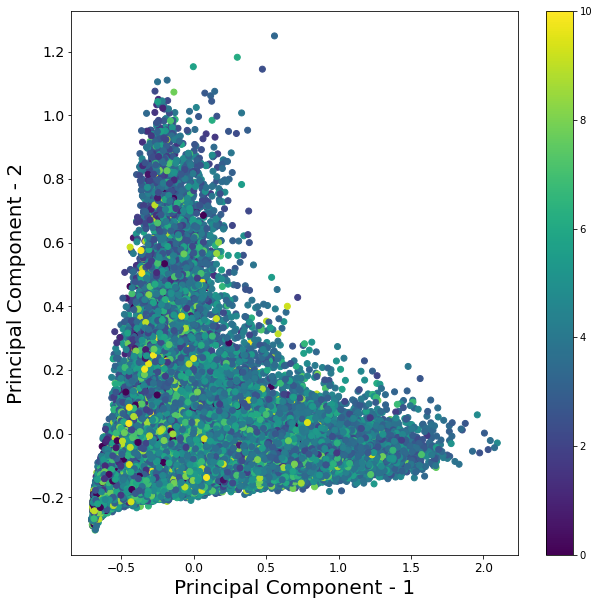

In [33]:
pca_data1 = PCA_func(df_one_yr,1,'ERA')

<Figure size 432x288 with 0 Axes>

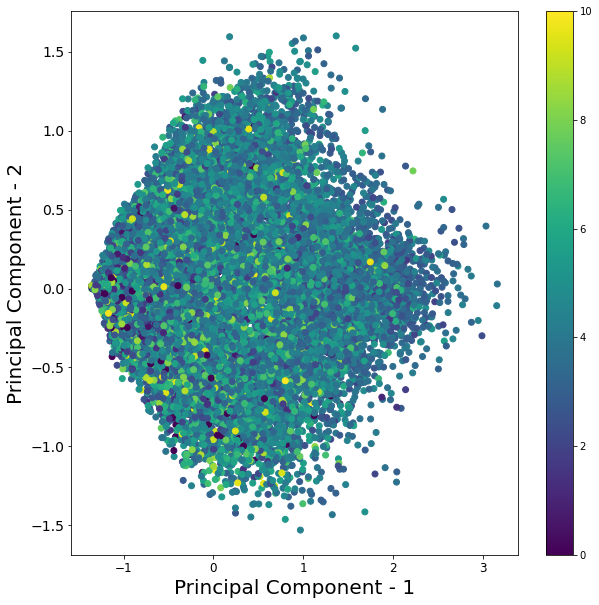

In [34]:
pca_data3 = PCA_func(df_three_yr,3,'ERA')

<Figure size 432x288 with 0 Axes>

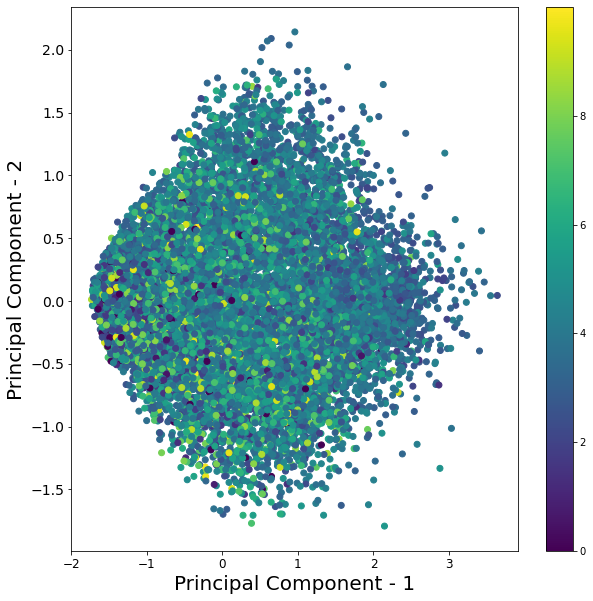

In [35]:
pca_data5 = PCA_func(df_five_yr,5,'ERA')

<Figure size 432x288 with 0 Axes>

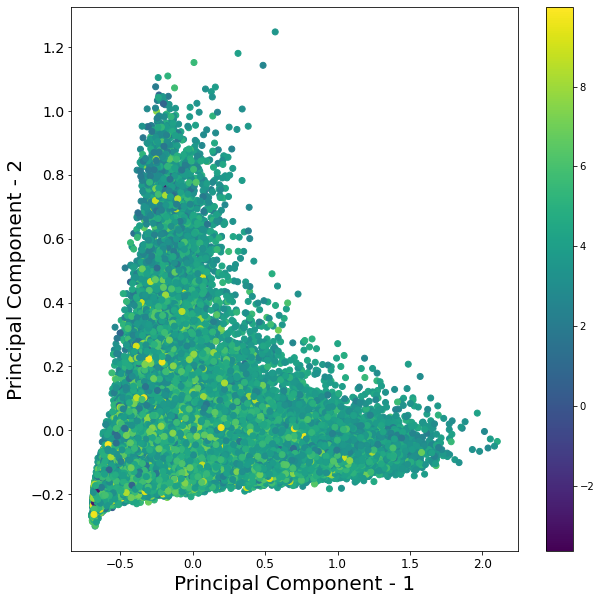

In [27]:
pca_data1 = PCA_func(df_one_yr,1,'FIP')

<Figure size 432x288 with 0 Axes>

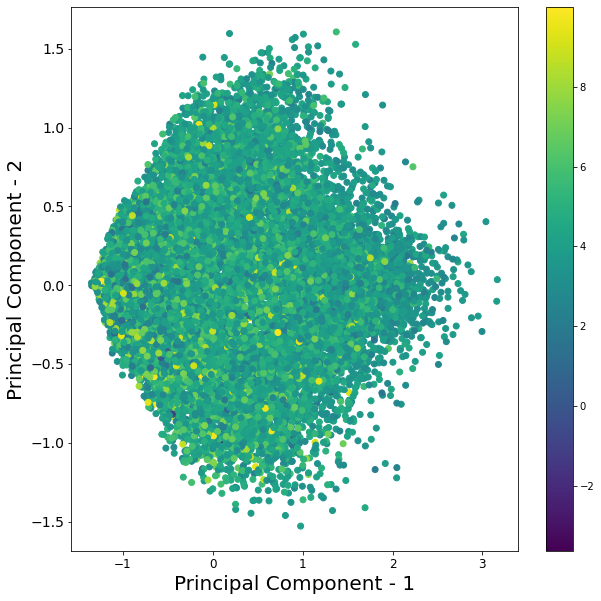

In [28]:
pca_data3= PCA_func(df_three_yr,3,'FIP')

<Figure size 432x288 with 0 Axes>

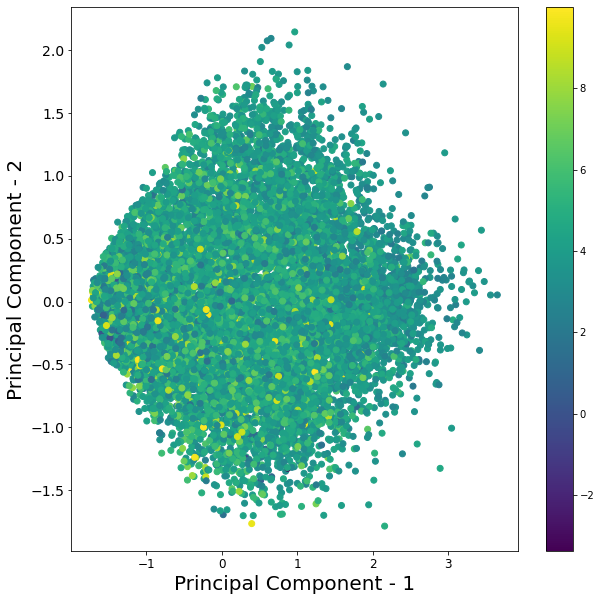

In [29]:
pca_data3= PCA_func(df_five_yr,5,'FIP')

Seeing as I found poor results with both ERA and FIP using PCA, I have only performed the TSNE analysis using FIP.

<Figure size 432x288 with 0 Axes>

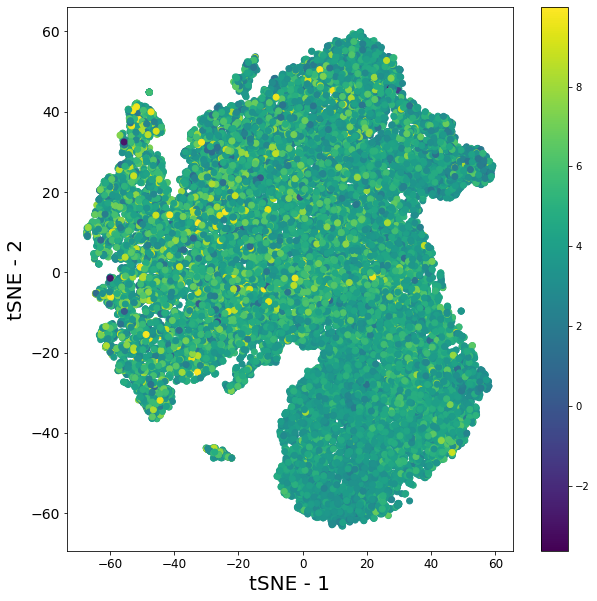

In [30]:
tsne_data1 = TSNE_func(df_one_yr,1,'FIP')

<Figure size 432x288 with 0 Axes>

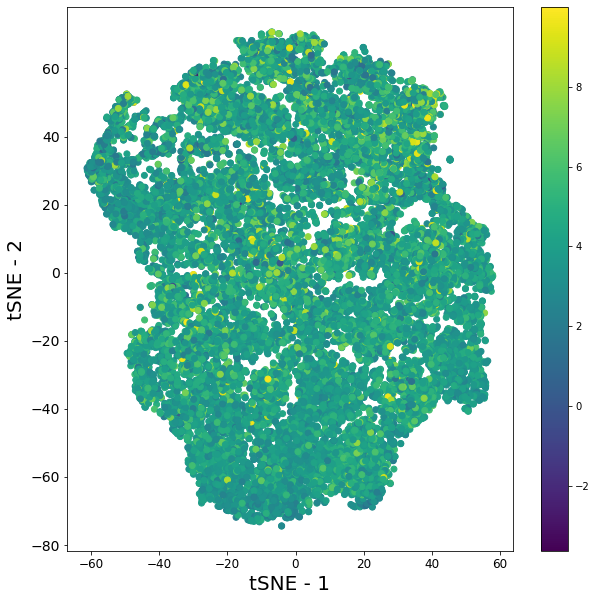

In [31]:
tsne_data3 = TSNE_func(df_three_yr,3,'FIP')

<Figure size 432x288 with 0 Axes>

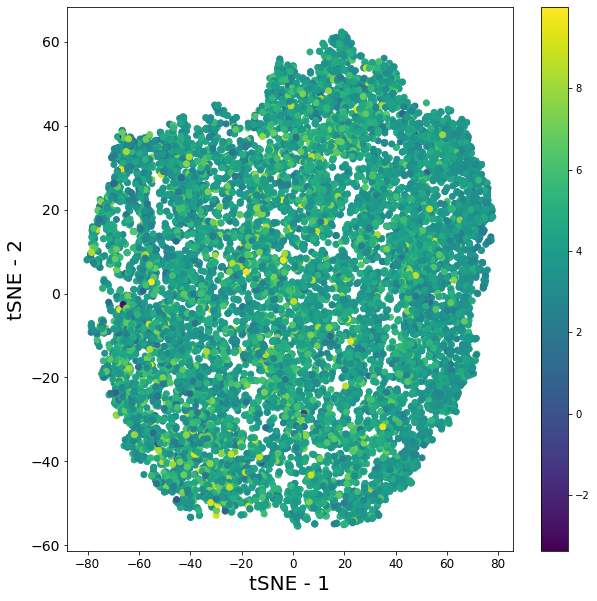

In [32]:
tsne_data5 = TSNE_func(df_five_yr,5,'FIP')

Next, I looked at 3D projections of PCA and TSNE.

In [13]:
def PCA_func3D(df,n_years,mapper):
    if n_years == 1:
        to_drop = ['playerID','yearID','teamID','teamID1','IBB','SF','SH','GIDP','Unnamed: 0']
    if n_years == 3:
        to_drop = ['playerID','yearID','teamID','teamID1','teamID2','teamID3','IBB1','IBB2','IBB3',
                   'SF1','SF2','SF3','SH1','SH2','SH3','GIDP1','GIDP2','GIDP3']
    if n_years == 5:
        to_drop = ['playerID','yearID','teamID','teamID1','teamID2','teamID3','teamID4','teamID5',
                   'IBB1','IBB2','IBB3','IBB4','IBB5',
                   'SF1','SF2','SF3','SF4','SF5',
                   'SH1','SH2','SH3','SH4','SH5',
                   'GIDP1','GIDP2','GIDP3','GIDP4','GIDP5']
        
    ## Cleaning up data formatting and scaling    
    stats_df = df.drop(to_drop,axis=1)
    stats_df.replace([np.inf, -np.inf], np.nan, inplace=True)
    stats_df.dropna;
    outputs = stats_df[['kERA','kFIP']]
    stats_df = stats_df.drop(['kERA','kFIP'],axis=1)
    
    stats = stats_df.to_numpy()
    stats = np.nan_to_num(stats)
    
    scaler = MinMaxScaler()
    scaled_data_fit =scaler.fit(stats_df)
    scaled_data = scaler.transform(stats)
    
    ## Dropping high ERA/FIP
    if mapper == 'ERA':
        rowsToDrop = np.where(outputs.kERA > 10)
        scaled_data = np.delete(scaled_data,rowsToDrop,axis=0)
        outputs = outputs = outputs.drop(outputs.index[rowsToDrop])
    if mapper == 'FIP':
        rowsToDrop = np.where(outputs.kFIP > 10)
        scaled_data = np.delete(scaled_data,rowsToDrop,axis=0)
        outputs = outputs = outputs.drop(outputs.index[rowsToDrop])
        
    ## Performing PCA    
    pca = PCA(n_components=3)
    pca_data = pca.fit_transform(scaled_data)

    pca_df = pd.DataFrame(data=pca_data,columns=['pc1','pc2','pc3'])
    
    # Plotting
    f = plt.figure(figsize=(10,10))
    ax = f.add_subplot(projection='3d')
    ax.set_xlabel('Principal Component - 1')
    ax.set_ylabel('Principal Component - 2')
    ax.set_zlabel('Principal Component - 3')
    if mapper == 'ERA':
        sc = ax.scatter(pca_df['pc1'],pca_df['pc2'],pca_df['pc3'],c=outputs.kERA,cmap='viridis');
        plt.colorbar(sc)
        plt.show()
    if mapper == 'FIP':
        sc = ax.scatter(pca_df['pc1'],pca_df['pc2'],pca_df['pc3'],c=outputs.kFIP,cmap='viridis');
        plt.colorbar(sc)
        plt.show()     
    return pca_data

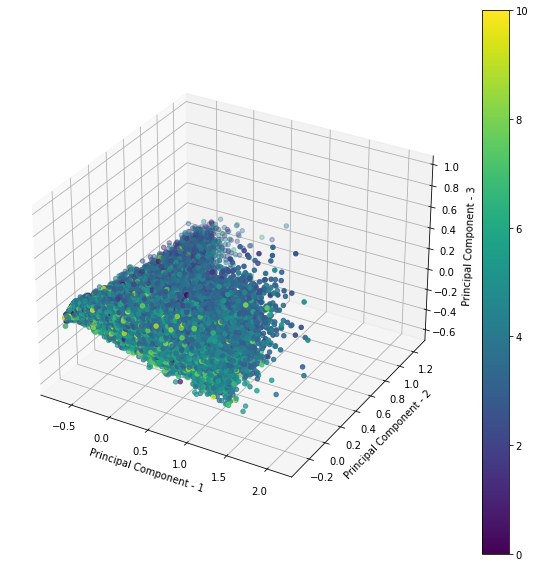

In [14]:
pca_data1 = PCA_func3D(df_one_yr,1,'ERA')

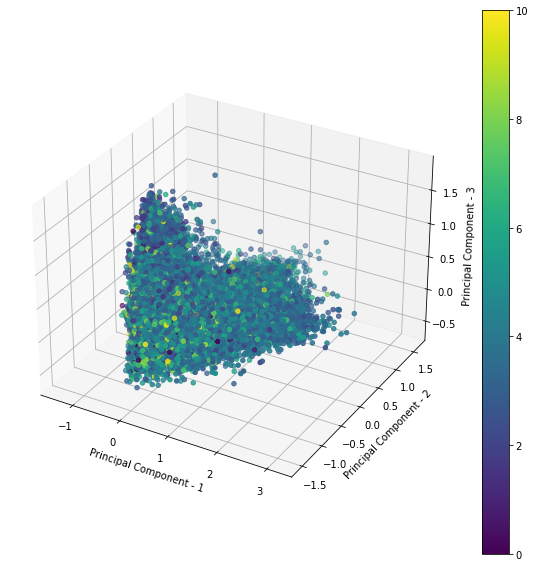

In [15]:
pca_data3 = PCA_func3D(df_three_yr,3,'ERA')

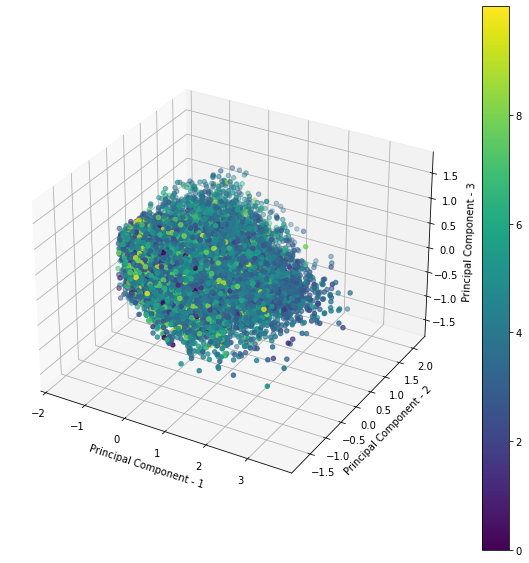

In [16]:
pca_data5 = PCA_func3D(df_five_yr,5,'ERA')

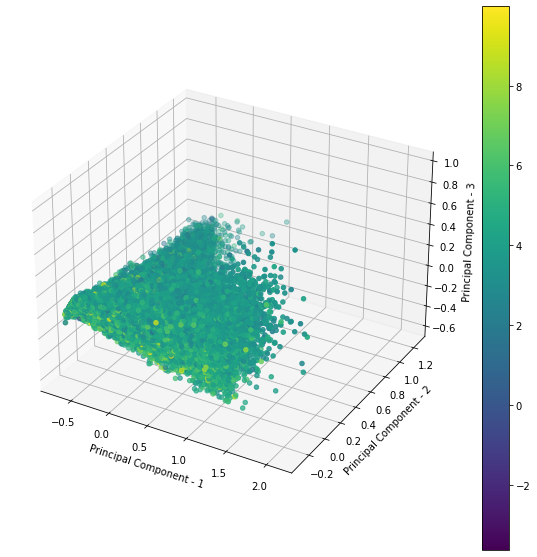

In [17]:
pca_data1 = PCA_func3D(df_one_yr,1,'FIP')

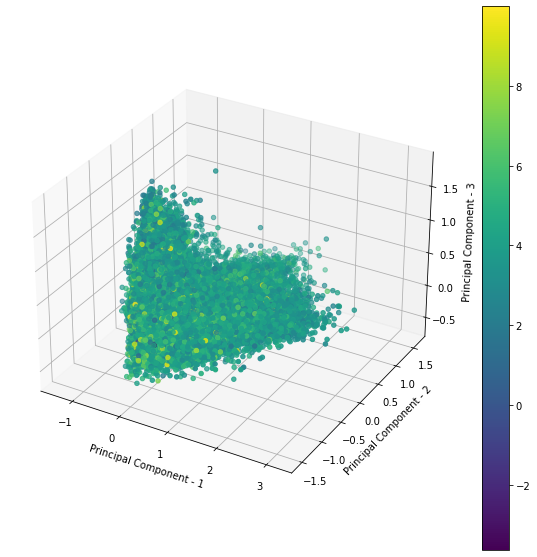

In [18]:
pca_data1 = PCA_func3D(df_three_yr,3,'FIP')

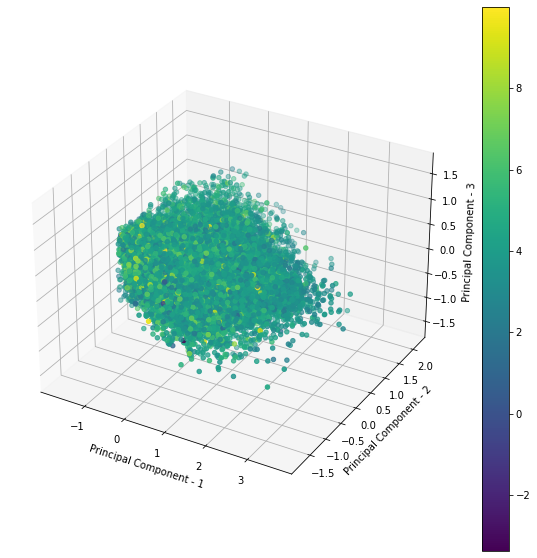

In [19]:
pca_data5 = PCA_func3D(df_five_yr,5,'FIP')

In [21]:
def TSNE_func3D(df,n_years,mapper):
    if n_years == 1:
        to_drop = ['playerID','yearID','teamID','teamID1','IBB','SF','SH','GIDP','Unnamed: 0']
    if n_years == 3:
        to_drop = ['playerID','yearID','teamID','teamID1','teamID2','teamID3','IBB1','IBB2','IBB3',
                   'SF1','SF2','SF3','SH1','SH2','SH3','GIDP1','GIDP2','GIDP3']
    if n_years == 5:
        to_drop = ['playerID','yearID','teamID','teamID1','teamID2','teamID3','teamID4','teamID5',
                   'IBB1','IBB2','IBB3','IBB4','IBB5',
                   'SF1','SF2','SF3','SF4','SF5',
                   'SH1','SH2','SH3','SH4','SH5',
                   'GIDP1','GIDP2','GIDP3','GIDP4','GIDP5']
        
    ## Cleaning up data formatting and scaling    
    stats_df = df.drop(to_drop,axis=1)
    stats_df.replace([np.inf, -np.inf], np.nan, inplace=True)
    stats_df.dropna;
    outputs = stats_df[['kERA','kFIP']]
    stats_df = stats_df.drop(['kERA','kFIP'],axis=1)
    
    stats = stats_df.to_numpy()
    stats = np.nan_to_num(stats)
    
    scaler = MinMaxScaler()
    scaled_data_fit =scaler.fit(stats_df)
    scaled_data = scaler.transform(stats)
    
    ## Dropping high ERA/FIP
    if mapper == 'ERA':
        rowsToDrop = np.where(outputs.kERA > 10)
        scaled_data = np.delete(scaled_data,rowsToDrop,axis=0)
        outputs = outputs = outputs.drop(outputs.index[rowsToDrop])
    if mapper == 'FIP':
        rowsToDrop = np.where(outputs.kFIP > 10)
        scaled_data = np.delete(scaled_data,rowsToDrop,axis=0)
        outputs = outputs = outputs.drop(outputs.index[rowsToDrop])
        
    ## Performing PCA    
    tsne = TSNE(n_components=3)
    tsne_data = tsne.fit_transform(scaled_data)
    
    tsne_df = pd.DataFrame(data=tsne_data,columns=['tsne1','tsne2','tnse3'])
    
    # Plotting
    f = plt.figure(figsize=(10,10))
    ax = f.add_subplot(projection='3d')
    ax.set_xlabel('tSNE - 1')
    ax.set_ylabel('tSNE - 2')
    ax.set_zlabel('tSNE - 3')
    if mapper == 'ERA':
        sc = ax.scatter(tsne_df['tsne1'],tsne_df['tsne2'],tsne_df['tsne3'],c=outputs.kERA,cmap='viridis');
        plt.colorbar(sc)
        plt.show()
    if mapper == 'FIP':
        sc = ax.scatter(tsne_df['tsne1'],tsne_df['tsne2'],tsne_df['tsne3'],c=outputs.kFIP,cmap='viridis');
        plt.colorbar(sc)
        plt.show()     
    return tsne_data

From all of the PCA and TSNE results, we cannot see visually any clear pattern in the results with regards to ERA or FIP.

## Simplest Model Attempt -- Regression

In [37]:
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error

In [12]:
df_one_yr = pd.read_csv('one_previous_yr.csv')
df_three_yr = pd.read_csv('three_previous_yr.csv')
df_five_yr = pd.read_csv('five_previous_yr.csv')

We will first load all our datasets and apply both ridge and lasso regression to them.

In [38]:
## This function takes a dataset and transforms it into two arrays -- an output array containing ERA and FIP data,
## and the stats from the years in question.

def input_output(df,n_years):
    if n_years == 1:
        to_drop = ['playerID','yearID','teamID','teamID1','IBB','SF','SH','GIDP','Unnamed: 0']
    if n_years == 3:
        to_drop = ['playerID','yearID','teamID','teamID1','teamID2','teamID3','IBB1','IBB2','IBB3',
                   'SF1','SF2','SF3','SH1','SH2','SH3','GIDP1','GIDP2','GIDP3','Unnamed: 0']
    if n_years == 5:
        to_drop = ['playerID','yearID','teamID','teamID1','teamID2','teamID3','teamID4','teamID5',
                   'IBB1','IBB2','IBB3','IBB4','IBB5',
                   'SF1','SF2','SF3','SF4','SF5',
                   'SH1','SH2','SH3','SH4','SH5',
                   'GIDP1','GIDP2','GIDP3','GIDP4','GIDP5','Unnamed: 0']
    stats_df = df.drop(to_drop,axis=1)
    stats_df.replace([np.inf, -np.inf], np.nan, inplace=True)
    stats_df.dropna;
    outputs = stats_df[['kERA','kFIP']]
    stats_df = stats_df.drop(['kERA','kFIP'],axis=1)
    
    stats = stats_df.to_numpy()
    stats = np.nan_to_num(stats)
    
    outputs = outputs.to_numpy()
    outputs = np.nan_to_num(outputs)
    
    return stats,outputs

In [39]:
## This function shuffles both the stats and outputs array along their rows the same way.

def shuffler(a,b):
    n_rows = a.shape[0]
    n_a_col = a.shape[1]
    n_b_col = b.shape[1]
    
    index = np.arange(0,n_rows,1)
    np.random.shuffle(index)
    a_new = np.zeros([n_rows,n_a_col])
    b_new = np.zeros([n_rows,n_b_col])
    
    for i in range(0,n_rows,1):
        j = index[i]
        a_new[i] = a[j]
        b_new[i] = b[j]
    
    return a_new,b_new

In [40]:
## First, we split into training, validation, and testing data

def train_validate_test(df,n_years):
    
    stats,outputs = input_output(df,n_years)
    
    stats,outputs = shuffler(stats,outputs)
    
    num_data = stats.shape[0]
    n_samples_train = round(0.5*num_data)
    n_samples_validate = round(0.25*num_data) + n_samples_train
    X_train, X_val, X_test = stats[:n_samples_train], stats[n_samples_train:n_samples_validate], stats[n_samples_validate:]
    y_train, y_val, y_test = outputs[:n_samples_train], outputs[n_samples_train:n_samples_validate], outputs[n_samples_validate:]
    
    if len(X_val) != len(X_test):
        X_test = X_test[0:len(X_test)-1]
        y_test = y_test[0:len(y_test)-1]
    return X_train, y_train, X_val, y_val, X_test, y_test

In [41]:
X_train, y_train, X_val, y_val, X_test,y_test = train_validate_test(df_three_yr,3)
print(len(X_train))
print(len(X_val))
print(len(X_test))

11468
5734
5734


In [42]:
## Ridge Regression function

def ridge_optimization(X_train,y_train,X_val,y_val,a_min,a_max,output_stat,do_plot):
    
    # Picking our output stat
    if output_stat == 'ERA':
        y_train,y_val = y_train[:,0],y_val[:,0]
    if output_stat == 'FIP':
        y_train,y_val = y_train[:,1],y_val[:,1]

    n_alphas = 25*(a_max - a_min)
    alphas = np.logspace(a_min,a_max,n_alphas)
    coefs = []
    mse = []
    r2 = []
    
    # Iterating over alpha values to find ideal value to minimize R2 score
    for a in alphas:
        ridge = Ridge(alpha=a,fit_intercept=True)
        ridge_fit = ridge.fit(X_train,y_train)
        y_pred = ridge_fit.predict(X_val)
        r2_score = ridge_fit.score(X_val,y_val)
        error = mean_squared_error(y_val,y_pred)
        mse.append(error)
        coefs.append(ridge.coef_)
        r2.append(r2_score)
    
    # Finding best alpha
    min_mse = np.min(mse)
    min_alpha = np.where(mse == min_mse)
    min_alpha = alphas[min_alpha]
    
    # Plotting
    if do_plot == 1:
        ax1 = plt.gca()
        ax1.plot(alphas,coefs)
        ax1.set_xscale('log')
        ax1.set_xlim(ax1.get_xlim()[::-1])
        plt.xlabel('Regularization strength')
        plt.ylabel('Coeffecient magnitudes')
        plt.title('Ridge coefficients as a function of the regularization')
        plt.axis('tight')
        plt.show()
    
        ax2 = plt.gca()
        ax2.plot(alphas,mse)
        ax2.set_xscale('log')
        ax2.set_xlim(ax2.get_xlim()[::-1])
        plt.xlabel('Regularization strength')
        plt.ylabel('MSE')
        plt.title('Mean-squared error of fits of validation data')
        plt.axis('tight')
        plt.show()
    
        ax3= plt.gca()
        ax3.plot(alphas,r2)
        ax3.set_xscale('log')
        ax3.set_xlim(ax3.get_xlim()[::-1])
        plt.xlabel('Regularization strength')
        plt.ylabel('R2 Score')
        plt.title('R2 score of fits of validaton data')
        plt.axis('tight')
        plt.show()
    
    return min_alpha

In [43]:
## Lasso Regression Function

def lasso_optimization(X_train,y_train,X_val,y_val,a_min,a_max,output_stat,do_plot):
    
    # Picking output stat
    if output_stat == 'ERA':
        y_train,y_val = y_train[:,0],y_val[:,0]
    if output_stat == 'FIP':
        y_train,y_val = y_train[:,1],y_val[:,1]

    n_alphas = 25*(a_max - a_min)
    alphas = np.logspace(a_min,a_max,n_alphas)
    coefs = []
    mse = []
    r2 = []
    
    # iterating over alphas with validation data
    for a in alphas:
        lasso = Lasso(alpha=a,fit_intercept=True)
        lasso_fit = lasso.fit(X_train,y_train)
        y_pred = lasso_fit.predict(X_val)
        r2_score = lasso_fit.score(X_val,y_val)
        error = mean_squared_error(y_val,y_pred)
        mse.append(error)
        coefs.append(lasso.coef_)
        r2.append(r2_score)
    
    # finding best alpha
    min_mse = np.min(mse)
    min_alpha = np.where(mse == min_mse)
    min_alpha = alphas[min_alpha]
    
    # Plotting
    if do_plot == 1:
        ax1 = plt.gca()
        ax1.plot(alphas,coefs)
        ax1.set_xscale('log')
        ax1.set_xlim(ax1.get_xlim()[::-1])
        plt.xlabel('Regularization strength')
        plt.ylabel('Coeffecient magnitudes')
        plt.title('Lasso coefficients as a function of the regularization')
        plt.axis('tight')
        plt.show()
    
        ax2 = plt.gca()
        ax2.plot(alphas,mse)
        ax2.set_xscale('log')
        ax2.set_xlim(ax2.get_xlim()[::-1])
        plt.xlabel('Regularization strength')
        plt.ylabel('MSE')
        plt.title('Mean-squared error of fits of validation data')
        plt.axis('tight')
        plt.show()
    
        ax3= plt.gca()
        ax3.plot(alphas,r2)
        ax3.set_xscale('log')
        ax3.set_xlim(ax3.get_xlim()[::-1])
        plt.xlabel('Regularization strength')
        plt.ylabel('R2 Score')
        plt.title('R2 score of fits of validaton data')
        plt.axis('tight')
        plt.show()
    
    return min_alpha

In [44]:
## This is a utility function to simply pick regularization type

def regularization_optimization(X_train,y_train,X_val,y_val,a_min,a_max,regType,outputStat,do_plot):
      
    if regType == 'ridge':
        min_alpha = ridge_optimization(X_train,y_train,X_val,y_val,a_min,a_max,outputStat,do_plot)
        print('The optimal regularization strength is:')
        print(min_alpha)
        
    if regType == 'lasso':
        min_alpha = lasso_optimization(X_train,y_train,X_val,y_val,a_min,a_max,outputStat,do_plot)
        print('The optimal regularization strength is:')
        print(min_alpha)
        
    return min_alpha

In [45]:
## This function takes our training data, validation data, and testing data. It firstoptimizes the hyperparameters using the 
## above functions, then applies the optimized model to the test data. It outputs both the test outputs and the model outputs.

def regularization_prediction(X_train,y_train,X_val,y_val,X_test,y_test,a_max,a_min,regType,outputStat,n_years,do_plot):
    
    ## Finding ideal alpha
    min_alpha = regularization_optimization(X_train,y_train,X_val,y_val,a_max,a_min,regType,outputStat,do_plot)
    
    
    ## Picking output stat
    if outputStat == 'ERA':
        y_train,y_val,y_test = y_train[:,0],y_val[:,0],y_test[:,0]
    if outputStat == 'FIP':
        y_train,y_val,y_test = y_train[:,1],y_val[:,1],y_test[:,0]
    
    ## Building model
    
    if regType == 'ridge':
        ridge = Ridge(alpha=min_alpha,fit_intercept=True)
        ridge_fit = ridge.fit(X_train,y_train)
        y_pred = ridge_fit.predict(X_test)
        
    if regType == 'lasso':
        lasso = Lasso(alpha=min_alpha,fit_intercept=True)
        lasso_fit = lasso.fit(X_train,y_train)
        y_pred = lasso_fit.predict(X_test)   
        
    residuals = y_pred - y_test
    per_error = np.divide((y_pred - y_test),y_test)
    avg_abs_error = np.mean(residuals)
    avg_per_error = np.mean(per_error)
    
    #precursor = {'ERA':y_test,'pERA':y_pred,'residual':residuals,'per_error':per_error}
    #reg_df = pd.DataFrame(precursor,columns=['ERA','pERA','residual','per_error'])
    
    x_line = np.arange(0,20,0.1)
    y_line = x_line
    
    f = plt.figure()
    f.set_figwidth(15) 
    f.set_figheight(10) 
    plt.scatter(y_test,y_pred)
    plt.plot(x_line,y_line,ls=('dashed'))
    plt.title('Regression with ' + regType + ' for ' + str(n_years) + ' years of data')
    plt.xlabel('Real ' + outputStat)
    plt.ylabel('Predicted ' + outputStat)
    plt.xlim([0,10])
    plt.ylim([0,10])
    
    return y_pred,y_test

In [46]:
## These are just utilities to plot the residuals and a histogram of them

def residual_plotter(x,y):
    
    res = y - x
    
    
    plt.figure(figsize=(11,4))
    plt.subplot(121)
    plt.scatter(x,res,s=0.1)
    plt.xlabel('Known')
    plt.ylabel('Residual')
    plt.xlim([0,10])
    plt.subplot(122)
    plt.scatter(x,abs(res),s=0.1)
    plt.xlabel('Known')
    plt.ylabel('Log Residual')
    plt.xlim([0,10])
    plt.yscale('log')
    plt.subplots_adjust(wspace=0.02, hspace=0.3, top=1, bottom=0.1, left=0, right=1)
    plt.show()
    
    return res

def residual_histogram(res):
    
    res = abs(res)
    rbins = np.arange(0,20,0.1)
    
    f = plt.figure()
    f.set_figwidth(15) 
    f.set_figheight(10)
    plt.hist(res,bins=rbins)
    plt.xlim([0,20])
    plt.xlabel('Absolute Error')

In [48]:
## This function takes all the above functions and combines them into one callable function.

def regression_program(df,n_years,regType,outputStat):
    X_train, y_train, X_val, y_val, X_test,y_test = train_validate_test(df,n_years)
    y_pred, y_test = regularization_prediction(X_train, y_train, X_val, y_val, X_test,y_test,-3,7,regType,outputStat,n_years,0)
    res = residual_plotter(y_test,y_pred)
    residual_histogram(res)
    test_res = abs(res)
    lt1 = len(np.where(test_res < 1)[0])/len(res)
    mae = np.mean(test_res)
    std = np.std(res)
    print('Percent of error less than one run: ' + str(lt1))
    print('Mean Absolute Error: ' + str(mae))
    print('Standard Deviation: ' + str(std))
    
    return lt1,mae,std

## Ridge

The optimal regularization strength is:
[32362.35820856]


<ipython-input-45-4c4e3abdad81>:26: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


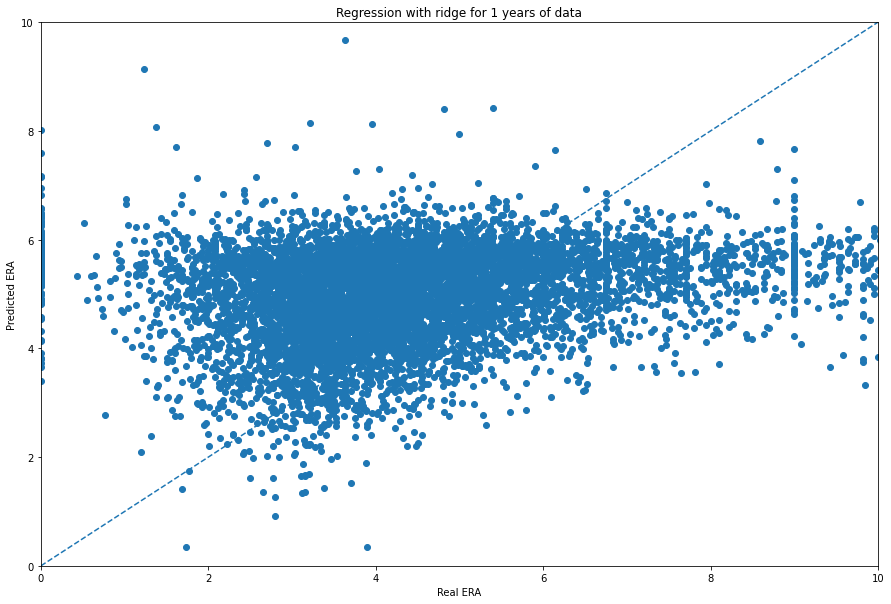

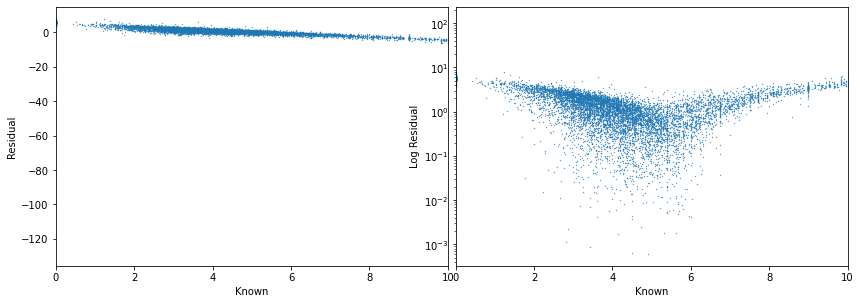

Percent of error less than one run: 0.40393738140417457
Mean Absolute Error: 2.0151638521907085
Standard Deviation: 4.712854723286385


(0.40393738140417457, 2.0151638521907085, 4.712854723286385)

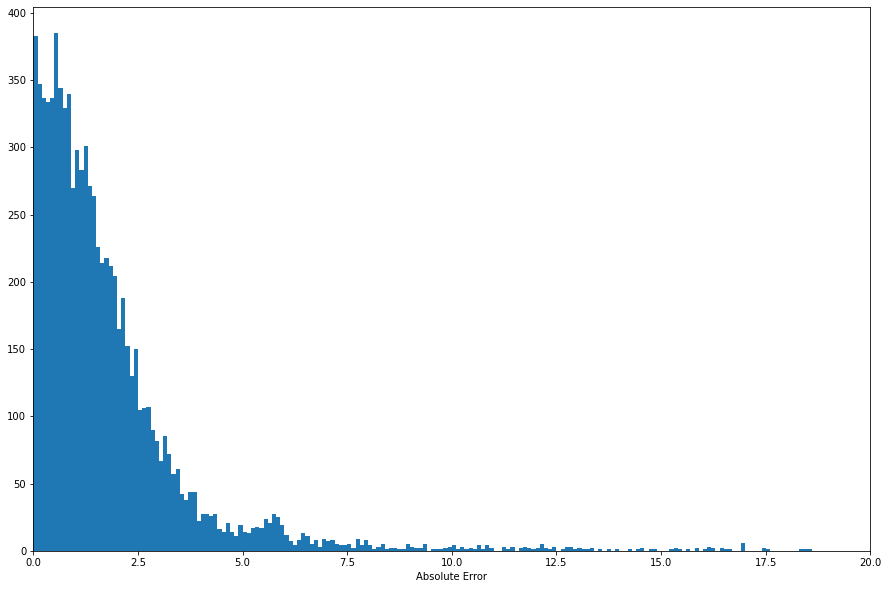

In [49]:
regression_program(df_one_yr,1,'ridge','ERA')

The optimal regularization strength is:
[24522.13239919]


<ipython-input-20-4c4e3abdad81>:26: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


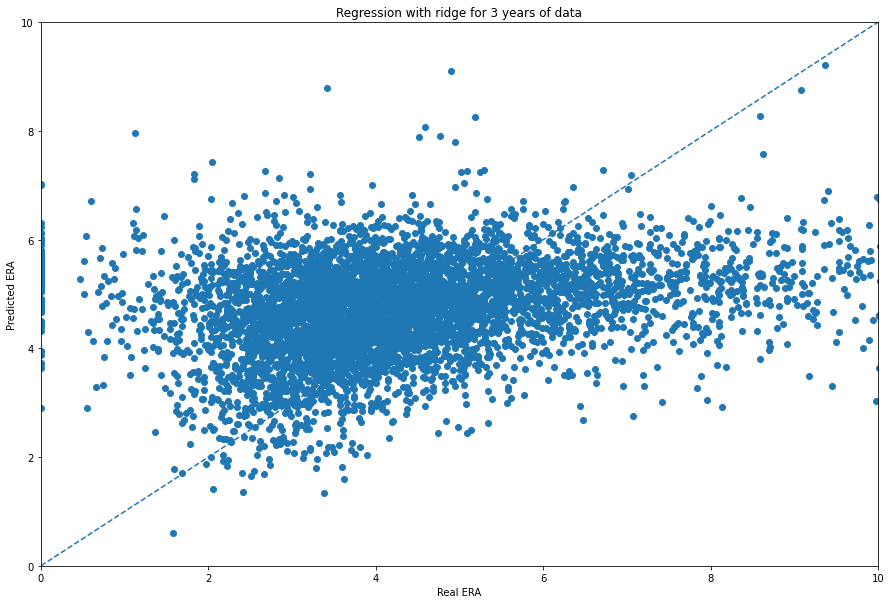

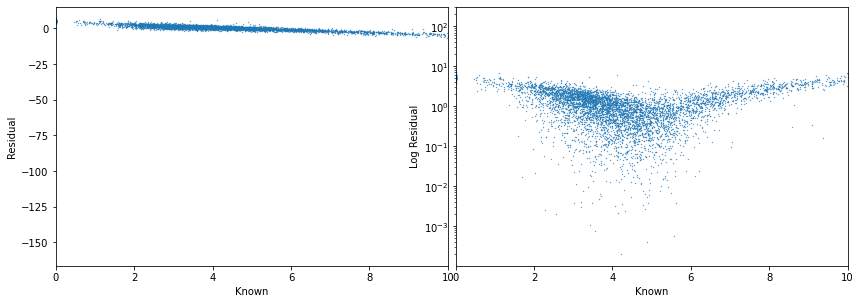

Percent of error less than one run: 0.4420997558423439


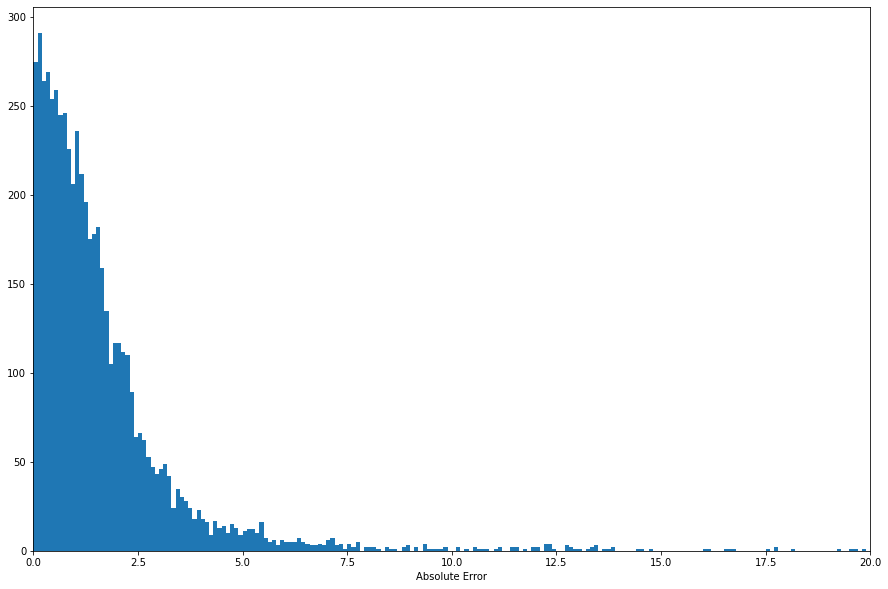

In [53]:
regression_program(df_three_yr,3,'ridge','ERA')

The optimal regularization strength is:
[2429.64134136]


<ipython-input-20-4c4e3abdad81>:26: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


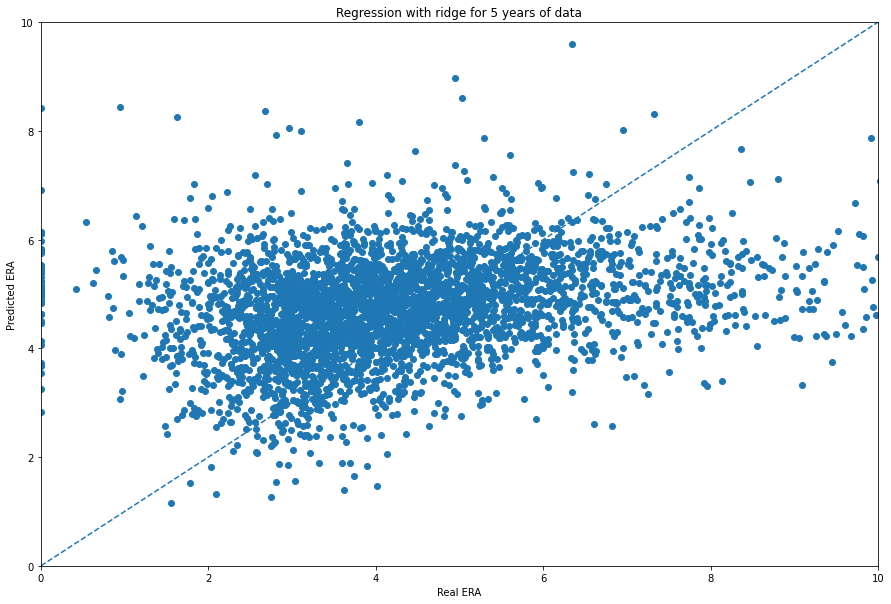

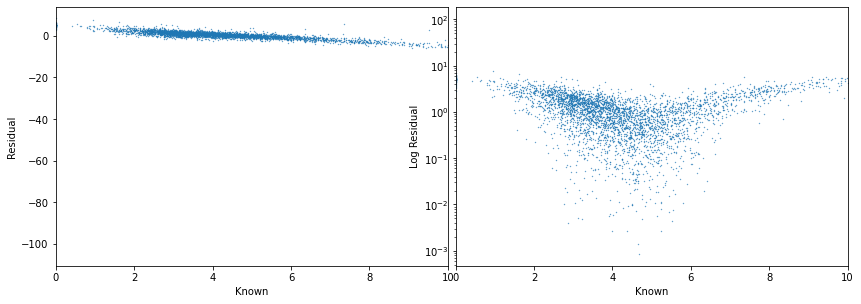

Percent of error less than one run: 0.45058286872782566


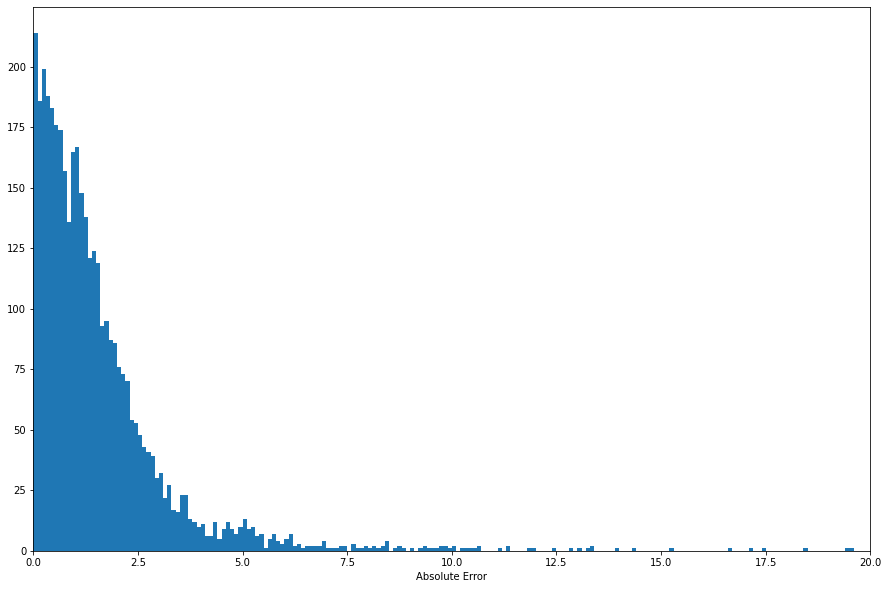

In [54]:
regression_program(df_five_yr,5,'ridge','ERA')

The optimal regularization strength is:
[42709.26409539]


<ipython-input-20-4c4e3abdad81>:26: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


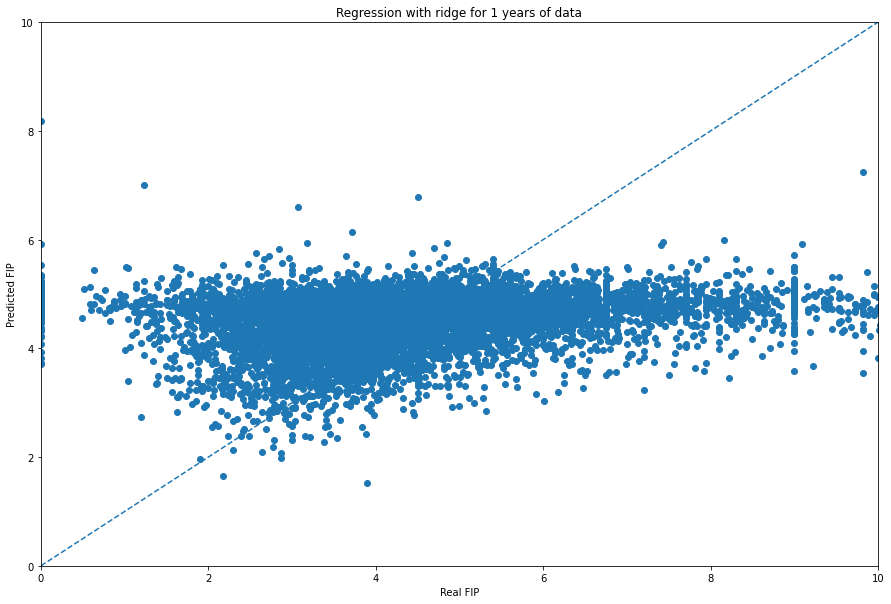

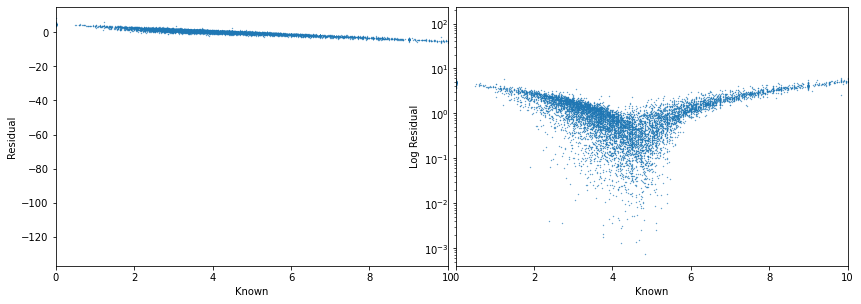

Percent of error less than one run: 0.49217267552182165


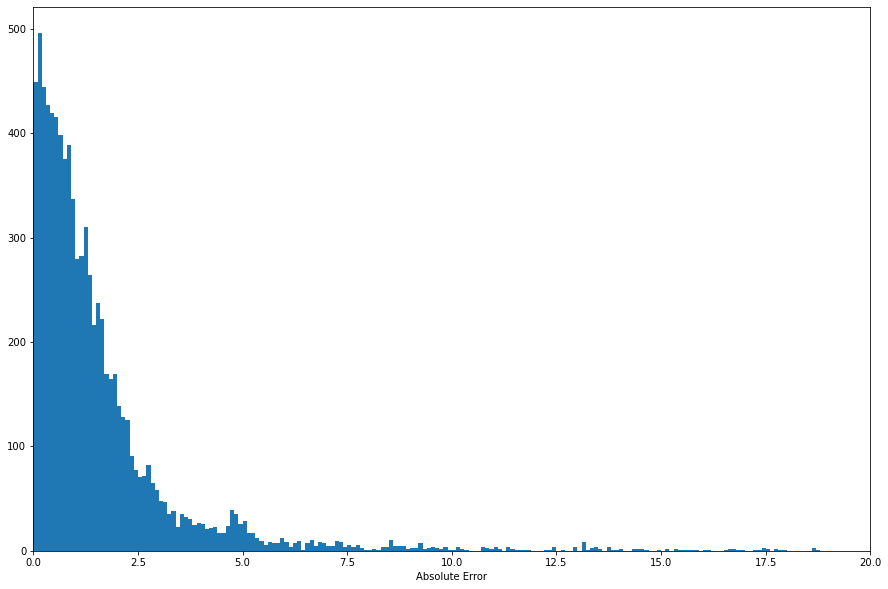

In [56]:
regression_program(df_one_yr,1,'ridge','FIP')

The optimal regularization strength is:
[16940.08802288]


<ipython-input-20-4c4e3abdad81>:26: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


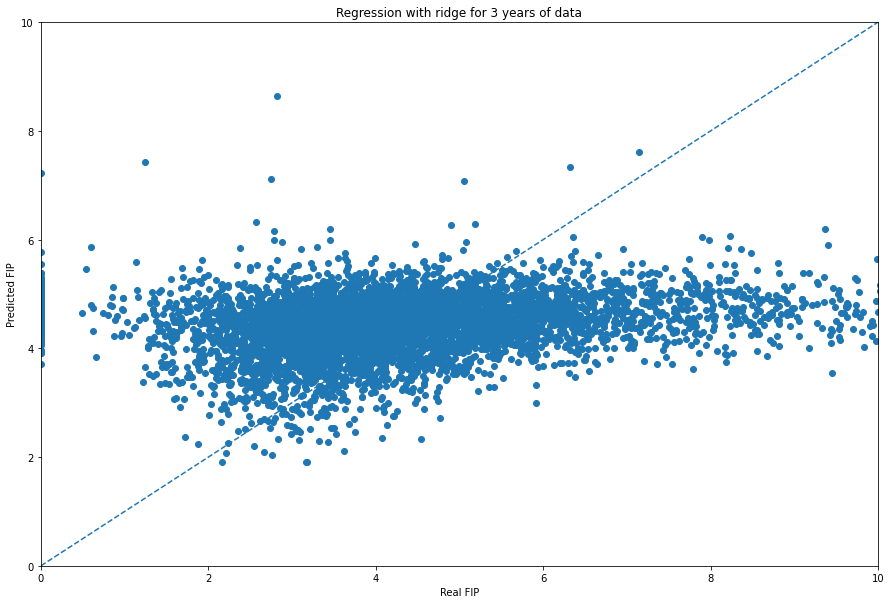

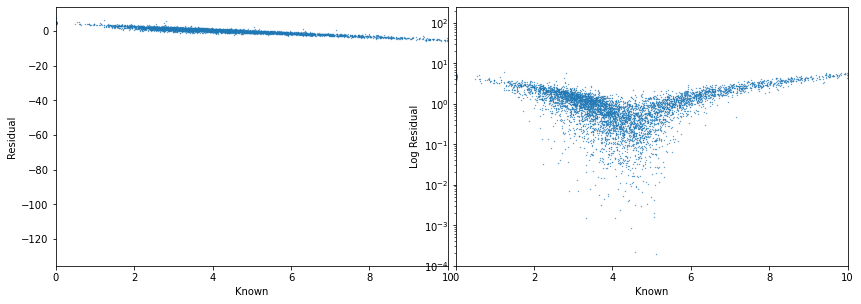

Percent of error less than one run: 0.4865713289152424


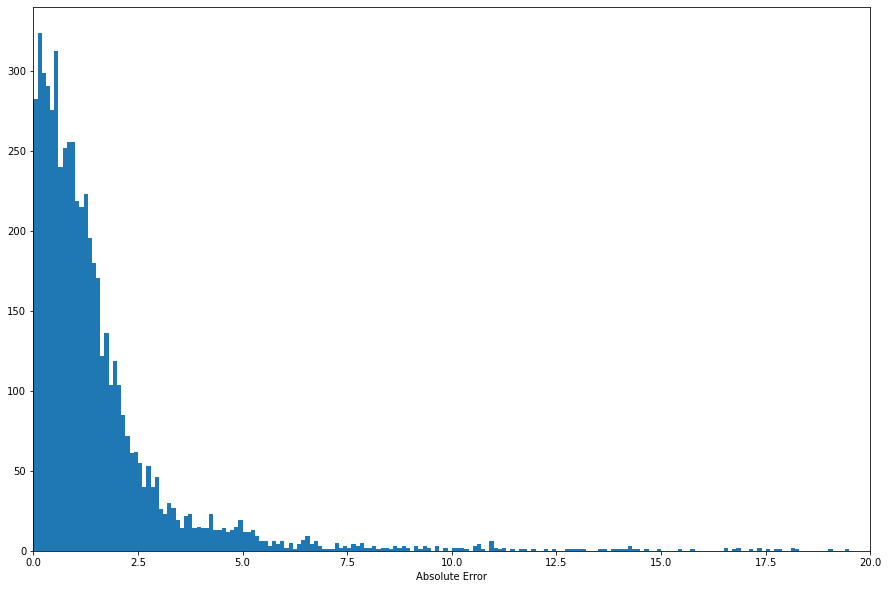

In [57]:
regression_program(df_three_yr,3,'ridge','FIP')

The optimal regularization strength is:
[1678.41595163]


<ipython-input-20-4c4e3abdad81>:26: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


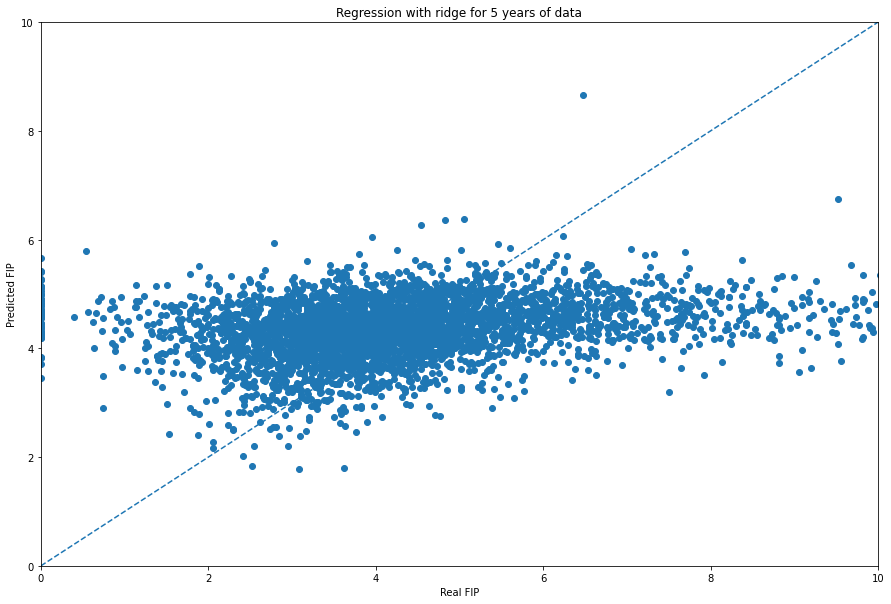

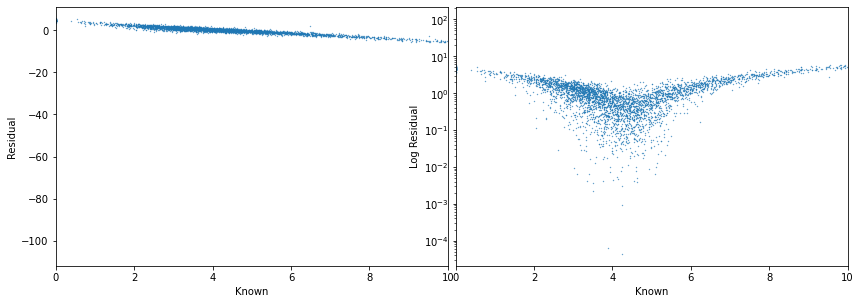

Percent of error less than one run: 0.5114039533705018


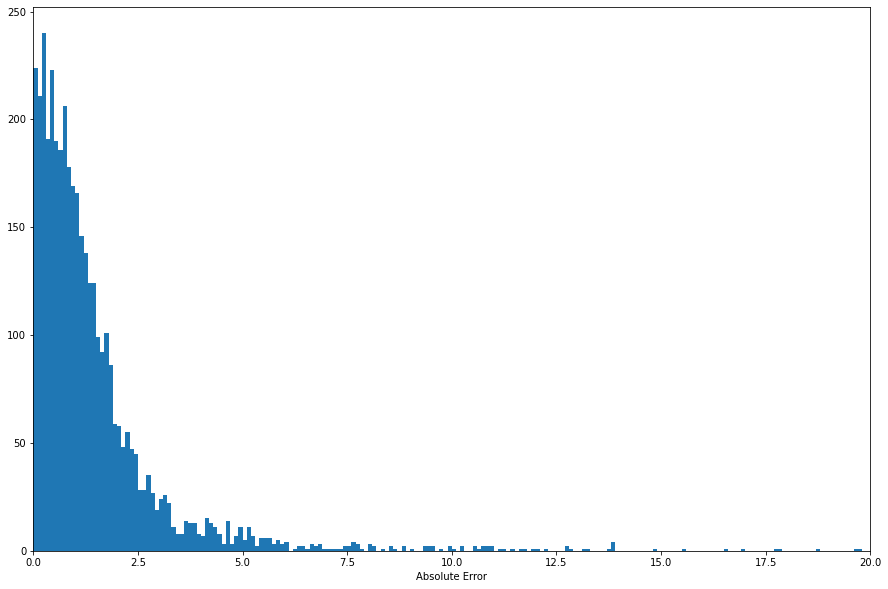

In [58]:
regression_program(df_five_yr,5,'ridge','FIP')

## Lasso

C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 205312.2566713899, tolerance: 43.93518361861608
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 204605.64920218984, tolerance: 43.93518361861608
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 203837.37087365112, tolerance: 43.93518361861608
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarn

C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 147185.5132825675, tolerance: 43.93518361861608
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 143464.2098727179, tolerance: 43.93518361861608
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 139681.60277325578, tolerance: 43.93518361861608
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarni

C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 104.05668546044035, tolerance: 43.93518361861608
  model = cd_fast.enet_coordinate_descent(


The optimal regularization strength is:
[0.01602578]


C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 139681.60277325578, tolerance: 43.93518361861608
  model = cd_fast.enet_coordinate_descent(
<ipython-input-20-4c4e3abdad81>:26: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


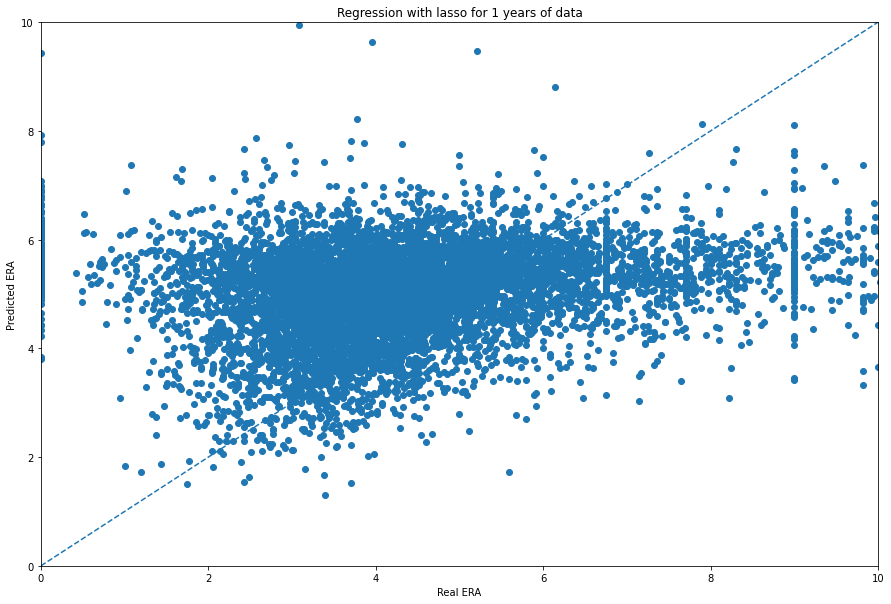

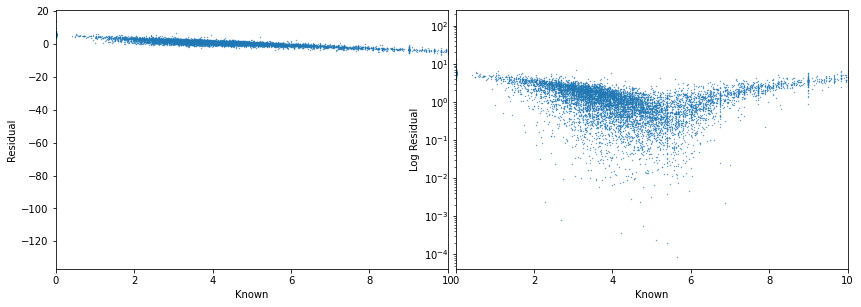

Percent of error less than one run: 0.40524193548387094


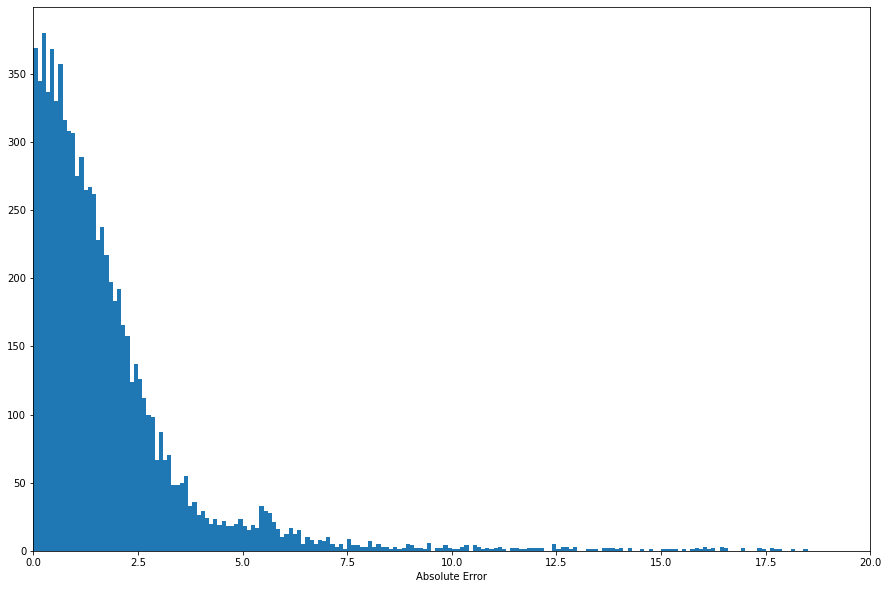

In [59]:
regression_program(df_one_yr,1,'lasso','ERA')

C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 104658.01055644195, tolerance: 22.230030253228833
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 104508.10562627521, tolerance: 22.230030253228833
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 104345.38936214714, tolerance: 22.230030253228833
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: Convergence

C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 88662.09990691685, tolerance: 22.230030253228833
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 87258.05061198132, tolerance: 22.230030253228833
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 85770.72696521871, tolerance: 22.230030253228833
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWar

C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12126.373588633898, tolerance: 22.230030253228833
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10502.458012000221, tolerance: 22.230030253228833
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9050.412698264874, tolerance: 22.230030253228833
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceW

The optimal regularization strength is:
[0.06415476]


C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 36114.3762614517, tolerance: 22.230030253228833
  model = cd_fast.enet_coordinate_descent(
<ipython-input-68-4c4e3abdad81>:26: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


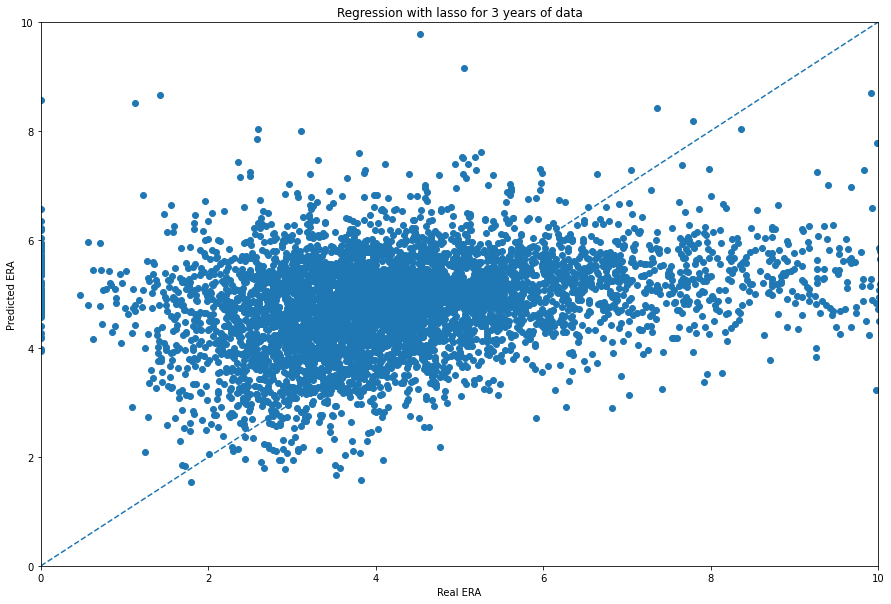

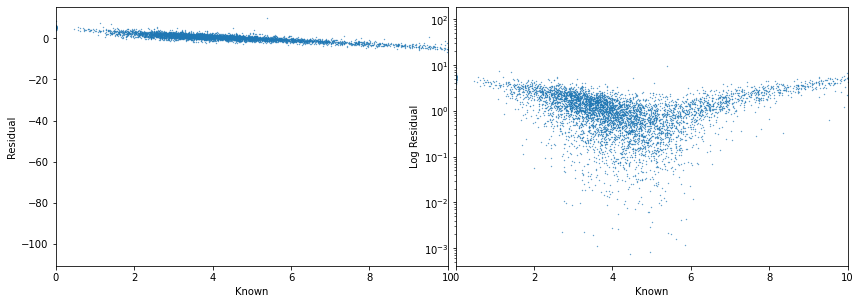

Percent of error less than one run: 0.4396581792814789


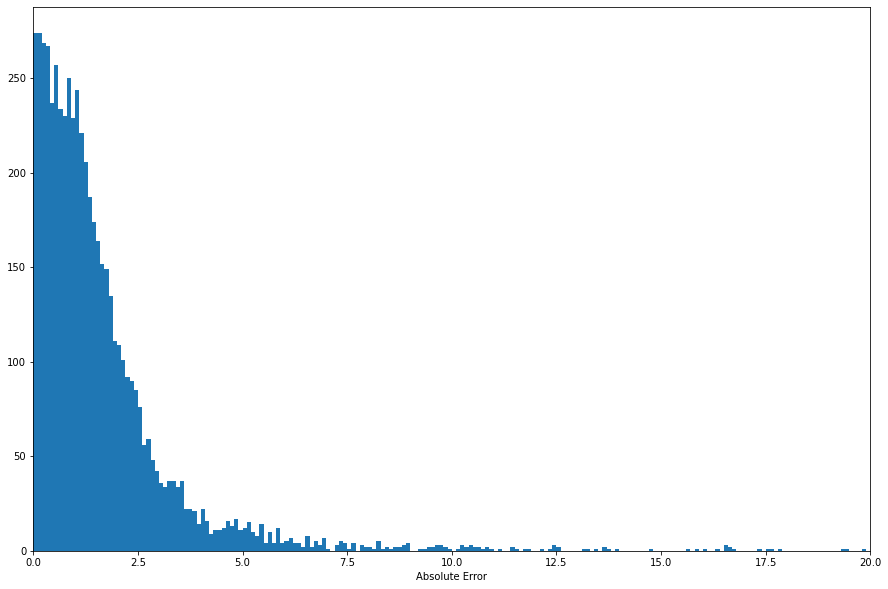

In [71]:
regression_program(df_three_yr,3,'lasso','ERA')

C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 68896.6351027784, tolerance: 14.742957226359172
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 68814.0172570282, tolerance: 14.742957226359172
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 68724.61719633239, tolerance: 14.742957226359172
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarni

C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 59169.35761296171, tolerance: 14.742957226359172
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 58234.23549170016, tolerance: 14.742957226359172
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 57228.85906891452, tolerance: 14.742957226359172
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWar

C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4744.50217957134, tolerance: 14.742957226359172
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4439.171072819692, tolerance: 14.742957226359172
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3817.636109901854, tolerance: 14.742957226359172
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarn

The optimal regularization strength is:
[0.21346038]


C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3817.636109901854, tolerance: 14.742957226359172
  model = cd_fast.enet_coordinate_descent(
<ipython-input-68-4c4e3abdad81>:26: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


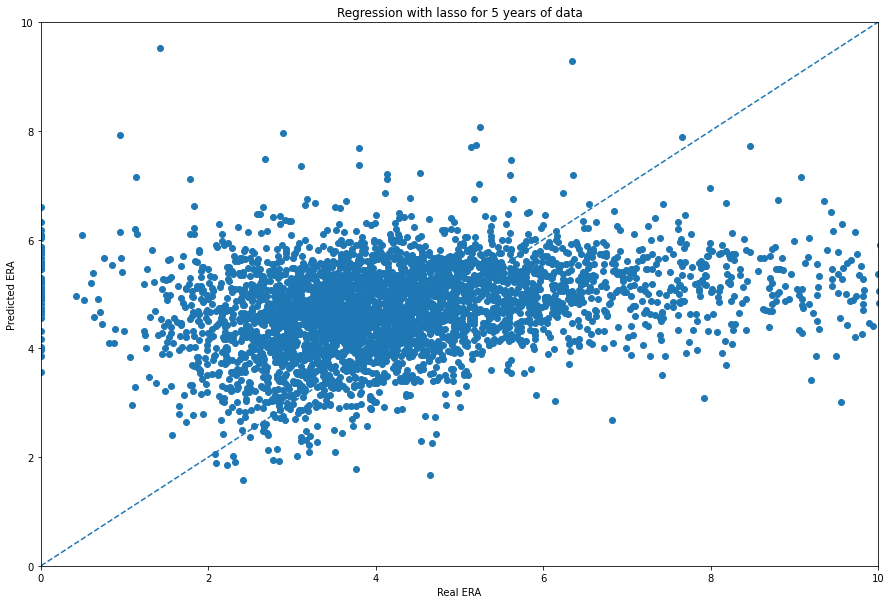

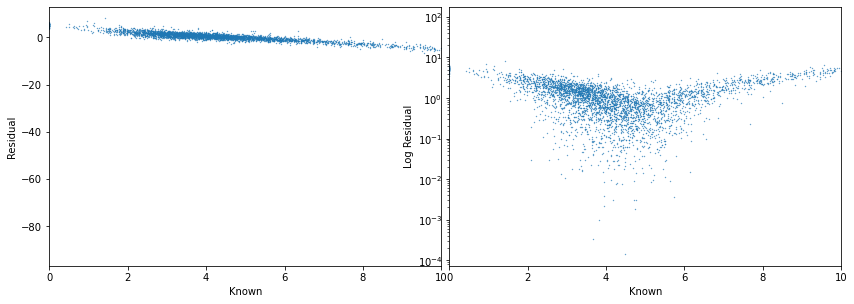

Percent of error less than one run: 0.4559047136340598


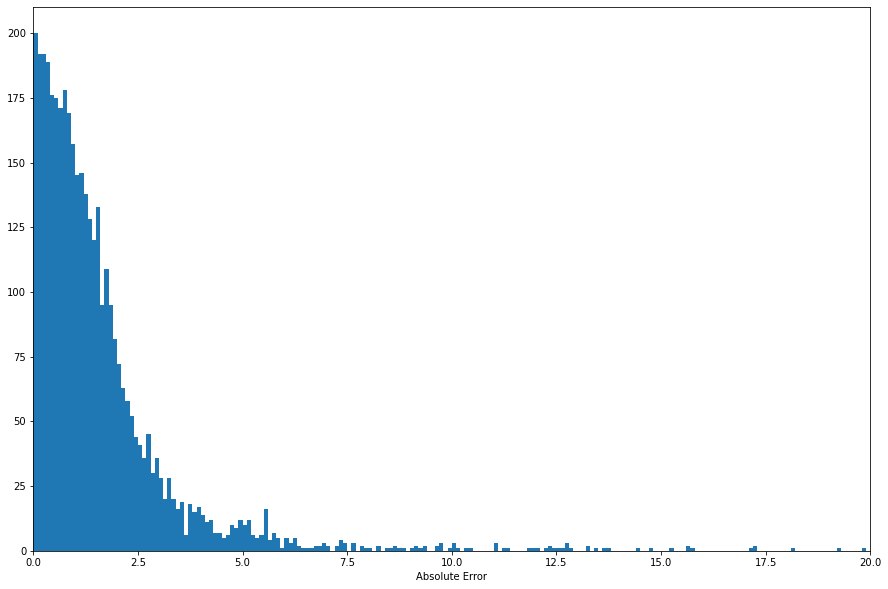

In [72]:
regression_program(df_five_yr,5,'lasso','ERA')

C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 34465.04101391518, tolerance: 7.579444134024947
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 34348.66886027317, tolerance: 7.579444134024947
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 34221.24435396244, tolerance: 7.579444134024947
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarnin

C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 20183.570491846058, tolerance: 7.579444134024947
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18741.5784795009, tolerance: 7.579444134024947
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17227.834121532593, tolerance: 7.579444134024947
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarni

The optimal regularization strength is:
[0.001]


C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 34465.04101391518, tolerance: 7.579444134024947
  model = cd_fast.enet_coordinate_descent(
<ipython-input-68-4c4e3abdad81>:26: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


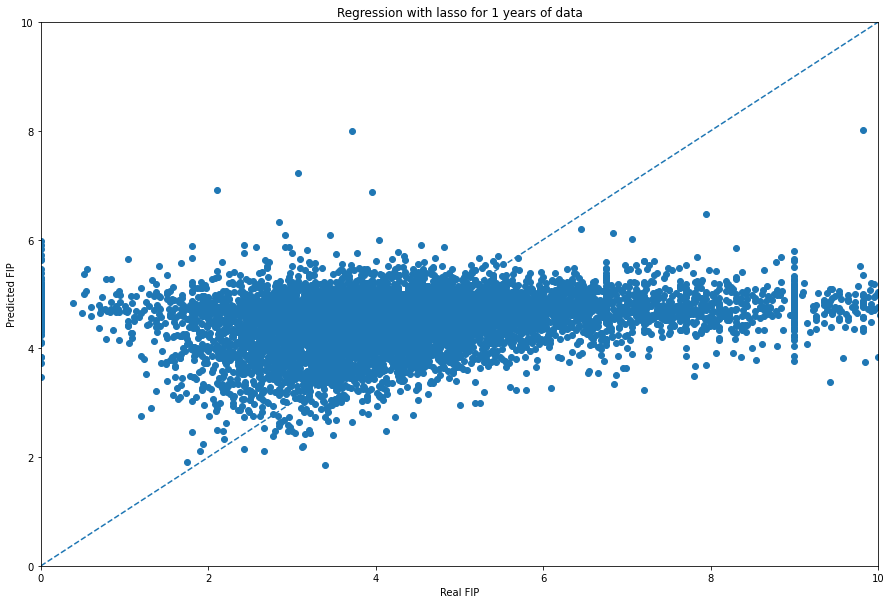

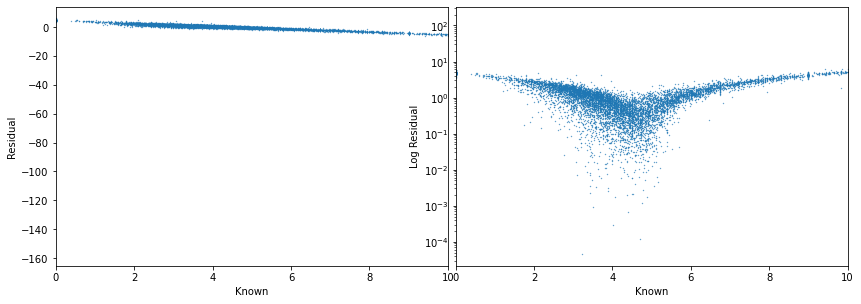

Percent of error less than one run: 0.489207779886148


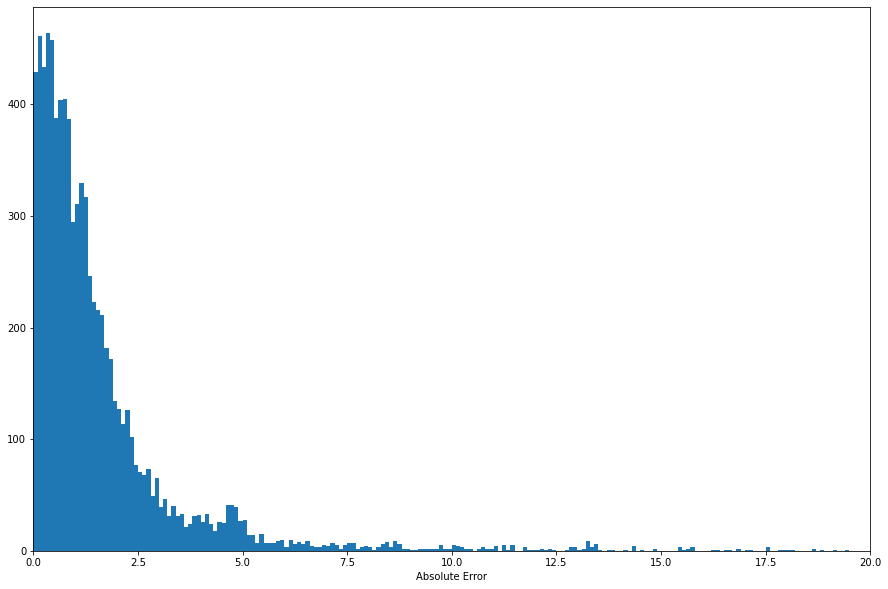

In [73]:
regression_program(df_one_yr,1,'lasso','FIP')

C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 26401.15135407699, tolerance: 5.825637728306217
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 26347.93271681751, tolerance: 5.825637728306217
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 26289.559506601814, tolerance: 5.825637728306217
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarni

C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 19762.44154661262, tolerance: 5.825637728306217
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 19093.924502393464, tolerance: 5.825637728306217
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18378.11796286677, tolerance: 5.825637728306217
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarni

C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 248.45277644005546, tolerance: 5.825637728306217
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 122.53421076815721, tolerance: 5.825637728306217
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 40.21552925383003, tolerance: 5.825637728306217
  model = cd_fast.enet_coordinate_descent(


The optimal regularization strength is:
[0.03683537]


C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10792.727755328615, tolerance: 5.825637728306217
  model = cd_fast.enet_coordinate_descent(
<ipython-input-68-4c4e3abdad81>:26: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


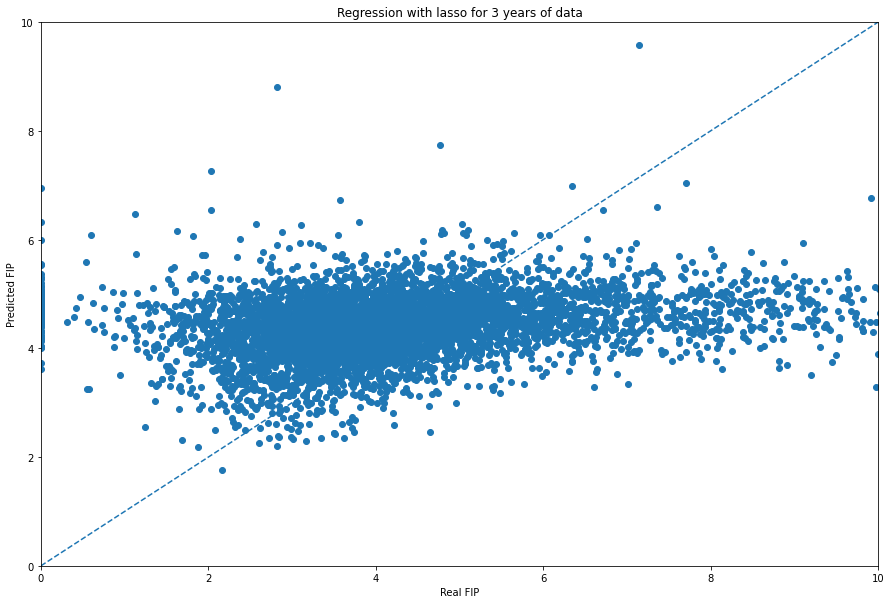

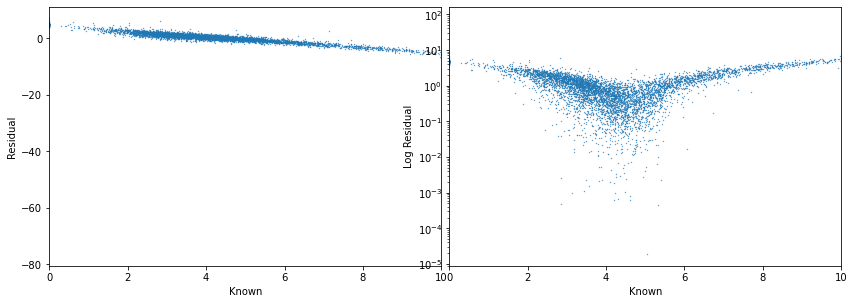

Percent of error less than one run: 0.5099407045692361


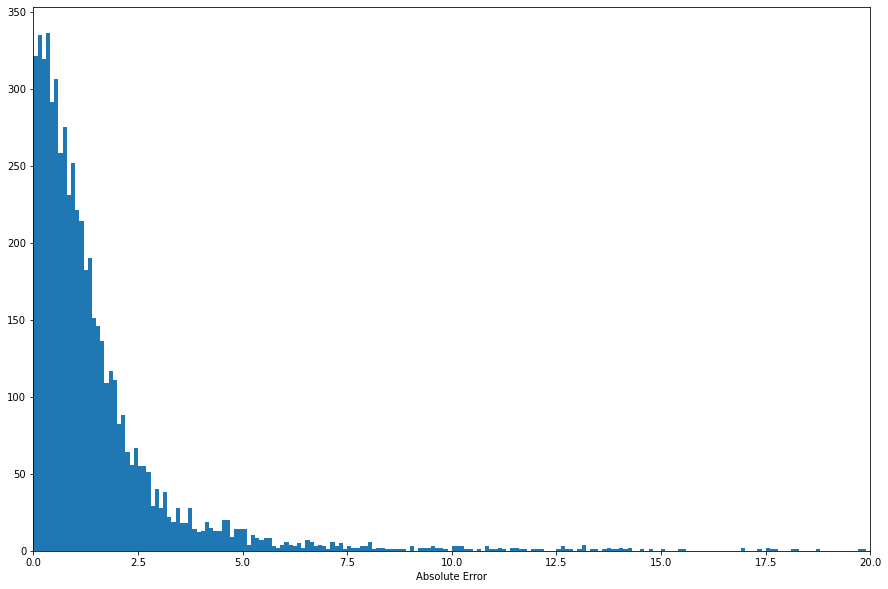

In [74]:
regression_program(df_three_yr,3,'lasso','FIP')

C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11373.466995280663, tolerance: 2.5835205497292084
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11342.862665205968, tolerance: 2.5835205497292084
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11309.253883831097, tolerance: 2.5835205497292084
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: Convergence

C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7443.708405606283, tolerance: 2.5835205497292084
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7018.185546044979, tolerance: 2.5835205497292084
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6495.831790087547, tolerance: 2.5835205497292084
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWar

C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.781109935051063, tolerance: 2.5835205497292084
  model = cd_fast.enet_coordinate_descent(


The optimal regularization strength is:
[0.01757842]


C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6073.630750265418, tolerance: 2.5835205497292084
  model = cd_fast.enet_coordinate_descent(
<ipython-input-68-4c4e3abdad81>:26: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


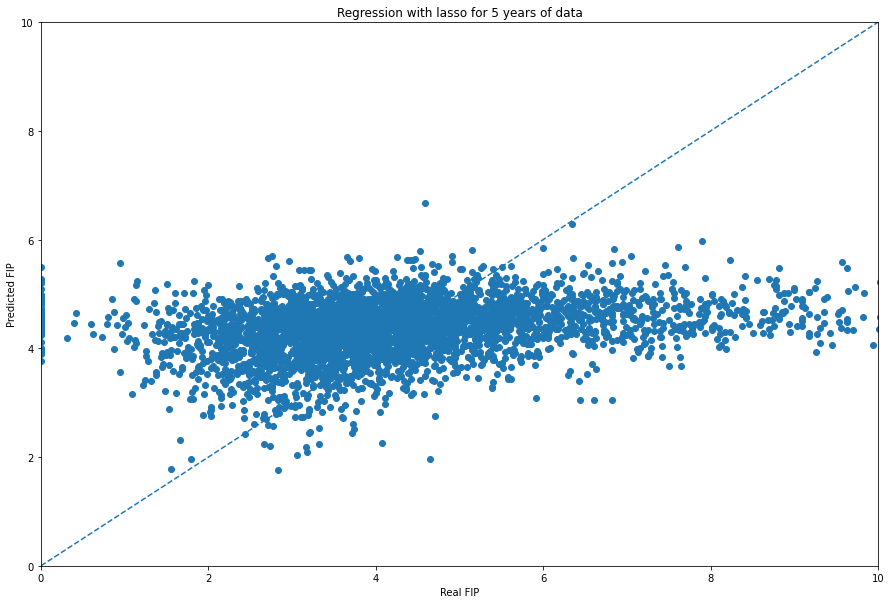

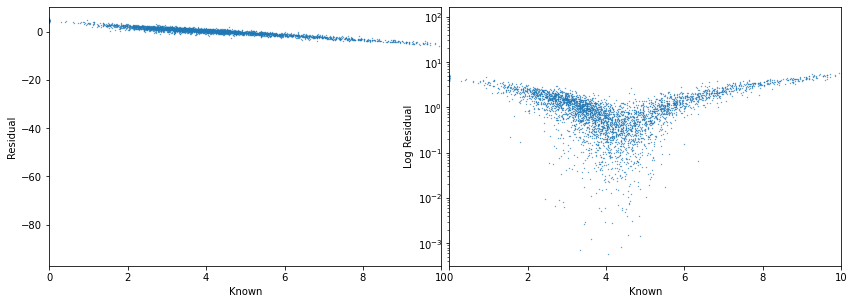

Percent of error less than one run: 0.5025342118601115


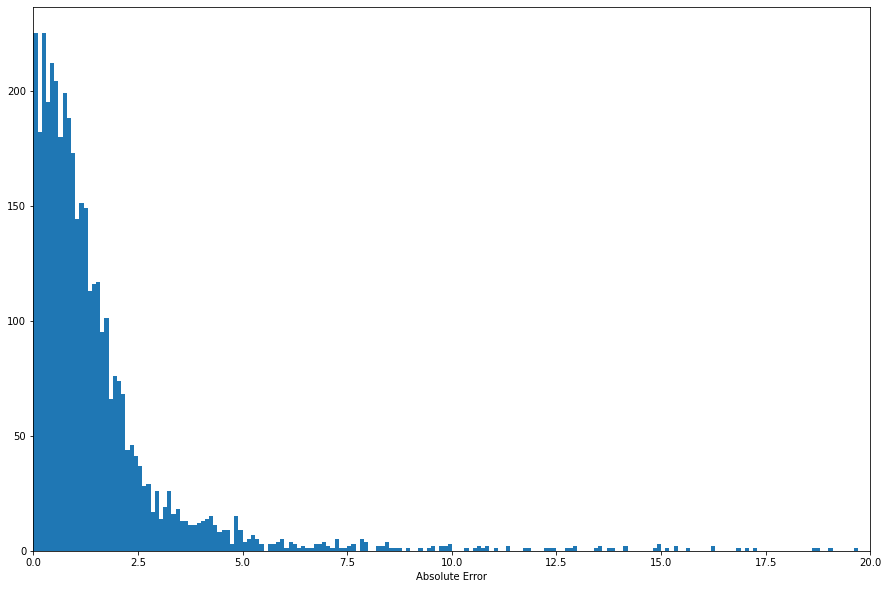

In [75]:
regression_program(df_five_yr,5,'lasso','FIP')

Finally, I wanted to make a quick program to iterate over all possible methods to find the optimal combination.

In [56]:
def regression_iterator(df_one_yr,df_three_yr,df_five_yr):
    method = ['ridge','ridge','ridge','ridge','ridge','ridge','lasso','lasso','lasso','lasso','lasso','lasso']
    output = ['ERA','ERA','ERA','FIP','FIP','FIP','ERA','ERA','ERA','FIP','FIP','FIP']
    years = [1,3,5,1,3,5,1,3,5,1,3,5]
    MAE = []
    LT1 = []
    STD = []
    for i in range(1,13,1):
        if i%3 == 1:
            df = df_one_yr
            yr = 1
        if i%3 == 2:
            df = df_three_yr
            yr = 3
        if i%3 == 0:
            df = df_five_yr
            yr = 5
        lt1,mae,std = regression_program(df,yr,method[i-1],output[i-1])
        MAE.append(mae)
        LT1.append(lt1)
        STD.append(std)
    df_precursor = {'Method': method,
                    'Output': output,
                    'Years': years,
                    'LT1': LT1,
                    'MAE': MAE,
                    'STD': STD}
    df_regression_results = pd.DataFrame(df_precursor,columns=['Method','Output','Years','LT1','MAE','STD'])
    
    return df_regression_results

The optimal regularization strength is:
[0.001]


<ipython-input-45-4c4e3abdad81>:26: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


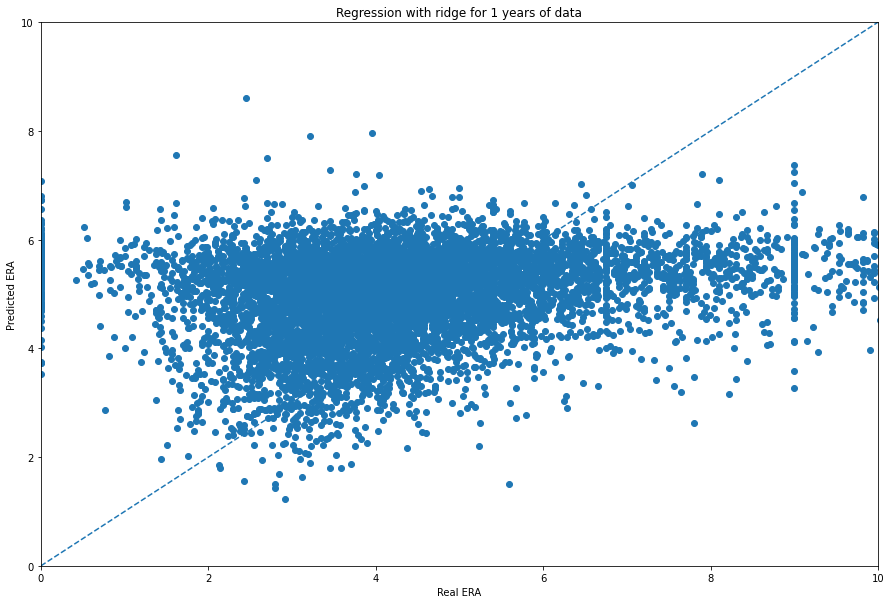

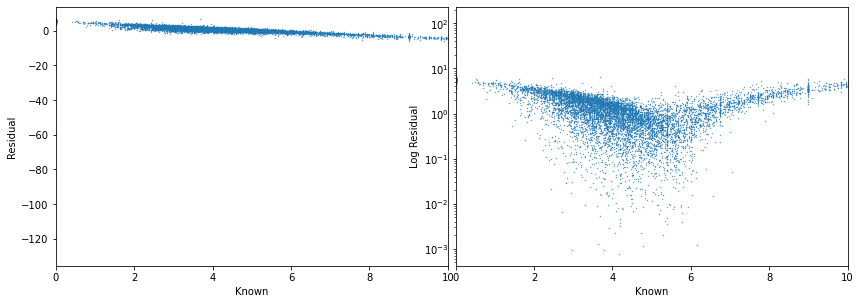

Percent of error less than one run: 0.40702087286527516
Mean Absolute Error: 2.0026812861072982
Standard Deviation: 4.369101844237541
The optimal regularization strength is:
[26897.93102022]


<ipython-input-45-4c4e3abdad81>:26: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


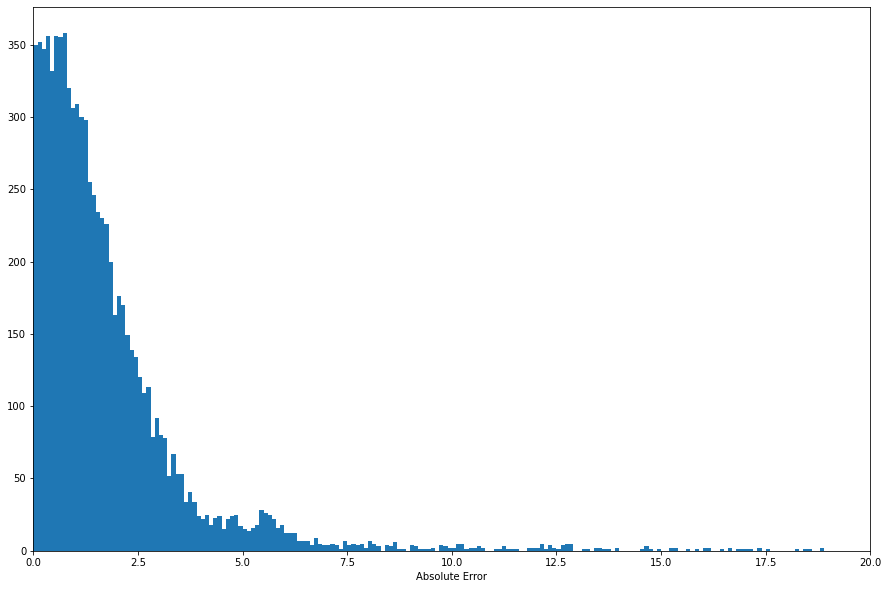

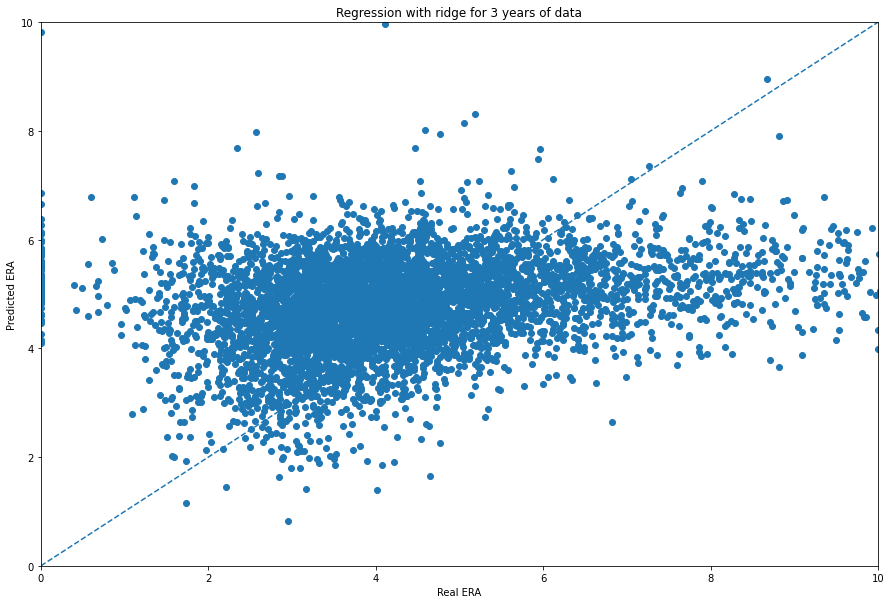

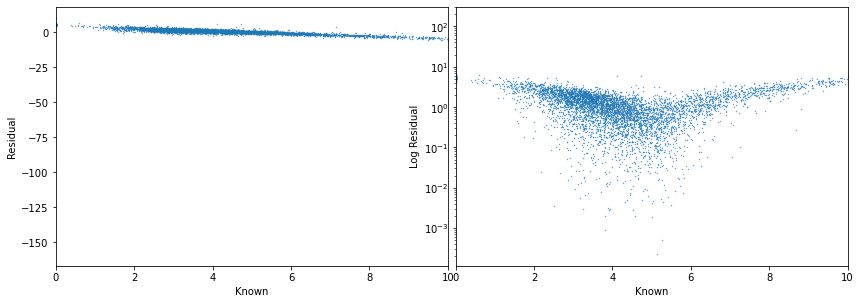

Percent of error less than one run: 0.4365190094175096
Mean Absolute Error: 1.8035067567731153
Standard Deviation: 4.693347357946779
The optimal regularization strength is:
[1192079.50366445]


<ipython-input-45-4c4e3abdad81>:26: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


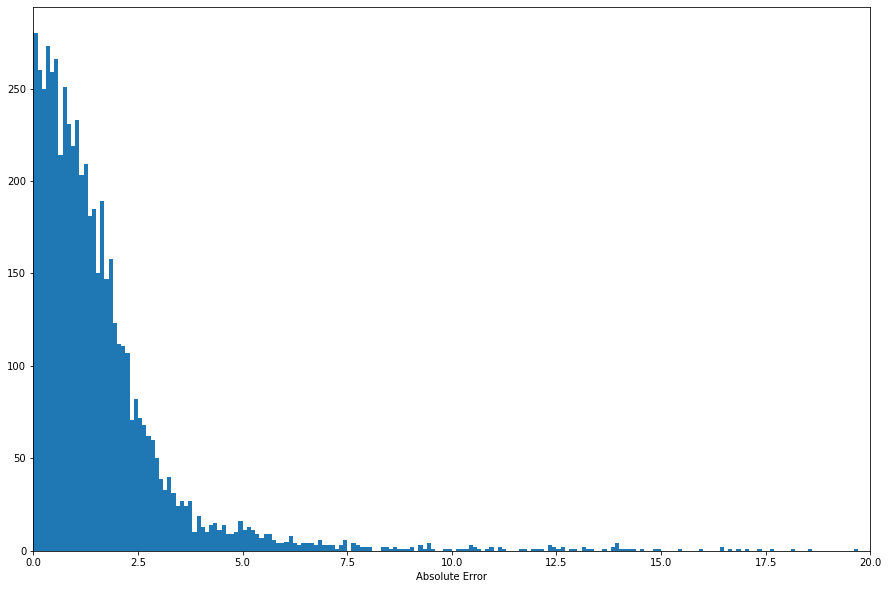

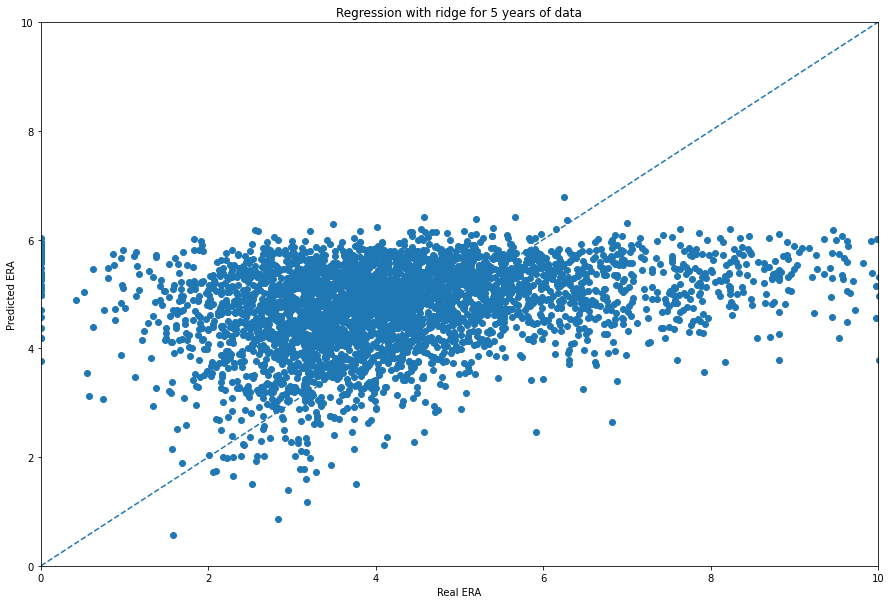

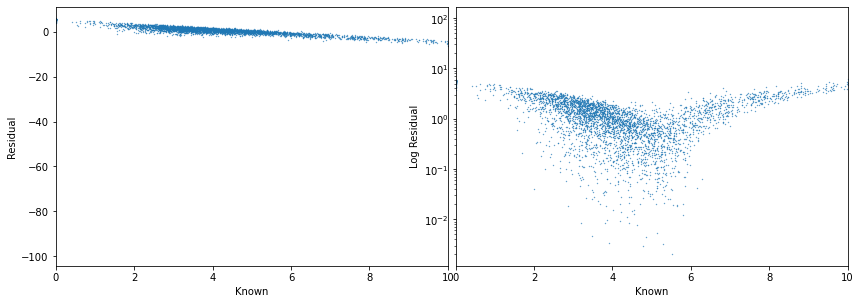

Percent of error less than one run: 0.44754181449569186
Mean Absolute Error: 1.7664168174303188
Standard Deviation: 3.7106469311704027
The optimal regularization strength is:
[317.69328264]


<ipython-input-45-4c4e3abdad81>:26: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


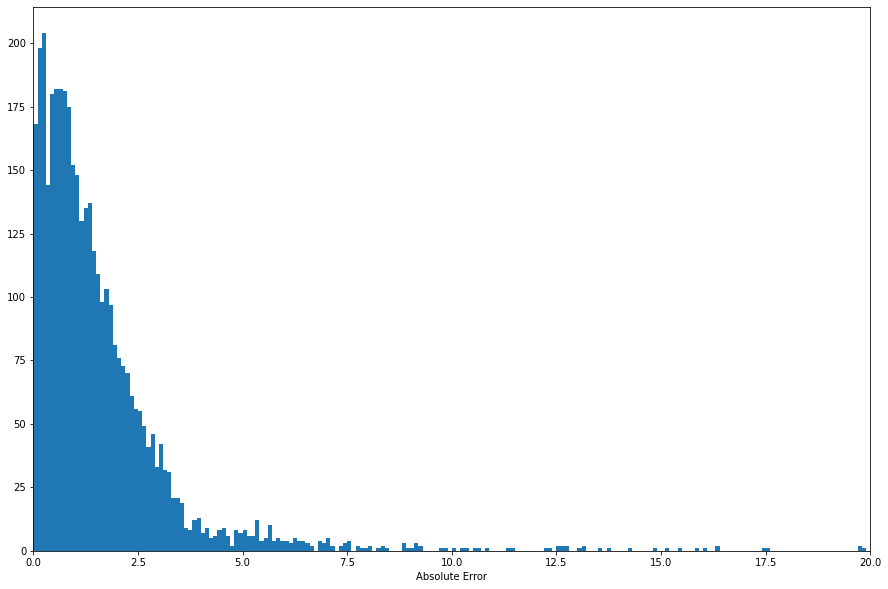

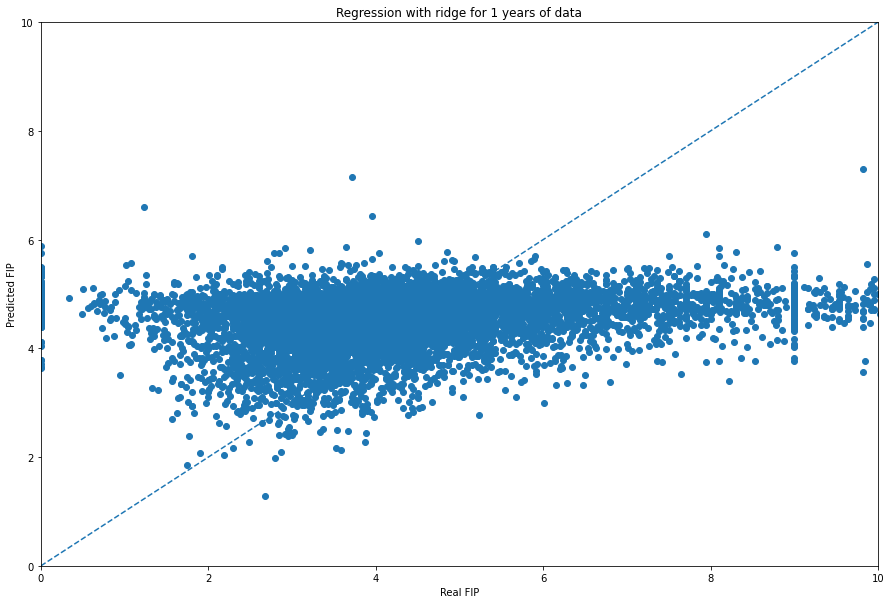

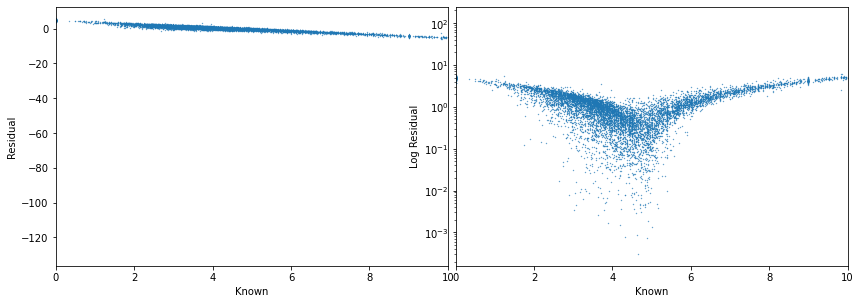

Percent of error less than one run: 0.4737903225806452
Mean Absolute Error: 1.8393456252652942
Standard Deviation: 4.271020048950838
The optimal regularization strength is:
[14079.73164932]


<ipython-input-45-4c4e3abdad81>:26: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


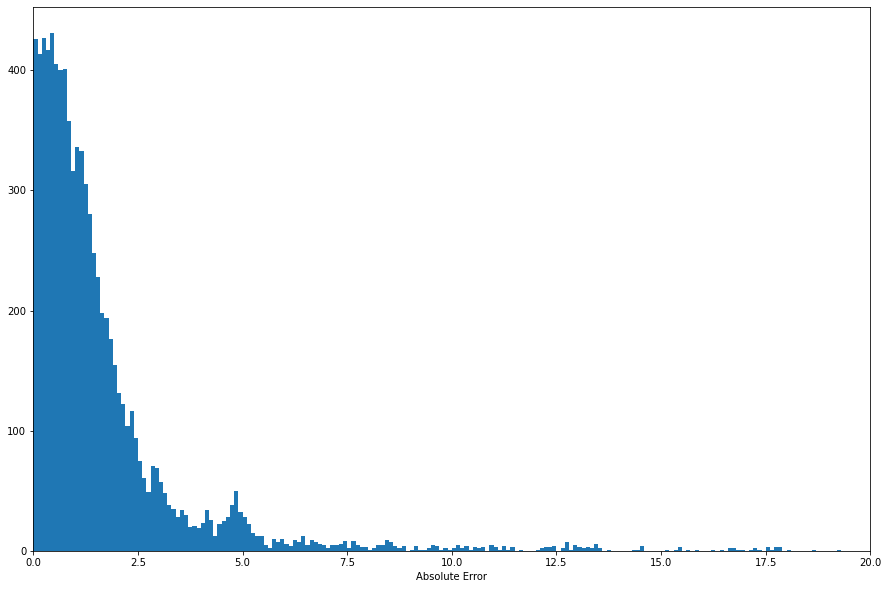

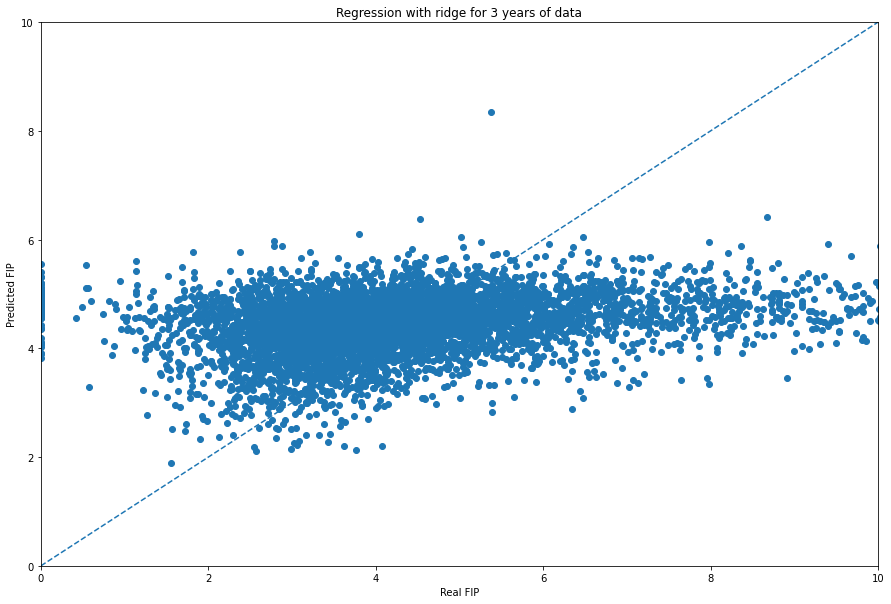

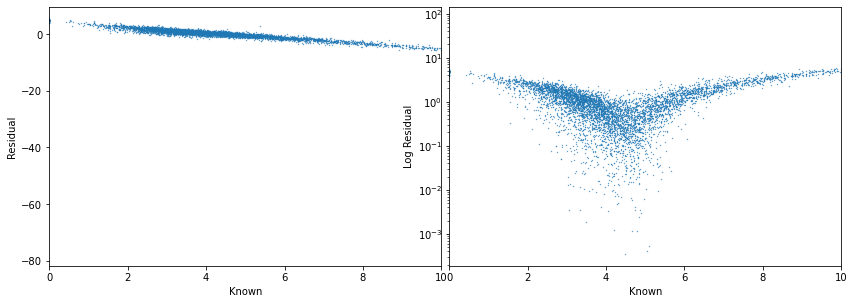

Percent of error less than one run: 0.5066271363794908
Mean Absolute Error: 1.6285771019691804
Standard Deviation: 3.4375673238621944
The optimal regularization strength is:
[1395.01318782]


<ipython-input-45-4c4e3abdad81>:26: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


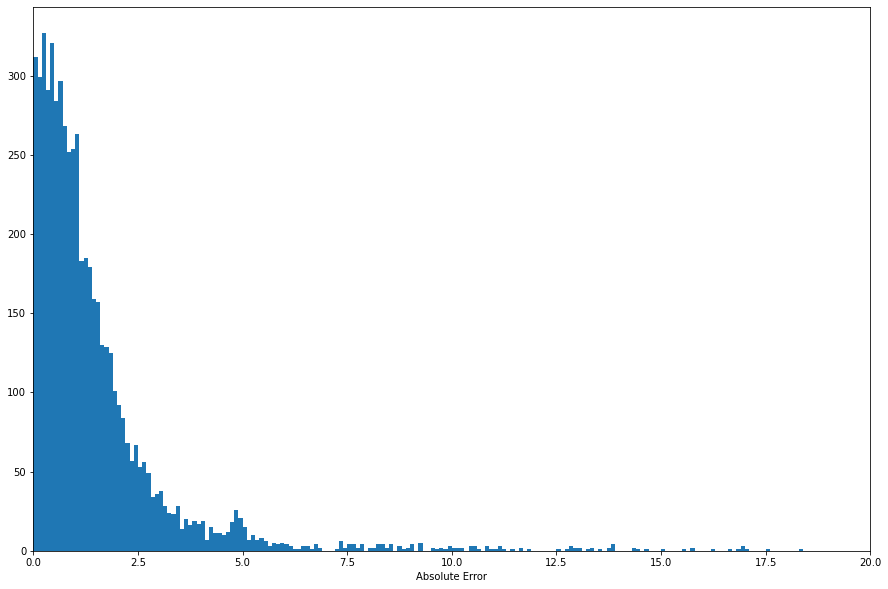

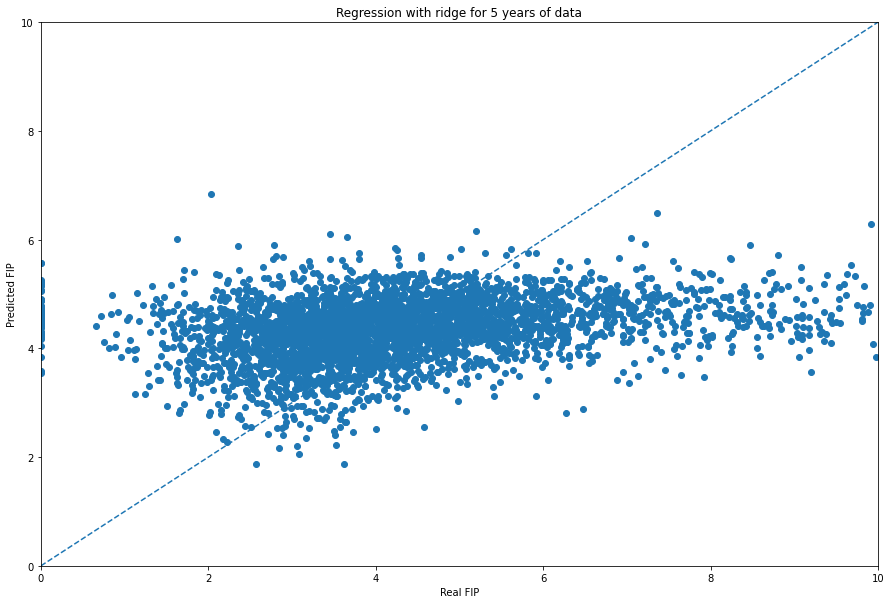

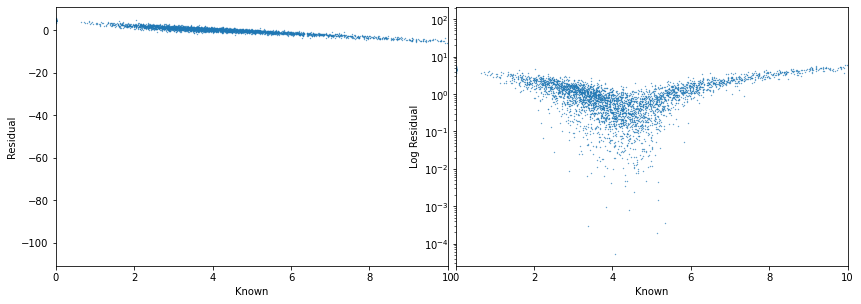

Percent of error less than one run: 0.5200202736948809
Mean Absolute Error: 1.6231762568961667
Standard Deviation: 3.8701082061715883


C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 192833.36193869432, tolerance: 40.365308025119475
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 192557.67452064715, tolerance: 40.365308025119475
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 192256.2656176723, tolerance: 40.365308025119475
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceW

C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 160528.6834662545, tolerance: 40.365308025119475
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 157427.717805203, tolerance: 40.365308025119475
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 154037.86705823021, tolerance: 40.365308025119475
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWar

C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18557.21031853382, tolerance: 40.365308025119475
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14477.256521034928, tolerance: 40.365308025119475
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10898.439306312299, tolerance: 40.365308025119475
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceW

The optimal regularization strength is:
[0.001]


C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 192833.36193869432, tolerance: 40.365308025119475
  model = cd_fast.enet_coordinate_descent(
<ipython-input-45-4c4e3abdad81>:26: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


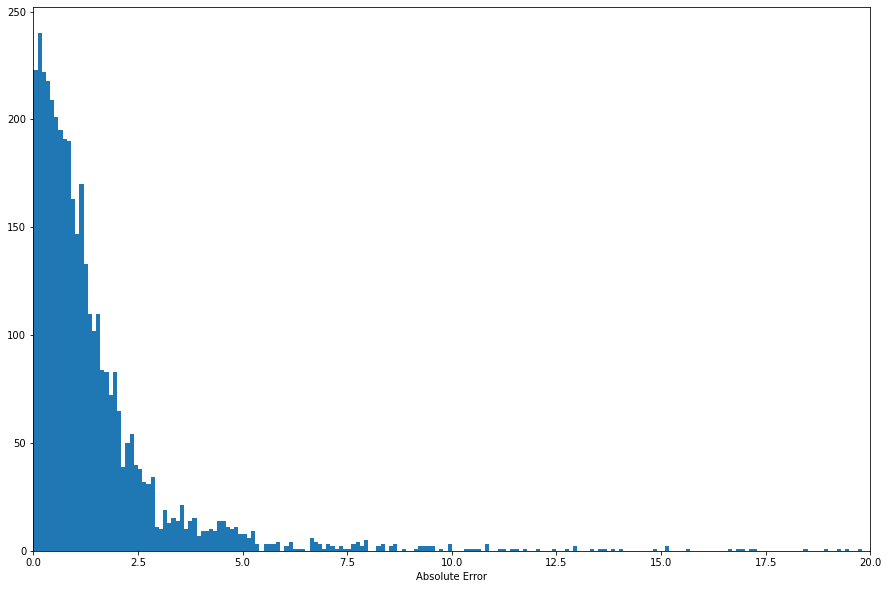

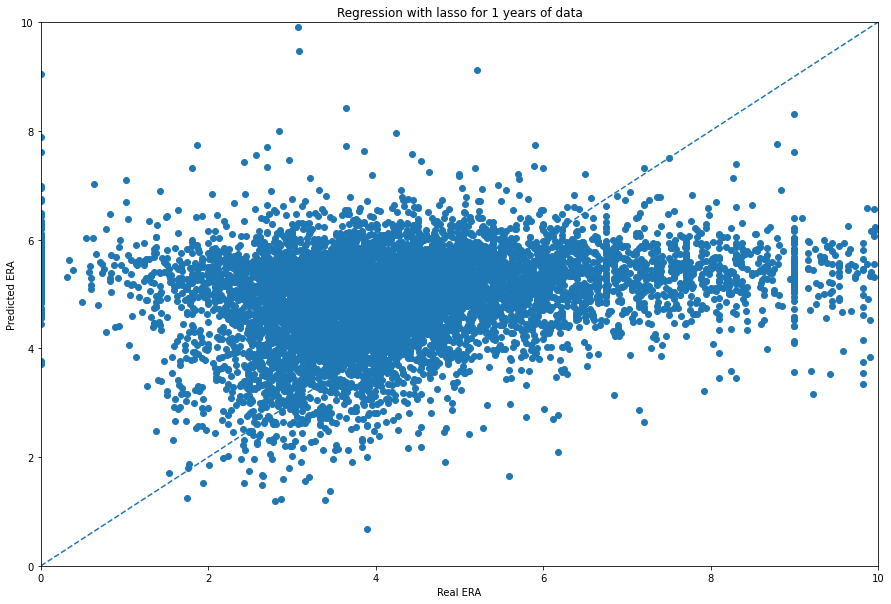

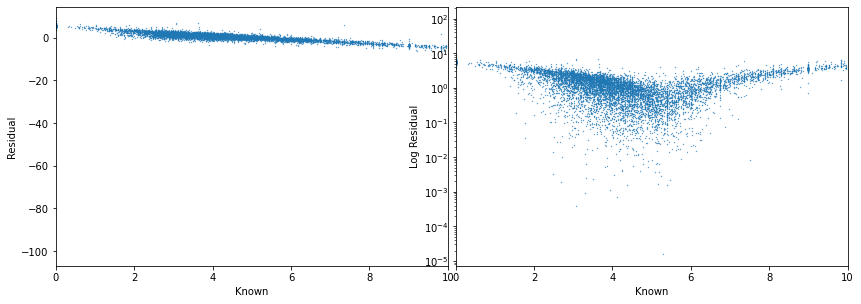

Percent of error less than one run: 0.41579696394686905
Mean Absolute Error: 1.985878129466193
Standard Deviation: 4.218718290012804


C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 116957.06312970829, tolerance: 25.312710355596938
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 116511.88545729089, tolerance: 25.312710355596938
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 116024.7214612329, tolerance: 25.312710355596938
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceW

C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 81774.84387489504, tolerance: 25.312710355596938
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 76382.65203878509, tolerance: 25.312710355596938
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 66526.94744368638, tolerance: 25.312710355596938
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWar

C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8974.266224284598, tolerance: 25.312710355596938
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6711.631886474264, tolerance: 25.312710355596938
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5071.958254109224, tolerance: 25.312710355596938
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWar

The optimal regularization strength is:
[0.07718807]


C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 22691.259165685886, tolerance: 25.312710355596938
  model = cd_fast.enet_coordinate_descent(
<ipython-input-45-4c4e3abdad81>:26: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


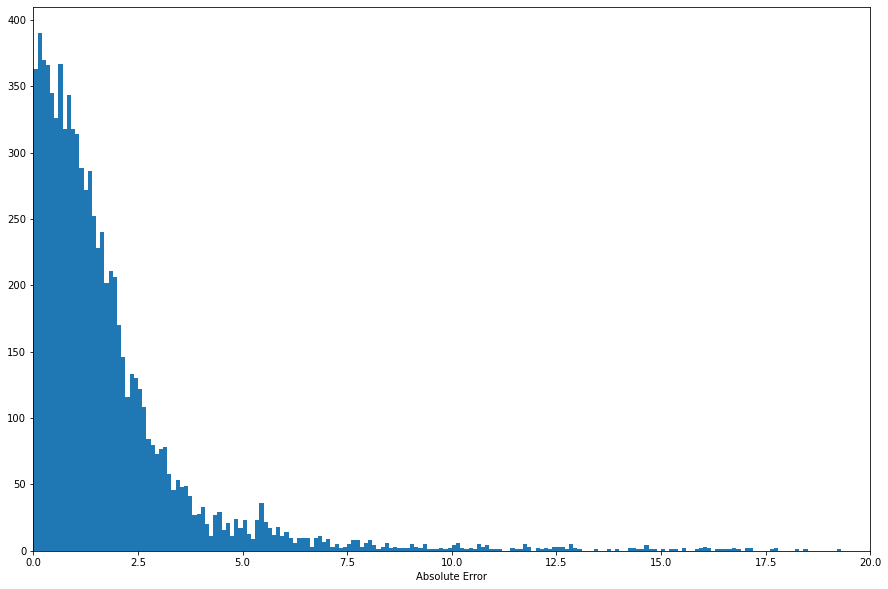

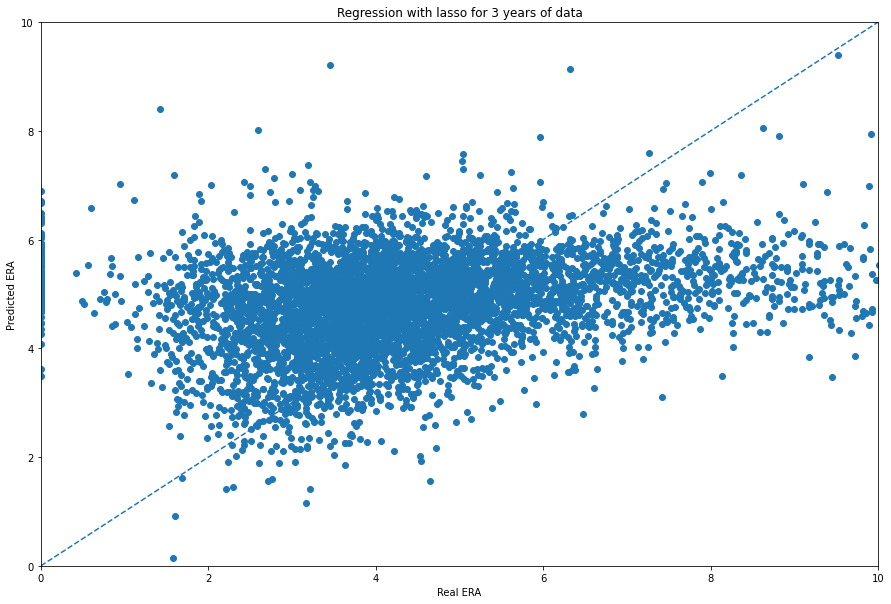

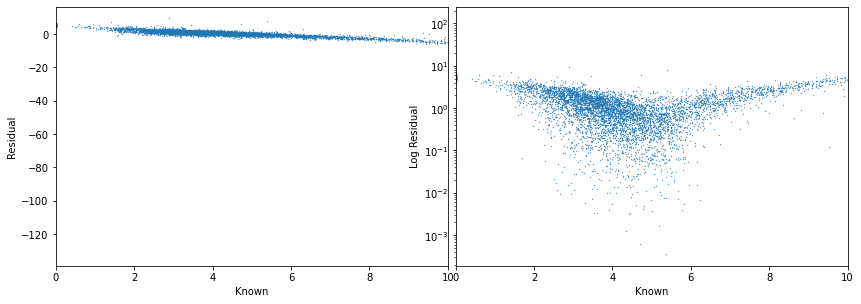

Percent of error less than one run: 0.45465643529822114
Mean Absolute Error: 1.8009848714705687
Standard Deviation: 4.030453008956378


C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 59004.67414820577, tolerance: 12.618887575770483
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 58930.460256189835, tolerance: 12.618887575770483
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 58848.70335878738, tolerance: 12.618887575770483
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWa

C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 50126.818702509714, tolerance: 12.618887575770483
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 49296.0430578665, tolerance: 12.618887575770483
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 48404.06302345578, tolerance: 12.618887575770483
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWar

C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3901.9790268928336, tolerance: 12.618887575770483
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2997.5964734159497, tolerance: 12.618887575770483
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2261.5318979837757, tolerance: 12.618887575770483
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: Convergence

The optimal regularization strength is:
[0.07037033]


C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13371.31220623439, tolerance: 12.618887575770483
  model = cd_fast.enet_coordinate_descent(
<ipython-input-45-4c4e3abdad81>:26: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


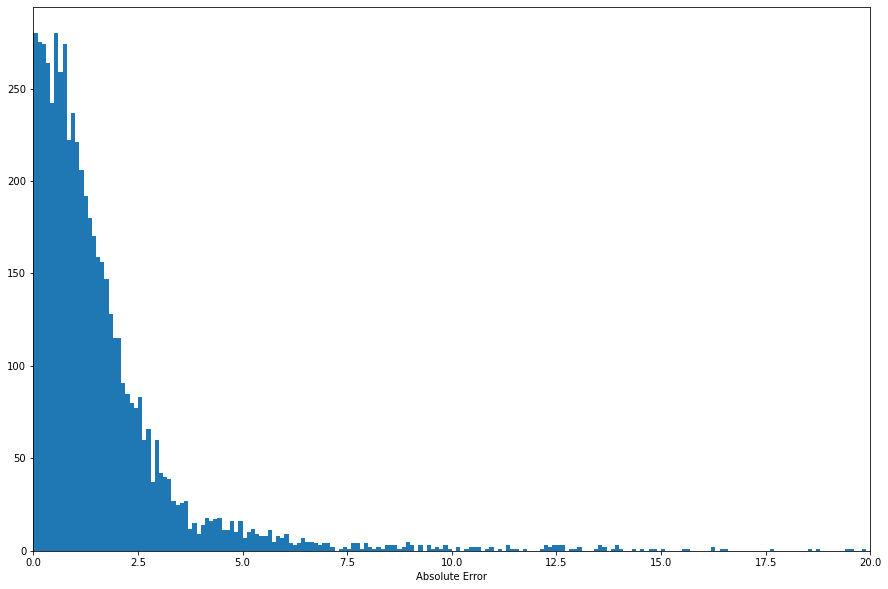

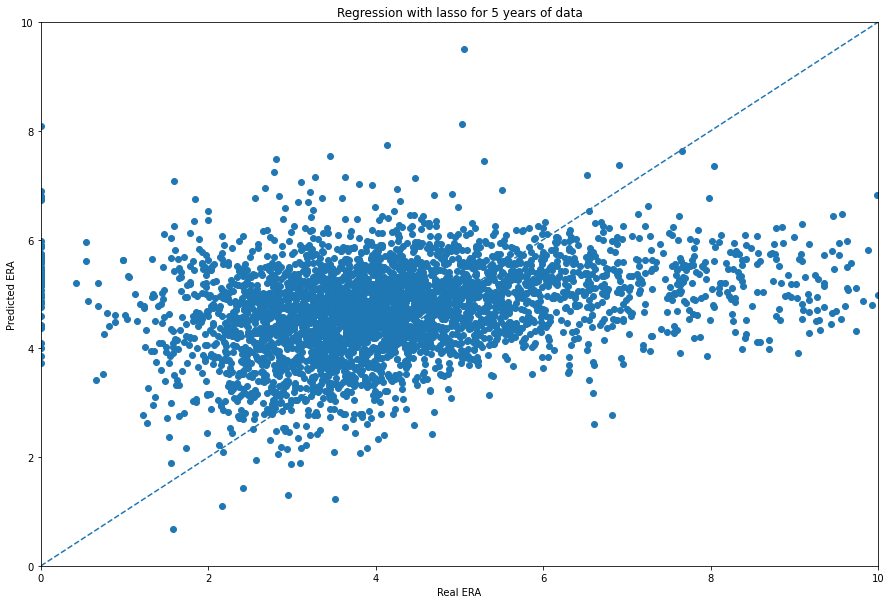

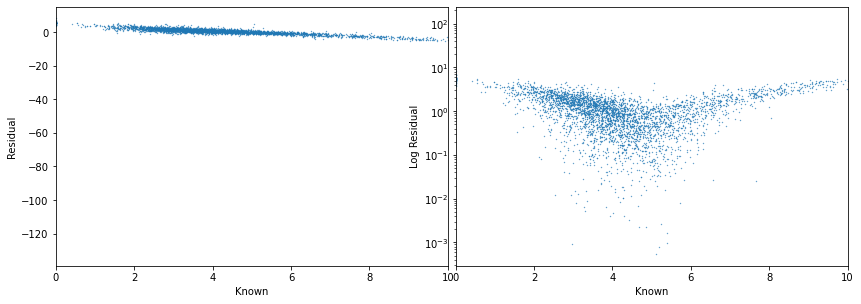

Percent of error less than one run: 0.4576786619361379
Mean Absolute Error: 1.8044025391358423
Standard Deviation: 4.757472160778721


C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 37261.25954671172, tolerance: 8.233376068438645
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 37126.91343349554, tolerance: 8.233376068438645
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 36975.47676937942, tolerance: 8.233376068438645
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarnin

C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 25746.799760275386, tolerance: 8.233376068438645
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 25001.789222506224, tolerance: 8.233376068438645
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 24239.020535678937, tolerance: 8.233376068438645
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWar

The optimal regularization strength is:
[0.01107074]


C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 27194.147317063682, tolerance: 8.233376068438645
  model = cd_fast.enet_coordinate_descent(
<ipython-input-45-4c4e3abdad81>:26: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


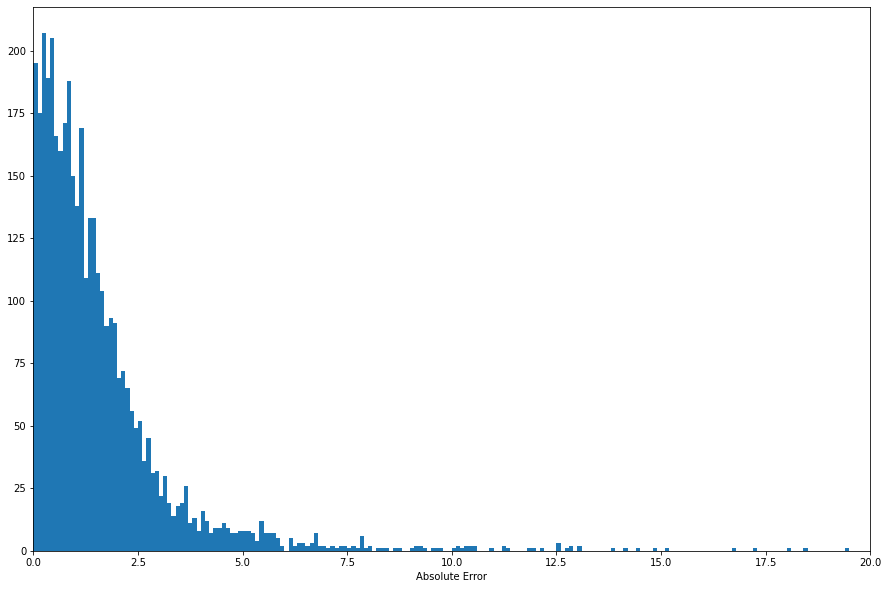

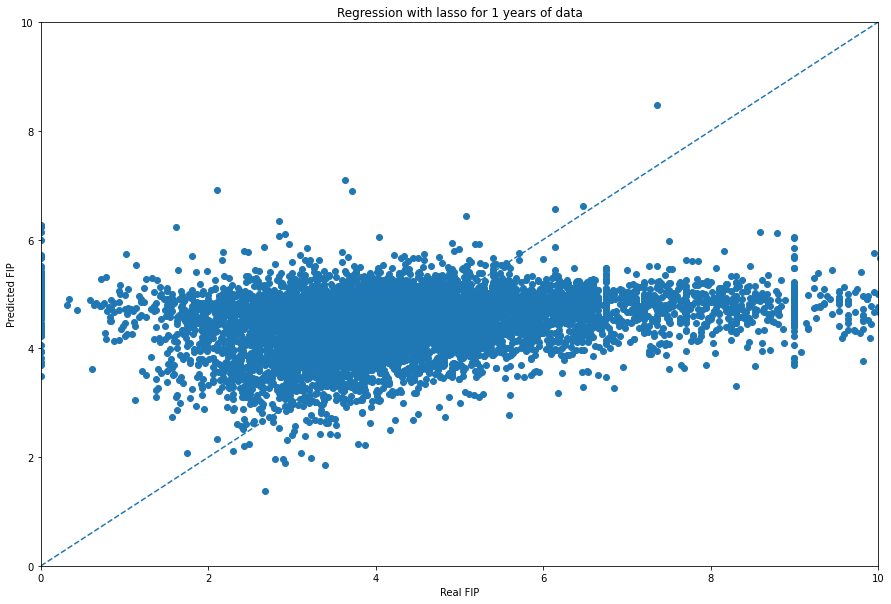

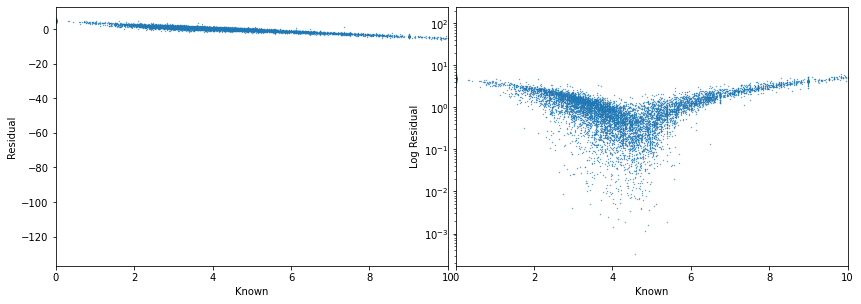

Percent of error less than one run: 0.48422675521821634
Mean Absolute Error: 1.9749569791348598
Standard Deviation: 5.32940794371861


C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 19291.223791899876, tolerance: 4.316775978594585
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 19252.842487706635, tolerance: 4.316775978594585
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 19210.849302353407, tolerance: 4.316775978594585
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWar

C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14931.393013700332, tolerance: 4.316775978594585
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14533.088985312756, tolerance: 4.316775978594585
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14108.106562907196, tolerance: 4.316775978594585
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWar

C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1502.2514345483978, tolerance: 4.316775978594585
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1171.4298969493575, tolerance: 4.316775978594585
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 864.4470697188808, tolerance: 4.316775978594585
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarn

The optimal regularization strength is:
[0.01602578]


C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14108.106562907196, tolerance: 4.316775978594585
  model = cd_fast.enet_coordinate_descent(
<ipython-input-45-4c4e3abdad81>:26: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


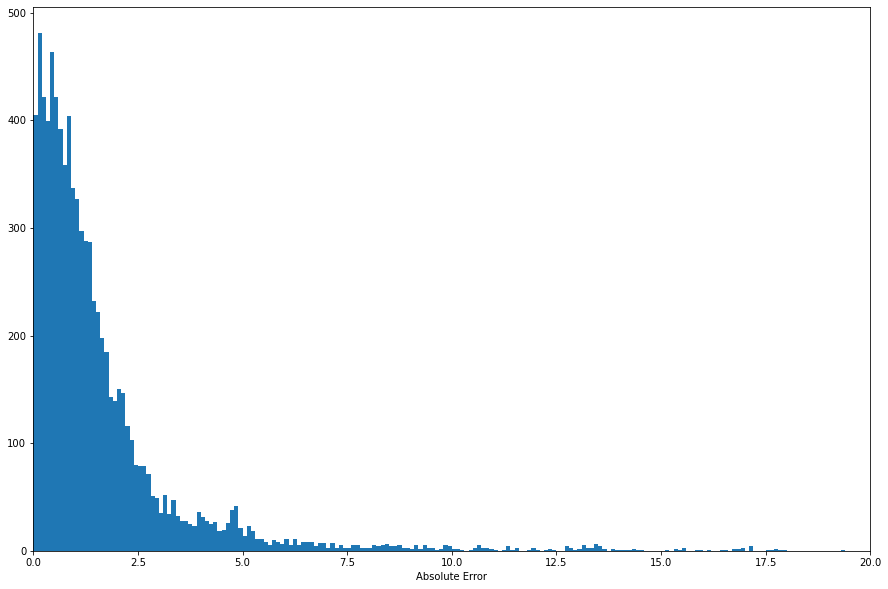

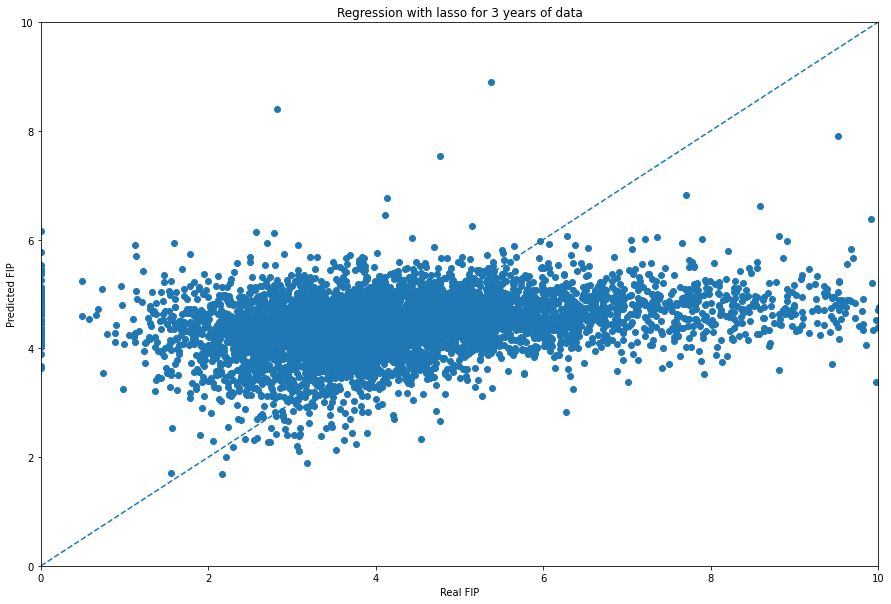

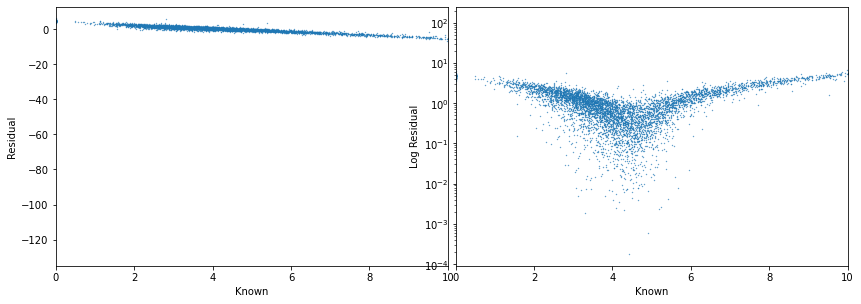

Percent of error less than one run: 0.4998256016742239
Mean Absolute Error: 1.614185687684091
Standard Deviation: 3.4583921008598493


C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10211.391728016279, tolerance: 2.338692982557038
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10190.909705201095, tolerance: 2.338692982557038
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10169.479844464558, tolerance: 2.338692982557038
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWar

C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7748.528414563039, tolerance: 2.338692982557038
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7492.786586733809, tolerance: 2.338692982557038
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7195.027811331132, tolerance: 2.338692982557038
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarnin

C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 211.69760257894086, tolerance: 2.338692982557038
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 124.97904083481262, tolerance: 2.338692982557038
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 53.192962095872645, tolerance: 2.338692982557038
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWar

The optimal regularization strength is:
[0.02544617]


C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5771.753800328523, tolerance: 2.338692982557038
  model = cd_fast.enet_coordinate_descent(
<ipython-input-45-4c4e3abdad81>:26: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


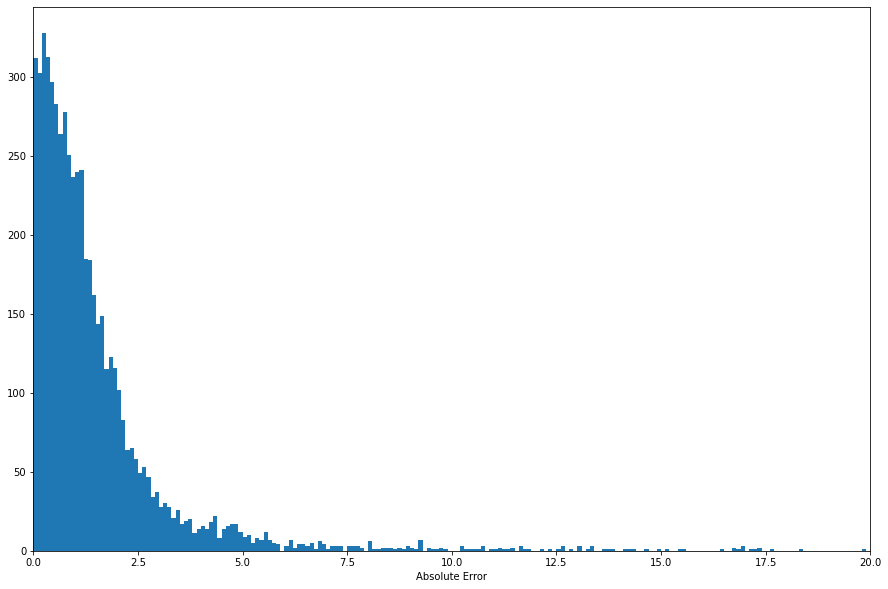

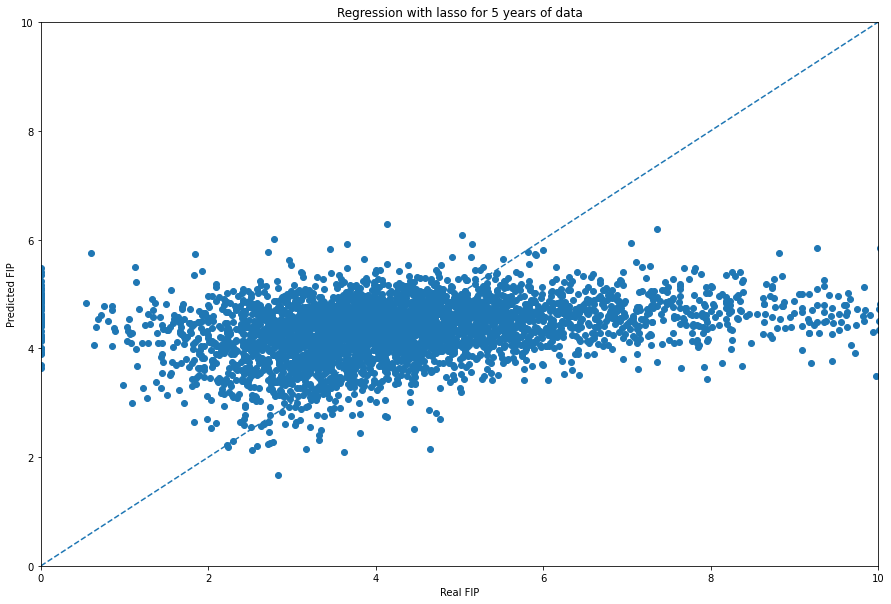

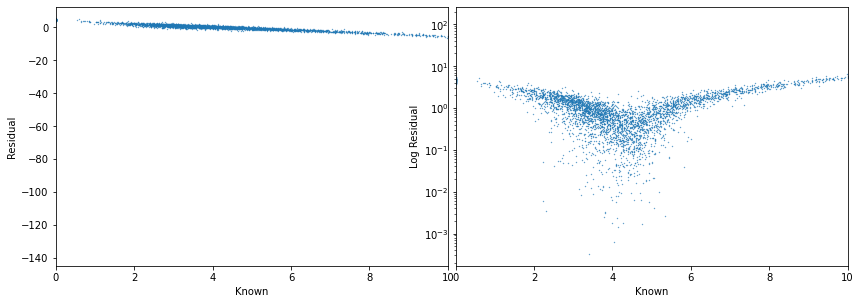

Percent of error less than one run: 0.5124176381145463
Mean Absolute Error: 1.764633803336688
Standard Deviation: 4.9533966827289575


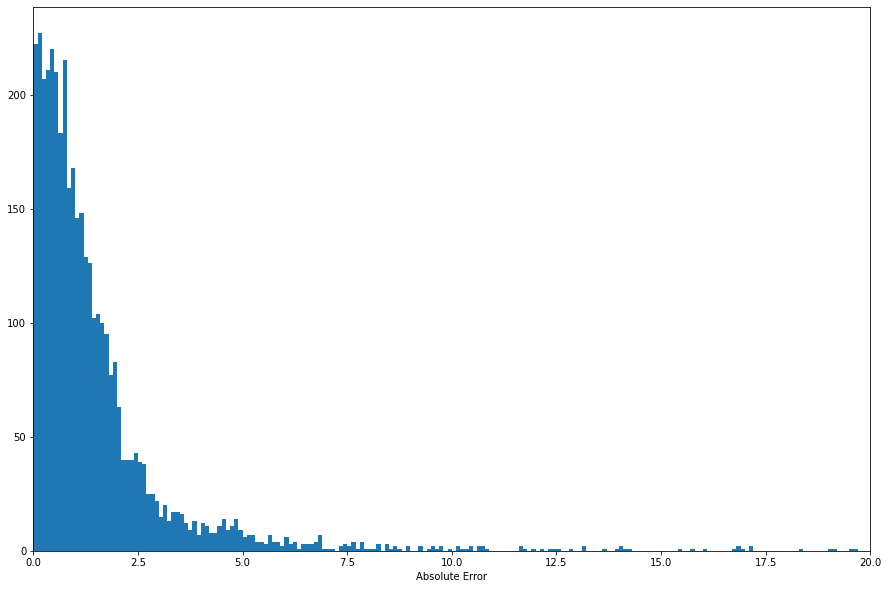

In [57]:
df_results = regression_iterator(df_one_yr,df_three_yr,df_five_yr)

In [59]:
display(df_results)

,Method,Output,Years,LT1,MAE,STD
0,ridge,ERA,1,0.407021,2.002681,4.369102
1,ridge,ERA,3,0.436519,1.803507,4.693347
2,ridge,ERA,5,0.447542,1.766417,3.710647
3,ridge,FIP,1,0.473790,1.839346,4.271020
4,ridge,FIP,3,0.506627,1.628577,3.437567
5,ridge,FIP,5,0.520020,1.623176,3.870108
6,lasso,ERA,1,0.415797,1.985878,4.218718
7,lasso,ERA,3,0.454656,1.800985,4.030453
8,lasso,ERA,5,0.457679,1.804403,4.757472
9,lasso,FIP,1,0.484227,1.974957,5.329408


We can see that generally that all of our statistics improve for ridge regresssion with more years of data. The jump is larger from 1 -> 3 than 3 -> 5 however. The same holds for lasso regression, albeit with fluctuations in STD. The percent of residuals less than one run (LT1) also follows the same general observation.

## Refining Datasets

Now we load our datasets again, but now include an intermediary step that filters our data to include either only starting pitchers or relievers. This step is done in the input_output function. The remaining functions are the same.

In [60]:
## Loading Datasets
df_one_yr = pd.read_csv('one_previous_yr.csv')
df_three_yr = pd.read_csv('three_previous_yr.csv')
df_five_yr = pd.read_csv('five_previous_yr.csv')

In [72]:
def input_output(df,n_years,pitcherType):
    
    if n_years == 1:
        to_drop = ['playerID','yearID','teamID','teamID1','IBB','SF','SH','GIDP','Unnamed: 0']
    if n_years == 3:
        to_drop = ['playerID','yearID','teamID','teamID1','teamID2','teamID3','IBB1','IBB2','IBB3',
                   'SF1','SF2','SF3','SH1','SH2','SH3','GIDP1','GIDP2','GIDP3','Unnamed: 0']
    if n_years == 5:
        to_drop = ['playerID','yearID','teamID','teamID1','teamID2','teamID3','teamID4','teamID5',
                   'IBB1','IBB2','IBB3','IBB4','IBB5',
                   'SF1','SF2','SF3','SF4','SF5',
                   'SH1','SH2','SH3','SH4','SH5',
                   'GIDP1','GIDP2','GIDP3','GIDP4','GIDP5','Unnamed: 0']
        
    stats_df = df.drop(to_drop,axis=1)
    stats_df.replace([np.inf, -np.inf], np.nan, inplace=True)
    stats_df.dropna;
    outputs = stats_df[['kERA','kFIP']]
    
    # Finding games started specifically.
    if n_years == 1:
        GS_df = stats_df['GS']
    if n_years == 3:
        GS_df = stats_df['GS1']
    if n_years == 5:
        GS_df = stats_df['GS1']
    stats_df = stats_df.drop(['kERA','kFIP'],axis=1)
    
    
    stats = stats_df.to_numpy()
    stats = np.nan_to_num(stats)
    
    outputs = outputs.to_numpy()
    outputs = np.nan_to_num(outputs)
    
    GS_data = GS_df.to_numpy()
    GS_data = np.nan_to_num(GS_data)
    
    ## Choosing relievers or starters
    if pitcherType == 'starters':
        reliever_index = np.where(GS_data == 0)
        stats,outputs = np.delete(stats,reliever_index,0),np.delete(outputs,reliever_index,0)
    if pitcherType == 'relievers':
        reliever_index = np.where(GS_data != 0)
        stats,outputs = np.delete(stats,reliever_index,0),np.delete(outputs,reliever_index,0)
    
    return stats,outputs

## First, we split into training, validation, and testing data

def train_validate_test(df,n_years,pitcherType):
    
    stats,outputs = input_output(df,n_years,pitcherType)
    
    stats,outputs = shuffler(stats,outputs)
    
    num_data = stats.shape[0]
    n_samples_train = round(0.5*num_data)
    n_samples_validate = round(0.25*num_data) + n_samples_train
    X_train, X_val, X_test = stats[:n_samples_train], stats[n_samples_train:n_samples_validate], stats[n_samples_validate:]
    y_train, y_val, y_test = outputs[:n_samples_train], outputs[n_samples_train:n_samples_validate], outputs[n_samples_validate:]
    
    if len(X_val) != len(X_test):
        X_test = X_test[0:len(X_test)-1]
        y_test = y_test[0:len(y_test)-1]
        
    return X_train,y_train,X_val,y_val,X_test,y_test    
        
def regularization_optimization(X_train,y_train,X_val,y_val,a_min,a_max,regType,outputStat,do_plot):
      
    if regType == 'ridge':
        min_alpha = ridge_optimization(X_train,y_train,X_val,y_val,a_min,a_max,outputStat,do_plot)
        print('The optimal regularization strength is:')
        print(min_alpha)
        
    if regType == 'lasso':
        min_alpha = lasso_optimization(X_train,y_train,X_val,y_val,a_min,a_max,outputStat,do_plot)
        print('The optimal regularization strength is:')
        print(min_alpha)
        
    return min_alpha

def regularization_prediction(X_train,y_train,X_val,y_val,X_test,y_test,a_max,a_min,regType,outputStat,n_years,pitcherType,do_plot):
    
    ## Finding ideal alpha
    min_alpha = regularization_optimization(X_train,y_train,X_val,y_val,a_max,a_min,regType,outputStat,do_plot)
    
    
    ## Picking output stat
    if outputStat == 'ERA':
        y_train,y_val,y_test = y_train[:,0],y_val[:,0],y_test[:,0]
    if outputStat == 'FIP':
        y_train,y_val,y_test = y_train[:,1],y_val[:,1],y_test[:,0]
        
    ## Building model
    
    if regType == 'ridge':
        ridge = Ridge(alpha=min_alpha,fit_intercept=True)
        ridge_fit = ridge.fit(X_train,y_train)
        y_pred = ridge_fit.predict(X_test)
        
    if regType == 'lasso':
        lasso = Lasso(alpha=min_alpha,fit_intercept=True)
        lasso_fit = lasso.fit(X_train,y_train)
        y_pred = lasso_fit.predict(X_test)   
        
    residuals = y_pred - y_test
    per_error = np.divide((y_pred - y_test),y_test)
    avg_abs_error = np.mean(residuals)
    avg_per_error = np.mean(per_error)
    
    #precursor = {'ERA':y_test,'pERA':y_pred,'residual':residuals,'per_error':per_error}
    #reg_df = pd.DataFrame(precursor,columns=['ERA','pERA','residual','per_error'])
    
    x_line = np.arange(0,20,0.1)
    y_line = x_line
    
    f = plt.figure()
    f.set_figwidth(15) 
    f.set_figheight(10) 
    plt.scatter(y_test,y_pred)
    plt.plot(x_line,y_line,ls=('dashed'))
    plt.title('Regression with ' + regType + ' for ' + str(n_years) + ' years of data '+ '(' + pitcherType + ')')
    plt.xlabel('Real ' + outputStat)
    plt.ylabel('Predicted ' + outputStat)
    plt.xlim([0,10])
    plt.ylim([0,10])
    
    return y_pred,y_test

def residual_plotter(x,y):
    
    res = np.subtract(y,x)
    
    plt.figure(figsize=(11,4))
    plt.subplot(121)
    plt.scatter(x,res,s=0.1)
    plt.xlabel('Known')
    plt.ylabel('Residual')
    plt.xlim([1,7])
    plt.subplot(122)
    plt.scatter(x,abs(res),s=0.1)
    plt.xlabel('Known')
    plt.ylabel('Log Residual')
    plt.xlim([1,7])
    plt.yscale('log')
    plt.subplots_adjust(wspace=0.02, hspace=0.3, top=1, bottom=0.1, left=0, right=1)
    plt.show()
    
    return res

def residual_histogram(res):
    
    res = abs(res)
    rbins = np.arange(0,20,0.1)
    
    f = plt.figure()
    f.set_figwidth(15) 
    f.set_figheight(10)
    plt.hist(res,bins=rbins)
    plt.xlim([0,20])
    plt.xlabel('Absolute Error')
    
def regression_program(df,n_years,regType,outputStat,pitcherType):
    X_train, y_train, X_val, y_val, X_test,y_test = train_validate_test(df,n_years,pitcherType)
    y_pred, y_test = regularization_prediction(X_train, y_train, X_val, y_val, X_test,y_test,-3,7,regType,outputStat,n_years,pitcherType,0)
    res = residual_plotter(y_test,y_pred)
    residual_histogram(res)
    test_res = abs(res)
    lt1 = len(np.where(test_res < 1)[0])/len(res)
    mae = np.mean(test_res)
    std = np.std(res)
    print('Percent of error less than one run: ' + str(lt1))
    print('Mean Absolute Error: ' + str(mae))
    print('Standard Deviation: ' + str(std))
    
    return lt1,mae,std

The optimal regularization strength is:
[0.001]


<ipython-input-81-b1ef9ccfb148>:105: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


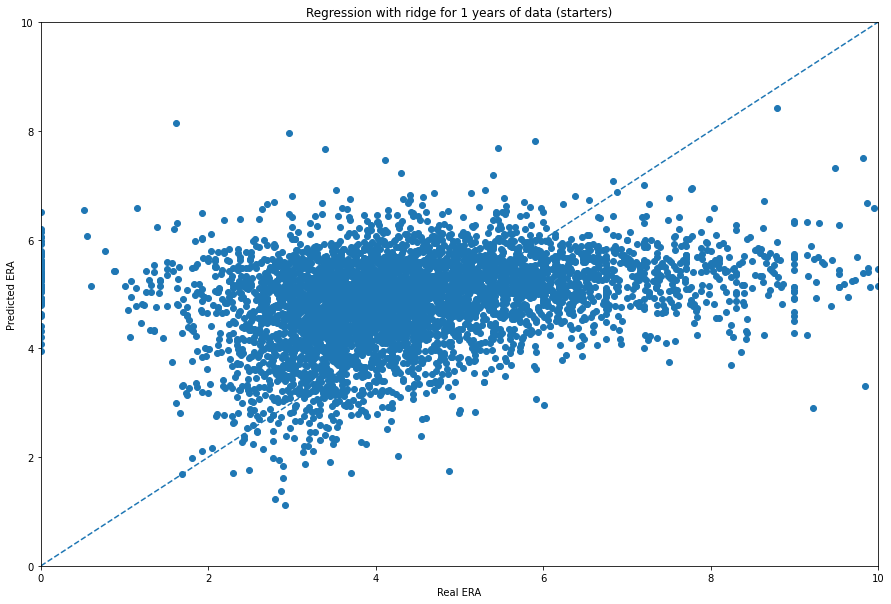

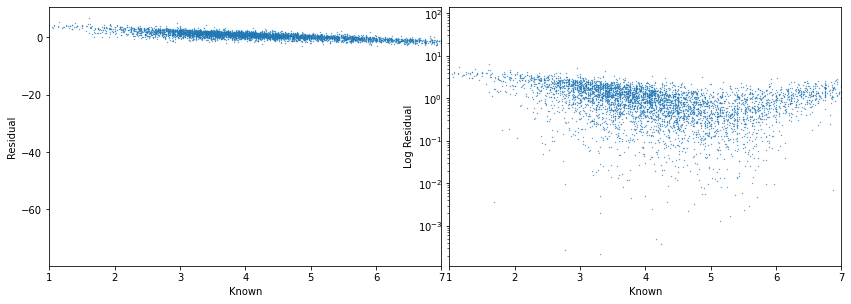

Percent of error less than one run: 0.47649325626204236


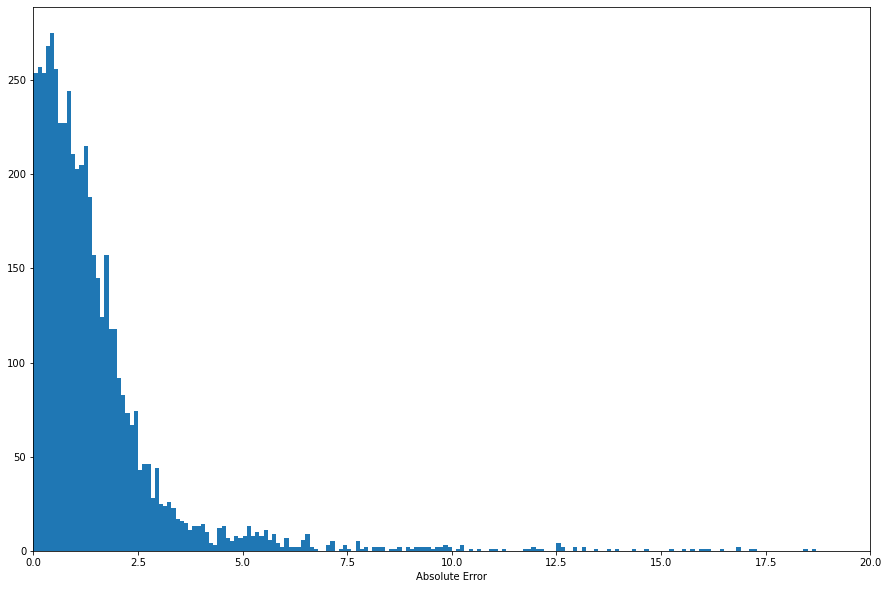

In [82]:
regression_program(df_one_yr,1,'ridge','ERA','starters')

The optimal regularization strength is:
[6719.07110321]


<ipython-input-81-b1ef9ccfb148>:105: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


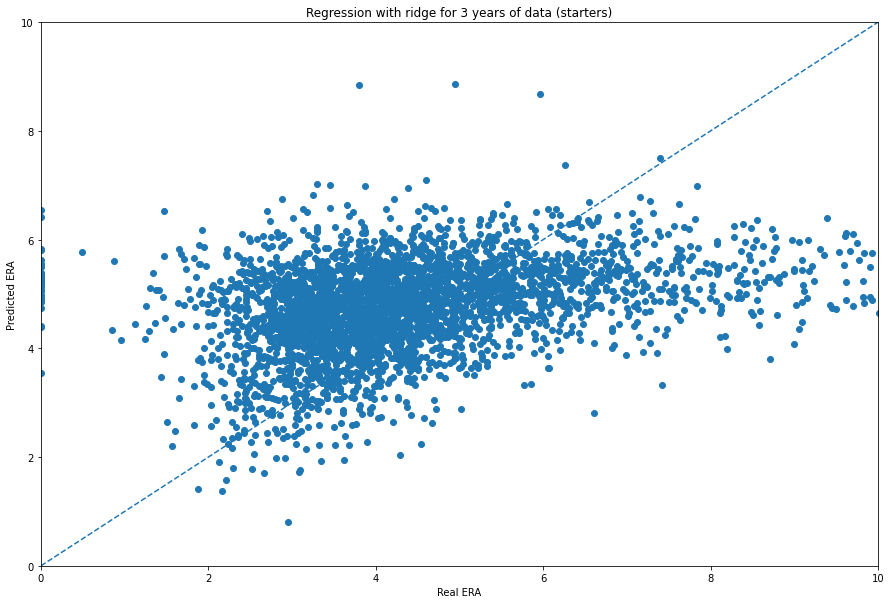

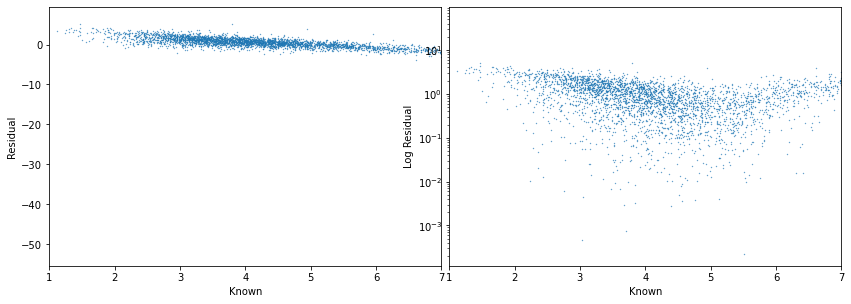

Percent of error less than one run: 0.5072302558398221


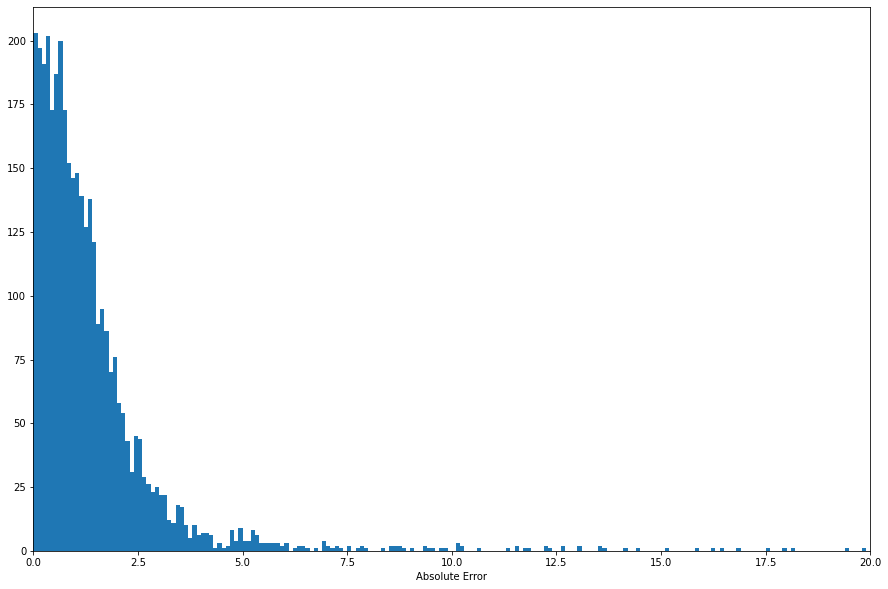

In [83]:
regression_program(df_three_yr,3,'ridge','ERA','starters')

The optimal regularization strength is:
[14079.73164932]


<ipython-input-81-b1ef9ccfb148>:105: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


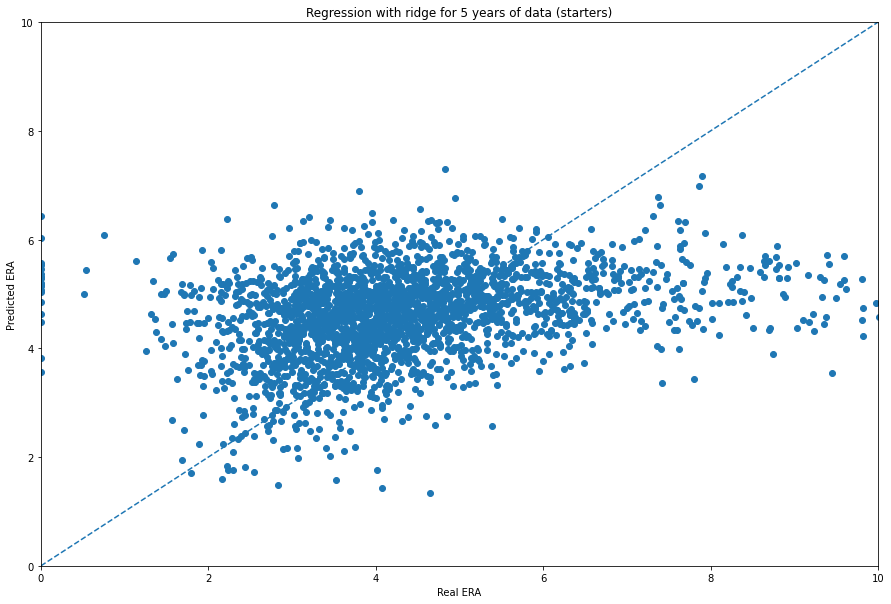

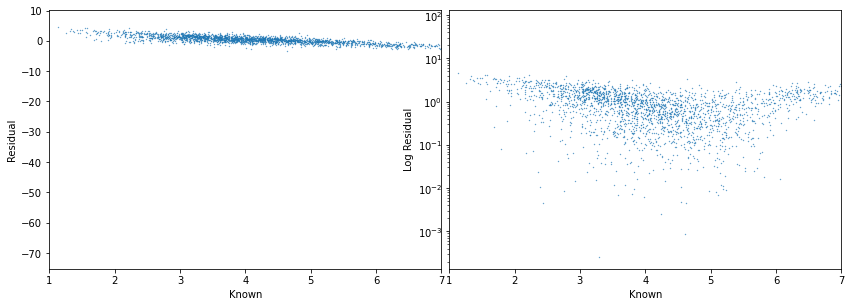

Percent of error less than one run: 0.5219512195121951


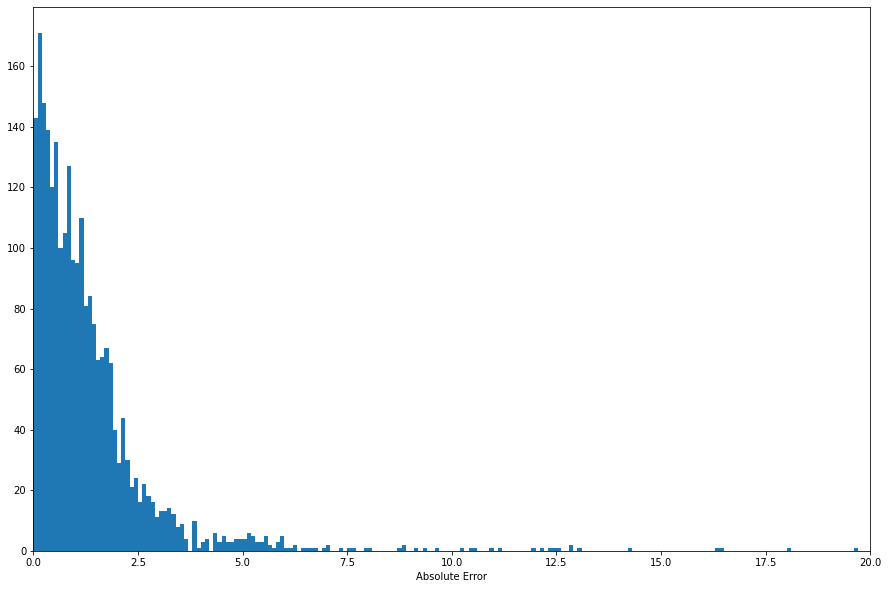

In [84]:
regression_program(df_five_yr,5,'ridge','ERA','starters')

The optimal regularization strength is:
[1841.02735256]


<ipython-input-81-b1ef9ccfb148>:105: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


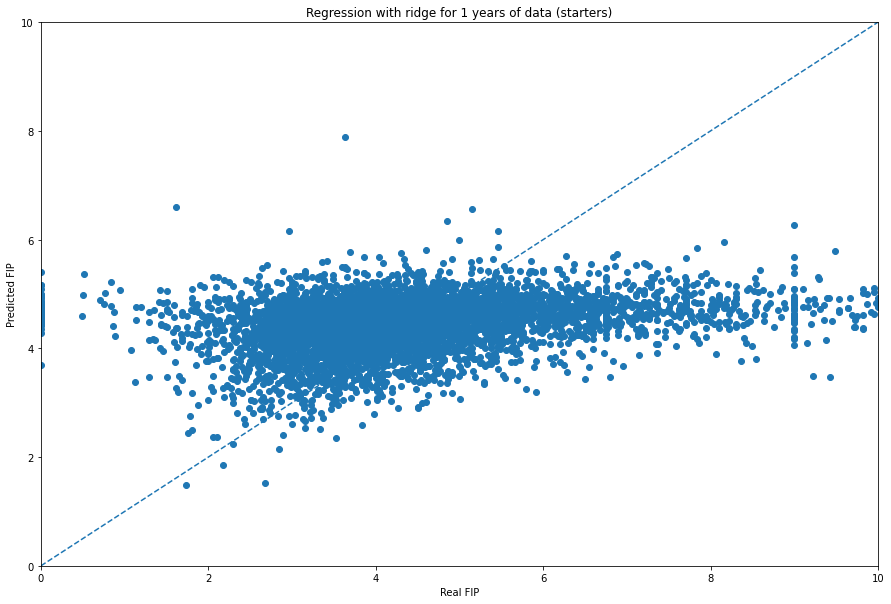

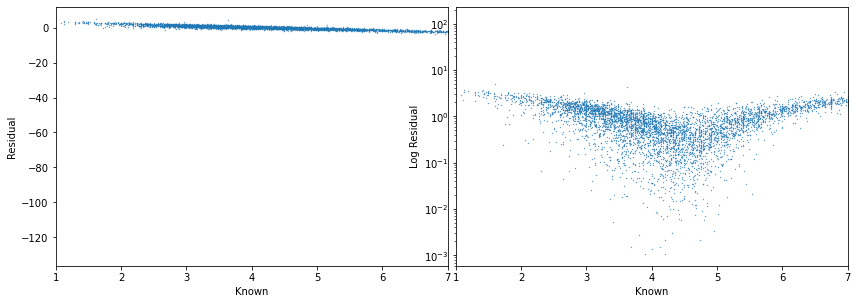

Percent of error less than one run: 0.5549132947976878


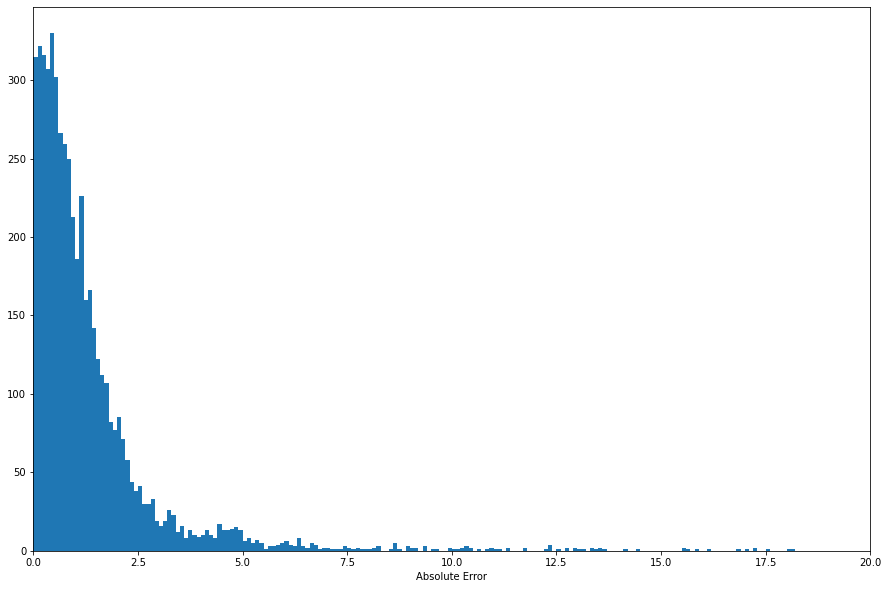

In [85]:
regression_program(df_one_yr,1,'ridge','FIP','starters')

The optimal regularization strength is:
[95.48159797]


<ipython-input-81-b1ef9ccfb148>:105: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


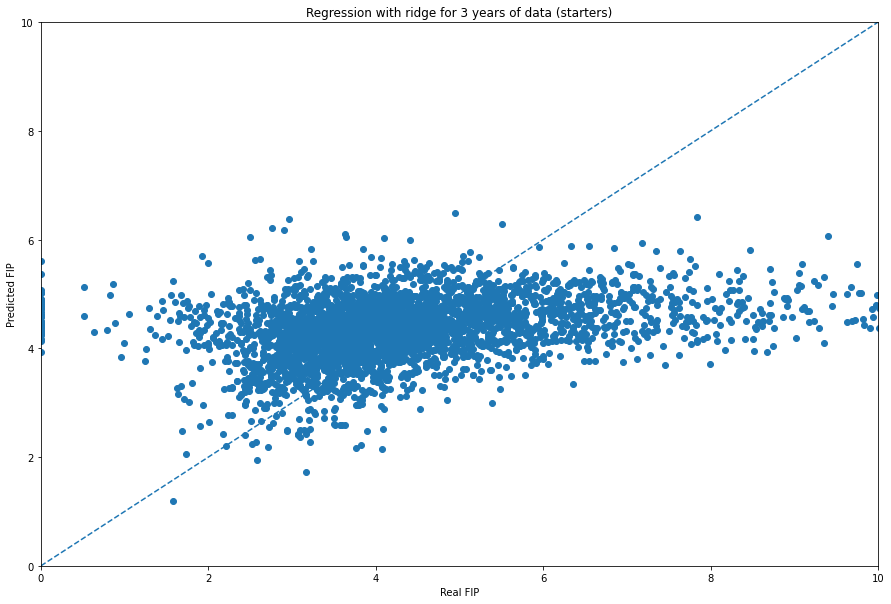

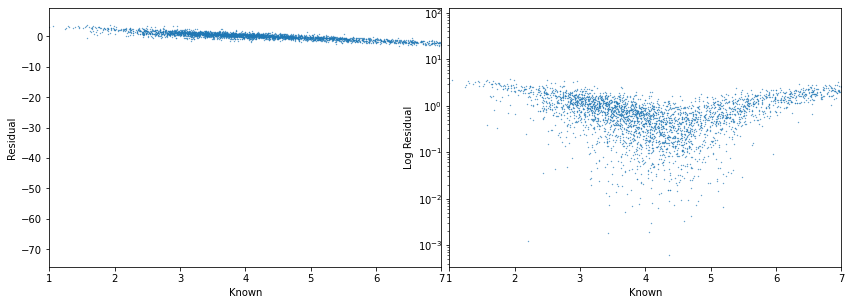

Percent of error less than one run: 0.585650723025584


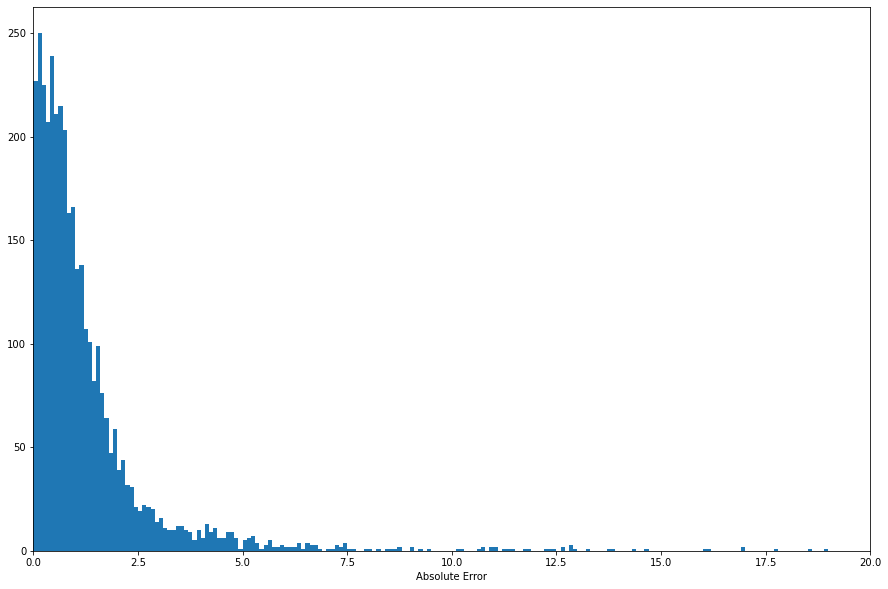

In [86]:
regression_program(df_three_yr,3,'ridge','FIP','starters')

The optimal regularization strength is:
[2.59211711]


<ipython-input-81-b1ef9ccfb148>:105: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


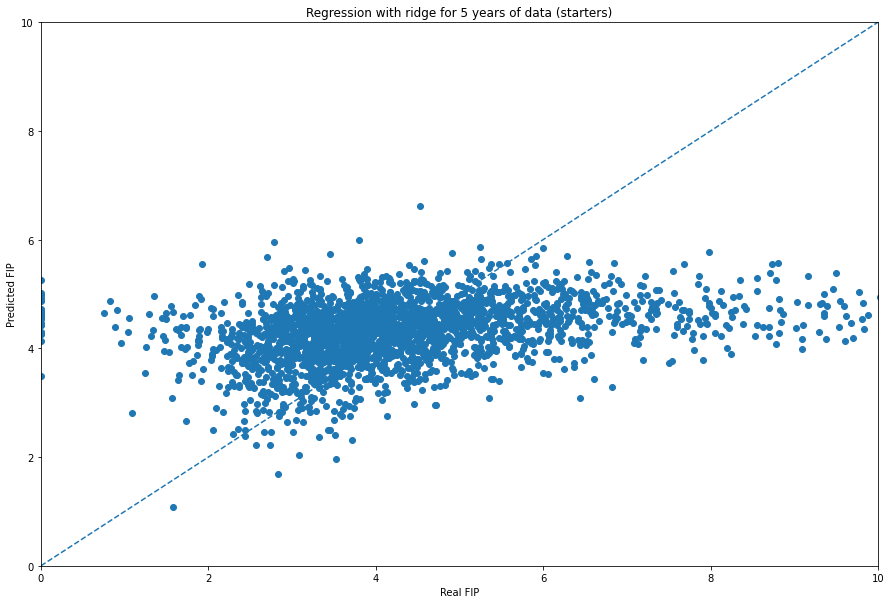

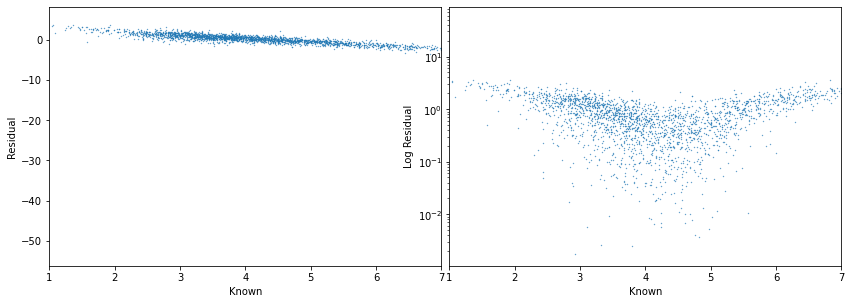

Percent of error less than one run: 0.5699186991869919


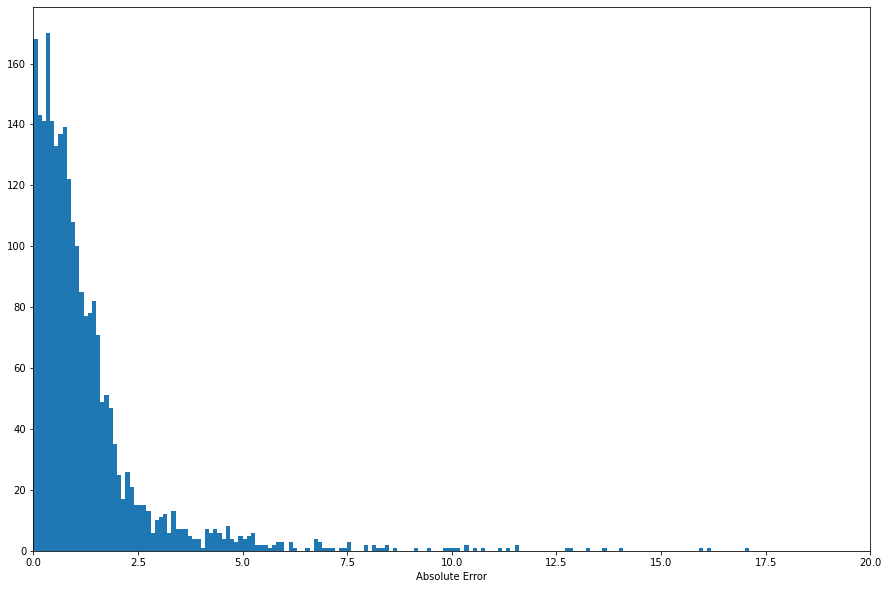

In [87]:
regression_program(df_five_yr,5,'ridge','FIP','starters')

In [73]:
def regression_iterator2(df_one_yr,df_three_yr,df_five_yr):
    method = ['ridge','ridge','ridge','ridge','ridge','ridge','lasso','lasso','lasso','lasso','lasso','lasso','ridge','ridge','ridge','ridge','ridge','ridge','lasso','lasso','lasso','lasso','lasso','lasso']
    output = ['ERA','ERA','ERA','FIP','FIP','FIP','ERA','ERA','ERA','FIP','FIP','FIP','ERA','ERA','ERA','FIP','FIP','FIP','ERA','ERA','ERA','FIP','FIP','FIP']
    pitcherType = ['starters','starters','starters','starters','starters','starters','starters','starters','starters','starters','starters','starters','relievers','relievers','relievers','relievers','relievers','relievers','relievers','relievers','relievers','relievers','relievers','relievers']
    years = [1,3,5,1,3,5,1,3,5,1,3,5,1,3,5,1,3,5,1,3,5,1,3,5]
    MAE = []
    LT1 = []
    STD = []
    for i in range(1,25,1):
        if i%3 == 1:
            df = df_one_yr
            yr = 1
        if i%3 == 2:
            df = df_three_yr
            yr = 3
        if i%3 == 0:
            df = df_five_yr
            yr = 5
        m = method[i-1]
        o = output[i-1]
        pt = pitcherType[i-1]
        lt1,mae,std = regression_program(df,yr,m,o,pt)
        MAE.append(mae)
        LT1.append(lt1)
        STD.append(std)
    df_precursor = {'Method': method,
                    'Output': output,
                    'PitcherType': pitcherType,
                    'Years': years,
                    'LT1': LT1,
                    'MAE': MAE,
                    'STD': STD}
    df_regression_results = pd.DataFrame(df_precursor,columns=['Method','Output','PitcherType','Years','LT1','MAE','STD'])
    
    return df_regression_results

The optimal regularization strength is:
[89496.74265472]


<ipython-input-72-9ed886227e69>:105: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


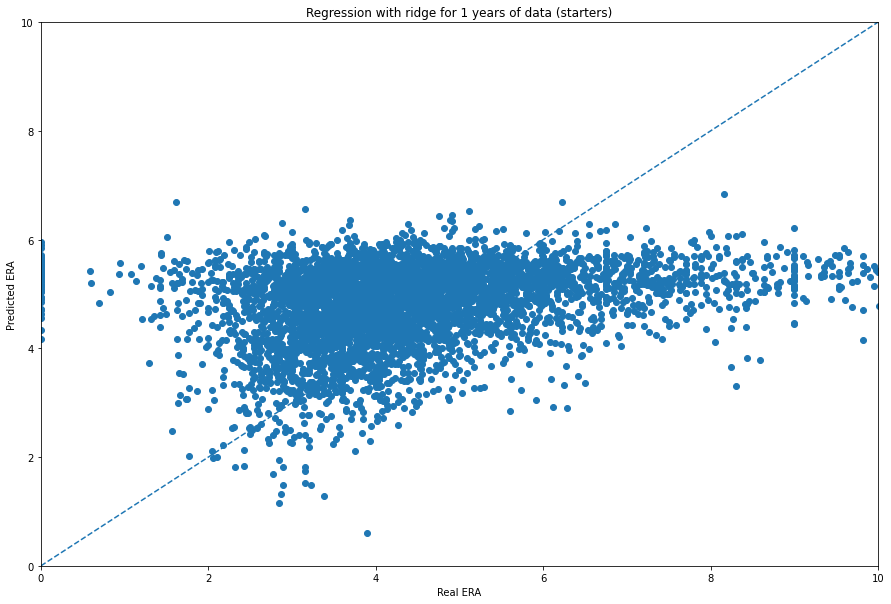

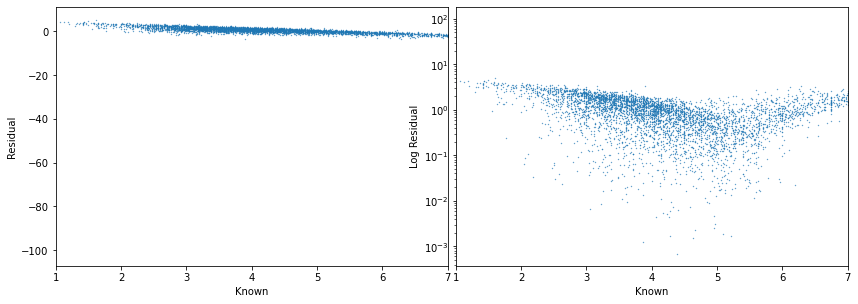

Percent of error less than one run: 0.48285163776493256
Mean Absolute Error: 1.6518062540109002
Standard Deviation: 3.801402540129037
The optimal regularization strength is:
[18.07291111]


<ipython-input-72-9ed886227e69>:105: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


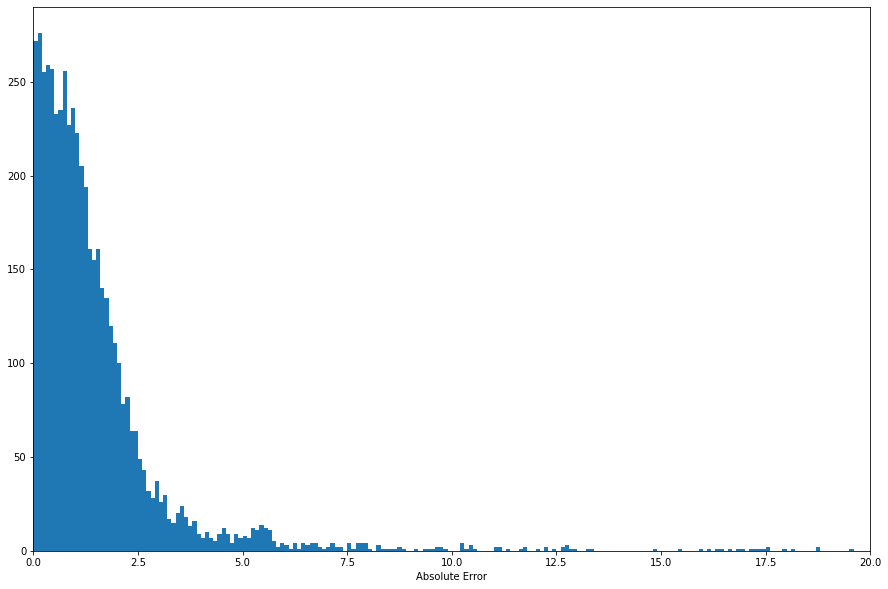

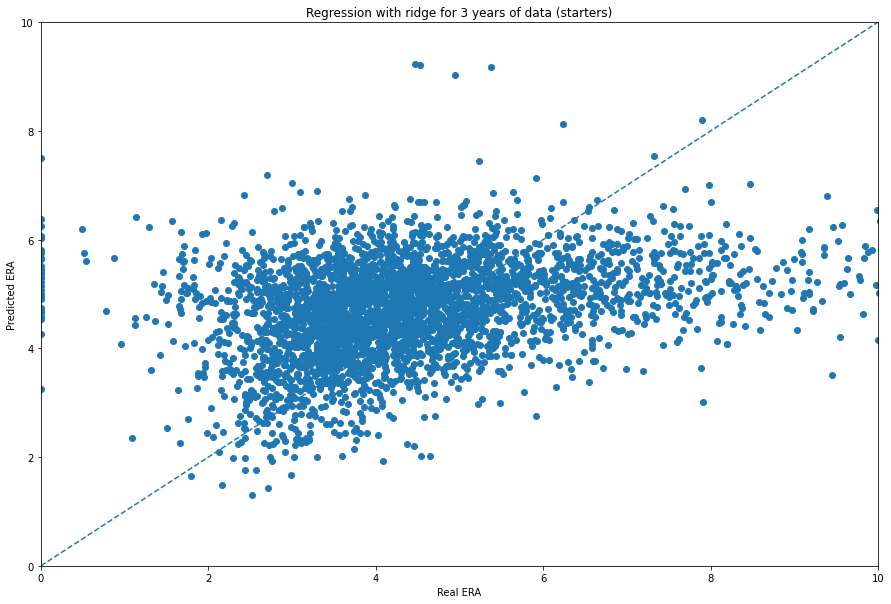

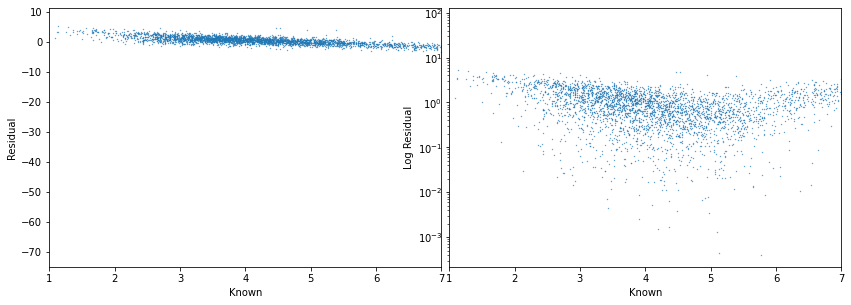

Percent of error less than one run: 0.5130700778642937
Mean Absolute Error: 1.5747721529733558
Standard Deviation: 3.544709330460699
The optimal regularization strength is:
[297780.03891029]


<ipython-input-72-9ed886227e69>:105: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


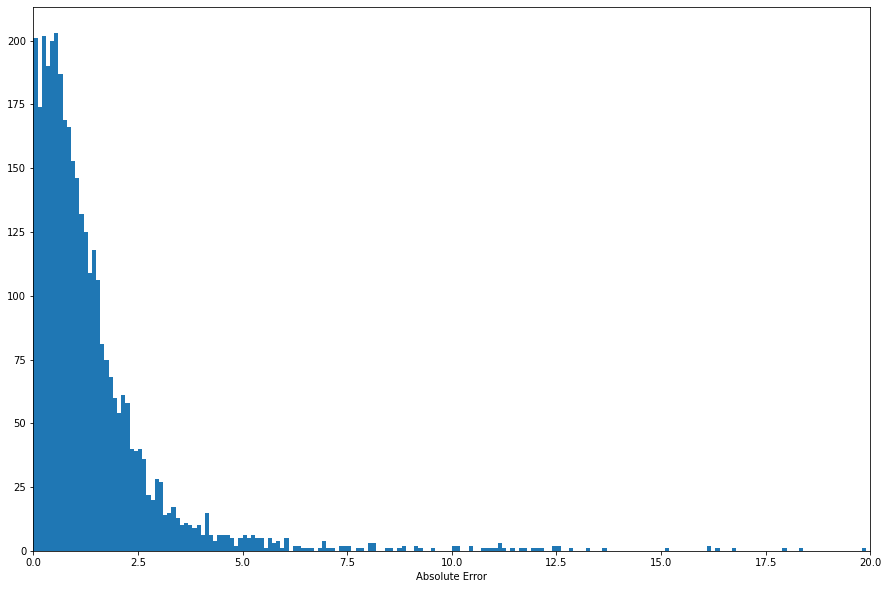

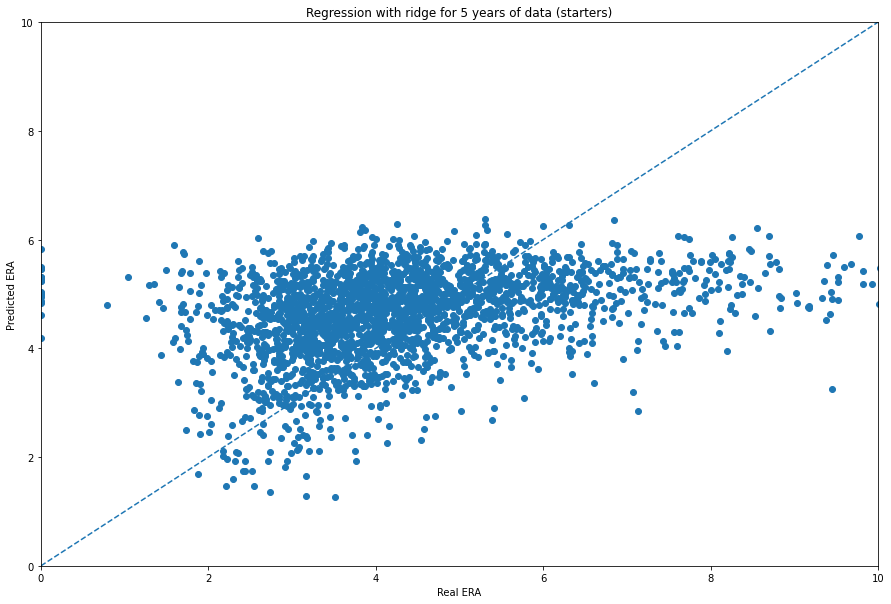

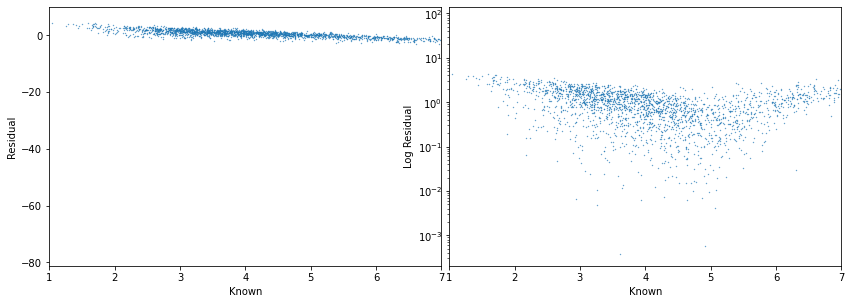

Percent of error less than one run: 0.4983739837398374
Mean Absolute Error: 1.515509964093761
Standard Deviation: 3.3658625438045933
The optimal regularization strength is:
[1678.41595163]


<ipython-input-72-9ed886227e69>:105: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


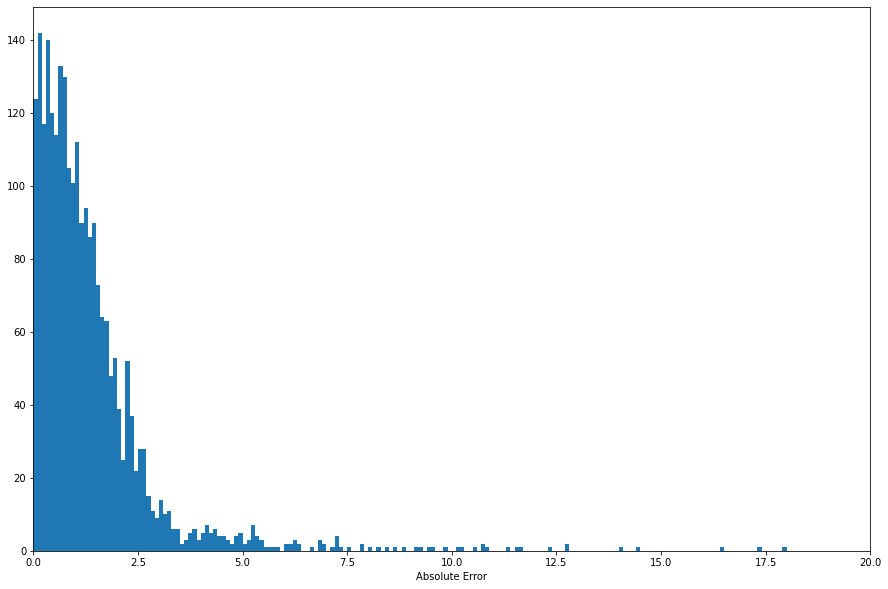

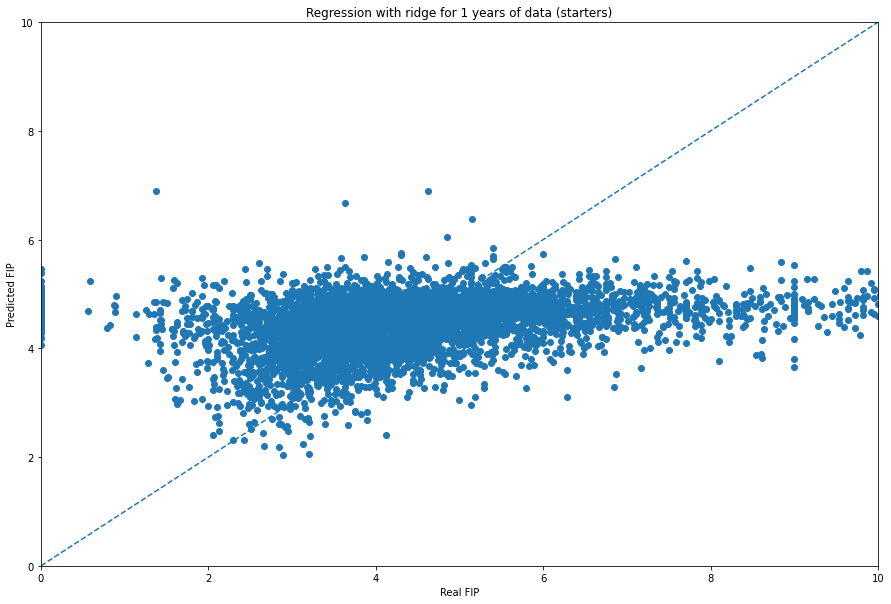

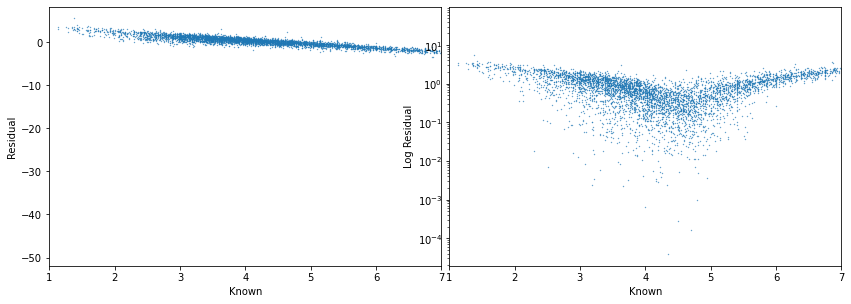

Percent of error less than one run: 0.5716763005780346
Mean Absolute Error: 1.4415793013626537
Standard Deviation: 2.8863494305555855
The optimal regularization strength is:
[0.21346038]


<ipython-input-72-9ed886227e69>:105: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


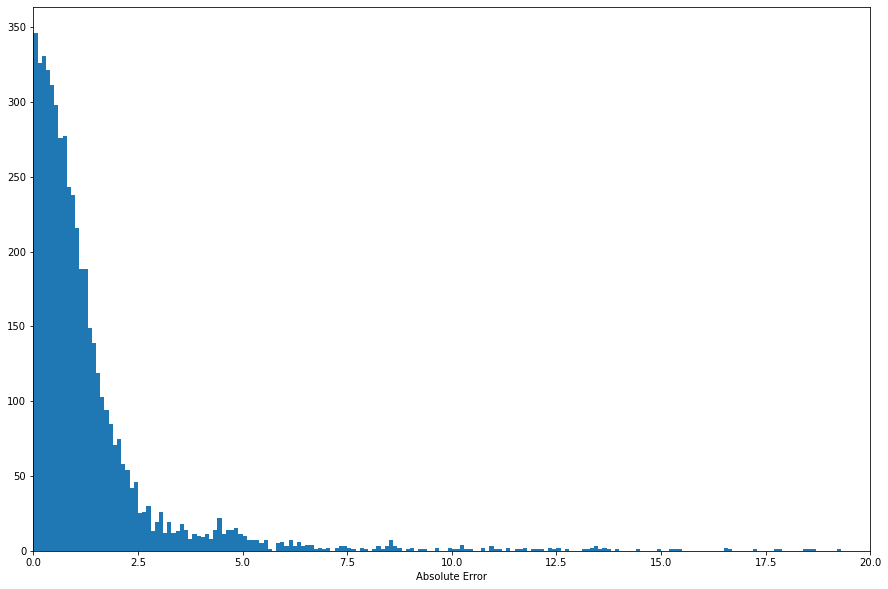

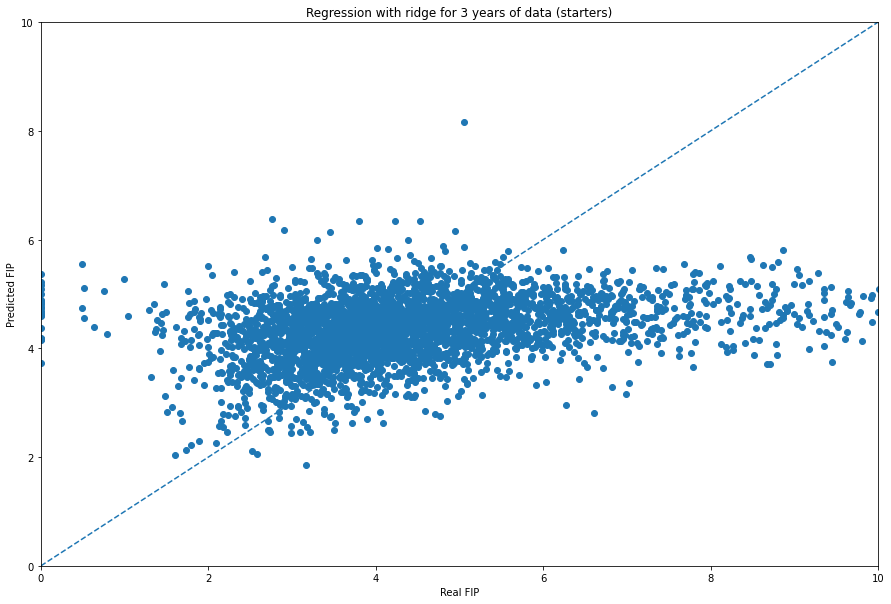

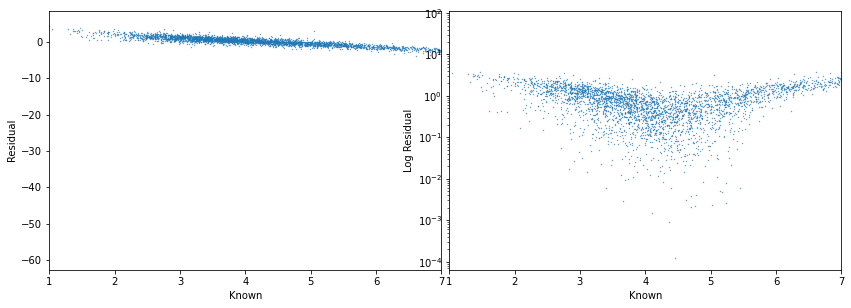

Percent of error less than one run: 0.57119021134594
Mean Absolute Error: 1.4752836509621479
Standard Deviation: 3.4659968394051908
The optimal regularization strength is:
[4231.61379345]


<ipython-input-72-9ed886227e69>:105: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


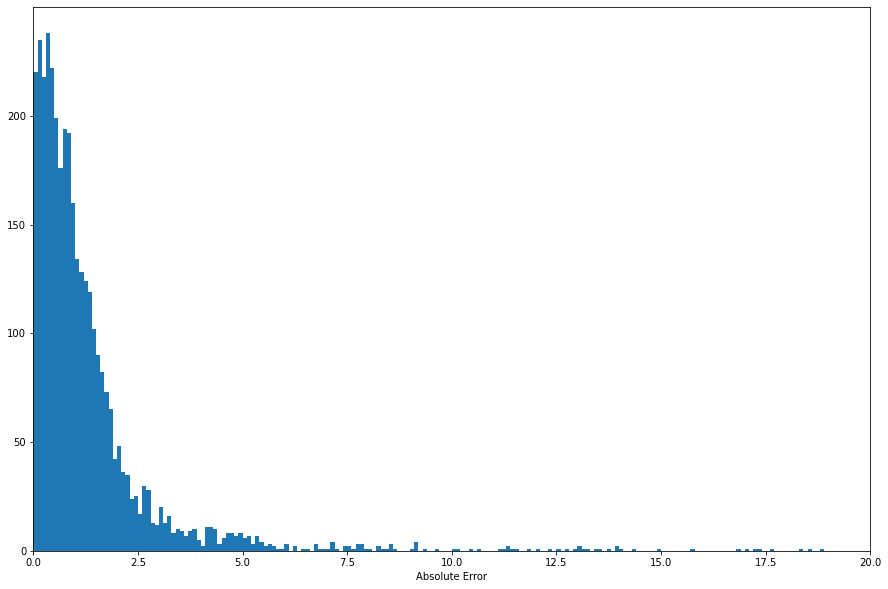

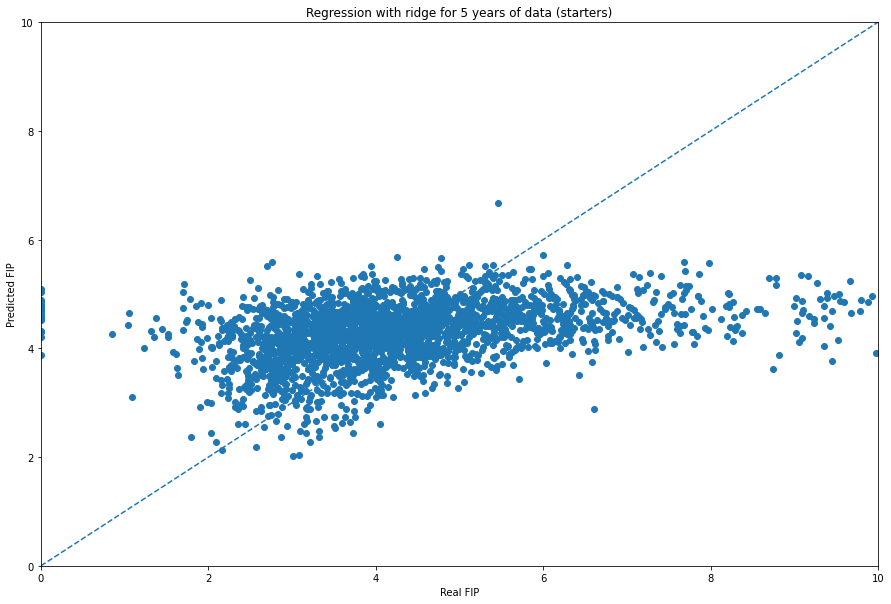

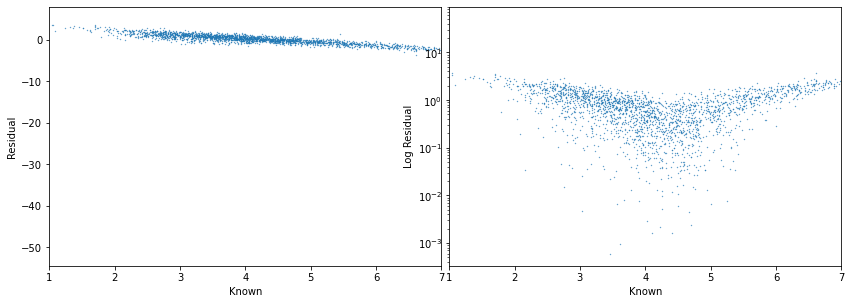

Percent of error less than one run: 0.5939024390243902
Mean Absolute Error: 1.3488668999002114
Standard Deviation: 2.995896982042505


C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 62709.050087351345, tolerance: 13.493358989117533
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 62543.80846665217, tolerance: 13.493358989117533
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 62363.142061819635, tolerance: 13.493358989117533
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceW

C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 45510.10197888734, tolerance: 13.493358989117533
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 44096.81139380645, tolerance: 13.493358989117533
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 42615.07555592012, tolerance: 13.493358989117533
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWar

C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2029.9663901747117, tolerance: 13.493358989117533
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1482.8840397609601, tolerance: 13.493358989117533
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 998.8869242152286, tolerance: 13.493358989117533
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceW

The optimal regularization strength is:
[0.0231986]


C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 36074.923410551746, tolerance: 13.493358989117533
  model = cd_fast.enet_coordinate_descent(
<ipython-input-72-9ed886227e69>:105: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


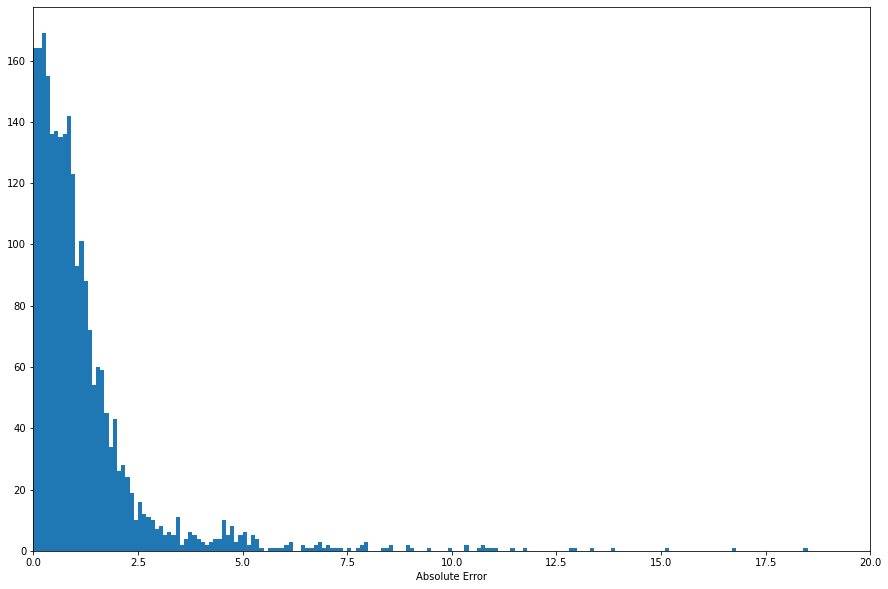

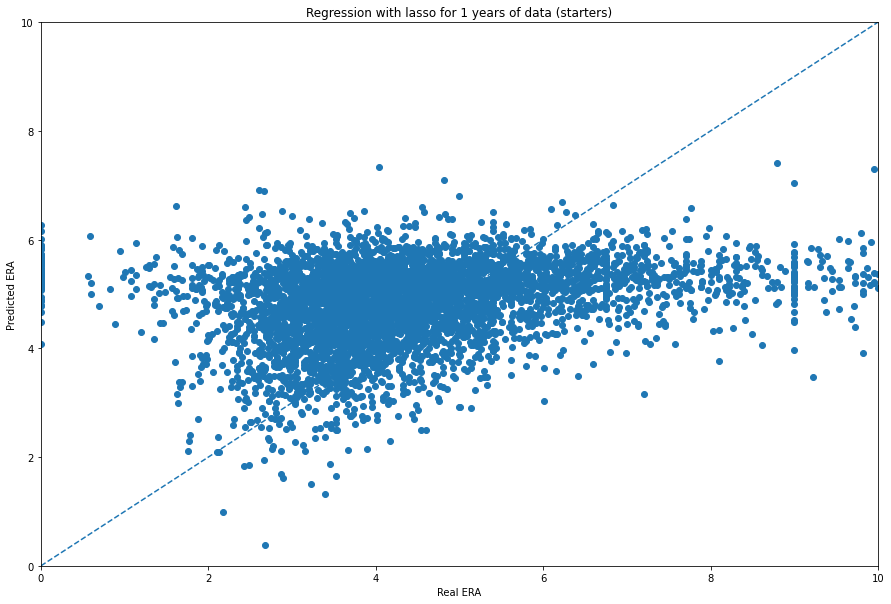

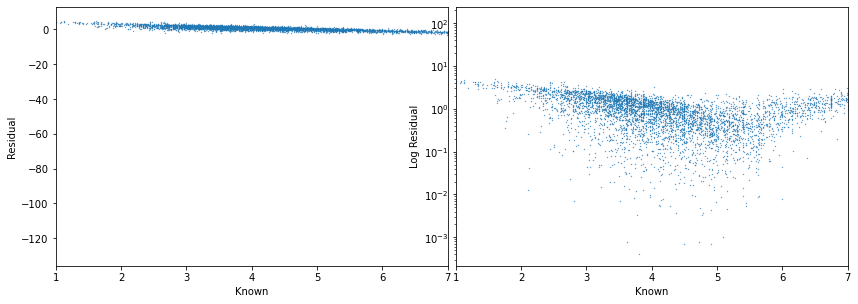

Percent of error less than one run: 0.4880539499036609
Mean Absolute Error: 1.6578395274658728
Standard Deviation: 3.9854006129139647


C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 33233.8780121547, tolerance: 7.277525381258992
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 33197.221694962915, tolerance: 7.277525381258992
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 33157.4472428832, tolerance: 7.277525381258992
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning

C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 28773.216692510967, tolerance: 7.277525381258992
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 28324.58150527004, tolerance: 7.277525381258992
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 27837.075953070962, tolerance: 7.277525381258992
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarn

C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 271.7519345537439, tolerance: 7.277525381258992
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 182.54021225782344, tolerance: 7.277525381258992
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 101.6120434162658, tolerance: 7.277525381258992
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarni

The optimal regularization strength is:
[0.11173591]


C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1722.1681314125526, tolerance: 7.277525381258992
  model = cd_fast.enet_coordinate_descent(
<ipython-input-72-9ed886227e69>:105: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


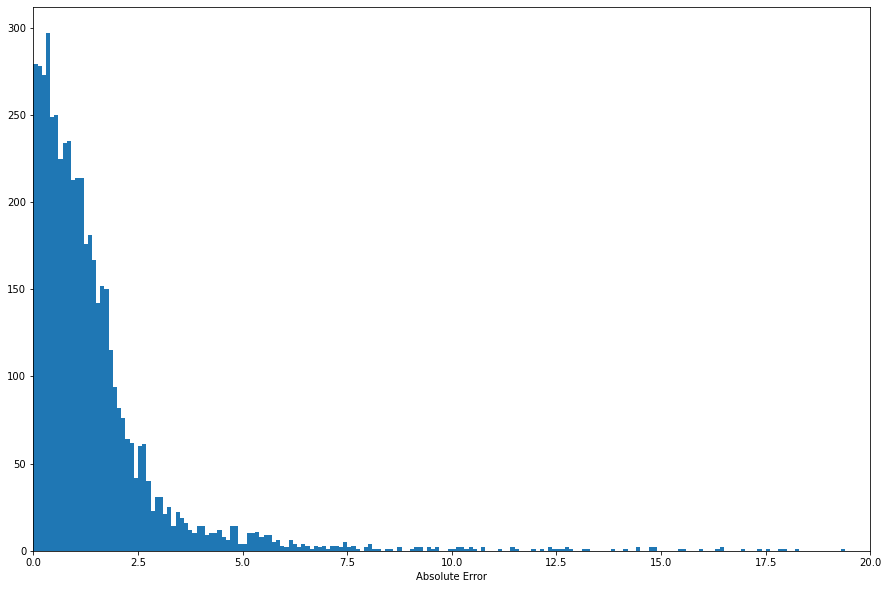

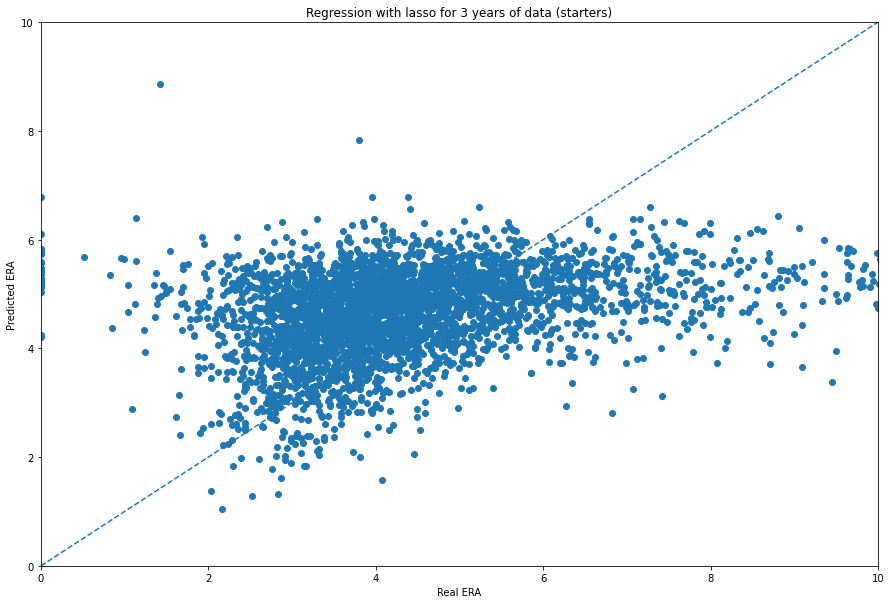

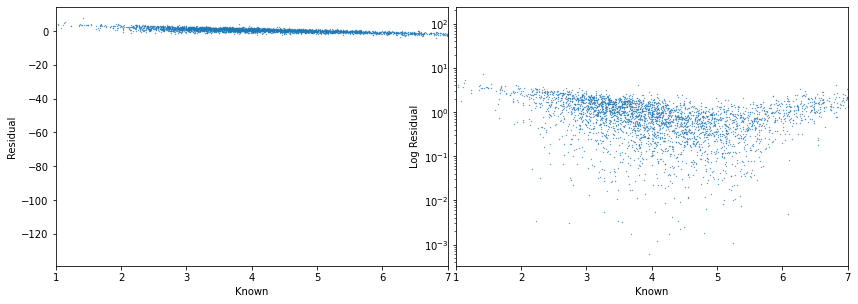

Percent of error less than one run: 0.5261401557285873
Mean Absolute Error: 1.5898723799109877
Standard Deviation: 4.423916079872123


C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 22042.50951315409, tolerance: 4.850613382762686
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 22013.29327781152, tolerance: 4.850613382762686
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 21981.345346673803, tolerance: 4.850613382762686
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarni

C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18510.733265761664, tolerance: 4.850613382762686
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18162.59757852268, tolerance: 4.850613382762686
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17778.249252617603, tolerance: 4.850613382762686
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarn

C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1406.837633795214, tolerance: 4.850613382762686
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1115.1672686635793, tolerance: 4.850613382762686
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 884.3468379124388, tolerance: 4.850613382762686
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarni

The optimal regularization strength is:
[0.07718807]


C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5696.234818522033, tolerance: 4.850613382762686
  model = cd_fast.enet_coordinate_descent(
<ipython-input-72-9ed886227e69>:105: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


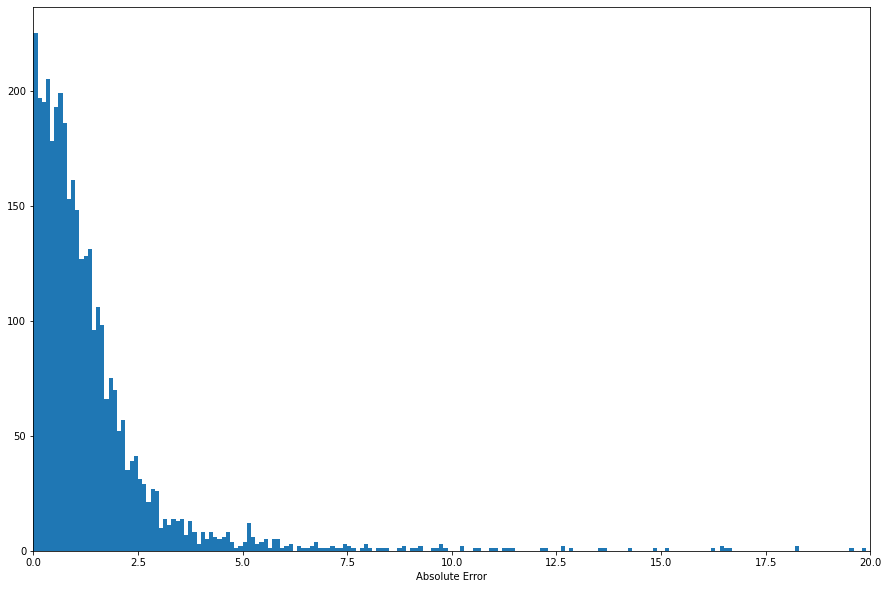

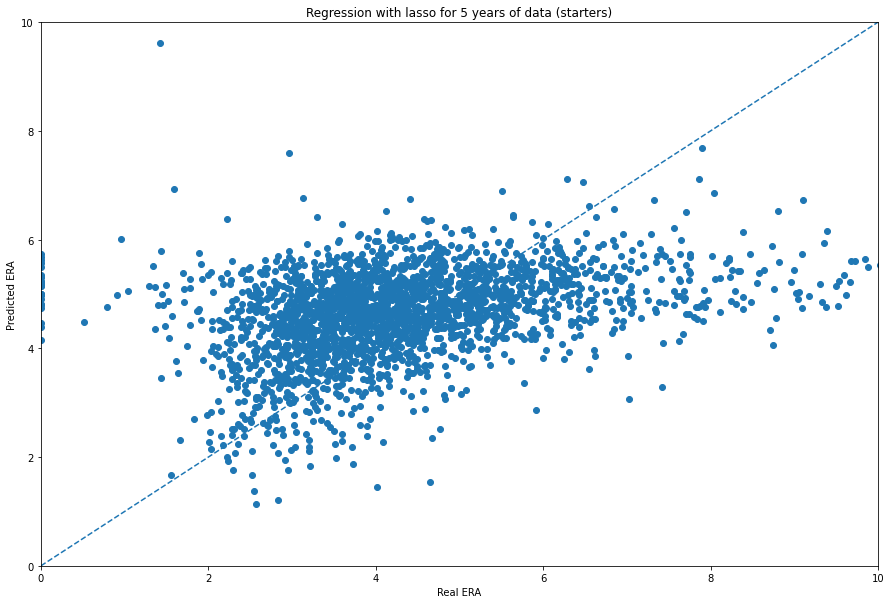

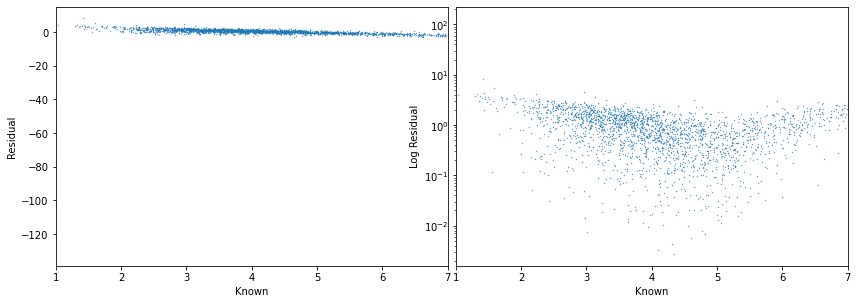

Percent of error less than one run: 0.532520325203252
Mean Absolute Error: 1.4445531710421717
Standard Deviation: 3.995605068470884


C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14643.962602824218, tolerance: 3.2832066935893414
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14599.556350154824, tolerance: 3.2832066935893414
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14550.878168634035, tolerance: 3.2832066935893414
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: Convergence

C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8182.113254513261, tolerance: 3.2832066935893414
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7686.481688964926, tolerance: 3.2832066935893414
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7173.462662635302, tolerance: 3.2832066935893414
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWar

The optimal regularization strength is:
[0.00209549]


C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14143.039761320617, tolerance: 3.2832066935893414
  model = cd_fast.enet_coordinate_descent(
<ipython-input-72-9ed886227e69>:105: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


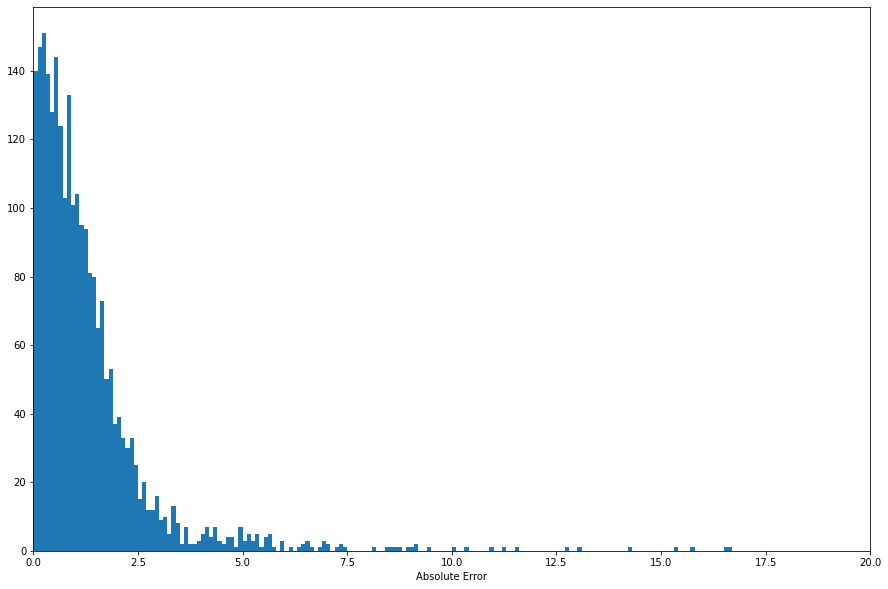

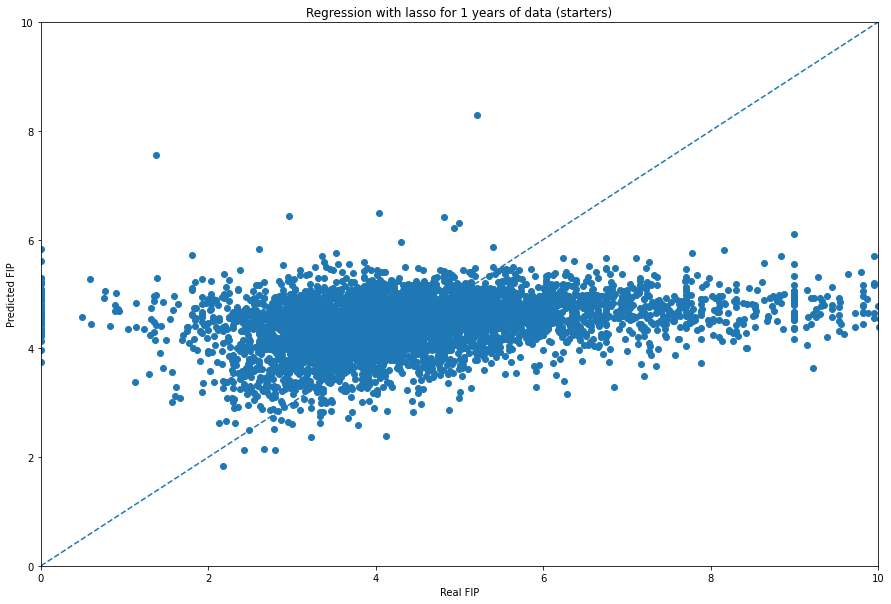

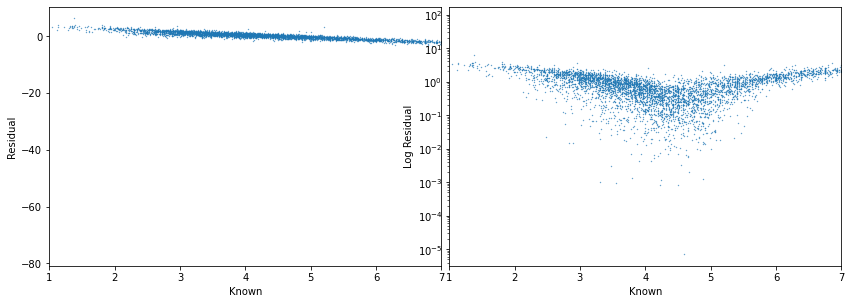

Percent of error less than one run: 0.5633911368015414
Mean Absolute Error: 1.4648607846470558
Standard Deviation: 3.1620607063117827


C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6964.116599441433, tolerance: 1.6799468205188253
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6938.555655908422, tolerance: 1.6799468205188253
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6910.696288095899, tolerance: 1.6799468205188253
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWar

C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4624.667678682708, tolerance: 1.6799468205188253
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4454.449347744702, tolerance: 1.6799468205188253
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4277.473583739291, tolerance: 1.6799468205188253
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWar

C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 69.85035791832343, tolerance: 1.6799468205188253
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 33.46833877611061, tolerance: 1.6799468205188253
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.955236963389325, tolerance: 1.6799468205188253
  model = cd_fast.enet_coordinate_descent(


The optimal regularization strength is:
[0.04861239]


C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 537.9664364957171, tolerance: 1.6799468205188253
  model = cd_fast.enet_coordinate_descent(
<ipython-input-72-9ed886227e69>:105: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


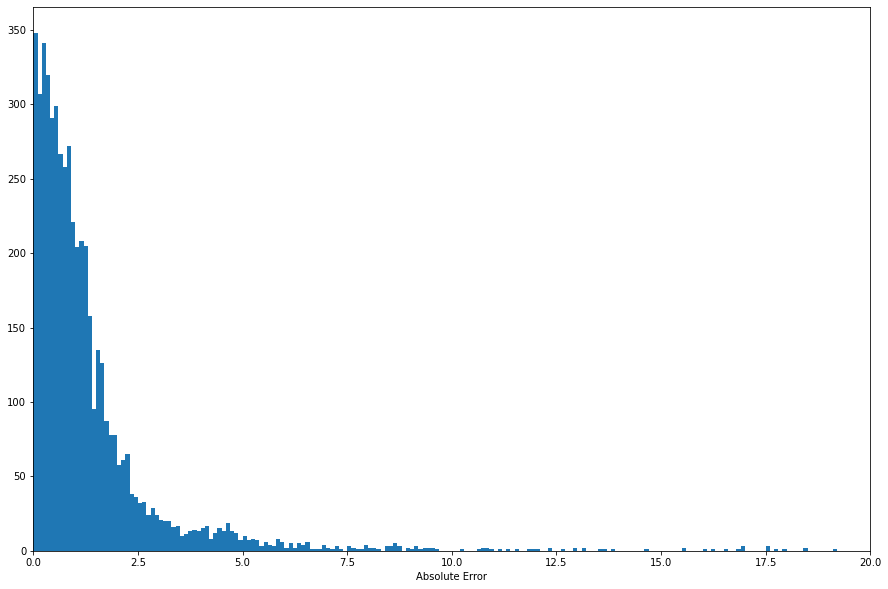

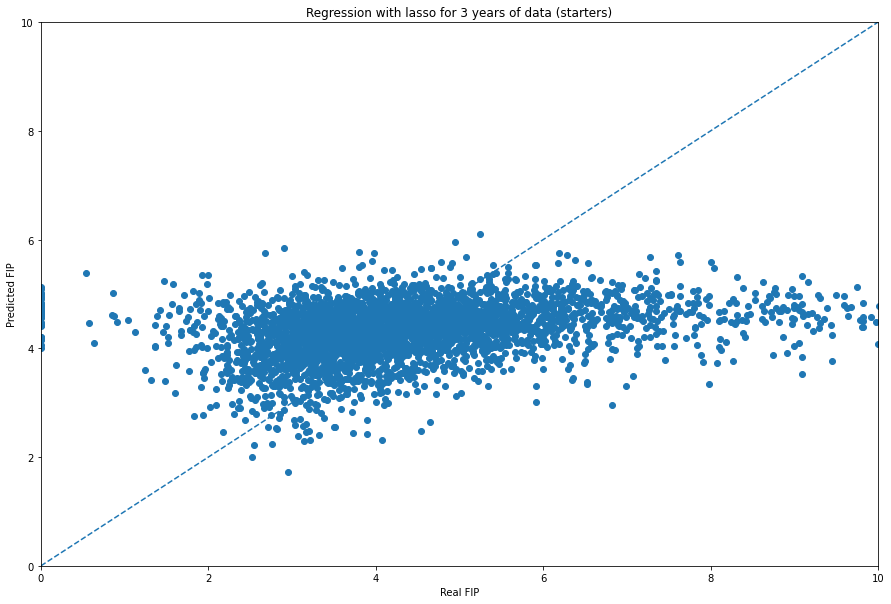

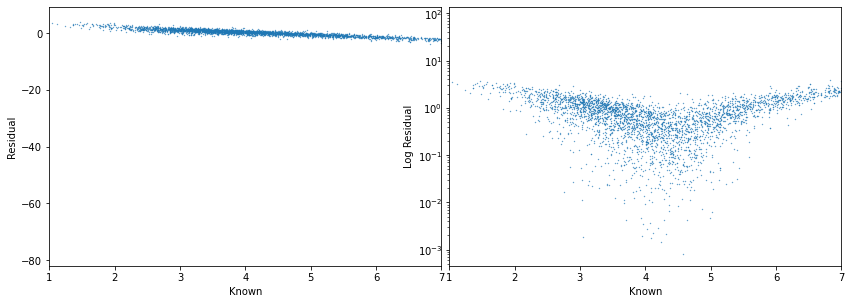

Percent of error less than one run: 0.5736929922135706
Mean Absolute Error: 1.4463346284477807
Standard Deviation: 3.5229461685235703


C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5059.065422779897, tolerance: 1.2336954210270055
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5036.742309562584, tolerance: 1.2336954210270055
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5012.273003988936, tolerance: 1.2336954210270055
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWar

C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2696.777116723555, tolerance: 1.2336954210270055
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2528.098462312888, tolerance: 1.2336954210270055
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2354.63250929067, tolerance: 1.2336954210270055
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarn

C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 91.55196613213593, tolerance: 1.2336954210270055
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 69.48965329614111, tolerance: 1.2336954210270055
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 35.60134388299957, tolerance: 1.2336954210270055
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWar

The optimal regularization strength is:
[0.02544617]


C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1485.9713391082596, tolerance: 1.2336954210270055
  model = cd_fast.enet_coordinate_descent(
<ipython-input-72-9ed886227e69>:105: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


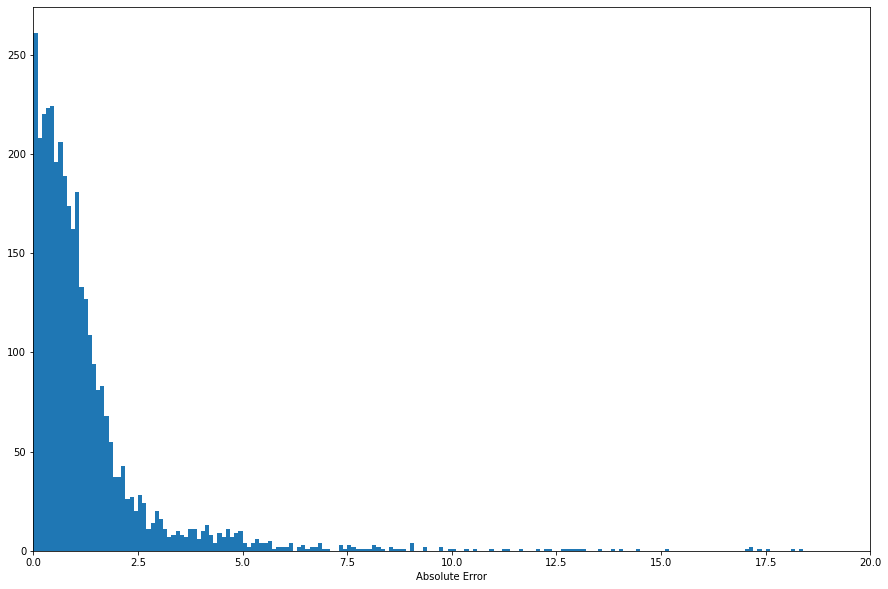

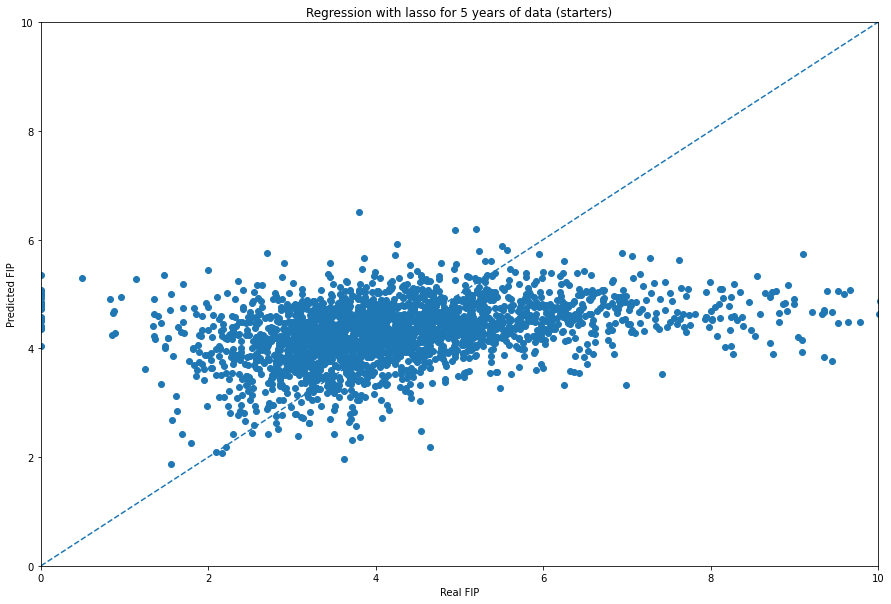

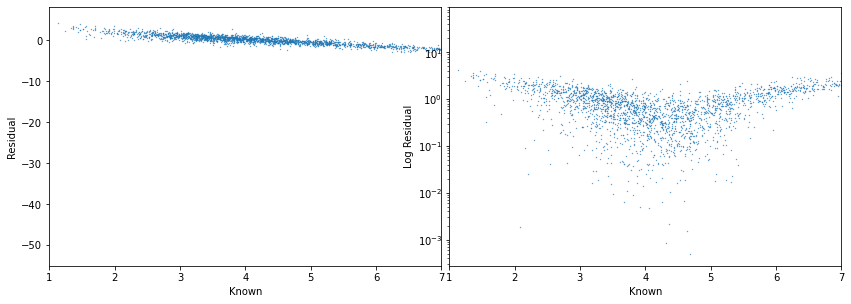

Percent of error less than one run: 0.5934959349593496
Mean Absolute Error: 1.2971168748763449
Standard Deviation: 2.6779594694288615
The optimal regularization strength is:
[10668.72325634]


<ipython-input-72-9ed886227e69>:105: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


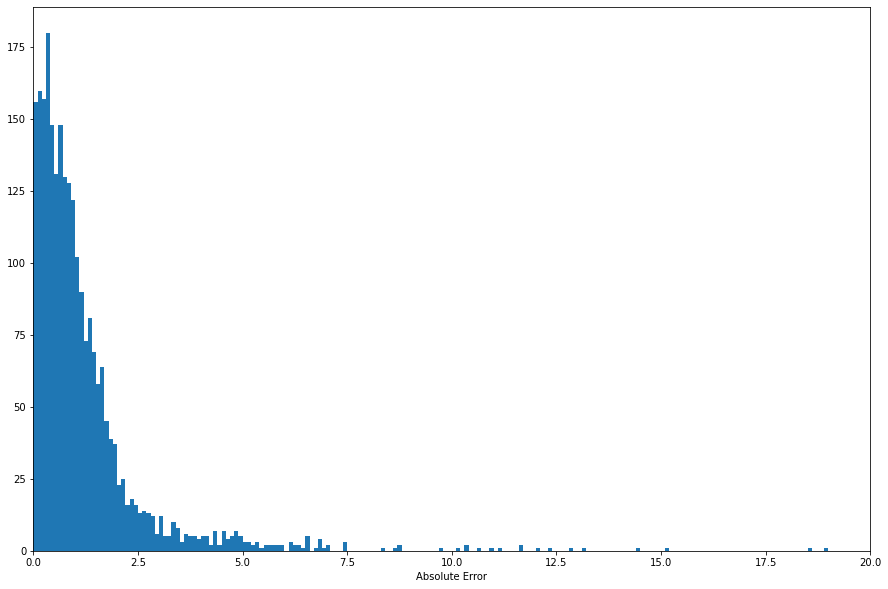

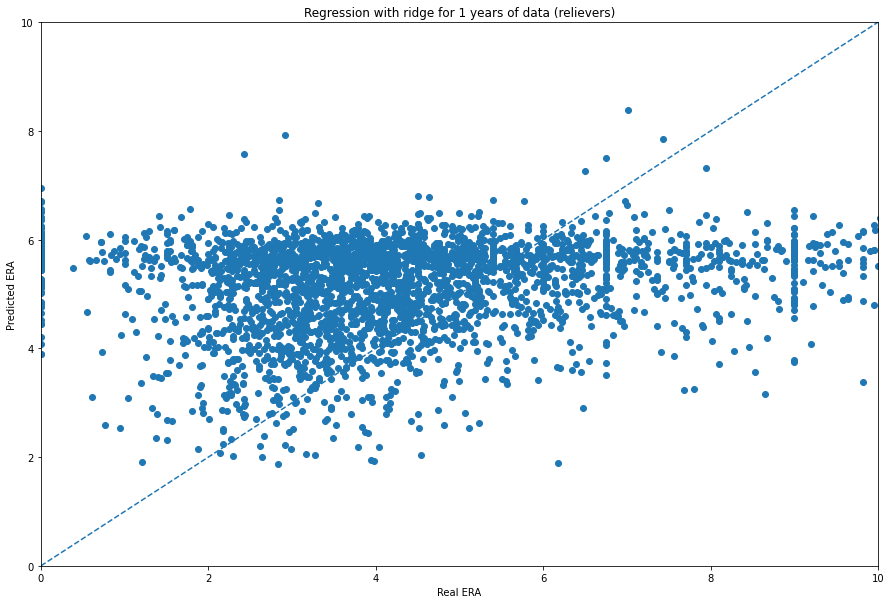

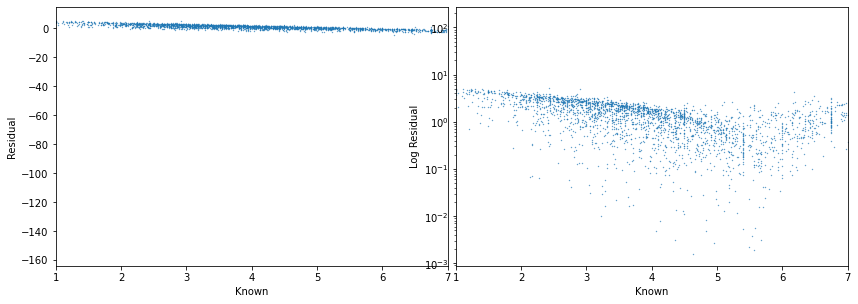

Percent of error less than one run: 0.3161628624305984
Mean Absolute Error: 2.658921760582205
Standard Deviation: 6.410678400829198
The optimal regularization strength is:
[56364.28679933]


<ipython-input-72-9ed886227e69>:105: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


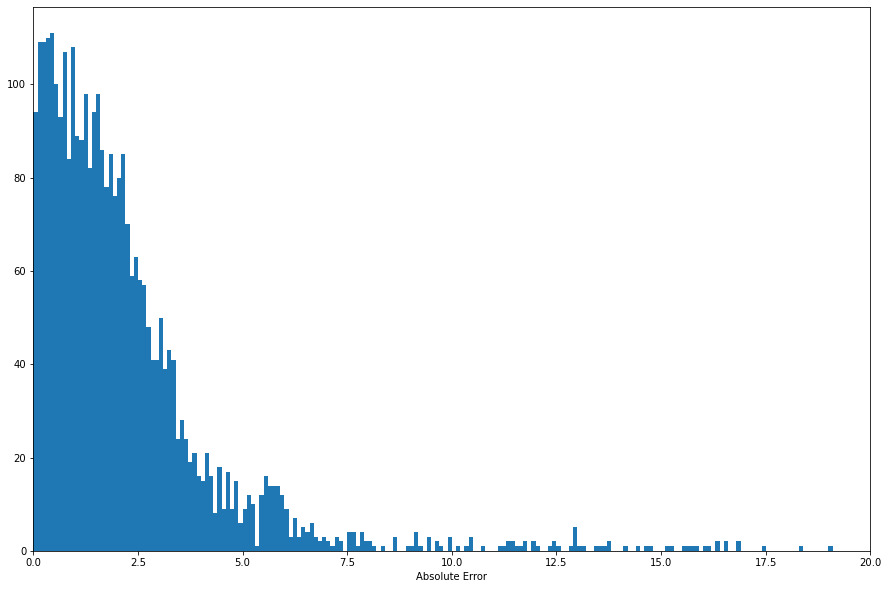

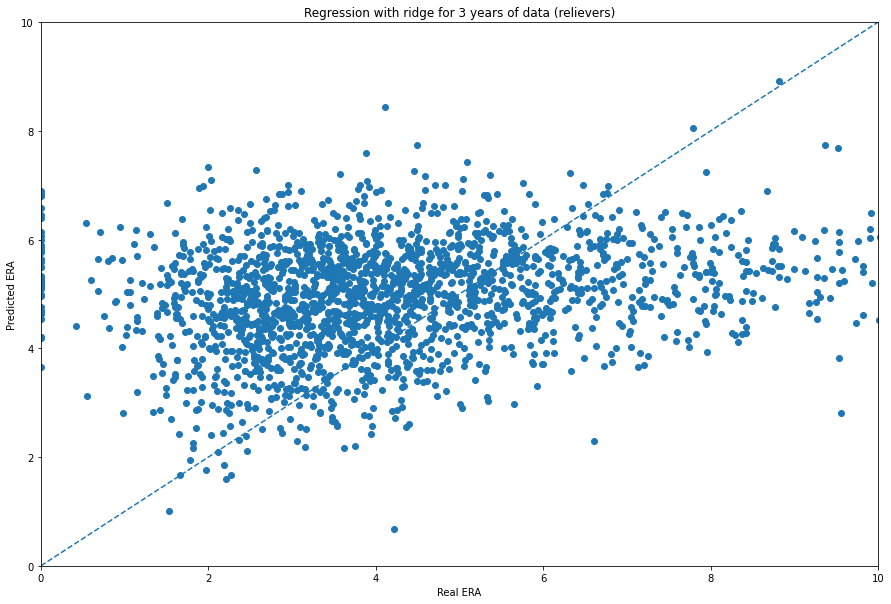

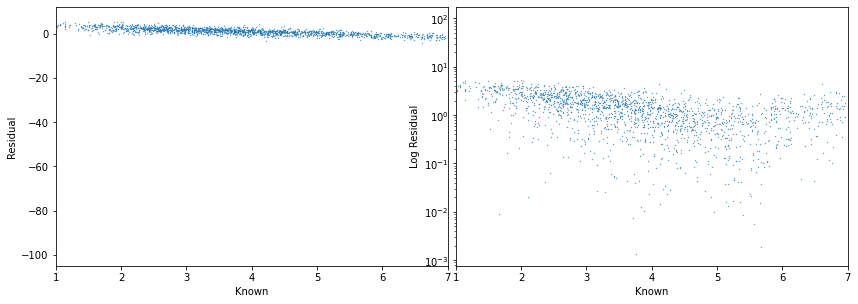

Percent of error less than one run: 0.3267790262172285
Mean Absolute Error: 2.3432009393781397
Standard Deviation: 5.054242007421253
The optimal regularization strength is:
[67814.92740831]


<ipython-input-72-9ed886227e69>:105: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


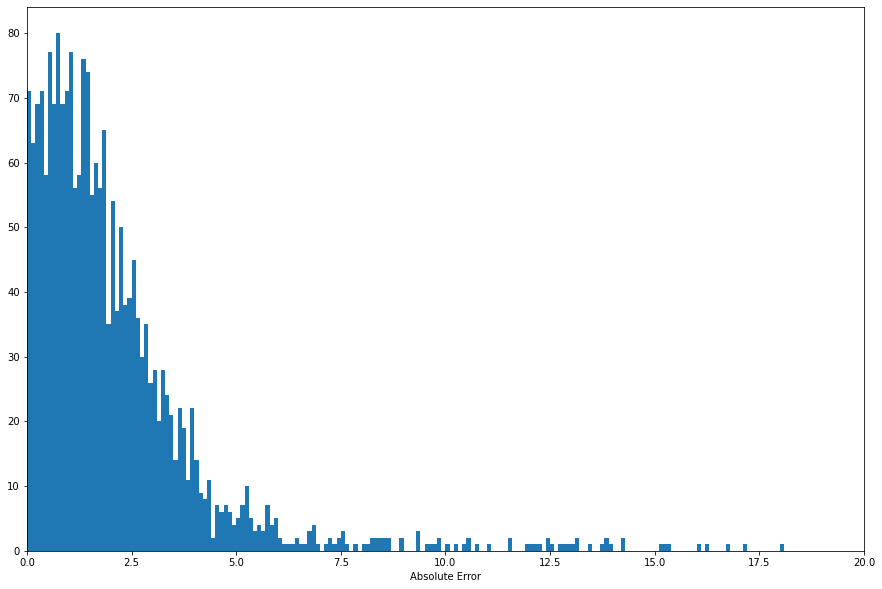

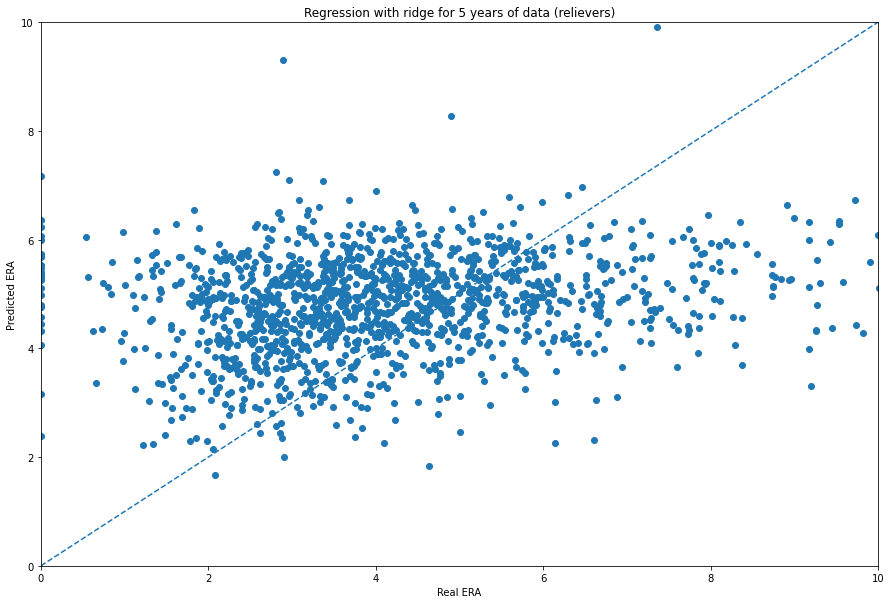

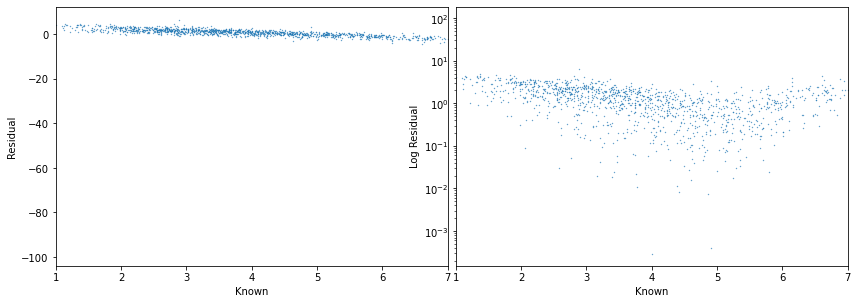

Percent of error less than one run: 0.3463611859838275
Mean Absolute Error: 2.210840760179592
Standard Deviation: 4.782852981367396
The optimal regularization strength is:
[3857.85039107]


<ipython-input-72-9ed886227e69>:105: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


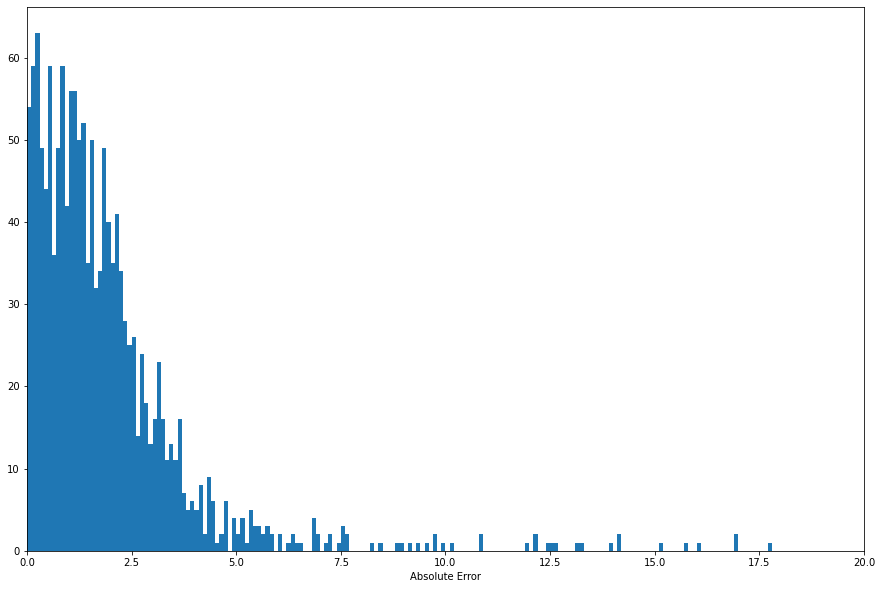

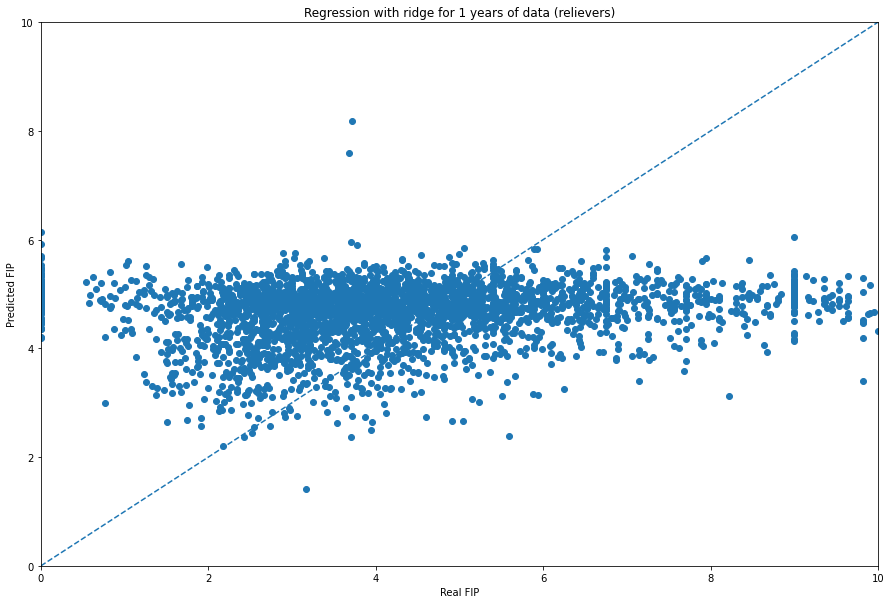

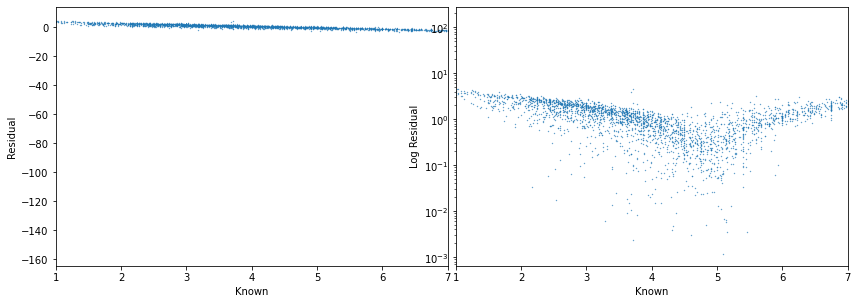

Percent of error less than one run: 0.3689080814312153
Mean Absolute Error: 2.395541571315937
Standard Deviation: 5.674713424152909
The optimal regularization strength is:
[29503.9061608]


<ipython-input-72-9ed886227e69>:105: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


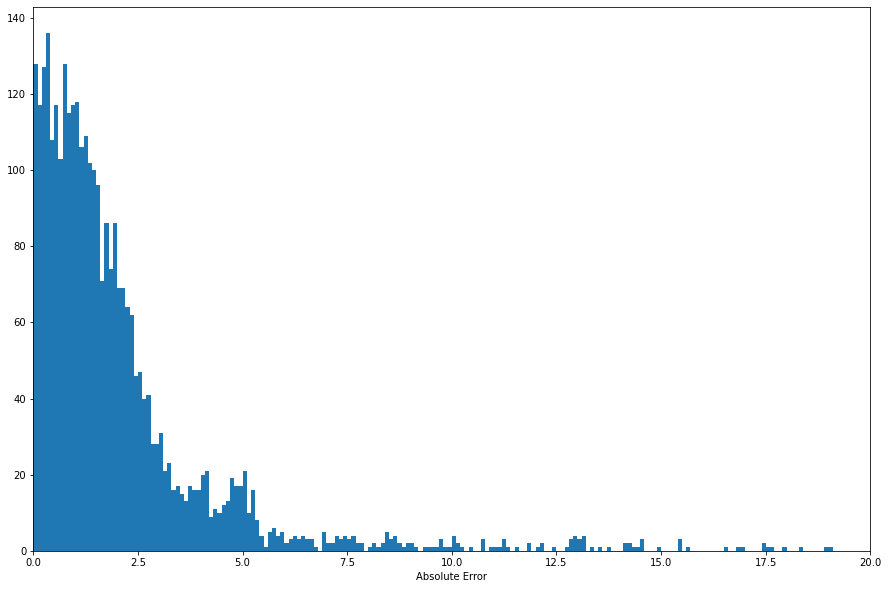

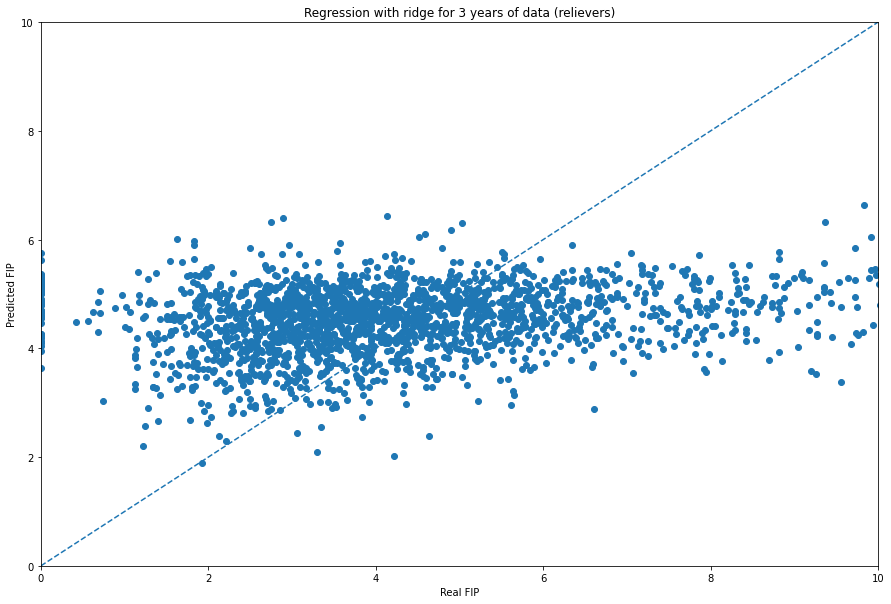

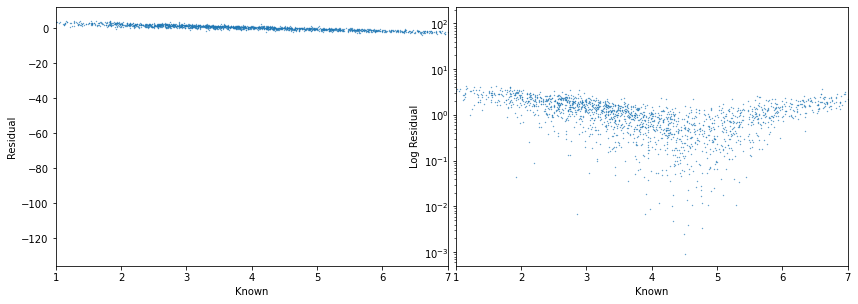

Percent of error less than one run: 0.38436329588014984
Mean Absolute Error: 2.232414336651216
Standard Deviation: 5.966745390235153
The optimal regularization strength is:
[15443.83027225]


<ipython-input-72-9ed886227e69>:105: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


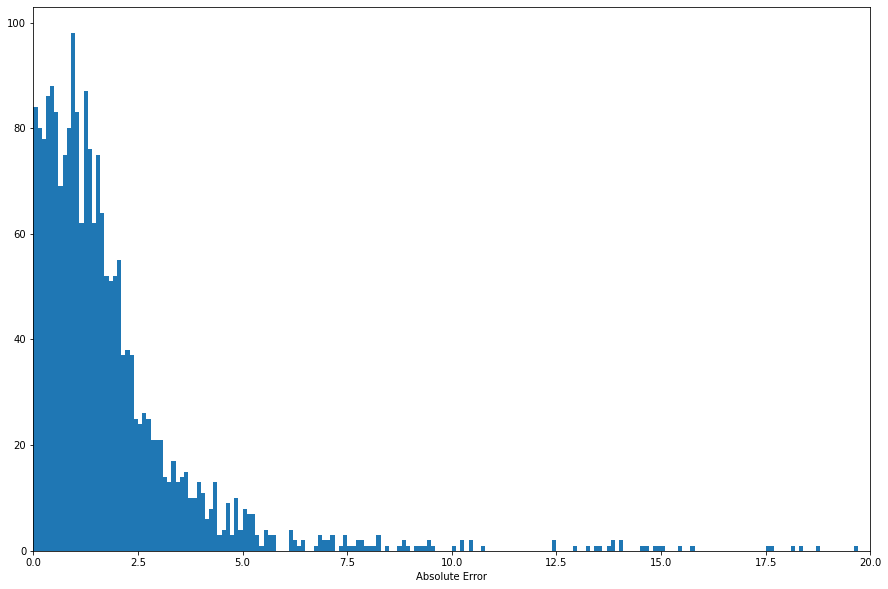

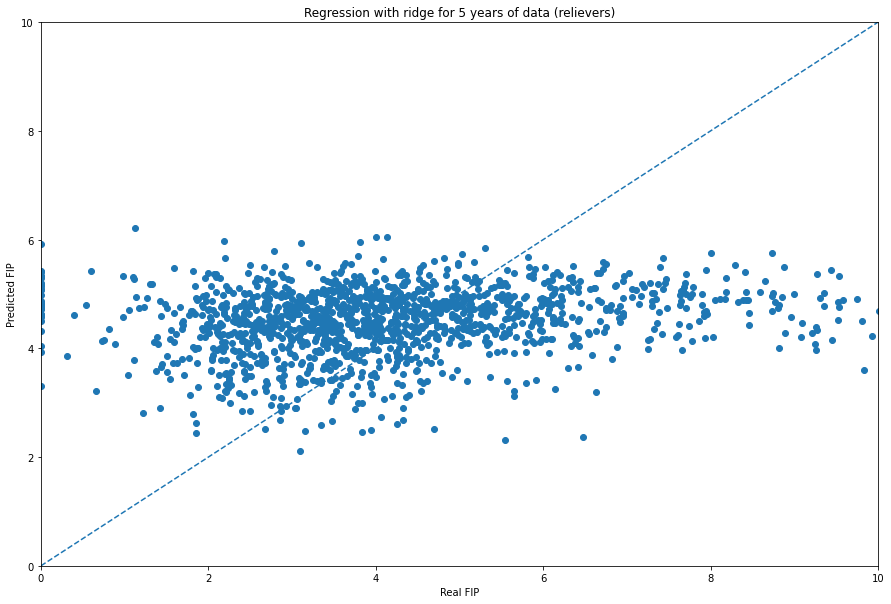

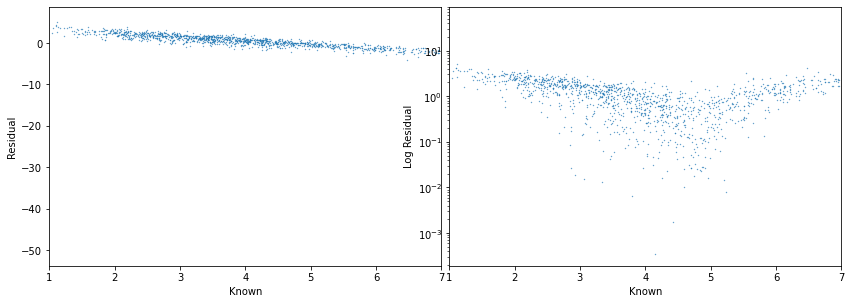

Percent of error less than one run: 0.39555256064690025
Mean Absolute Error: 2.0102216303164835
Standard Deviation: 3.9469001099389667


C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 126850.2281408774, tolerance: 27.323850589722397
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 126216.47070777306, tolerance: 27.323850589722397
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 125519.2514549741, tolerance: 27.323850589722397
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWa

C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 21943.102133623383, tolerance: 27.323850589722397
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 19016.554485633096, tolerance: 27.323850589722397
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16308.424350997753, tolerance: 27.323850589722397
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: Convergence

The optimal regularization strength is:
[0.14746016]


<ipython-input-72-9ed886227e69>:105: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


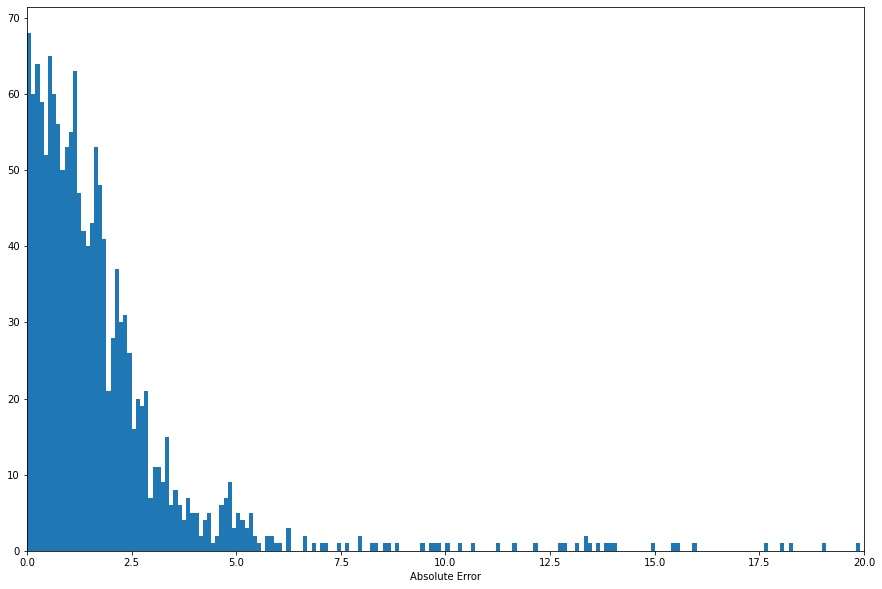

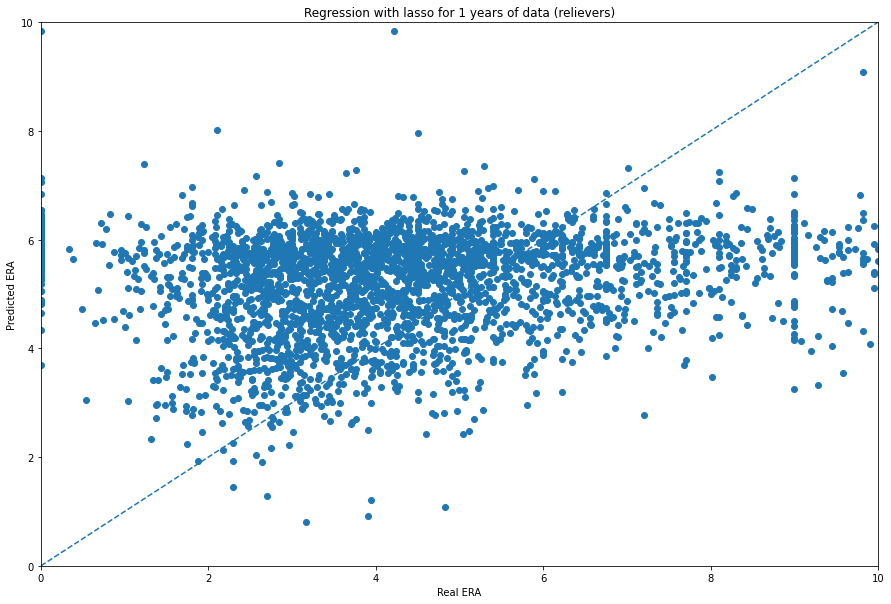

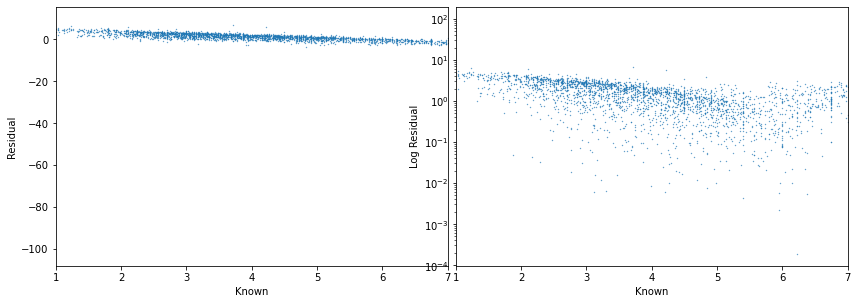

Percent of error less than one run: 0.30876002467612584
Mean Absolute Error: 2.4865768096056224
Standard Deviation: 4.73656544078646


C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 44599.19152538132, tolerance: 9.649577373685156
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 44465.61512708222, tolerance: 9.649577373685156
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 44317.74282395235, tolerance: 9.649577373685156
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarnin

C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 22105.579908986747, tolerance: 9.649577373685156
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 19451.25430580382, tolerance: 9.649577373685156
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16575.965797172496, tolerance: 9.649577373685156
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarn

C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 179.57665713677125, tolerance: 9.649577373685156
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 127.323092651146, tolerance: 9.649577373685156
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 66.46466205673642, tolerance: 9.649577373685156
  model = cd_fast.enet_coordinate_descent(


The optimal regularization strength is:
[0.11173591]


C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 699.2615134475927, tolerance: 9.649577373685156
  model = cd_fast.enet_coordinate_descent(
<ipython-input-72-9ed886227e69>:105: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


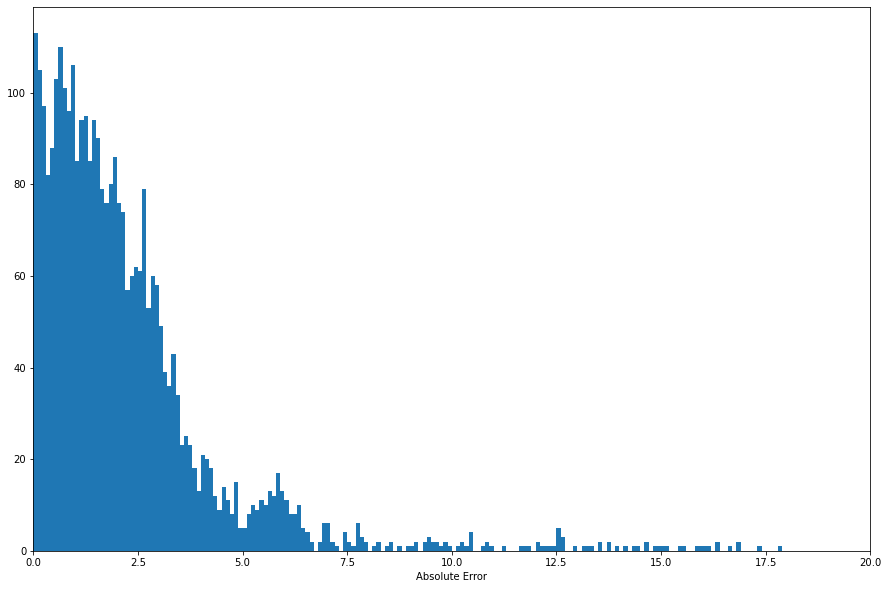

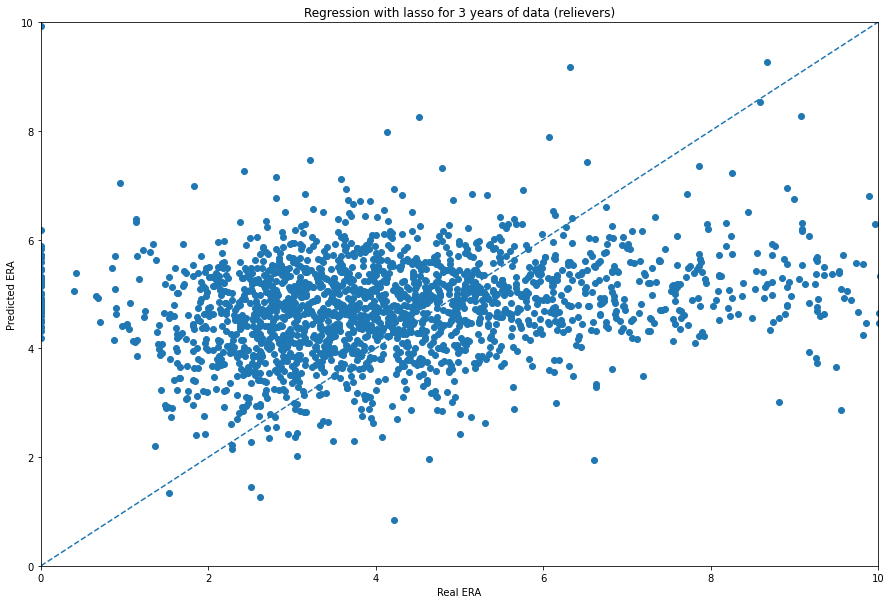

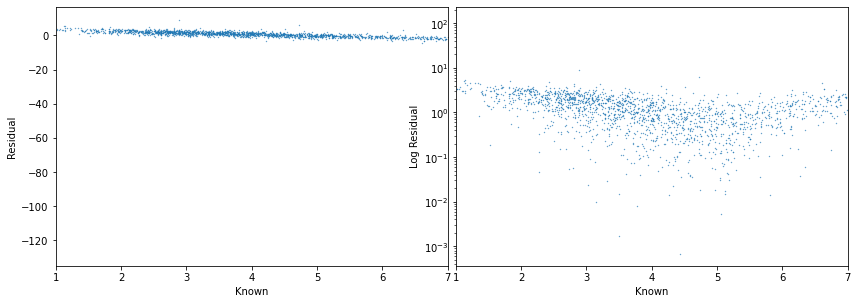

Percent of error less than one run: 0.3604868913857678
Mean Absolute Error: 2.6453800631410744
Standard Deviation: 7.673031081693734


C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 24185.1233473785, tolerance: 5.282635177582172
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 24167.946771936302, tolerance: 5.282635177582172
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 24148.965349958307, tolerance: 5.282635177582172
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarni

C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 21318.406531625253, tolerance: 5.282635177582172
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 21002.950781920037, tolerance: 5.282635177582172
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 20652.847386830224, tolerance: 5.282635177582172
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWar

C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 323.22118050378776, tolerance: 5.282635177582172
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 337.50707274440356, tolerance: 5.282635177582172
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 340.7092840940968, tolerance: 5.282635177582172
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarn

The optimal regularization strength is:
[1.02813038]


<ipython-input-72-9ed886227e69>:105: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


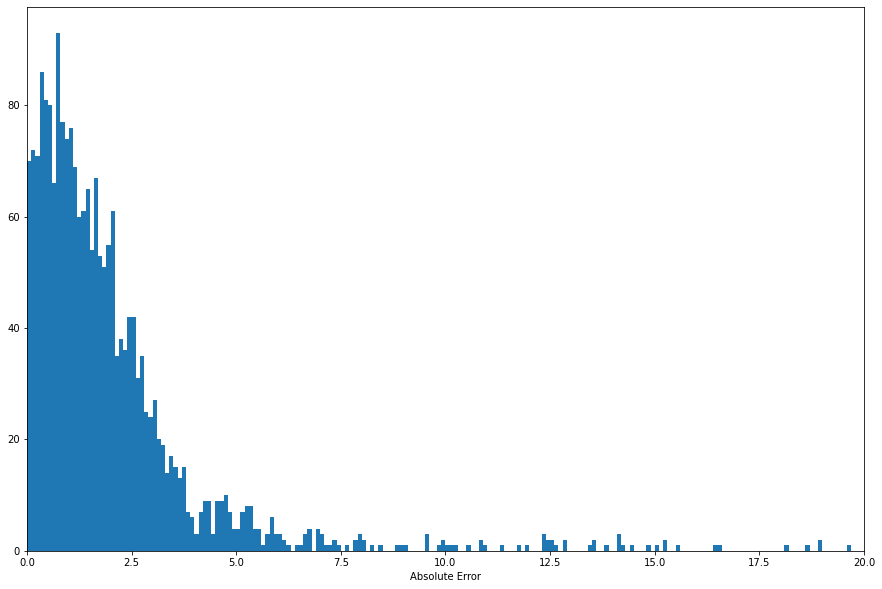

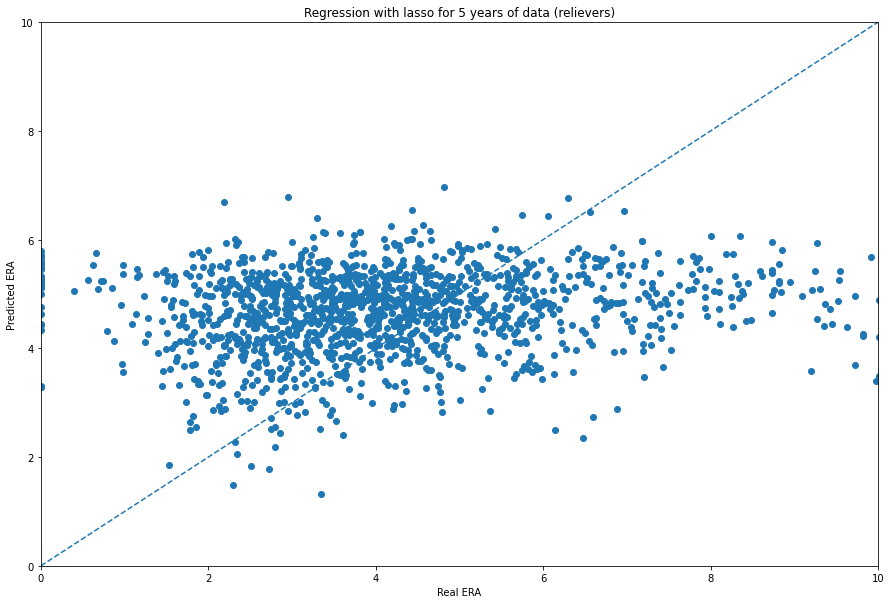

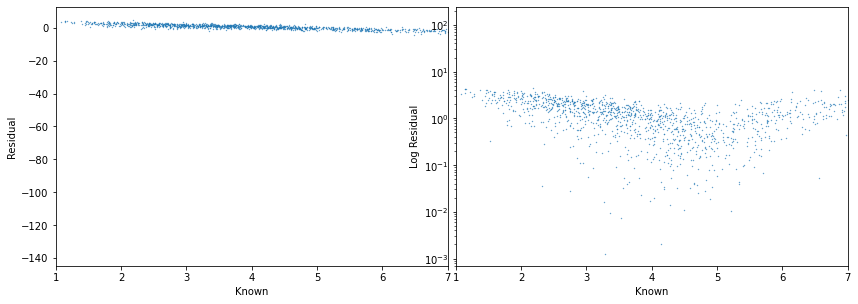

Percent of error less than one run: 0.3618598382749326
Mean Absolute Error: 2.382982469599559
Standard Deviation: 6.813621113706858


C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 22050.053981254547, tolerance: 4.822475283783231
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 21952.68735078103, tolerance: 4.822475283783231
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 21846.31141727676, tolerance: 4.822475283783231
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarni

C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10328.82797853149, tolerance: 4.822475283783231
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9376.644403699574, tolerance: 4.822475283783231
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8395.84917029813, tolerance: 4.822475283783231
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning

The optimal regularization strength is:
[0.00209549]


C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 20973.531513489215, tolerance: 4.822475283783231
  model = cd_fast.enet_coordinate_descent(
<ipython-input-72-9ed886227e69>:105: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


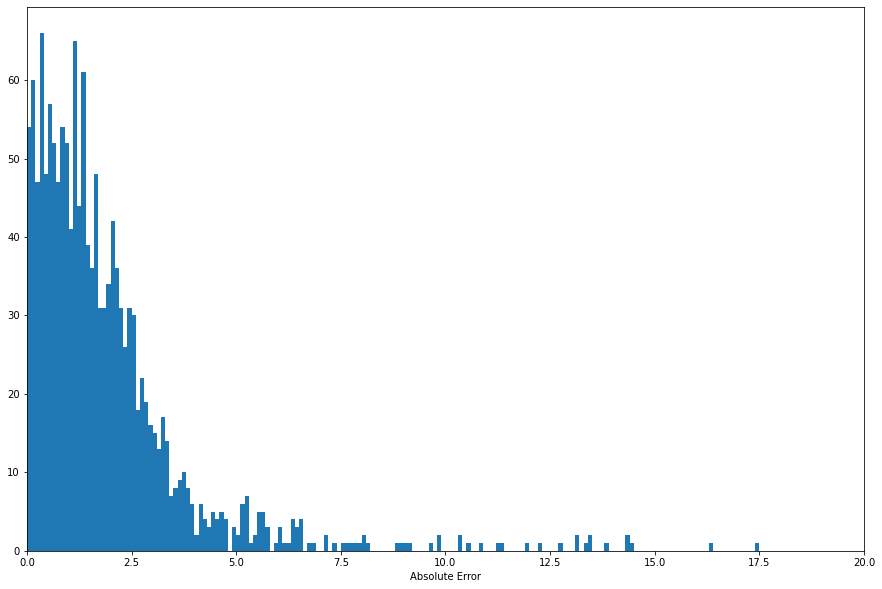

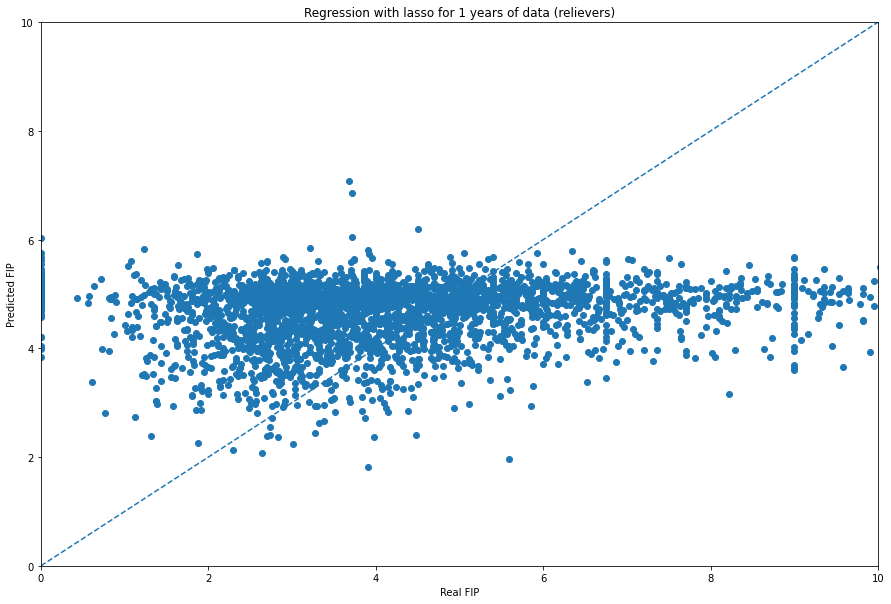

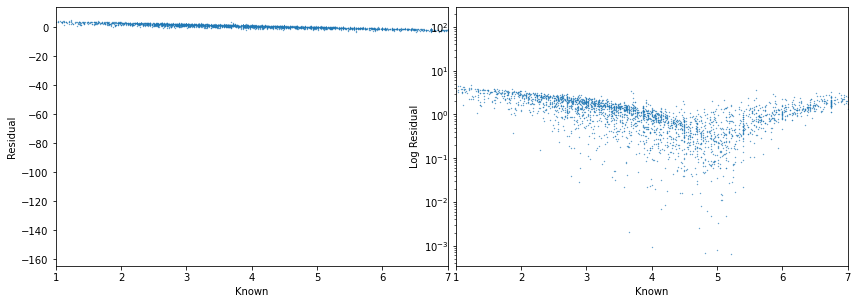

Percent of error less than one run: 0.3716841455891425
Mean Absolute Error: 2.395734612996384
Standard Deviation: 6.235018549923503


C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10420.911692424546, tolerance: 2.3806072161567102
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10375.152296336557, tolerance: 2.3806072161567102
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10325.67028392733, tolerance: 2.3806072161567102
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceW

C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5232.3715479944085, tolerance: 2.3806072161567102
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4841.817758906554, tolerance: 2.3806072161567102
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4447.134006623115, tolerance: 2.3806072161567102
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWa

The optimal regularization strength is:
[0.14746016]


<ipython-input-72-9ed886227e69>:105: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


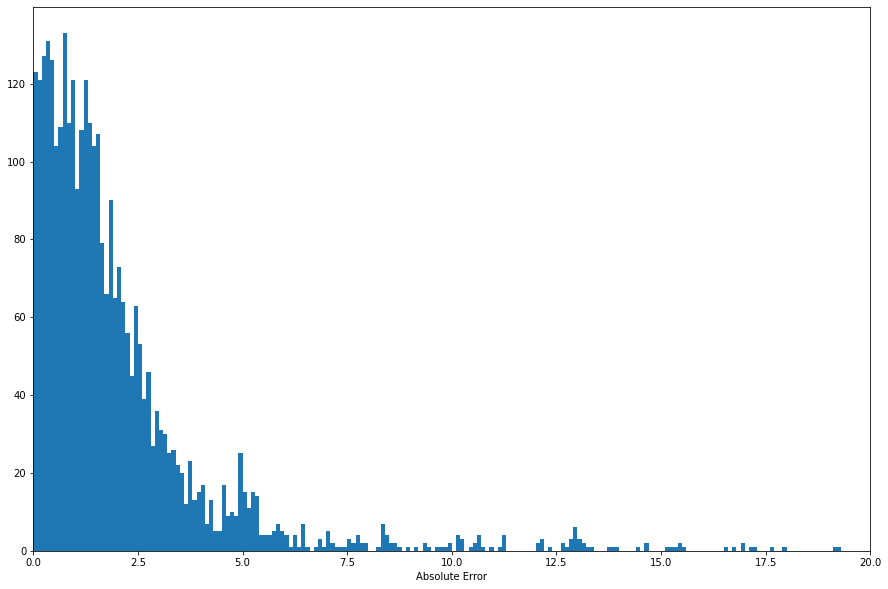

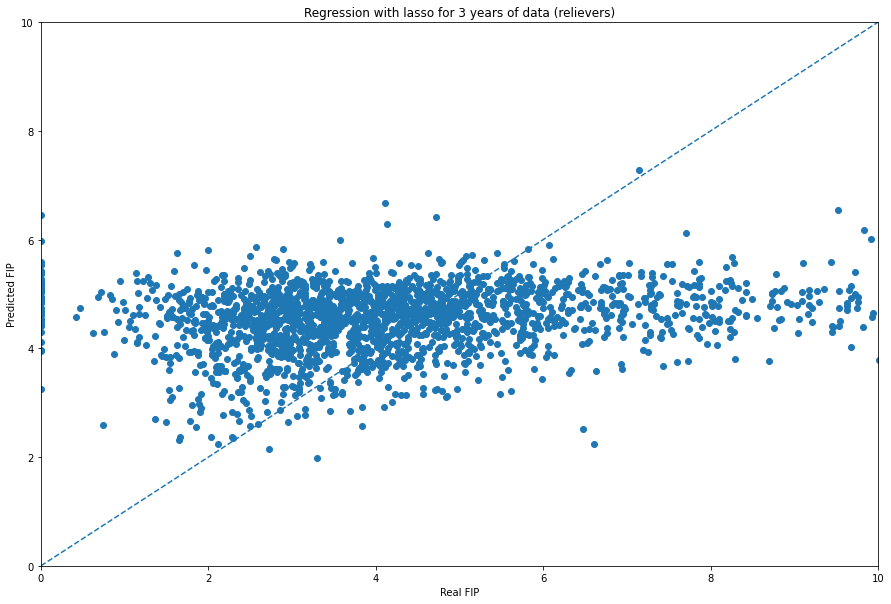

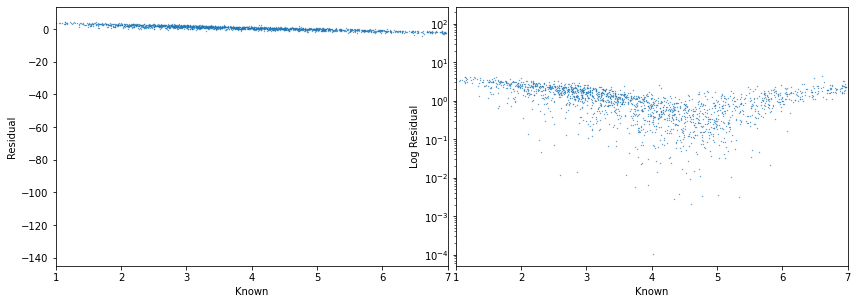

Percent of error less than one run: 0.3852996254681648
Mean Absolute Error: 2.1939417003687156
Standard Deviation: 5.6748847680826895


C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6582.863461800021, tolerance: 1.4727297384599136
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6572.129002907281, tolerance: 1.4727297384599136
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6560.285349964104, tolerance: 1.4727297384599136
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWar

C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5318.091239397408, tolerance: 1.4727297384599136
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5194.21337101113, tolerance: 1.4727297384599136
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5059.130287447314, tolerance: 1.4727297384599136
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarn

C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.573626928982776, tolerance: 1.4727297384599136
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.337092672816652, tolerance: 1.4727297384599136
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.6325283902860974, tolerance: 1.4727297384599136
  model = cd_fast.enet_coordinate_descent(


The optimal regularization strength is:
[0.08466635]


C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 402.82136338510463, tolerance: 1.4727297384599136
  model = cd_fast.enet_coordinate_descent(
<ipython-input-72-9ed886227e69>:105: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


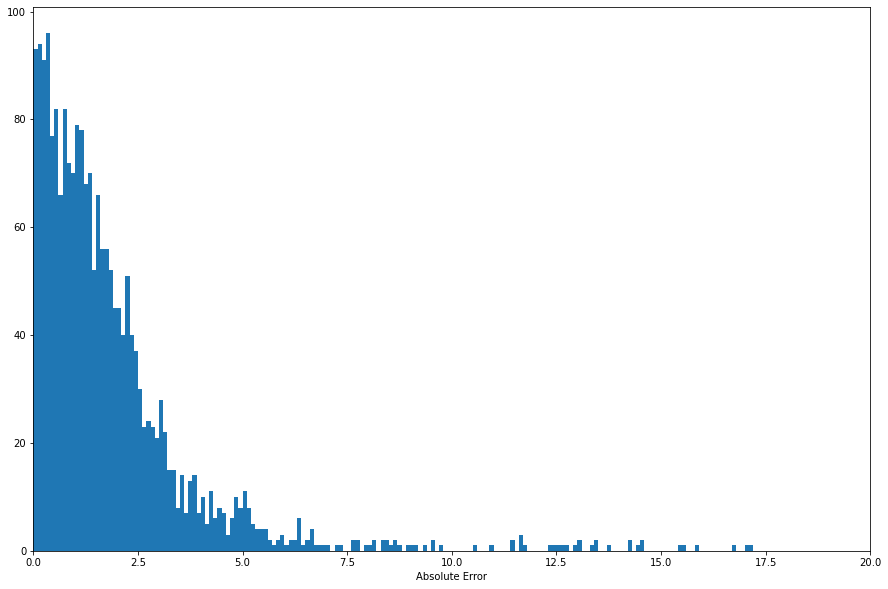

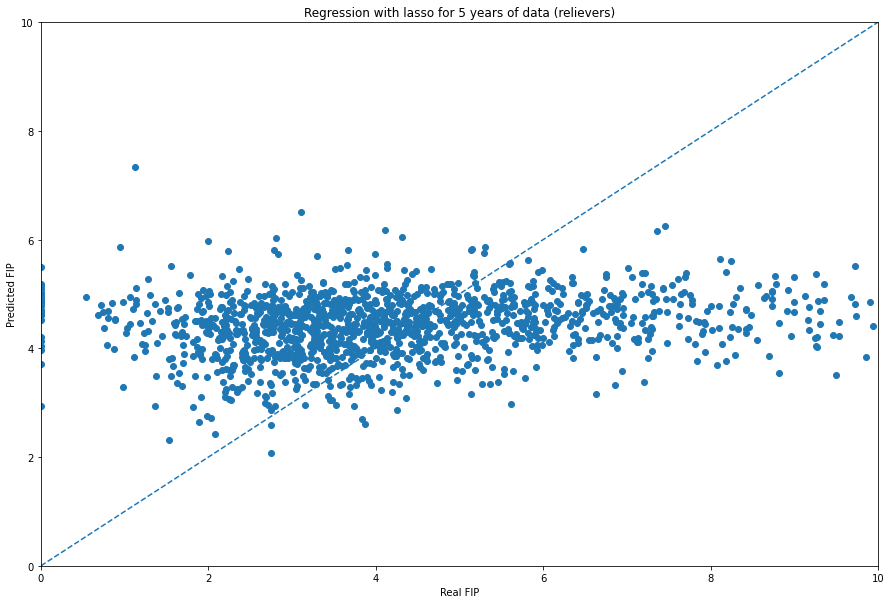

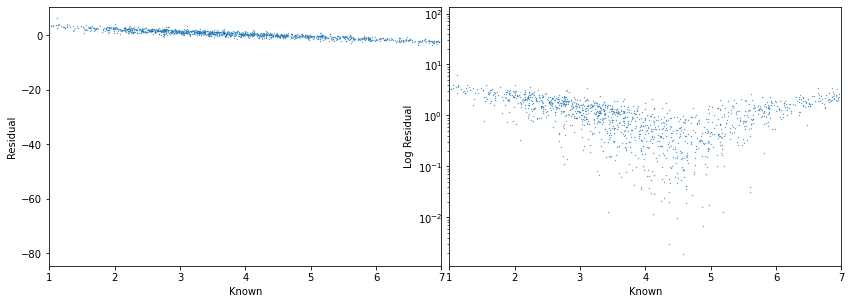

Percent of error less than one run: 0.3888140161725067
Mean Absolute Error: 2.1394689189706986
Standard Deviation: 4.4300166771270595


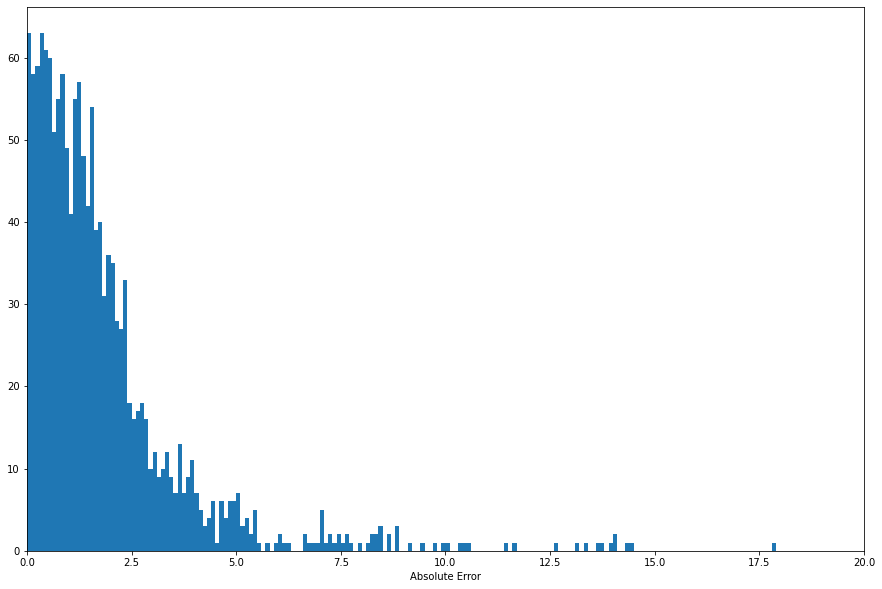

In [74]:
df_results = regression_iterator2(df_one_yr,df_three_yr,df_five_yr)

In [75]:
display(df_results)

,Method,Output,PitcherType,Years,LT1,MAE,STD
0,ridge,ERA,starters,1,0.482852,1.651806,3.801403
1,ridge,ERA,starters,3,0.513070,1.574772,3.544709
2,ridge,ERA,starters,5,0.498374,1.515510,3.365863
3,ridge,FIP,starters,1,0.571676,1.441579,2.886349
4,ridge,FIP,starters,3,0.571190,1.475284,3.465997
5,ridge,FIP,starters,5,0.593902,1.348867,2.995897
6,lasso,ERA,starters,1,0.488054,1.657840,3.985401
7,lasso,ERA,starters,3,0.526140,1.589872,4.423916
8,lasso,ERA,starters,5,0.532520,1.444553,3.995605
9,lasso,FIP,starters,1,0.563391,1.464861,3.162061


We can see that again, more data gives us better results. Generally the model for starters outperfroms the model for relievers, and this isn't surprising given the volitility of the reliever role. The best model I find here is a lasso regression using 5 years of starter data. This produces a MAE around 1.4 for ERA and 1.3 for FIP.

## Normalizing by Year-on-Year Averages

In [76]:
## Function to get single season average of any stat and single season total

def ss_averager(df,year,stat):
    index = np.where(df.yearID == year)[0]
    avg = np.mean(df[stat][index])
    return avg

def ss_total(df,year,stat):
    index = np.where(df.yearID == year)[0]
    tot = np.sum(df[stat][index])
    return tot

In [54]:
uniqueYearID = pitching_df.yearID.unique()

In [55]:
print(uniqueYearID)

[1920 1921 1922 1923 1924 1925 1926 1927 1928 1929 1930 1931 1932 1933
 1934 1935 1936 1937 1938 1939 1940 1941 1942 1943 1944 1945 1946 1947
 1948 1949 1950 1951 1952 1953 1954 1955 1956 1957 1958 1959 1960 1961
 1962 1963 1964 1965 1966 1967 1968 1969 1970 1971 1972 1973 1974 1975
 1976 1977 1978 1979 1980 1981 1982 1983 1984 1985 1986 1987 1988 1989
 1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020]


Finally, I normalize by yearly averages for all statistics. This step is done with the yearly_normalization function, and implemented in the input_output function. Otherwise, the procedure is identical to above.

In [79]:
def input_output(df,n_years,pitcherType):
    
    yearID = df.yearID
    uniqueYearID = yearID.unique()
    
    if n_years == 1:
        to_drop = ['playerID','yearID','teamID','teamID1','IBB','SF','SH','GIDP','Unnamed: 0']
    if n_years == 3:
        to_drop = ['playerID','yearID','teamID','teamID1','teamID2','teamID3','IBB1','IBB2','IBB3',
                   'SF1','SF2','SF3','SH1','SH2','SH3','GIDP1','GIDP2','GIDP3','Unnamed: 0']
    if n_years == 5:
        to_drop = ['playerID','yearID','teamID','teamID1','teamID2','teamID3','teamID4','teamID5',
                   'IBB1','IBB2','IBB3','IBB4','IBB5',
                   'SF1','SF2','SF3','SF4','SF5',
                   'SH1','SH2','SH3','SH4','SH5',
                   'GIDP1','GIDP2','GIDP3','GIDP4','GIDP5','Unnamed: 0']
        
    stats_df = df.drop(to_drop,axis=1)
    stats_df.replace([np.inf, -np.inf], np.nan, inplace=True)
    stats_df.dropna;
    outputs = stats_df[['kERA','kFIP']]
    if n_years == 1:
        GS_df = stats_df['GS']
    if n_years == 3:
        GS_df = stats_df['GS1']
    if n_years == 5:
        GS_df = stats_df['GS1']
    stats_df = stats_df.drop(['kERA','kFIP'],axis=1)
    
    
    stats = stats_df.to_numpy()
    stats = np.nan_to_num(stats)
    
    outputs = outputs.to_numpy()
    outputs = np.nan_to_num(outputs)
    
    GS_data = GS_df.to_numpy()
    GS_data = np.nan_to_num(GS_data)
    
    years = yearID.to_numpy()
    
    stats = yearly_normalization(stats,years,uniqueYearID)
    stats = np.nan_to_num(stats)
    
    if pitcherType == 'starters':
        reliever_index = np.where(GS_data == 0)
        stats,outputs = np.delete(stats,reliever_index,0),np.delete(outputs,reliever_index,0)
    if pitcherType == 'relievers':
        reliever_index = np.where(GS_data != 0)
        stats,outputs = np.delete(stats,reliever_index,0),np.delete(outputs,reliever_index,0)
    
    return stats,outputs

def yearly_normalization(stats,years,uniqueYears):
    n_stats = stats.shape[1]
    n_years = len(uniqueYears)
    for i in range(0,n_years,1):
        year = uniqueYears[i]
        year_index = np.where(years == year)
        for j in range(0,n_stats,1):
            stat = stats[:,j]
            stat_in_year = stat[year_index]
            mean, std = np.mean(stat_in_year),np.std(stat_in_year)
            k = 0
            while k < len(stat_in_year):
                stat_in_year[k] = (stat_in_year[k] - mean)/std
                k += 1
            stat[year_index] = stat_in_year
            stats[:,j] = stat
    return stats

## First, we split into training, validation, and testing data

def train_validate_test(df,n_years,pitcherType):
    
    stats,outputs = input_output(df,n_years,pitcherType)
    
    stats,outputs = shuffler(stats,outputs)
    
    num_data = stats.shape[0]
    n_samples_train = round(0.5*num_data)
    n_samples_validate = round(0.25*num_data) + n_samples_train
    X_train, X_val, X_test = stats[:n_samples_train], stats[n_samples_train:n_samples_validate], stats[n_samples_validate:]
    y_train, y_val, y_test = outputs[:n_samples_train], outputs[n_samples_train:n_samples_validate], outputs[n_samples_validate:]
    
    if len(X_val) != len(X_test):
        X_test = X_test[0:len(X_test)-1]
        y_test = y_test[0:len(y_test)-1]
        
    return X_train,y_train,X_val,y_val,X_test,y_test    


        
def regularization_optimization(X_train,y_train,X_val,y_val,a_min,a_max,regType,outputStat,do_plot):
      
    if regType == 'ridge':
        min_alpha = ridge_optimization(X_train,y_train,X_val,y_val,a_min,a_max,outputStat,do_plot)
        print('The optimal regularization strength is:')
        print(min_alpha)
        
    if regType == 'lasso':
        min_alpha = lasso_optimization(X_train,y_train,X_val,y_val,a_min,a_max,outputStat,do_plot)
        print('The optimal regularization strength is:')
        print(min_alpha)
        
    return min_alpha

def regularization_prediction(X_train,y_train,X_val,y_val,X_test,y_test,a_max,a_min,regType,outputStat,n_years,pitcherType,do_plot):
    
    ## Finding ideal alpha
    min_alpha = regularization_optimization(X_train,y_train,X_val,y_val,a_max,a_min,regType,outputStat,do_plot)
    
    
    ## Picking output stat
    if outputStat == 'ERA':
        y_train,y_val,y_test = y_train[:,0],y_val[:,0],y_test[:,0]
    if outputStat == 'FIP':
        y_train,y_val,y_test = y_train[:,1],y_val[:,1],y_test[:,0]
    
    
    ## Building model
    
    if regType == 'ridge':
        ridge = Ridge(alpha=min_alpha,fit_intercept=True)
        ridge_fit = ridge.fit(X_train,y_train)
        y_pred = ridge_fit.predict(X_test)
        
    if regType == 'lasso':
        lasso = Lasso(alpha=min_alpha,fit_intercept=True)
        lasso_fit = lasso.fit(X_train,y_train)
        y_pred = lasso_fit.predict(X_test)   
        
    residuals = y_pred - y_test
    per_error = np.divide((y_pred - y_test),y_test)
    avg_abs_error = np.mean(residuals)
    avg_per_error = np.mean(per_error)
    
    #precursor = {'ERA':y_test,'pERA':y_pred,'residual':residuals,'per_error':per_error}
    #reg_df = pd.DataFrame(precursor,columns=['ERA','pERA','residual','per_error'])
    
    x_line = np.arange(0,20,0.1)
    y_line = x_line
    
    f = plt.figure()
    f.set_figwidth(15) 
    f.set_figheight(10) 
    plt.scatter(y_test,y_pred)
    plt.plot(x_line,y_line,ls=('dashed'))
    plt.title('Regression with ' + regType + ' for ' + str(n_years) + ' years of data '+ '(' + pitcherType + ')')
    plt.xlabel('Real ' + outputStat)
    plt.ylabel('Predicted ' + outputStat)
    plt.xlim([0,10])
    plt.ylim([0,10])
    
    return y_pred,y_test

def residual_plotter(x,y):
    
    res = y - x
    
    plt.figure(figsize=(11,4))
    plt.subplot(121)
    plt.scatter(x,res,s=0.1)
    plt.xlabel('Known')
    plt.ylabel('Residual')
    plt.xlim([1,7])
    plt.subplot(122)
    plt.scatter(x,abs(res),s=0.1)
    plt.xlabel('Known')
    plt.ylabel('Log Residual')
    plt.xlim([1,7])
    plt.yscale('log')
    plt.subplots_adjust(wspace=0.02, hspace=0.3, top=1, bottom=0.1, left=0, right=1)
    plt.show()
    
    return res

def residual_histogram(res):
    
    res = abs(res)
    rbins = np.arange(0,20,0.1)
    
    f = plt.figure()
    f.set_figwidth(15) 
    f.set_figheight(10)
    plt.hist(res,bins=rbins)
    plt.xlim([0,20])
    plt.xlabel('Absolute Error')
    
def regression_program(df,n_years,regType,outputStat,pitcherType):
    X_train, y_train, X_val, y_val, X_test,y_test = train_validate_test(df,n_years,pitcherType)
    y_pred, y_test = regularization_prediction(X_train, y_train, X_val, y_val, X_test,y_test,-3,7,regType,outputStat,n_years,pitcherType,0)
    res = residual_plotter(y_test,y_pred)
    residual_histogram(res)
    test_res = abs(res)
    lt1 = len(np.where(test_res < 1)[0])/len(res)
    mae = np.mean(test_res)
    std = np.std(res)
    print('Percent of error less than one run: ' + str(lt1))
    print('Mean Absolute Error: ' + str(mae))
    print('Standard Deviation: ' + str(std))
    
    return lt1,mae,std

<ipython-input-79-c861ea33c27c>:66: RuntimeWarning: invalid value encountered in double_scalars
  stat_in_year[k] = (stat_in_year[k] - mean)/std


The optimal regularization strength is:
[0.001]


<ipython-input-79-c861ea33c27c>:134: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


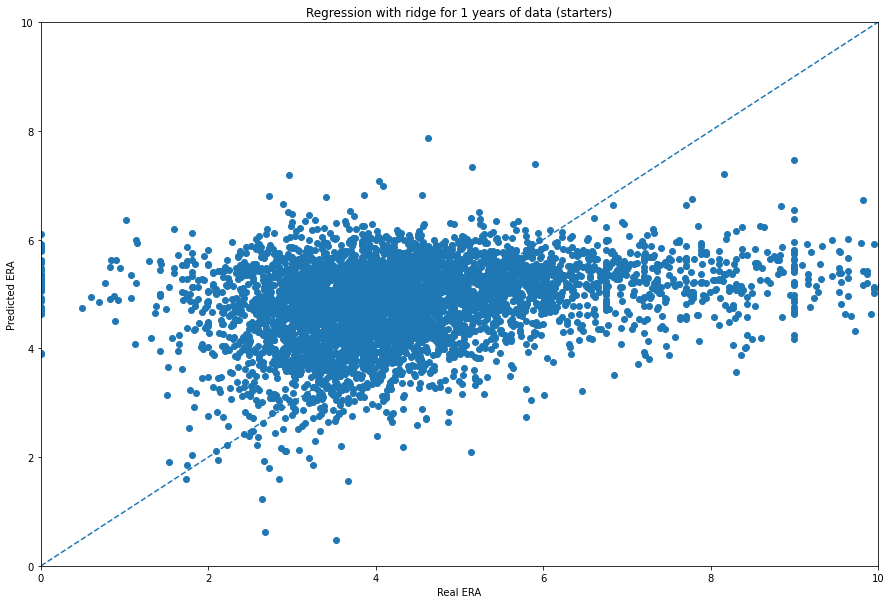

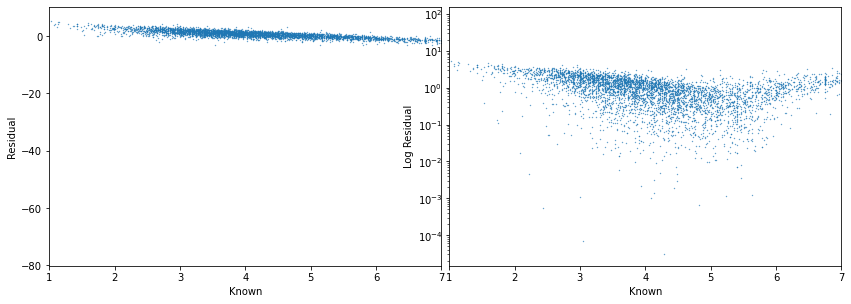

Percent of error less than one run: 0.4726396917148362
Mean Absolute Error: 1.6610327465769006
Standard Deviation: 3.488393183297553


<ipython-input-79-c861ea33c27c>:66: RuntimeWarning: invalid value encountered in double_scalars
  stat_in_year[k] = (stat_in_year[k] - mean)/std


The optimal regularization strength is:
[665.72240383]


<ipython-input-79-c861ea33c27c>:134: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


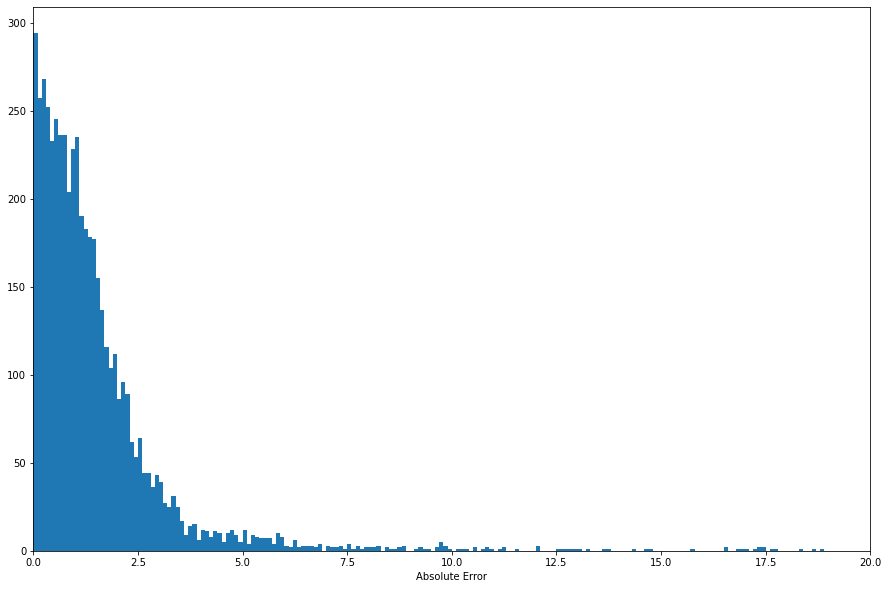

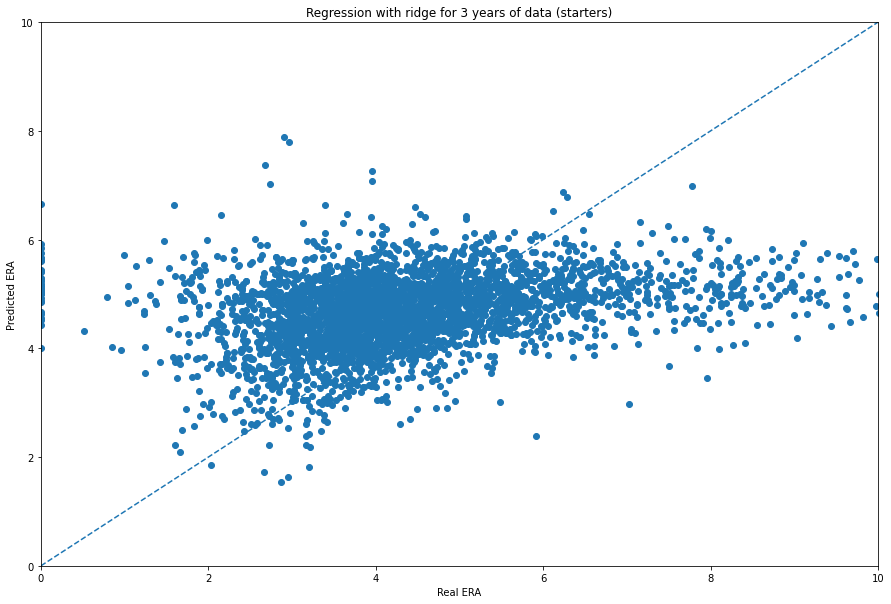

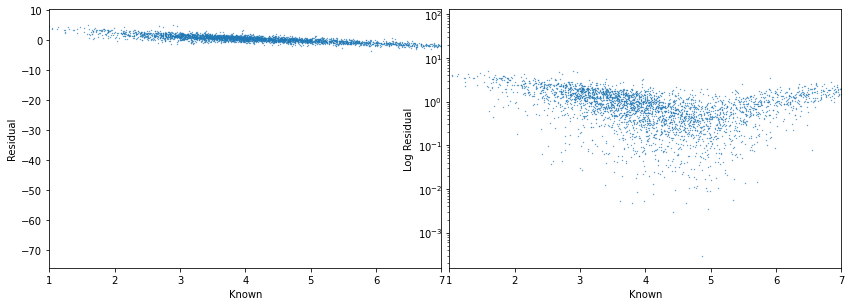

Percent of error less than one run: 0.5230812013348165
Mean Absolute Error: 1.525458153334322
Standard Deviation: 3.1415589567357167


<ipython-input-79-c861ea33c27c>:66: RuntimeWarning: invalid value encountered in double_scalars
  stat_in_year[k] = (stat_in_year[k] - mean)/std


The optimal regularization strength is:
[5091.28383447]


<ipython-input-79-c861ea33c27c>:134: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


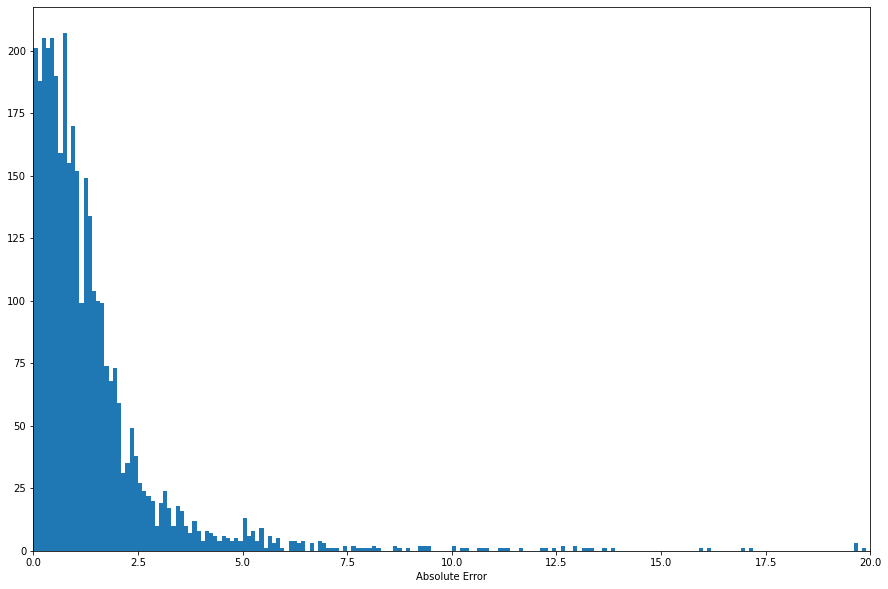

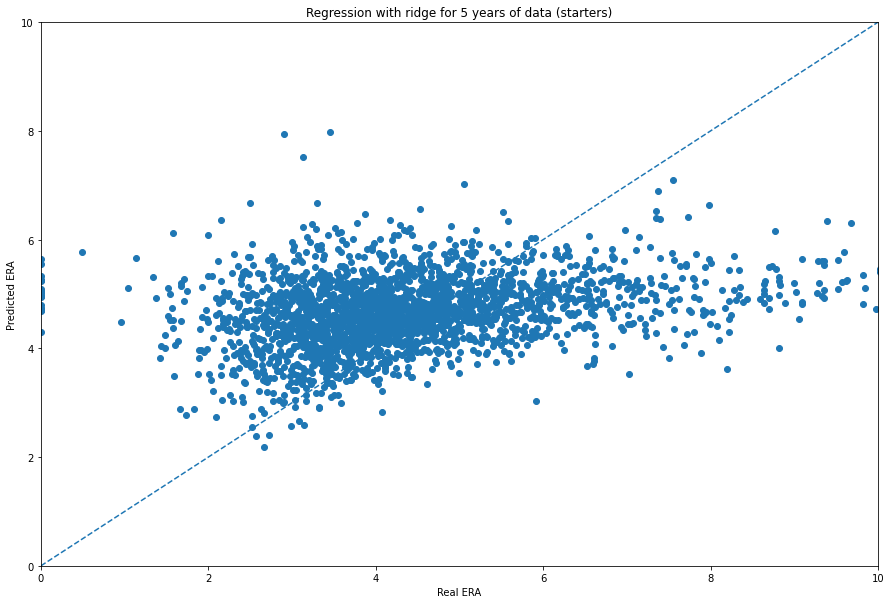

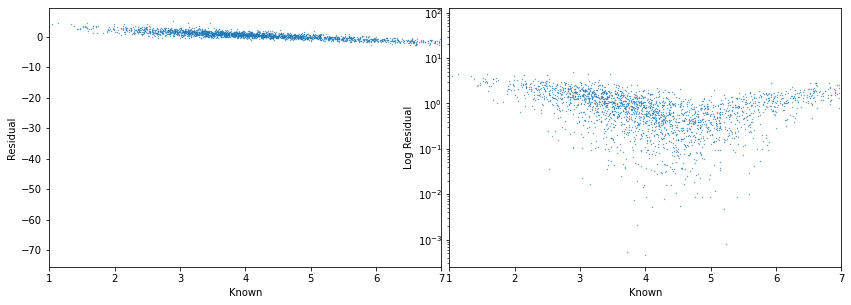

Percent of error less than one run: 0.5227642276422764
Mean Absolute Error: 1.4699739707446775
Standard Deviation: 3.2508585649221566


<ipython-input-79-c861ea33c27c>:66: RuntimeWarning: invalid value encountered in double_scalars
  stat_in_year[k] = (stat_in_year[k] - mean)/std


The optimal regularization strength is:
[166.29666285]


<ipython-input-79-c861ea33c27c>:134: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


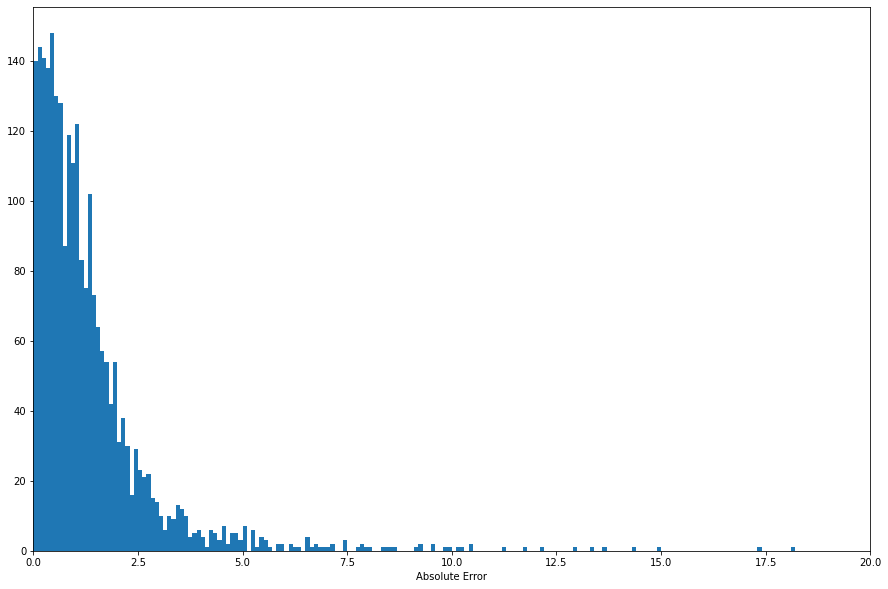

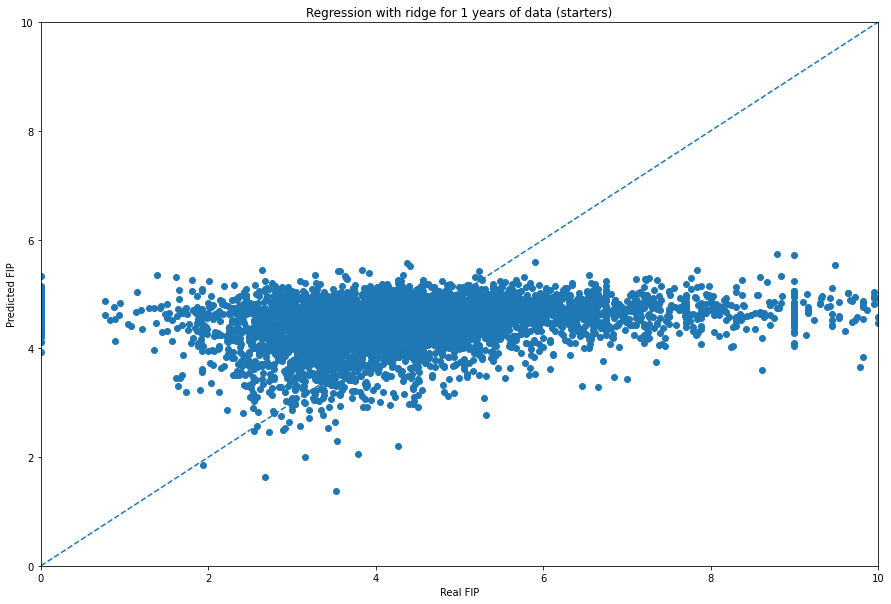

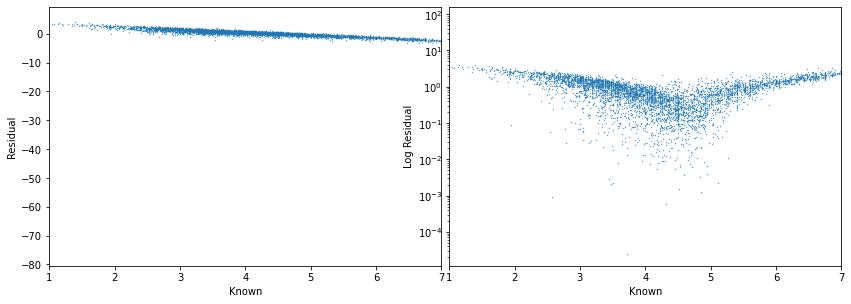

Percent of error less than one run: 0.5420038535645472
Mean Absolute Error: 1.5196579287050103
Standard Deviation: 3.295870410807749


<ipython-input-79-c861ea33c27c>:66: RuntimeWarning: invalid value encountered in double_scalars
  stat_in_year[k] = (stat_in_year[k] - mean)/std


The optimal regularization strength is:
[200.08052546]


<ipython-input-79-c861ea33c27c>:134: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


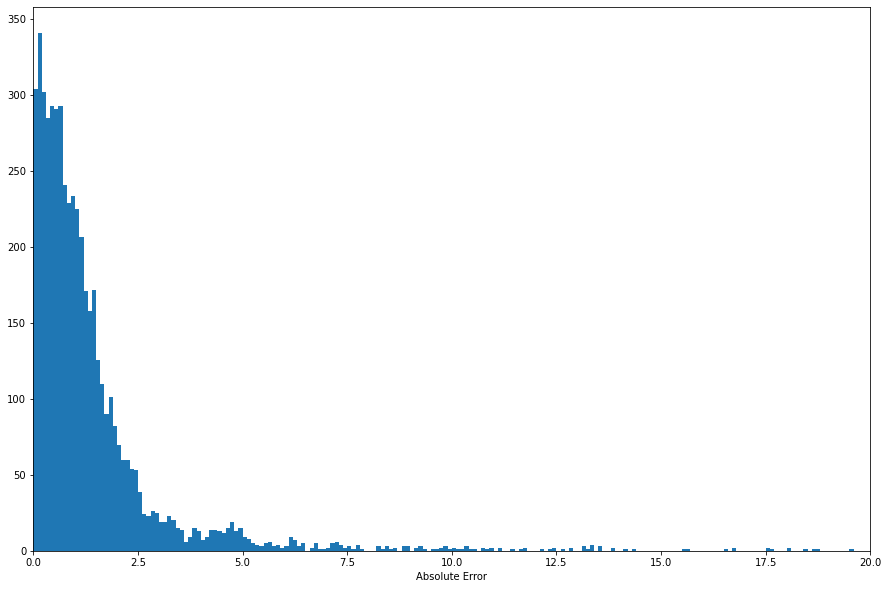

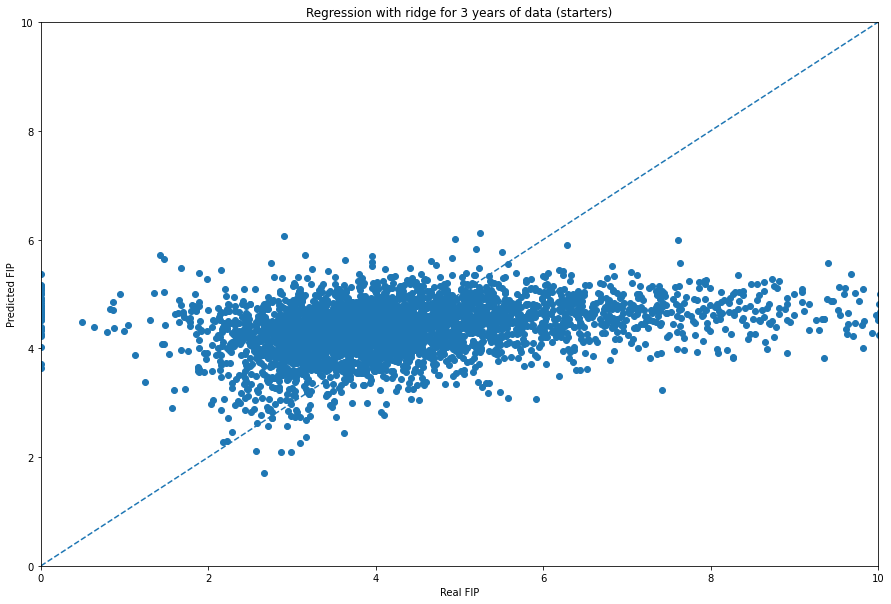

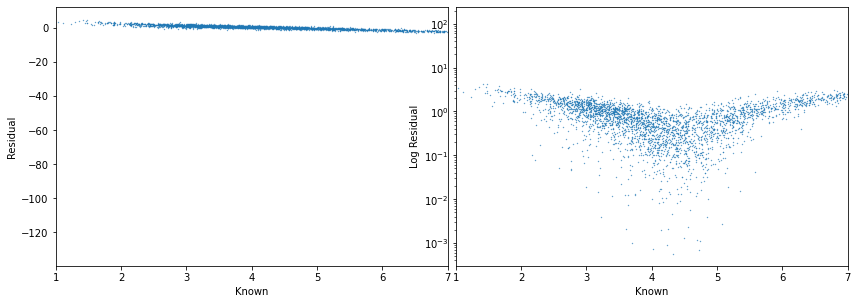

Percent of error less than one run: 0.5586763070077865
Mean Absolute Error: 1.4643476200974874
Standard Deviation: 3.5768093088433615


<ipython-input-79-c861ea33c27c>:66: RuntimeWarning: invalid value encountered in double_scalars
  stat_in_year[k] = (stat_in_year[k] - mean)/std


The optimal regularization strength is:
[240.72772105]


<ipython-input-79-c861ea33c27c>:134: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


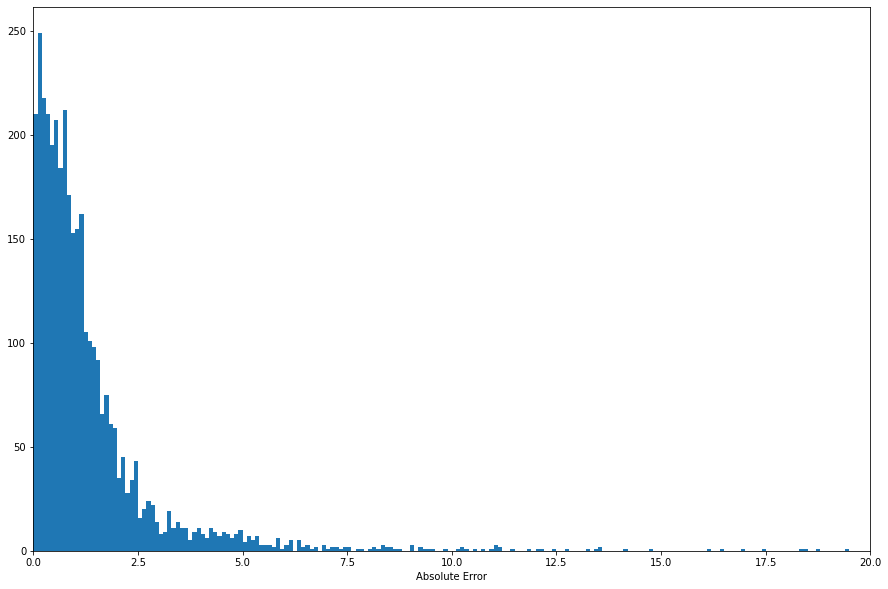

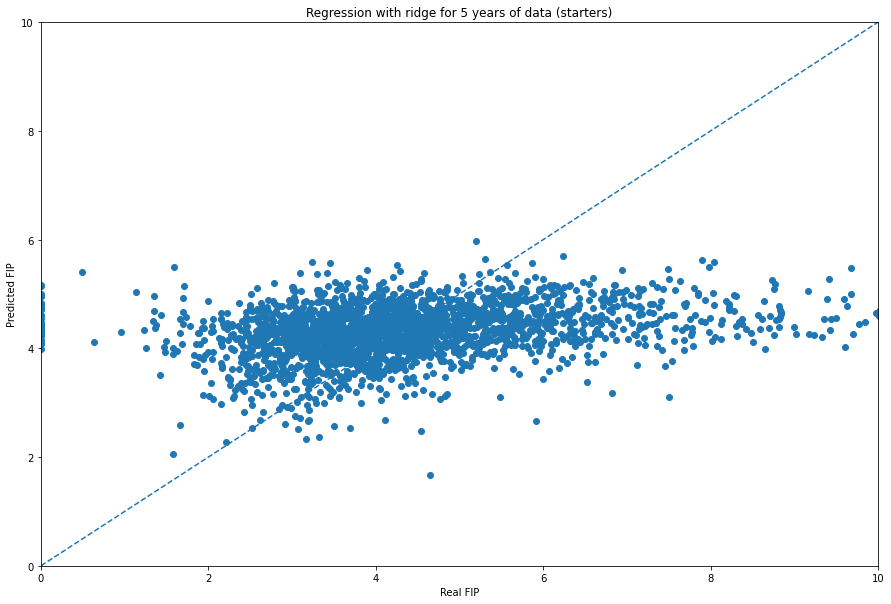

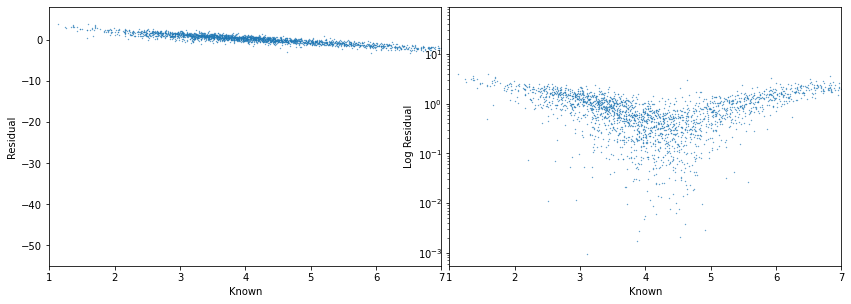

Percent of error less than one run: 0.5654471544715447
Mean Absolute Error: 1.3983072670953018
Standard Deviation: 2.889448781901408


<ipython-input-79-c861ea33c27c>:66: RuntimeWarning: invalid value encountered in double_scalars
  stat_in_year[k] = (stat_in_year[k] - mean)/std


The optimal regularization strength is:
[0.0100929]


<ipython-input-79-c861ea33c27c>:134: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


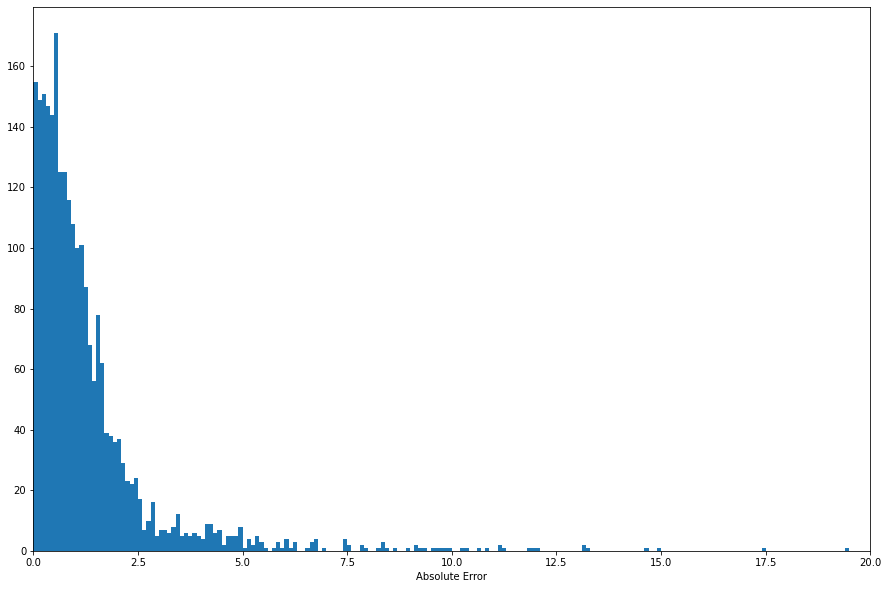

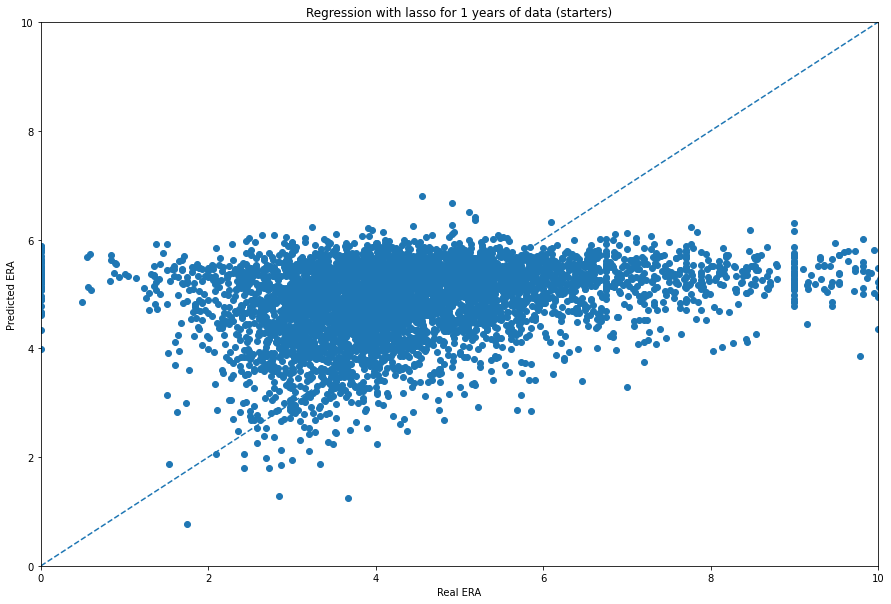

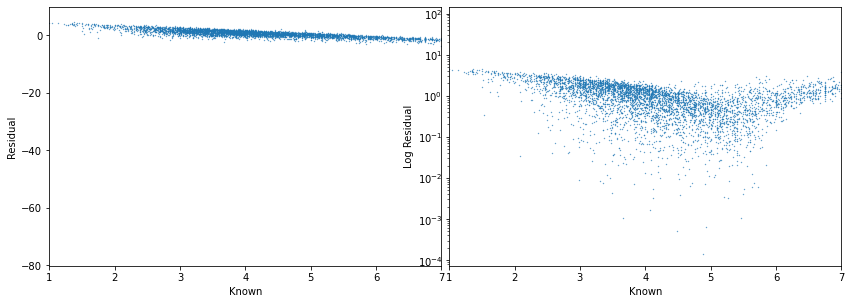

Percent of error less than one run: 0.4709055876685935
Mean Absolute Error: 1.6248434122460906
Standard Deviation: 3.210000598836058


<ipython-input-79-c861ea33c27c>:66: RuntimeWarning: invalid value encountered in double_scalars
  stat_in_year[k] = (stat_in_year[k] - mean)/std
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2188.2908974632155, tolerance: 9.911134738127343
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2138.008706549008, tolerance: 9.911134738127343
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2255.0576119881007, tolerance: 9.911134738127343
  mod

The optimal regularization strength is:
[0.01928149]


<ipython-input-79-c861ea33c27c>:134: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


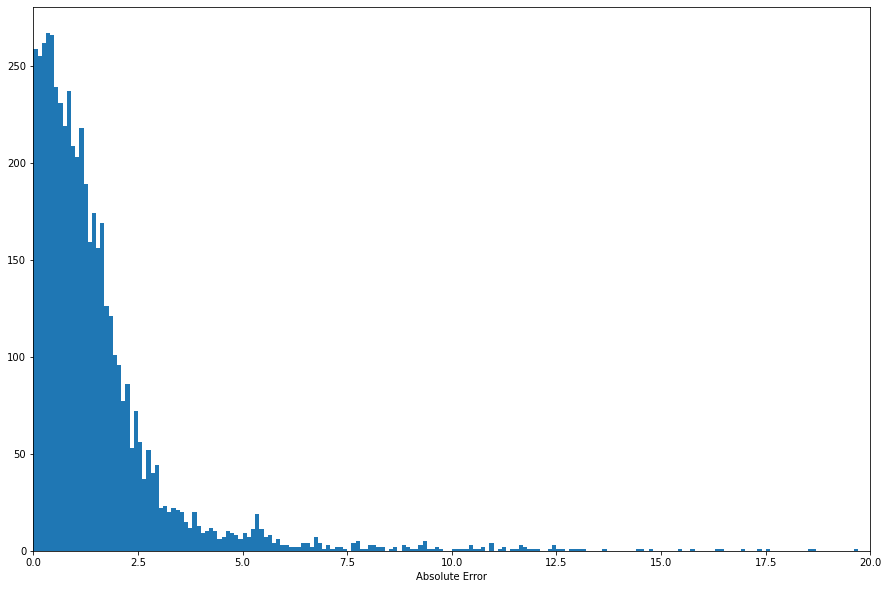

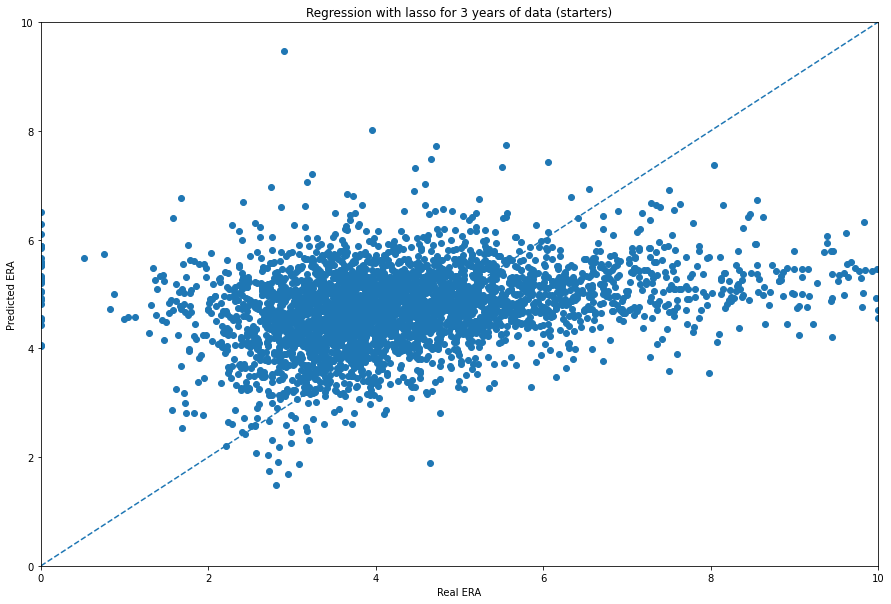

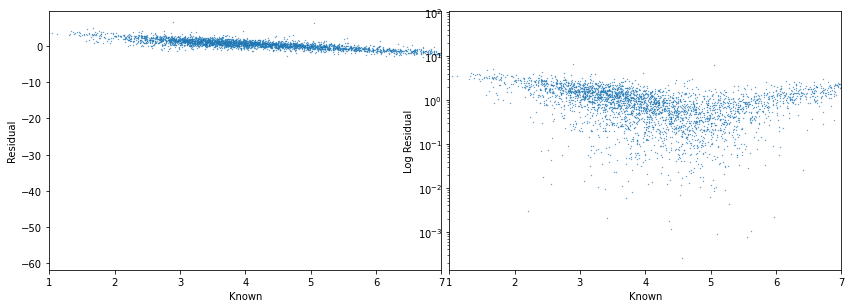

Percent of error less than one run: 0.5
Mean Absolute Error: 1.4750730950833548
Standard Deviation: 2.82613199307813


<ipython-input-79-c861ea33c27c>:66: RuntimeWarning: invalid value encountered in double_scalars
  stat_in_year[k] = (stat_in_year[k] - mean)/std


The optimal regularization strength is:
[0.05332215]


<ipython-input-79-c861ea33c27c>:134: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


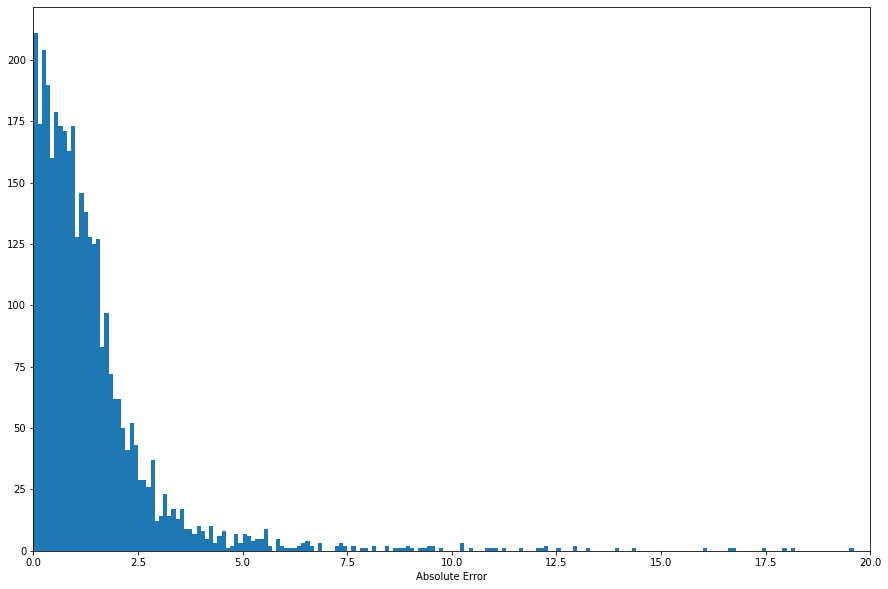

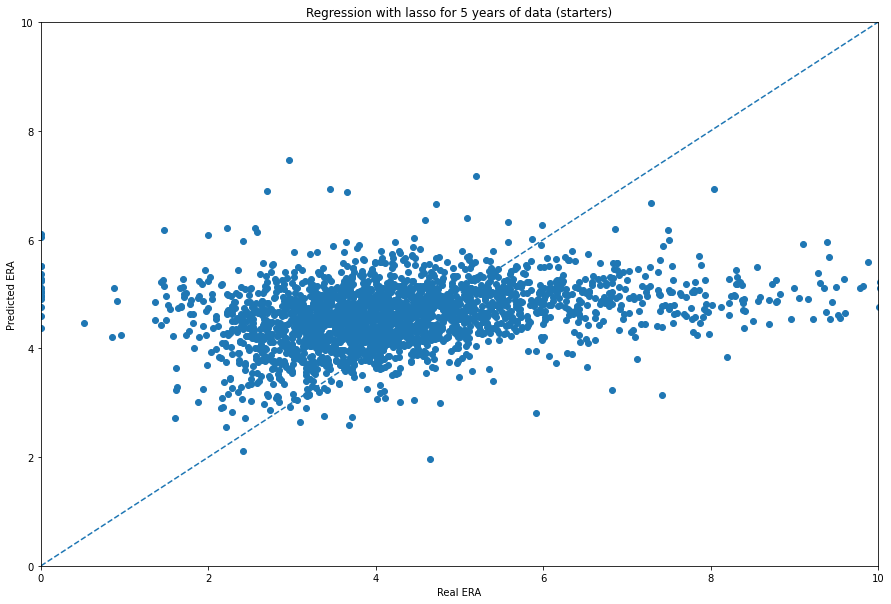

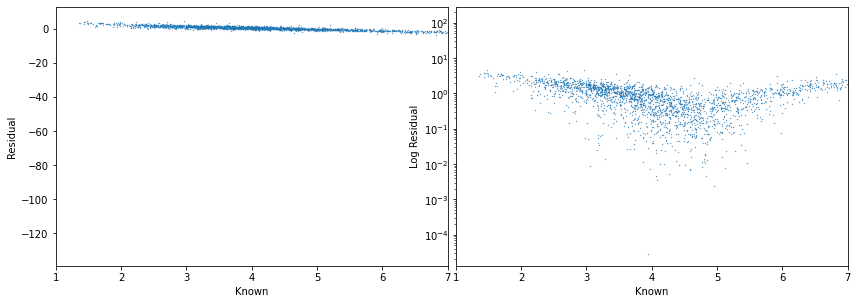

Percent of error less than one run: 0.5410569105691057
Mean Absolute Error: 1.4216686053951948
Standard Deviation: 3.7896691512400658


<ipython-input-79-c861ea33c27c>:66: RuntimeWarning: invalid value encountered in double_scalars
  stat_in_year[k] = (stat_in_year[k] - mean)/std


The optimal regularization strength is:
[0.001]


<ipython-input-79-c861ea33c27c>:134: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


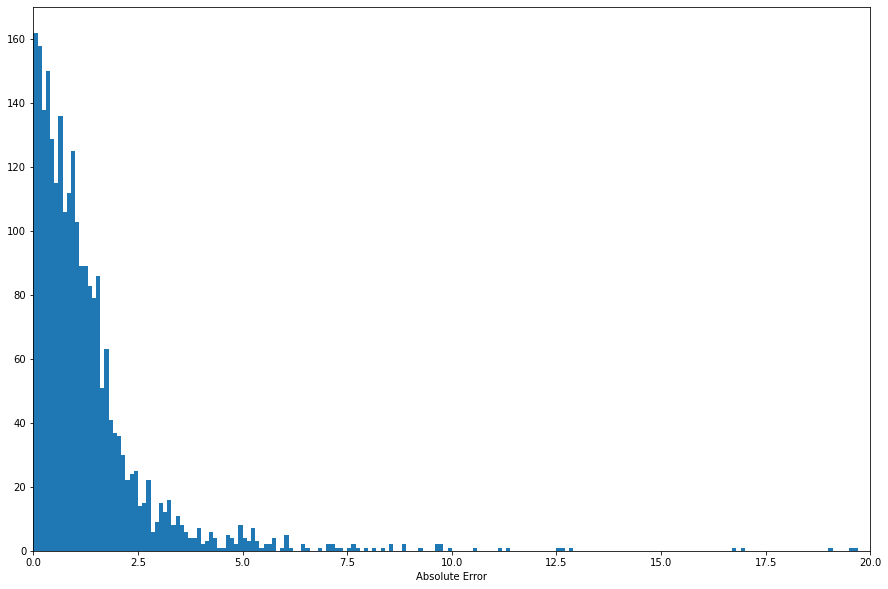

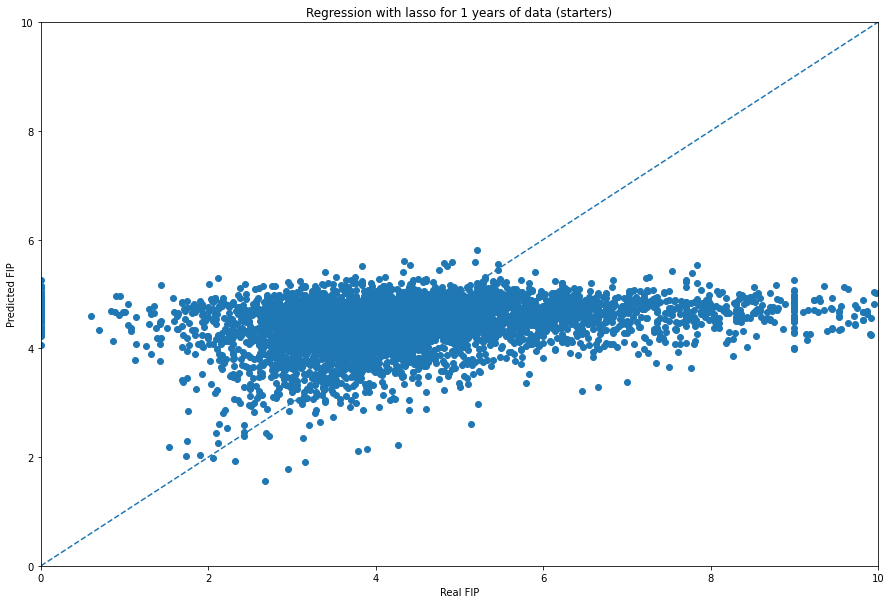

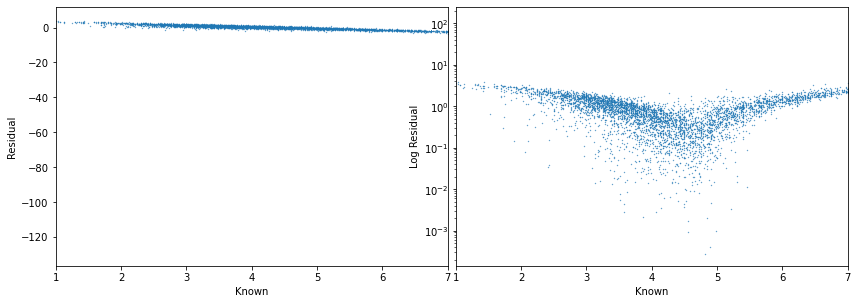

Percent of error less than one run: 0.5420038535645472
Mean Absolute Error: 1.6077290269390163
Standard Deviation: 4.026687149799802


<ipython-input-79-c861ea33c27c>:66: RuntimeWarning: invalid value encountered in double_scalars
  stat_in_year[k] = (stat_in_year[k] - mean)/std


The optimal regularization strength is:
[0.00364963]


<ipython-input-79-c861ea33c27c>:134: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


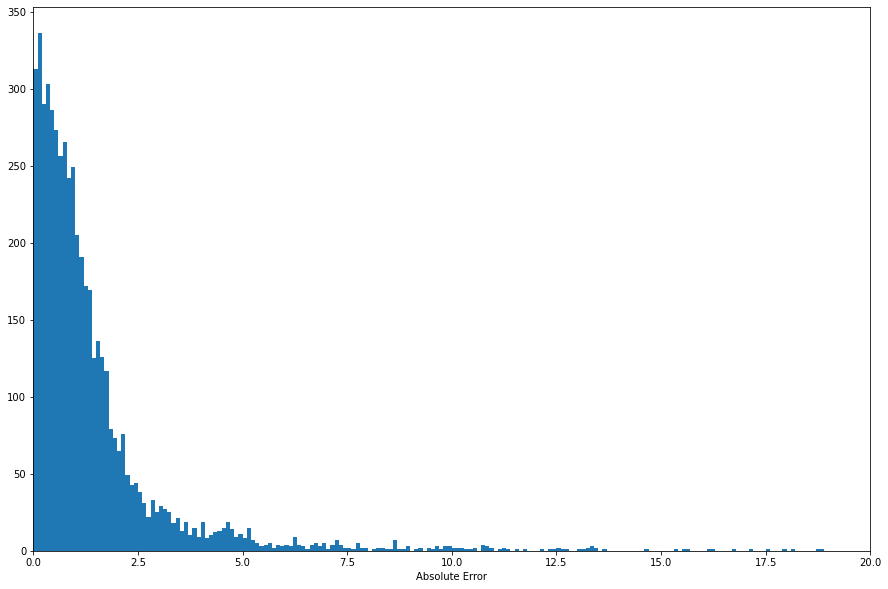

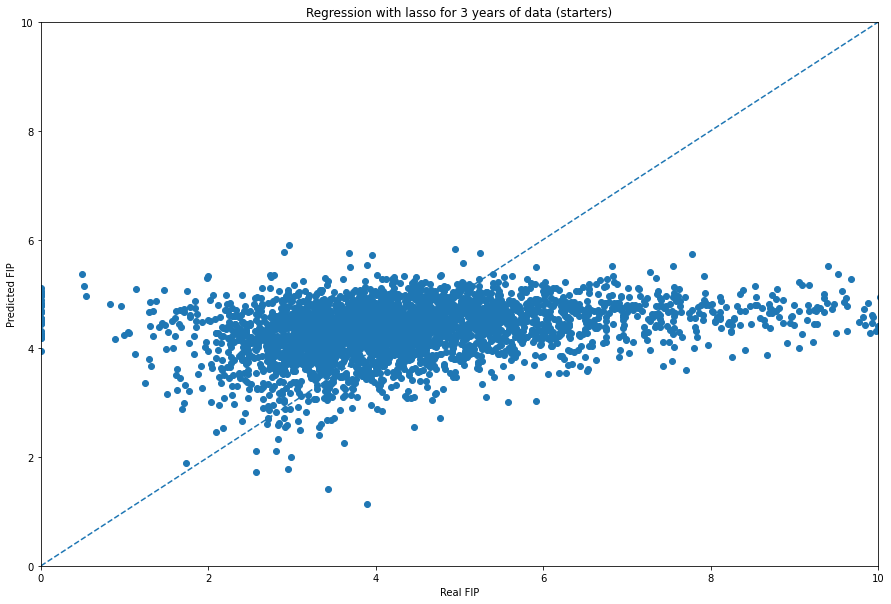

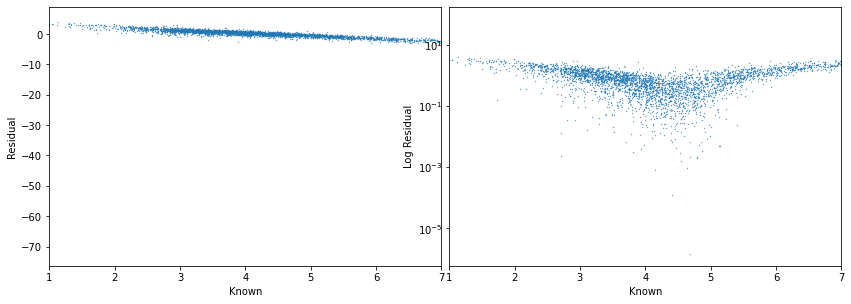

Percent of error less than one run: 0.5789766407119021
Mean Absolute Error: 1.3797023299644424
Standard Deviation: 2.985957099198836


<ipython-input-79-c861ea33c27c>:66: RuntimeWarning: invalid value encountered in double_scalars
  stat_in_year[k] = (stat_in_year[k] - mean)/std


The optimal regularization strength is:
[0.00920143]


<ipython-input-79-c861ea33c27c>:134: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


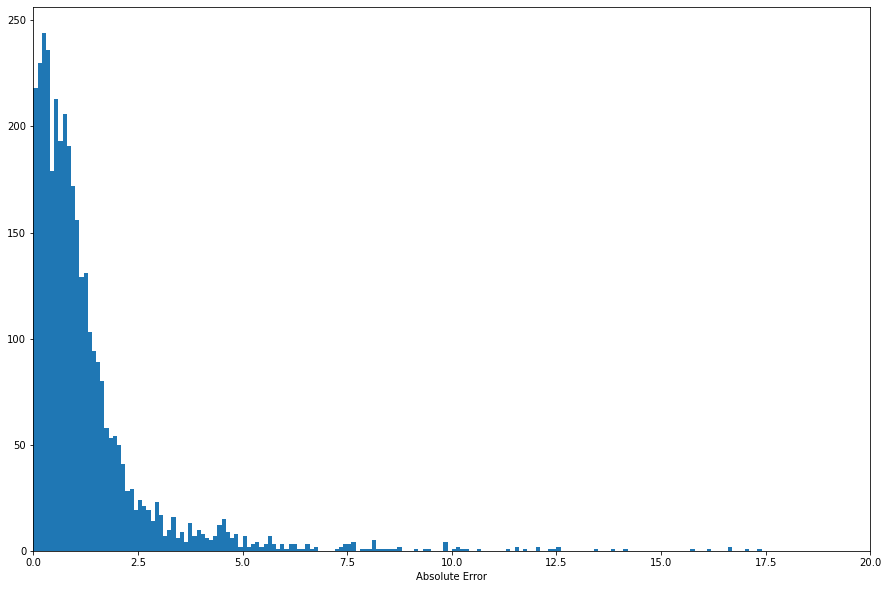

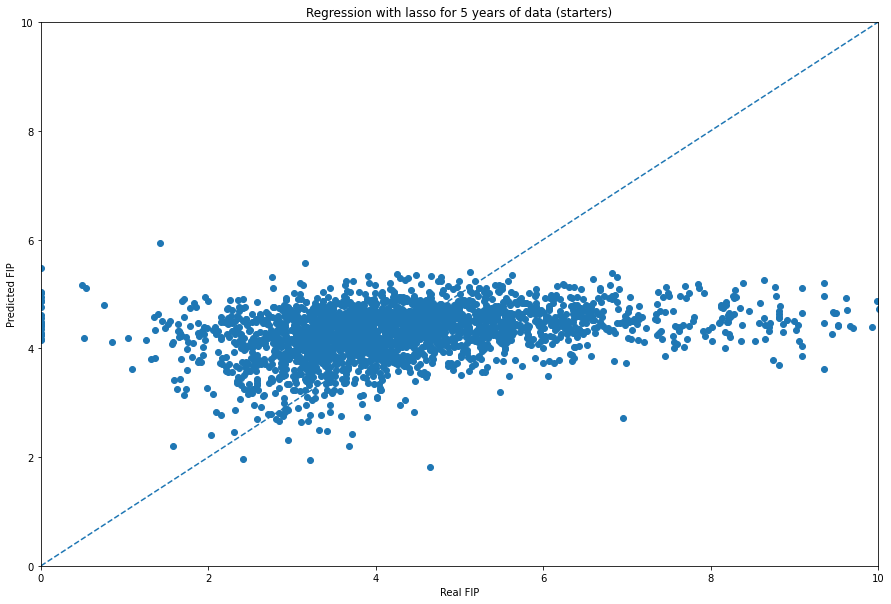

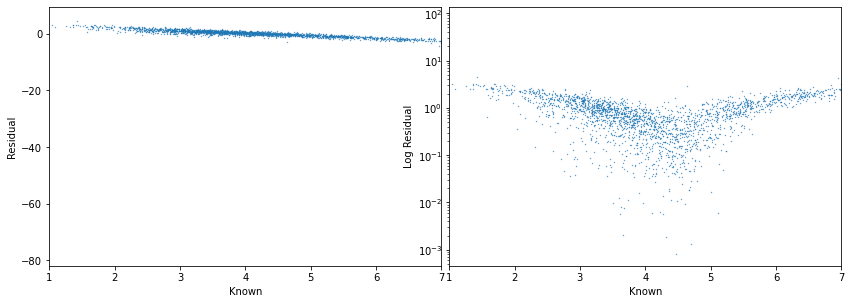

Percent of error less than one run: 0.574390243902439
Mean Absolute Error: 1.4362748932956473
Standard Deviation: 3.2458550044763292


<ipython-input-79-c861ea33c27c>:66: RuntimeWarning: invalid value encountered in double_scalars
  stat_in_year[k] = (stat_in_year[k] - mean)/std


The optimal regularization strength is:
[3.11871654]


<ipython-input-79-c861ea33c27c>:134: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


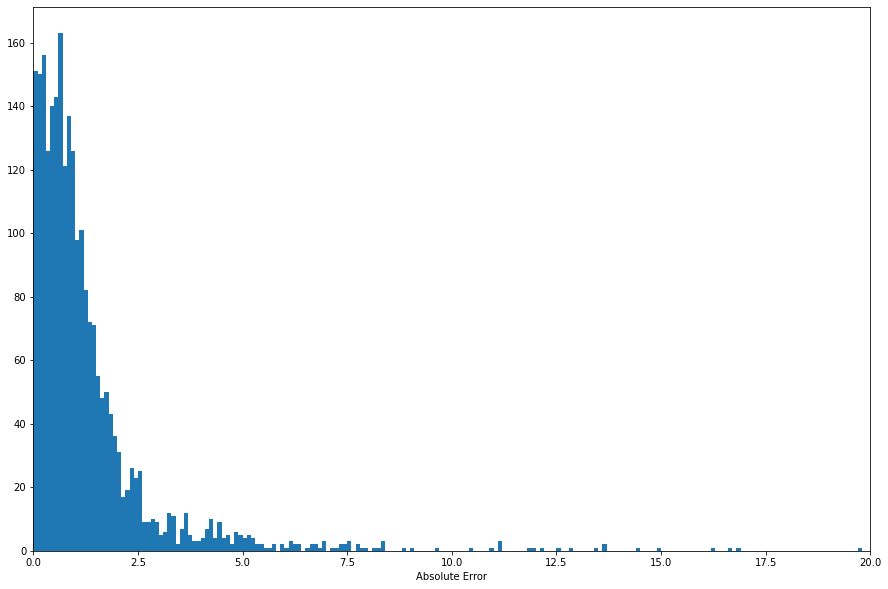

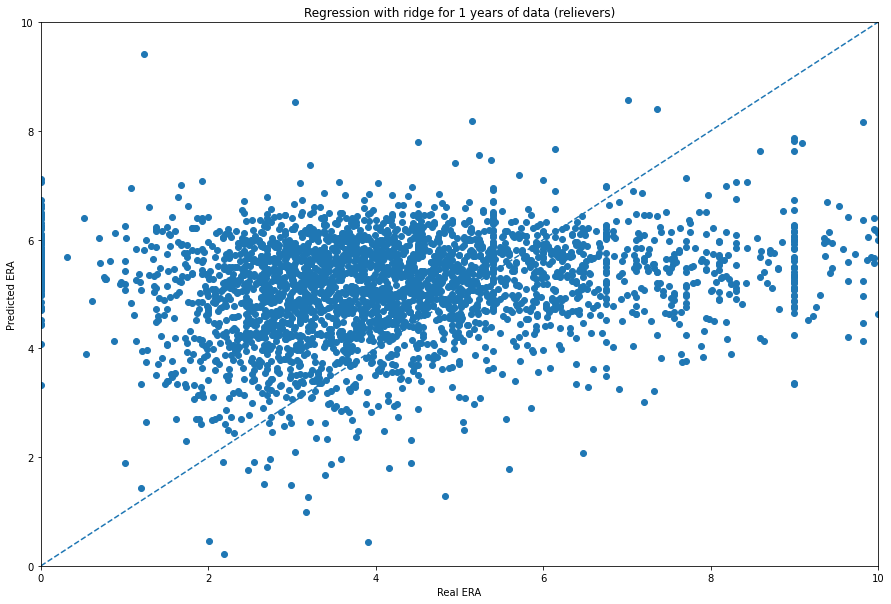

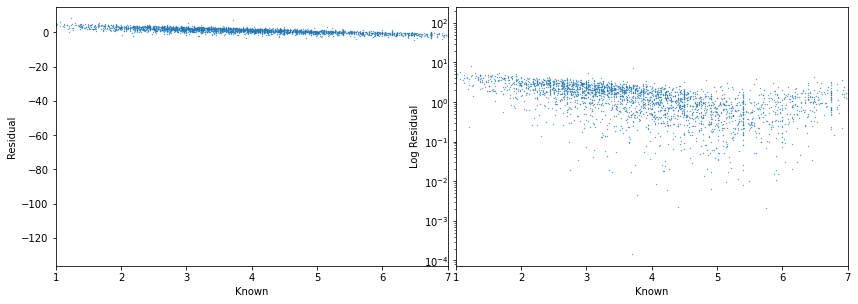

Percent of error less than one run: 0.3195558297347316
Mean Absolute Error: 2.601102638996605
Standard Deviation: 6.238732620191193


<ipython-input-79-c861ea33c27c>:66: RuntimeWarning: invalid value encountered in double_scalars
  stat_in_year[k] = (stat_in_year[k] - mean)/std


The optimal regularization strength is:
[9726.39285994]


<ipython-input-79-c861ea33c27c>:134: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


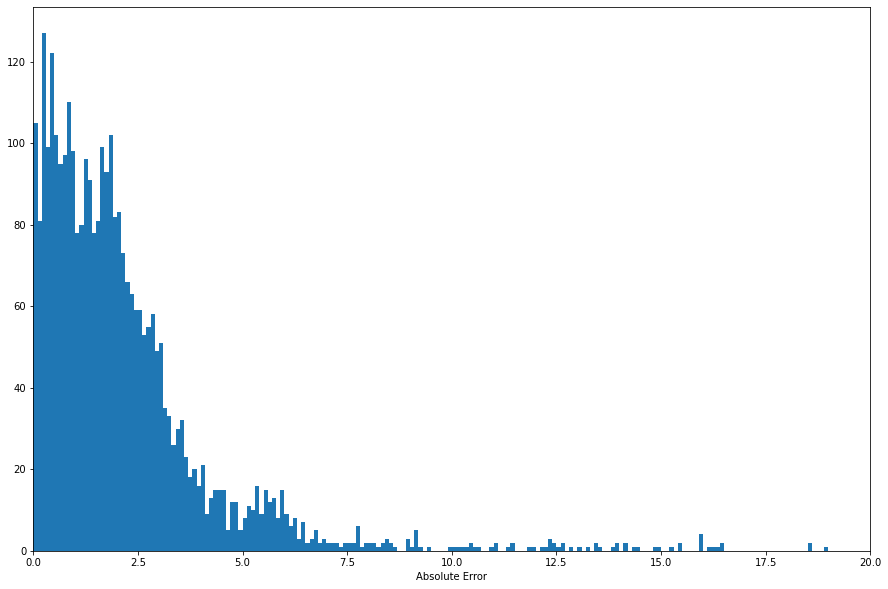

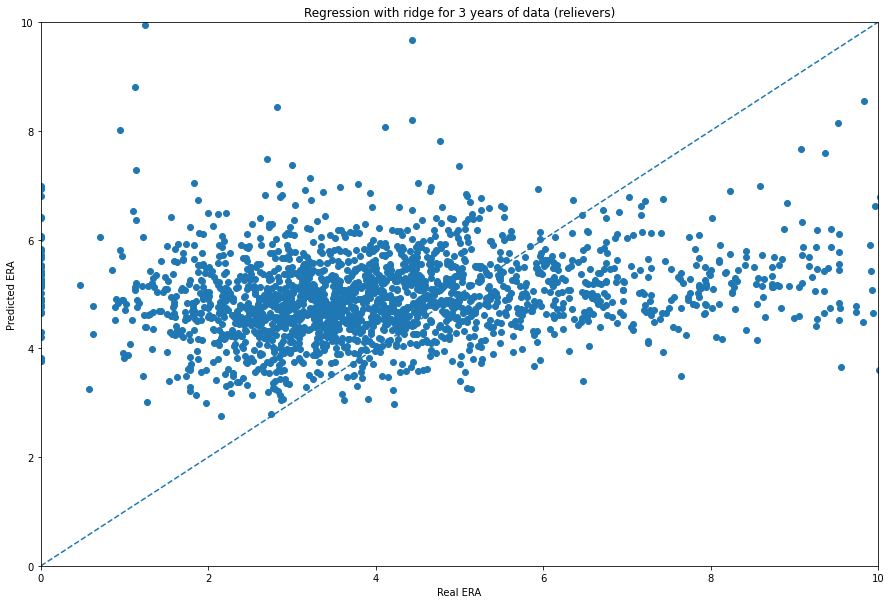

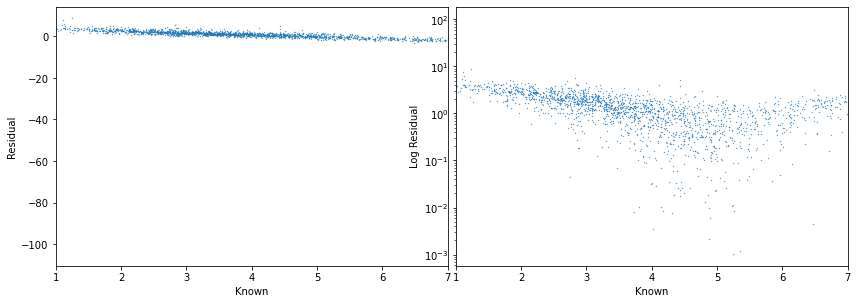

Percent of error less than one run: 0.3160112359550562
Mean Absolute Error: 2.3347642845795216
Standard Deviation: 5.628955186790285


<ipython-input-79-c861ea33c27c>:66: RuntimeWarning: invalid value encountered in double_scalars
  stat_in_year[k] = (stat_in_year[k] - mean)/std


The optimal regularization strength is:
[15443.83027225]


<ipython-input-79-c861ea33c27c>:134: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


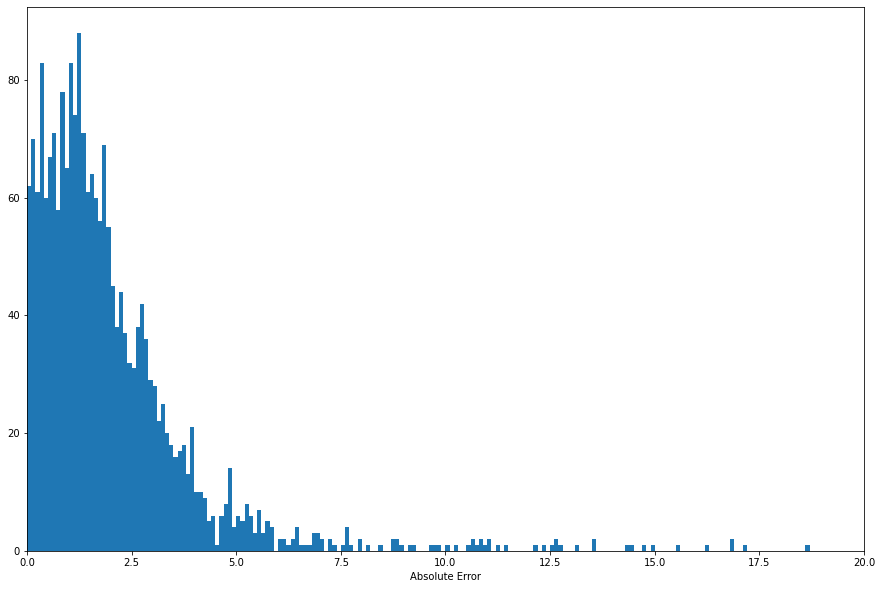

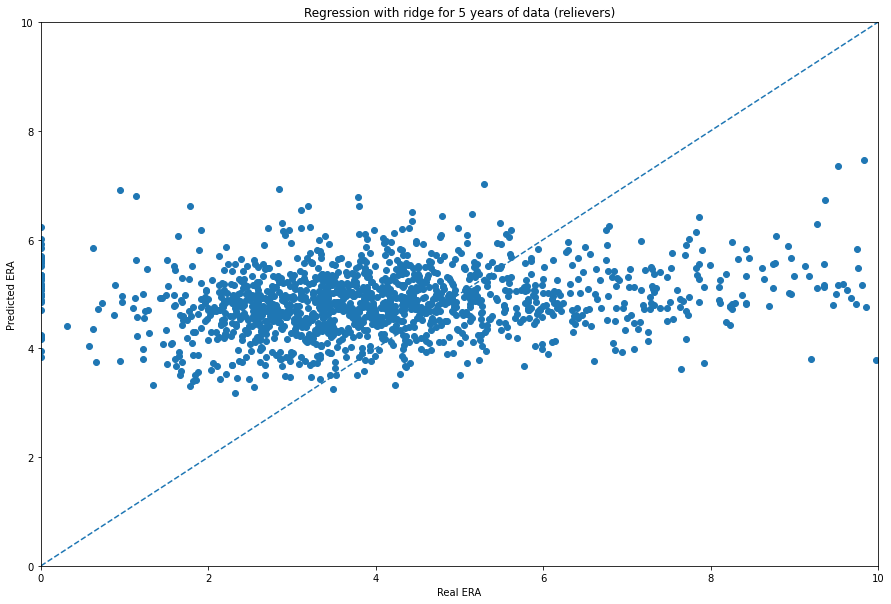

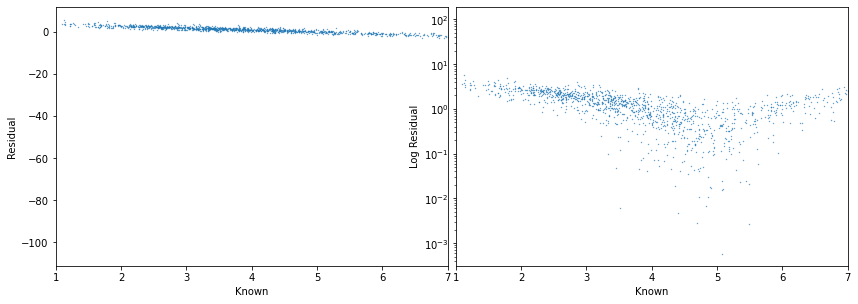

Percent of error less than one run: 0.3376010781671159
Mean Absolute Error: 2.169032416859035
Standard Deviation: 4.943872660511613


<ipython-input-79-c861ea33c27c>:66: RuntimeWarning: invalid value encountered in double_scalars
  stat_in_year[k] = (stat_in_year[k] - mean)/std


The optimal regularization strength is:
[2.15443469]


<ipython-input-79-c861ea33c27c>:134: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


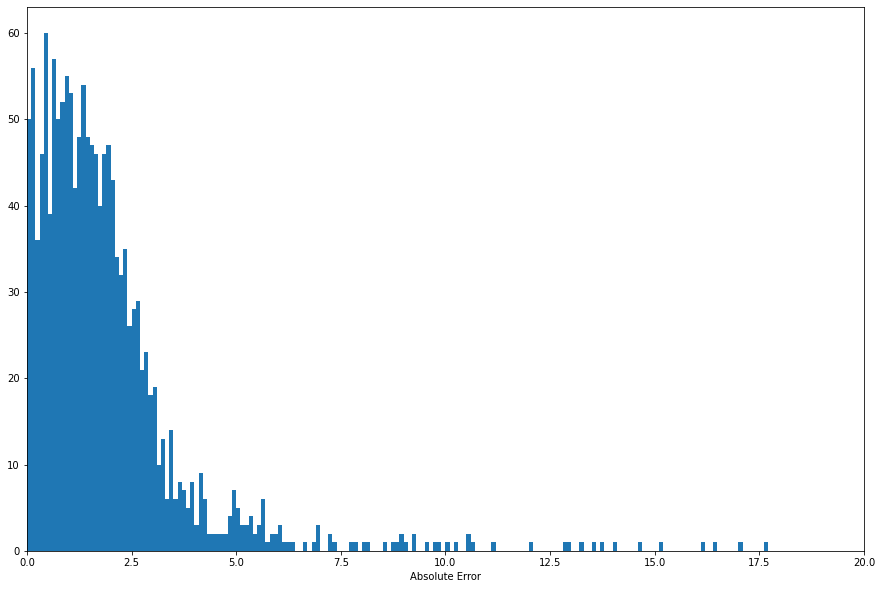

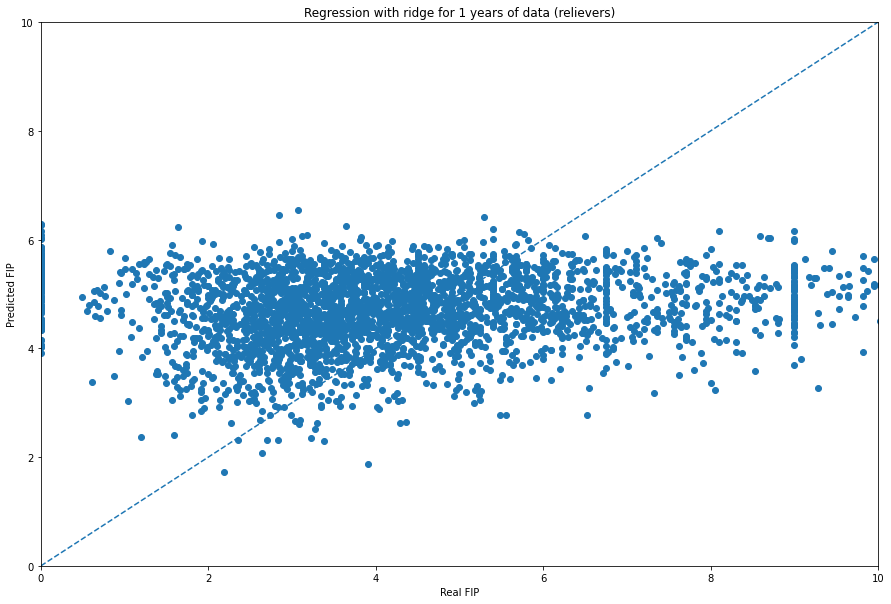

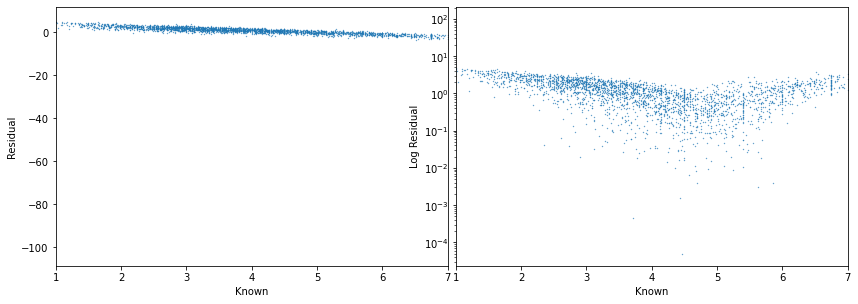

Percent of error less than one run: 0.3701418877236274
Mean Absolute Error: 2.367570263413024
Standard Deviation: 5.123718984284426


<ipython-input-79-c861ea33c27c>:66: RuntimeWarning: invalid value encountered in double_scalars
  stat_in_year[k] = (stat_in_year[k] - mean)/std


The optimal regularization strength is:
[87.04804787]


<ipython-input-79-c861ea33c27c>:134: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


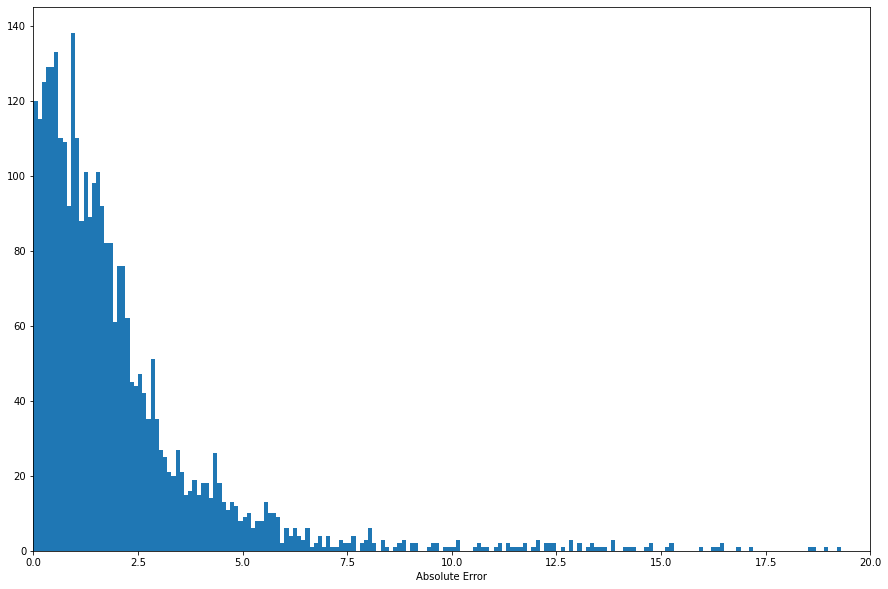

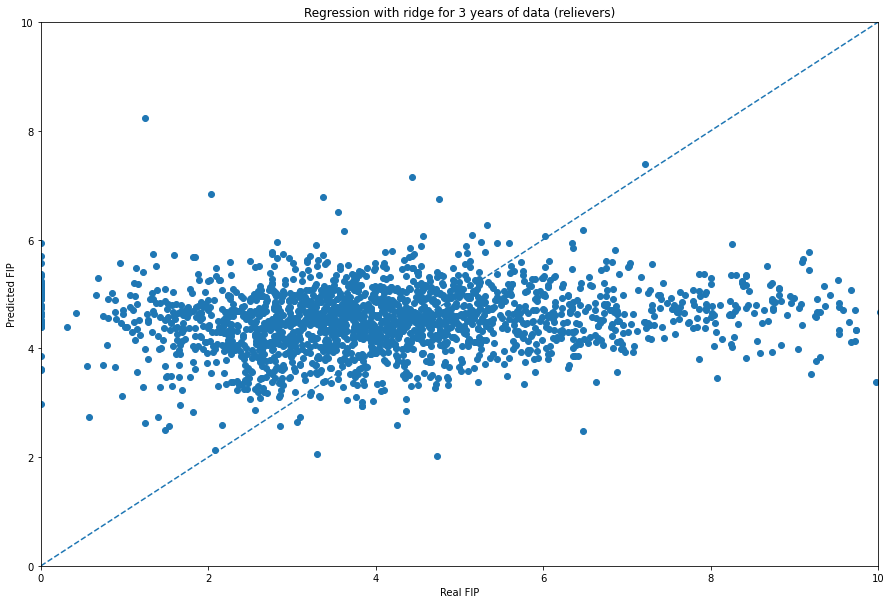

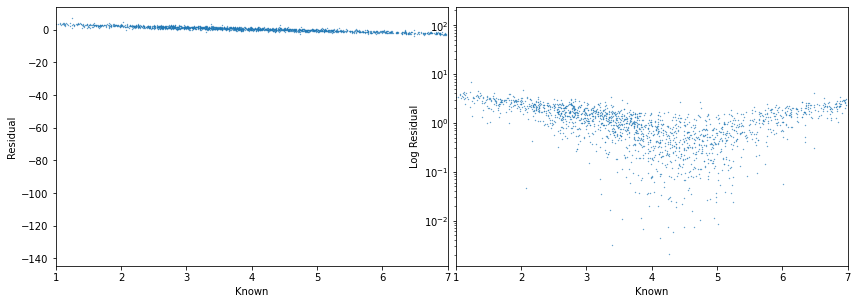

Percent of error less than one run: 0.38764044943820225
Mean Absolute Error: 2.415923384858694
Standard Deviation: 6.2519170593804745


<ipython-input-79-c861ea33c27c>:66: RuntimeWarning: invalid value encountered in double_scalars
  stat_in_year[k] = (stat_in_year[k] - mean)/std


The optimal regularization strength is:
[382.23400177]


<ipython-input-79-c861ea33c27c>:134: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


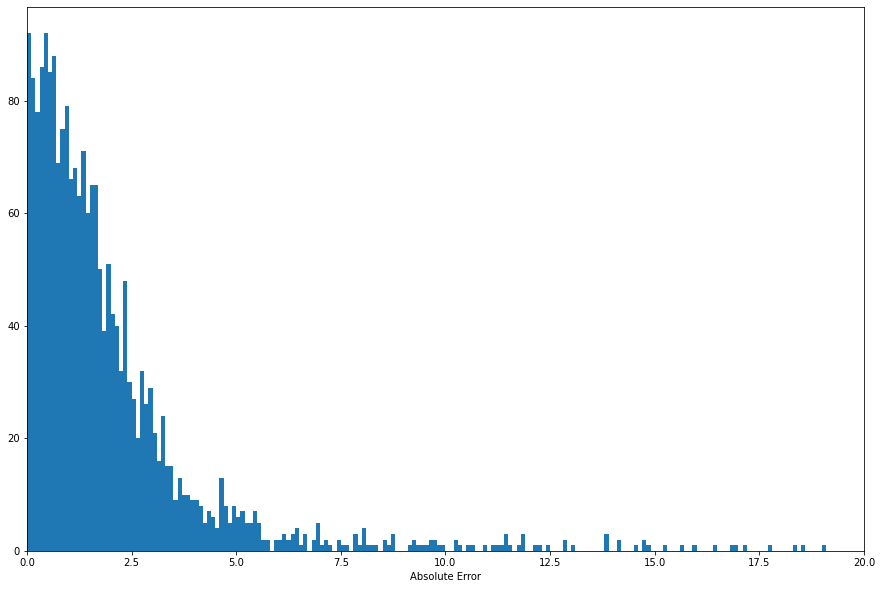

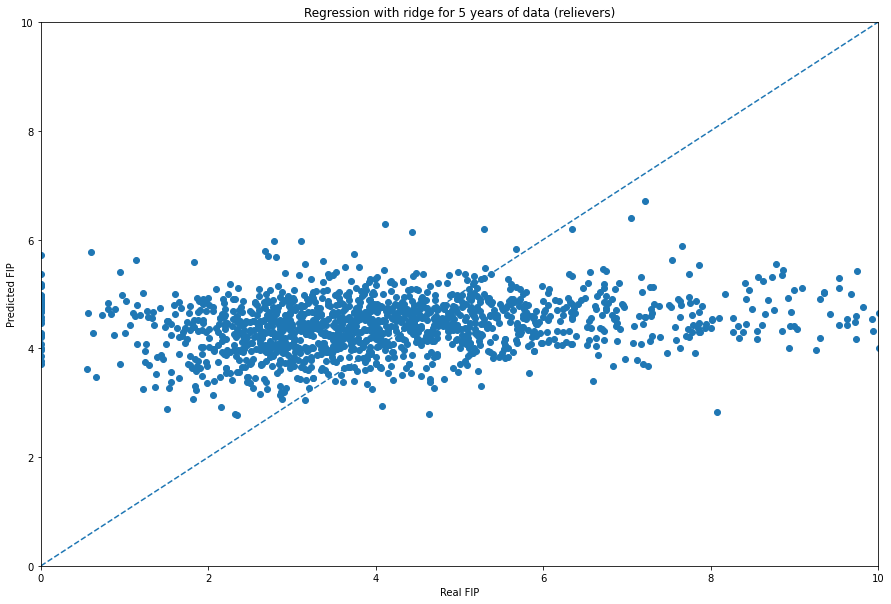

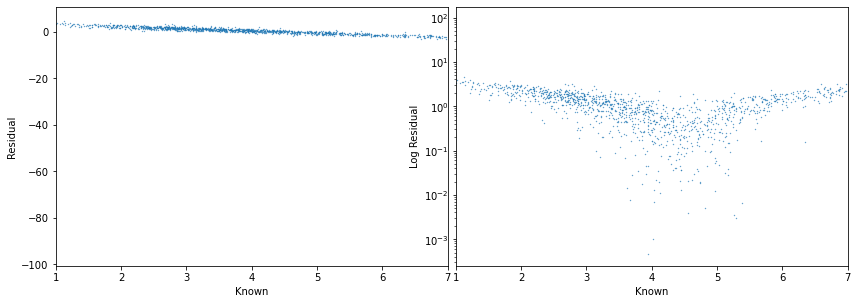

Percent of error less than one run: 0.396900269541779
Mean Absolute Error: 2.0492444438143433
Standard Deviation: 5.164411326106244


<ipython-input-79-c861ea33c27c>:66: RuntimeWarning: invalid value encountered in double_scalars
  stat_in_year[k] = (stat_in_year[k] - mean)/std


The optimal regularization strength is:
[0.001]


<ipython-input-79-c861ea33c27c>:134: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


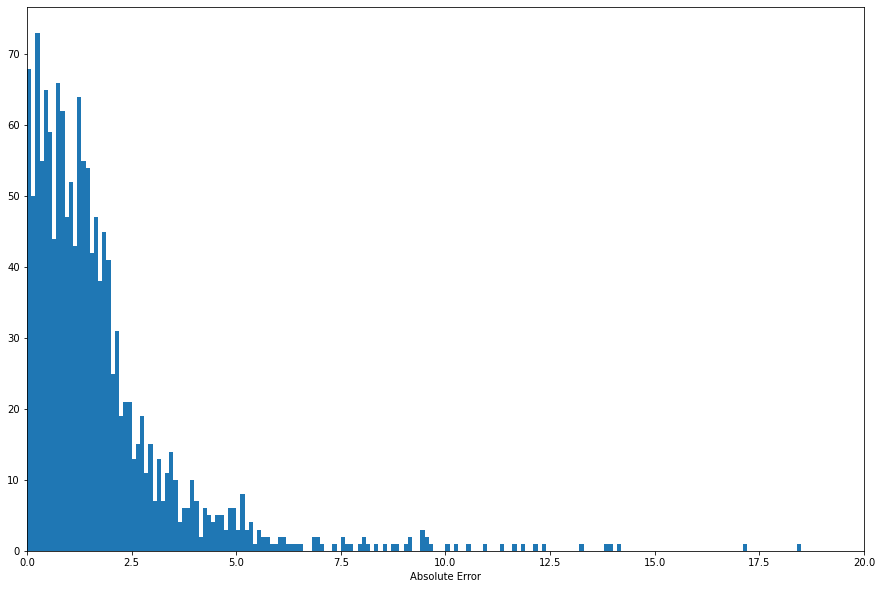

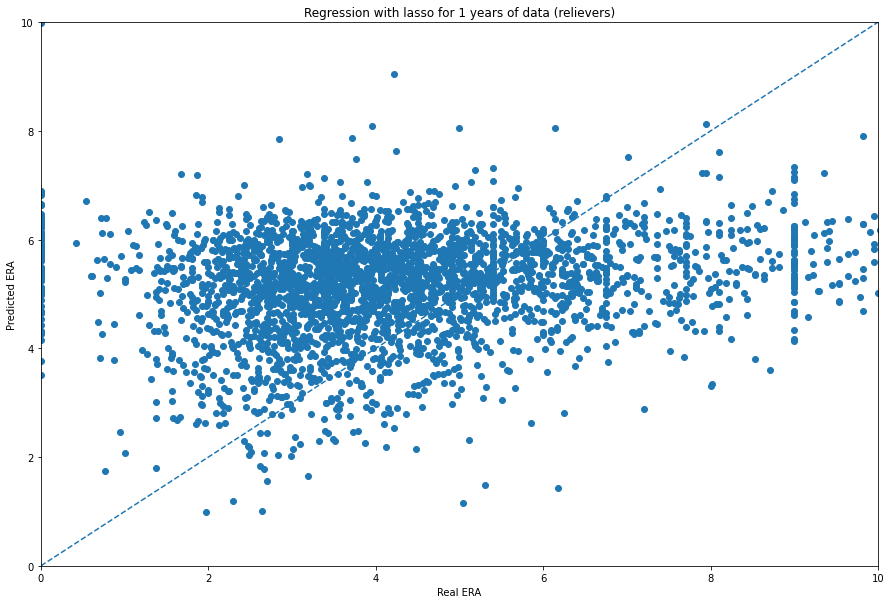

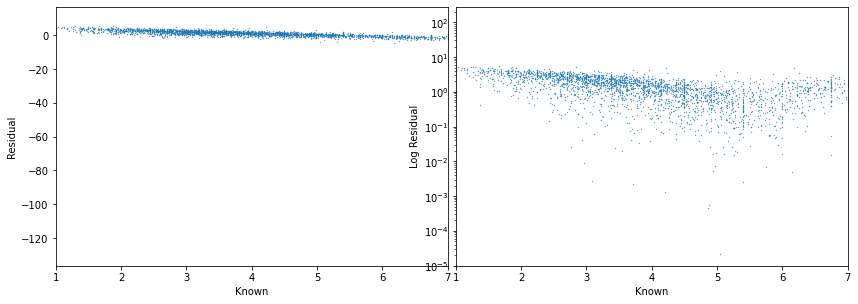

Percent of error less than one run: 0.3001233806292412
Mean Absolute Error: 2.6895059765754654
Standard Deviation: 6.602570395109132


<ipython-input-79-c861ea33c27c>:66: RuntimeWarning: invalid value encountered in double_scalars
  stat_in_year[k] = (stat_in_year[k] - mean)/std


The optimal regularization strength is:
[0.03061567]


<ipython-input-79-c861ea33c27c>:134: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


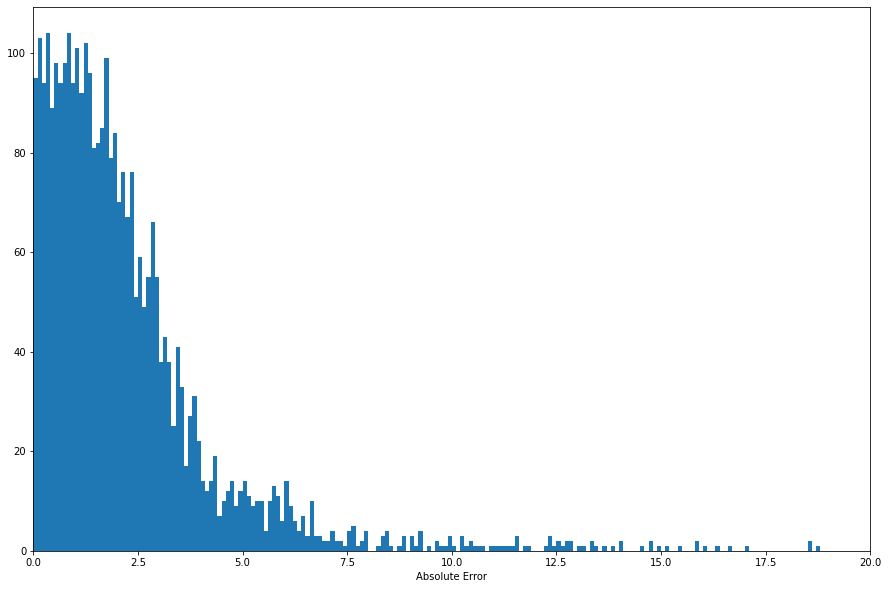

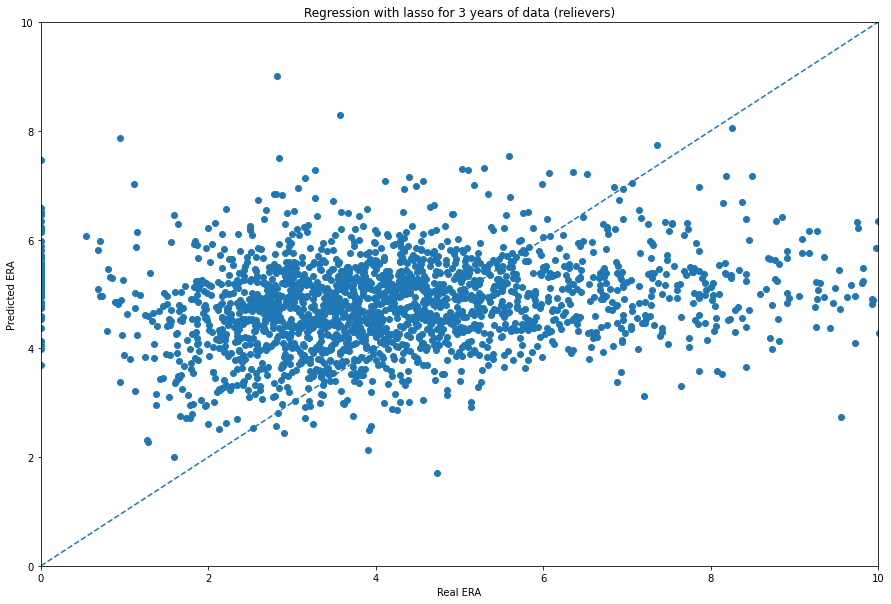

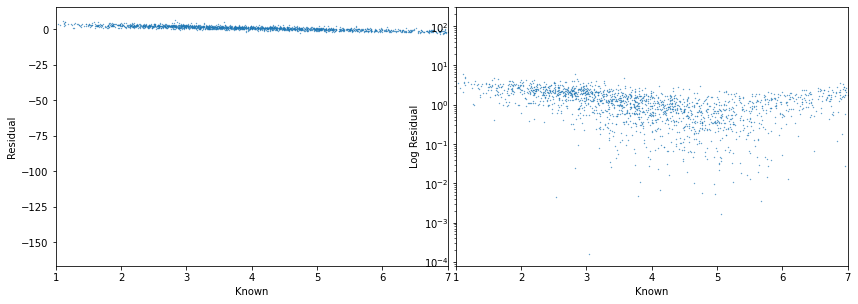

Percent of error less than one run: 0.3684456928838951
Mean Absolute Error: 2.2464789850108695
Standard Deviation: 6.015865215377359


<ipython-input-79-c861ea33c27c>:66: RuntimeWarning: invalid value encountered in double_scalars
  stat_in_year[k] = (stat_in_year[k] - mean)/std
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3577.722401171457, tolerance: 11.55091701783526
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 797.9641705848626, tolerance: 11.55091701783526
  model = cd_fast.enet_coordinate_descent(
C:\Users\natha\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 954.2261067565996, tolerance: 11.55091701783526
  model

The optimal regularization strength is:
[0.23414124]


<ipython-input-79-c861ea33c27c>:134: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


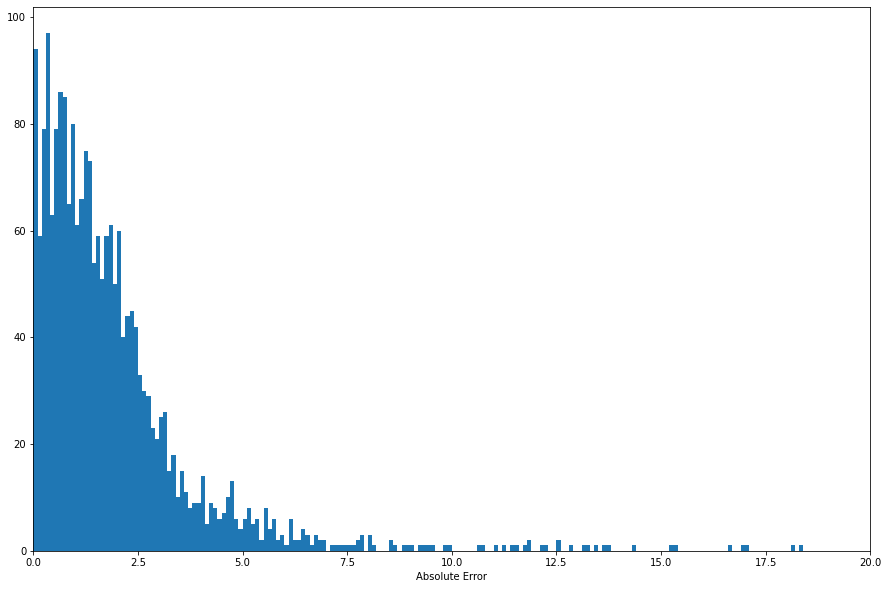

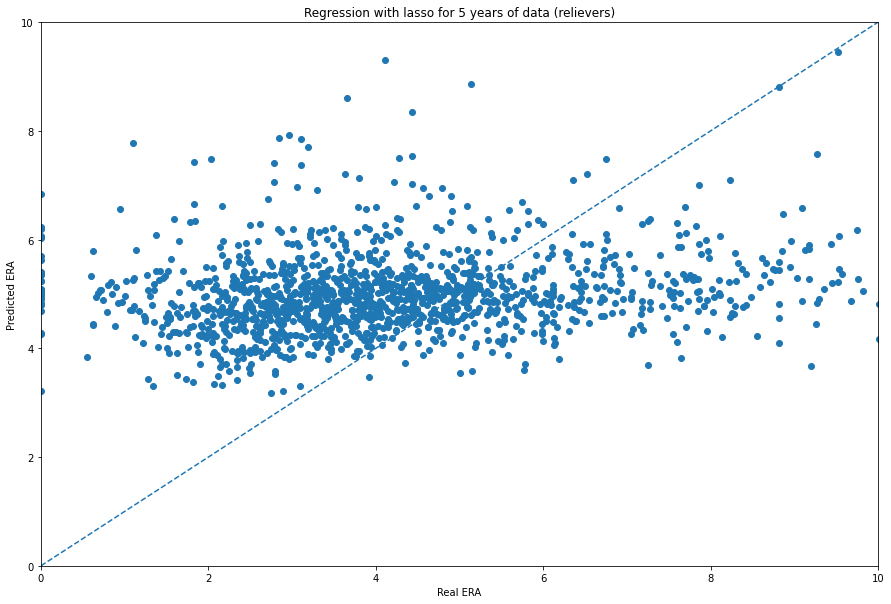

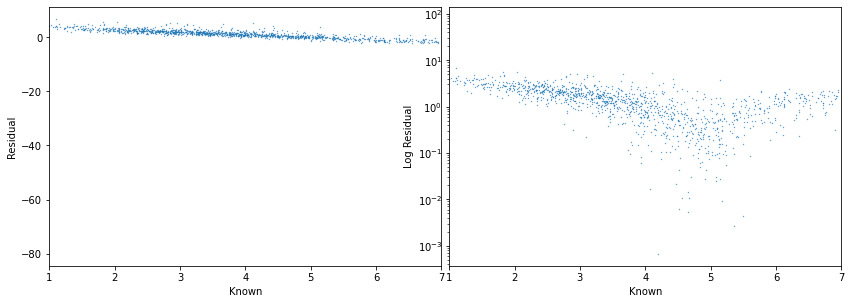

Percent of error less than one run: 0.3045822102425876
Mean Absolute Error: 2.2531623192033057
Standard Deviation: 4.200989682049126


<ipython-input-79-c861ea33c27c>:66: RuntimeWarning: invalid value encountered in double_scalars
  stat_in_year[k] = (stat_in_year[k] - mean)/std


The optimal regularization strength is:
[0.0083887]


<ipython-input-79-c861ea33c27c>:134: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


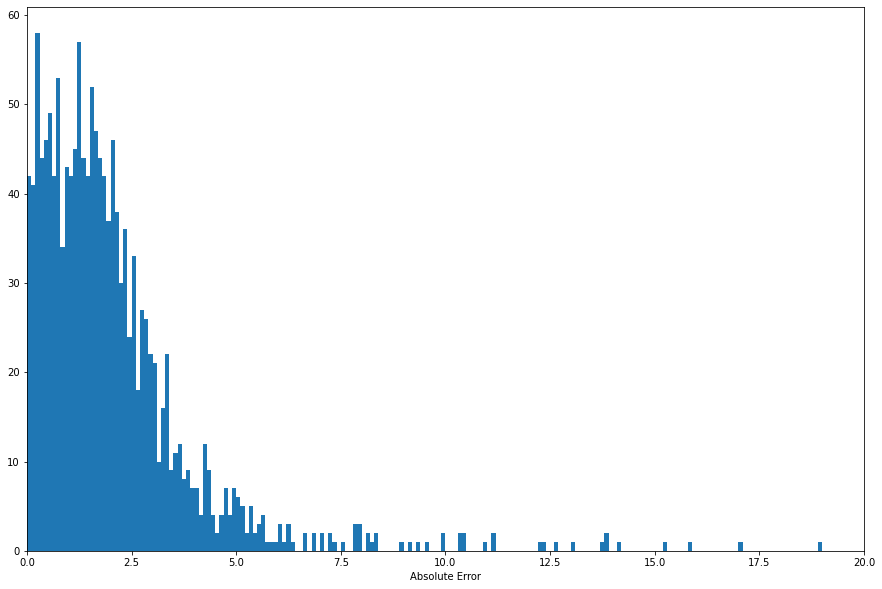

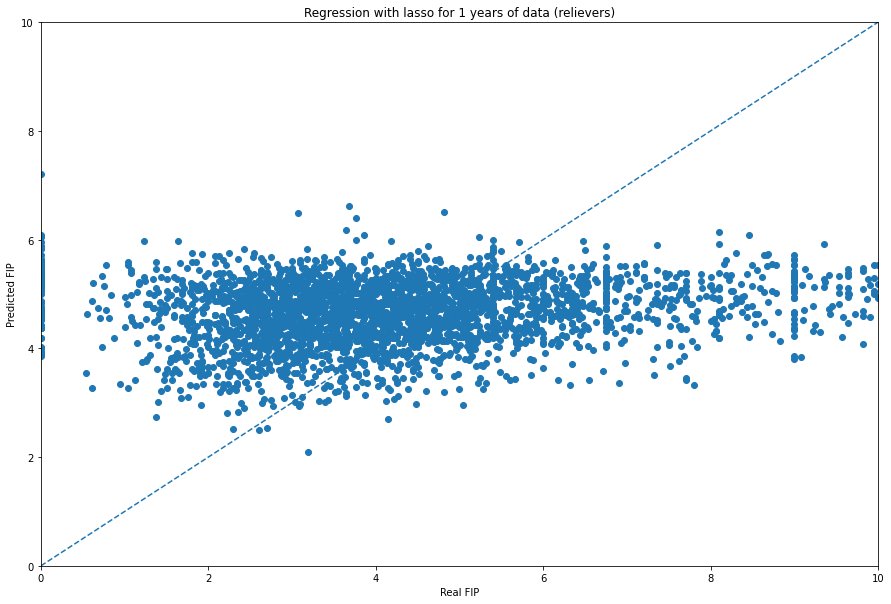

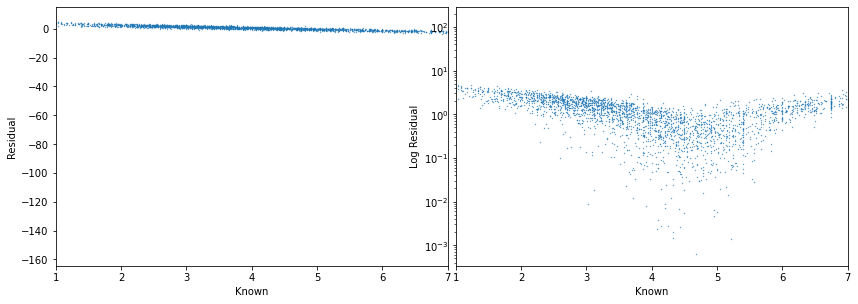

Percent of error less than one run: 0.36428130783466994
Mean Absolute Error: 2.4180774952149644
Standard Deviation: 6.138662046224555


<ipython-input-79-c861ea33c27c>:66: RuntimeWarning: invalid value encountered in double_scalars
  stat_in_year[k] = (stat_in_year[k] - mean)/std


The optimal regularization strength is:
[0.01107074]


<ipython-input-79-c861ea33c27c>:134: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


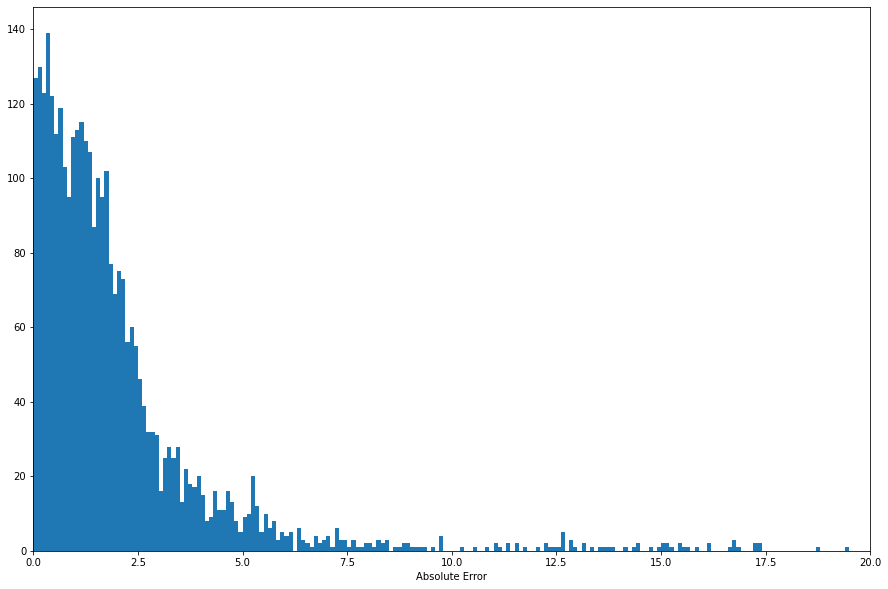

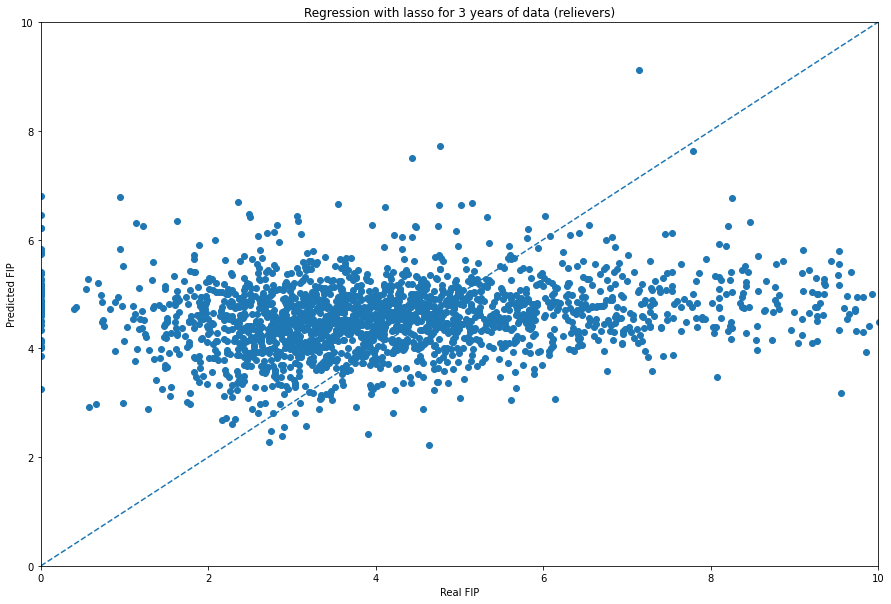

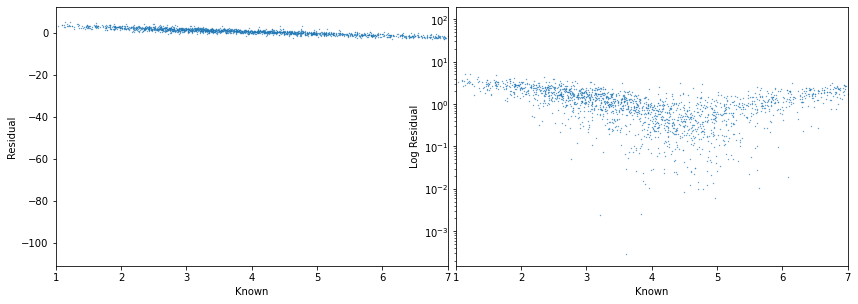

Percent of error less than one run: 0.39091760299625467
Mean Absolute Error: 2.1638306333853823
Standard Deviation: 5.08286839364276


<ipython-input-79-c861ea33c27c>:66: RuntimeWarning: invalid value encountered in double_scalars
  stat_in_year[k] = (stat_in_year[k] - mean)/std


The optimal regularization strength is:
[0.00920143]


<ipython-input-79-c861ea33c27c>:134: RuntimeWarning: divide by zero encountered in true_divide
  per_error = np.divide((y_pred - y_test),y_test)


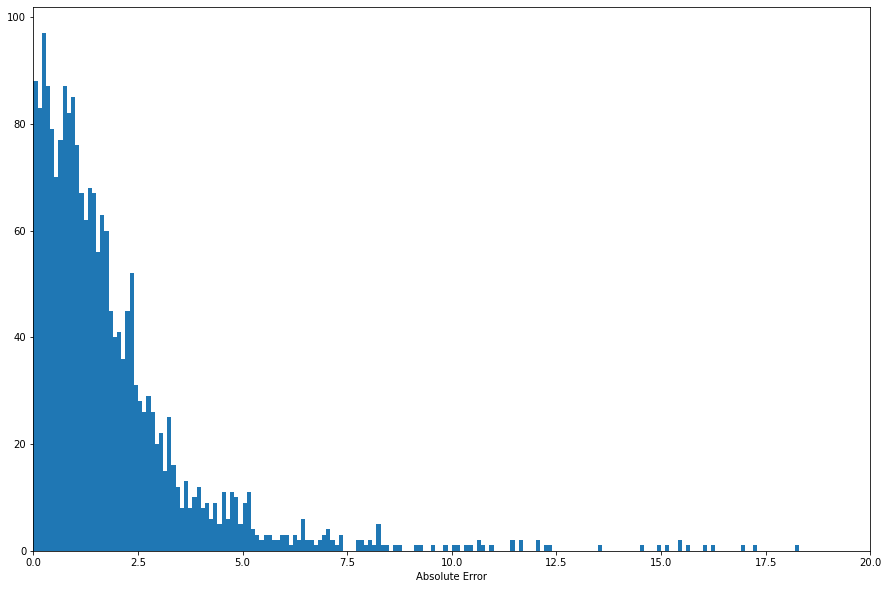

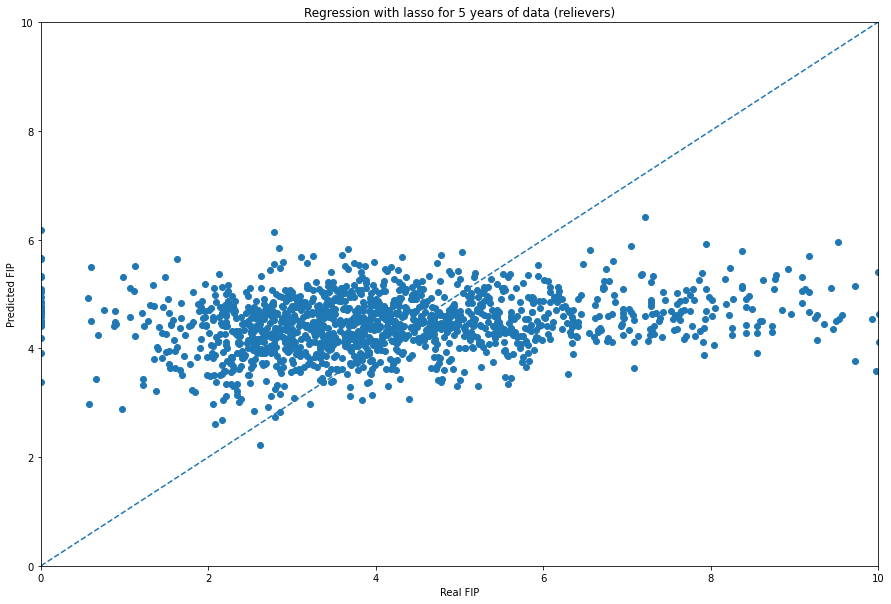

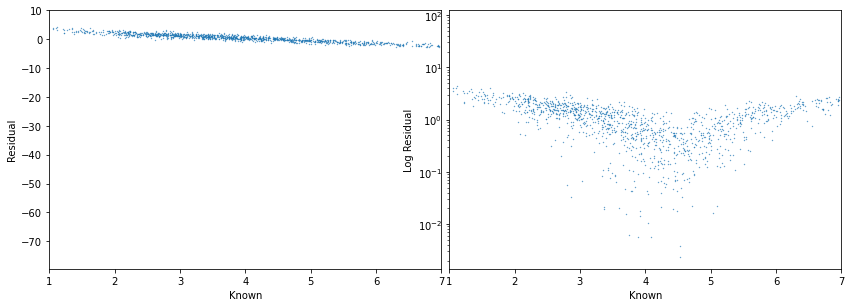

Percent of error less than one run: 0.38746630727762804
Mean Absolute Error: 2.0713271051898916
Standard Deviation: 4.324365828096993


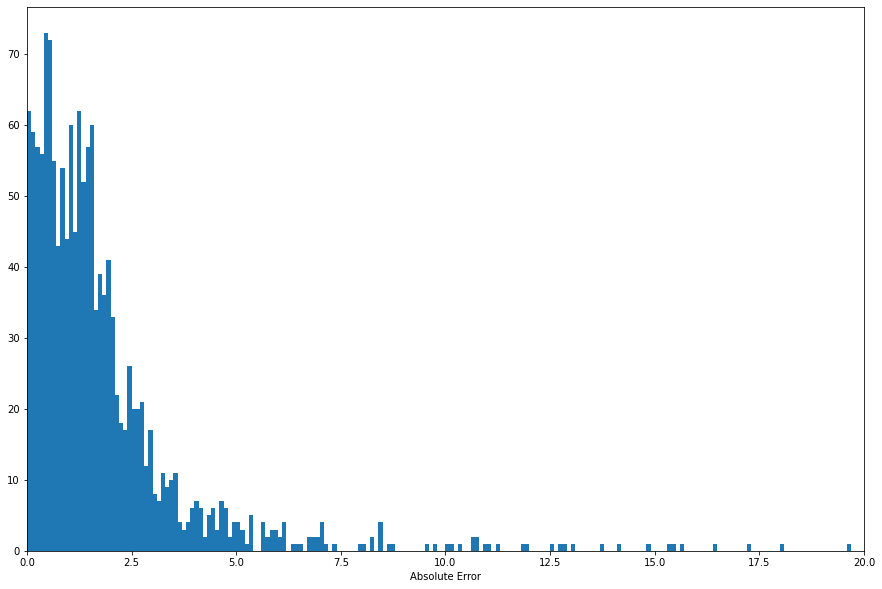

In [80]:
df_results_norm = regression_iterator2(df_one_yr,df_three_yr,df_five_yr)

In [81]:
display(df_results_norm)

,Method,Output,PitcherType,Years,LT1,MAE,STD
0,ridge,ERA,starters,1,0.472640,1.661033,3.488393
1,ridge,ERA,starters,3,0.523081,1.525458,3.141559
2,ridge,ERA,starters,5,0.522764,1.469974,3.250859
3,ridge,FIP,starters,1,0.542004,1.519658,3.295870
4,ridge,FIP,starters,3,0.558676,1.464348,3.576809
5,ridge,FIP,starters,5,0.565447,1.398307,2.889449
6,lasso,ERA,starters,1,0.470906,1.624843,3.210001
7,lasso,ERA,starters,3,0.500000,1.475073,2.826132
8,lasso,ERA,starters,5,0.541057,1.421669,3.789669
9,lasso,FIP,starters,1,0.542004,1.607729,4.026687


The yearly normaization has not significantly helped our models. In fact, for most models, the MAE has increased by at least 0.1 runs. This was unexpected, and I'm not sure why this did not improve the modelling.

## Neural Network

In [94]:
def train_test_nn(df,n_years,pitcherType):
    
    stats,outputs = input_output(df,n_years,pitcherType)
    
    num_data = stats.shape[0]
    n_samples_train = round(0.8*num_data)
    X_train,X_test = stats[:n_samples_train],stats[n_samples_train:]
    y_train,y_test = outputs[:n_samples_train],outputs[n_samples_train:]
    
    if len(X_val) != len(X_test):
        X_test = X_test[0:len(X_test)-1]
        y_test = y_test[0:len(y_test)-1]
    
    return X_train,y_train,X_test,y_test   

In [95]:
## Building a Dataset

class StatsDataset(Dataset):
    def __init__(self, stats, labels):
        stats_dtype = torch.FloatTensor
        labels_dtype = torch.FloatTensor     # Use float for continuous data

        self.length = stats.shape[0]

        # 1) Extract data from numpy, 2) put it in a tensor, 3) properly data type it.
        self.stats_data = torch.from_numpy(stats).type(stats_dtype)
        self.labels_data = torch.from_numpy(labels).type(labels_dtype)

    # Method for getting an element.
    def __getitem__(self, index):
        return self.stats_data[index], self.labels_data[index]

    # Method for getting the length of the dataset
    def __len__(self):
        return self.length

In [97]:
X_train,y_train,X_test,y_test = train_test_nn(df_five_yr,5,'starters')

In [106]:
width = len(X_train[0])
print(width)

110


## ERA Network

Finally, I try making a simple network to predict ERA. First, I cast the data into a dataloader format with training batch sizes of 25. Then, I define a class of model with three layers of 10 neuron width and sigmoidal activation functions. Finally, I run the data through the network in five epochs and print the loss at specific intervals.

In [134]:
dataset_train = StatsDataset(stats=X_train, labels=y_train[:,0])
dataset_test = StatsDataset(stats=X_test, labels=y_test[:,0])
print("Train set size: ", dataset_train.length)
print("Test set size: ", dataset_test.length)

batch_size_train = 25
dataloader_train = DataLoader(dataset=dataset_train, batch_size=batch_size_train, shuffle=True)
dataloader_test = DataLoader(dataset=dataset_test, batch_size=len(dataset_test), shuffle=False)

Train set size:  7874
Test set size:  1967


In [150]:
class Linear_3Hidden(nn.Module):
    '''
    A simple, general purpose, fully connected network
    '''
    def __init__(self,width):
        # Perform initialization of the pytorch superclass
        super(Linear_3Hidden, self).__init__()
        
        # Define network layer dimensions
        D_in, H1, H2, H3, D_out = [110, width, width, width, 1]    # These numbers correspond to each layer: [input, hidden_1, output]
        
        # Define layer types
        self.linear1 = nn.Linear(D_in, H1)
        self.linear2 = nn.Linear(H1, H2)
        self.linear3 = nn.Linear(H2, H3)
        self.linear4 = nn.Linear(H3, D_out)

    def forward(self, x):
        '''
        This method defines the network layering and activation functions
        '''
        x = self.linear1(x) # hidden layer
        x = torch.tanh(x)       # activation function
        
        x = self.linear2(x) # hidden layer
        x = torch.tanh(x)       # activation function
        
        x = self.linear3(x) # hidden layer
        x = torch.tanh(x)       # activation function

        x = self.linear4(x) # output layer
        
        return x

In [151]:
def test_batch(model, x, y):
    # run forward calculation
    y_predict = model.forward(x)

    return y, y_predict

#####
def test(model, test_loader):
    y_vectors = list()
    y_predict_vectors = list()

    batch_index = 0
    for x, y in test_loader:
        y, y_predict = test_batch(model=model, x=x, y=y)

        y_vectors.append(y.data.numpy())
        y_predict_vectors.append(y_predict.data.numpy())

        batch_index += 1

    y_predict_vector = np.concatenate(y_predict_vectors)

    return y_predict_vector 

##### Train on a specific batch of data.
def train_batch(model, x, y, optimizer, loss_fn):
    # Run forward calculation
    y_predict = model.forward(x)

    # Compute loss.
    loss = loss_fn(y_predict, y)

    # Before the backward pass, use the optimizer object to zero all of the
    # gradients for the variables it will update (which are the learnable weights
    # of the model)
    optimizer.zero_grad()

    # Backward pass: compute gradient of the loss with respect to model
    # parameters
    loss.backward()

    # Calling the step function on an Optimizer makes an update to its
    # parameters
    optimizer.step()

    return loss.data.item()

##### Iterate over epochs and all batches of data
def train(model, train_loader , test_loader , optimizer, loss_fn, epochs=5):
    losses = list()
    losses_test = list()

    batch_index = 0
    for e in range(epochs):
        for x, y in train_loader:
            loss = train_batch(model=model, x=x, y=y, optimizer=optimizer, loss_fn=loss_fn)
            losses.append(loss)

            batch_index += 1
            
        for x , y in test_loader:
            y_predict = model.forward(x)
            losst = loss_fn(y_predict, y)
            
            losses_test.append(losst.data.item())

        print("Epoch: ", e+1)
        print("Batches: ", batch_index)

    return losses , losses_test

def plot_loss(losses_train,loss_test, show=True):
    fig = plt.gcf()
    fig.set_size_inches(8,6)
    ax = plt.axes()
    ax.set_xlabel("Iteration")
    ax.set_ylabel("Loss")
    x_loss = list(range(len(losses)))
    plt.plot(x_loss, losses_train)
    

    a = list(range(len(loss_test)))
    const = round(len(losses) / len(loss_test))
    b = [(i+1)*const for i in a]
    
    plt.plot(b,loss_test)

    if show:
        plt.show()

    plt.close()
    
def run(data_loader_train, data_loader_test , model_to_test , width , weight_decay):
    
    
    # Define the hyperparameters
    learning_rate = 1e-3
    model = model_to_test(width=width)
    
    # Initialize the optimizer with above parameters
    optimizer = optim.Adam(model.parameters(), lr=learning_rate , weight_decay = weight_decay)

    # Define the loss function
    loss_fn = nn.L1Loss()  # mean squared error

    # Train and get the resulting loss per iteration
    loss , loss_test = train(model=model, train_loader=data_loader_train , test_loader = data_loader_test, 
                 optimizer=optimizer, loss_fn=loss_fn)
    
    # Test and get the resulting predicted y values
    y_predict = test(model=model, test_loader=data_loader_test)

    return loss , loss_test , y_predict

Epoch:  1
Batches:  315
Epoch:  2
Batches:  630
Epoch:  3
Batches:  945
Epoch:  4
Batches:  1260
Epoch:  5
Batches:  1575
Final loss: [1.1326968669891357]


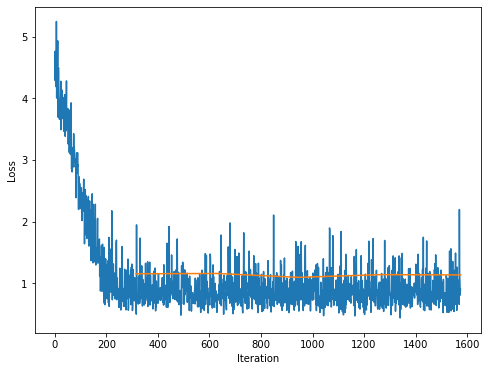

In [152]:
losses, loss_test, y_predict = run(data_loader_train = dataloader_train, data_loader_test=dataloader_test,
                              model_to_test = Linear_3Hidden, width = 10, weight_decay = 1e-1)

print("Final loss:", loss_test[-1:])
plot_loss(losses,loss_test)

## FIP Network

I follow the same procedure as above, only fitting FIP instead of ERA.

In [153]:
dataset_train = StatsDataset(stats=X_train, labels=y_train[:,1])
dataset_test = StatsDataset(stats=X_test, labels=y_test[:,1])
print("Train set size: ", dataset_train.length)
print("Test set size: ", dataset_test.length)

batch_size_train = 25
dataloader_train = DataLoader(dataset=dataset_train, batch_size=batch_size_train, shuffle=True)
dataloader_test = DataLoader(dataset=dataset_test, batch_size=len(dataset_test), shuffle=False)

Train set size:  7874
Test set size:  1967


In [154]:
class Linear_3Hidden(nn.Module):
    '''
    A simple, general purpose, fully connected network
    '''
    def __init__(self,width):
        # Perform initialization of the pytorch superclass
        super(Linear_3Hidden, self).__init__()
        
        # Define network layer dimensions
        D_in, H1, H2, H3, D_out = [110, width, width, width, 1]    # These numbers correspond to each layer: [input, hidden_1, output]
        
        # Define layer types
        self.linear1 = nn.Linear(D_in, H1)
        self.linear2 = nn.Linear(H1, H2)
        self.linear3 = nn.Linear(H2, H3)
        self.linear4 = nn.Linear(H3, D_out)

    def forward(self, x):
        '''
        This method defines the network layering and activation functions
        '''
        x = self.linear1(x) # hidden layer
        x = torch.tanh(x)       # activation function
        
        x = self.linear2(x) # hidden layer
        x = torch.tanh(x)       # activation function
        
        x = self.linear3(x) # hidden layer
        x = torch.tanh(x)       # activation function

        x = self.linear4(x) # output layer
        
        return x

Epoch:  1
Batches:  315
Epoch:  2
Batches:  630
Epoch:  3
Batches:  945
Epoch:  4
Batches:  1260
Epoch:  5
Batches:  1575
Final loss: [1.1152238845825195]


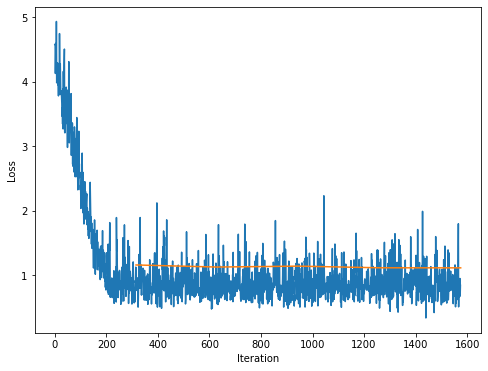

In [155]:
losses, loss_test, y_predict = run(data_loader_train = dataloader_train, data_loader_test=dataloader_test,
                              model_to_test = Linear_3Hidden, width = 10, weight_decay = 1e-1)

print("Final loss:", loss_test[-1:])
plot_loss(losses,loss_test)

For both the FIP and ERA networks, after a short number of interations (~200), the model comes down to its average loss value oscillating aroun either 1.2 or 1.1 runs. This is a slightly superior performance to our best regression models, but at the cost of being more time consuming.